In [1]:
import itertools
import plotly.express as px
import plotly.graph_objs as go
import plotly

import numpy as np
import seaborn as sns

import pingouin
import statsmodels.api as sm
import statsmodels.formula.api as smf

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib import colors
import json
import time
import pandas as pd
import glob
from copy import deepcopy
import os
import sys
from joblib import Parallel, delayed, cpu_count, dump,load
import plotly.express as px

from zpyhelper.filesys import checkdir
from zpyhelper.MVPA.rdm import compute_rdm,lower_tri,upper_tri, compute_rdm_nomial, compute_rdm_identity
from zpyhelper.MVPA.preprocessors import scale_feature, split_data, concat_data
from zpyhelper.MVPA.estimators import PatternCorrelation, MultipleRDMRegression

project_path = r'D:\OneDrive - Nexus365\pirate_ongoing'
sys.path.append(project_path)
from scripts.Exp1_fmri.multivariate.modelrdms import ModelRDM
from scripts.Exp1_fmri.multivariate.pirateOMutils import parallel_axes_cosine_sim, minmax_scale, generate_filters

import scipy

import warnings

warnings.simplefilter('ignore', category=FutureWarning)

In [2]:
from plotting_utils import plot_rdm_withlabel, grouped_barscatter_withstats,gen_pval_annot

In [3]:
sns.color_palette("colorblind",10)
sns.color_palette("colorblind6",6)

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

In [4]:
choose_color_from = sns.color_palette("colorblind",10).as_hex()

print(choose_color_from)
choose_color_from

['#0173b2', '#de8f05', '#029e73', '#d55e00', '#cc78bc', '#ca9161', '#fbafe4', '#949494', '#ece133', '#56b4e9']


['#0173b2',
 '#de8f05',
 '#029e73',
 '#d55e00',
 '#cc78bc',
 '#ca9161',
 '#fbafe4',
 '#949494',
 '#ece133',
 '#56b4e9']

In [5]:
#plotting palettes
stimycolornames = dict(zip(
    [-2,-1,0,1,2],
    ['yellow', 'quagmire', 'blue', 'wine', 'jade']
))

#replace the central one that was actually used in the task('#8484FF') 
#with the color palette for training stimuli for easy understanding
stimycolorhex = dict(zip(
    [-2,-1,0,1,2],
    ['#FFD300', '#005800', choose_color_from[0], '#9E4F46', '#00FFC1'] 
))

stimxanimalnames = dict(zip(
    [-2,-1,0,1,2],
    ["crab","duck","elephant","giraffe","whale"]

))

participantgrouphex = dict(zip(
    ["Generalizer","nonGeneralizer"],
    [choose_color_from[2],choose_color_from[4]]  
))

axis_group_markers = dict(zip(["x","y"],["o","D"]))
psgroup_huedict = dict(zip(["top-right","orthogonal","top-left"],
                           #["#15B01A","#BF9000","#030764"],# GREEN, yellow, darkblue
                           [choose_color_from[5],choose_color_from[7],choose_color_from[8]]
                           )) 
psgroupnum_huedict = dict(zip([-1,0,1],
                           #["#15B01A","#BF9000","#030764"],# GREEN, yellow, darkblue
                           [choose_color_from[5],choose_color_from[7],choose_color_from[8]]
                           )) 

train_test_color_pal = dict(zip(["Training Stimuli","Test Stimuli"],[choose_color_from[0],choose_color_from[1]]))

print("stimycolorhex: ", stimycolorhex)
print("participantgrouphex: ", participantgrouphex)
print("axis_group_markers: ", axis_group_markers)
print("psgroup_huedict: ", psgroup_huedict)
print("psgroupnum_huedict: ", psgroupnum_huedict)
print("train_test_color_pal: ", train_test_color_pal)


stimycolorhex:  {-2: '#FFD300', -1: '#005800', 0: '#0173b2', 1: '#9E4F46', 2: '#00FFC1'}
participantgrouphex:  {'Generalizer': '#029e73', 'nonGeneralizer': '#cc78bc'}
axis_group_markers:  {'x': 'o', 'y': 'D'}
psgroup_huedict:  {'top-right': '#ca9161', 'orthogonal': '#949494', 'top-left': '#ece133'}
psgroupnum_huedict:  {-1: '#ca9161', 0: '#949494', 1: '#ece133'}
train_test_color_pal:  {'Training Stimuli': '#0173b2', 'Test Stimuli': '#de8f05'}


In [6]:
#plotting markers
from svgpath2mpl import parse_path
from matplotlib.path import Path
from xml.dom import minidom
from matplotlib.transforms import Affine2D

# Function to extract path data from an SVG file
def extract_svg_path(svg_file):
    doc = minidom.parse(svg_file)
    path_strings = [path.getAttribute('d') for path in doc.getElementsByTagName('path')]
    doc.unlink()
    return path_strings  # Assuming there's only one path in the SVG file

# Load the SVG file and extract the path data
svg_folder = r'D:\OneDrive - Nexus365\pirate_ongoing\animalsvg'
stimxanimalmarkers = {}
for xloc,animal in stimxanimalnames.items():
    svg_file = os.path.join(svg_folder, f'{animal}.svg')
    svg_path_strings = extract_svg_path(svg_file)
    # Convert the SVG path to a Matplotlib path
    custom_markers = [parse_path(svg_path_string) for svg_path_string in svg_path_strings]
    
    for marker in custom_markers:
       marker.vertices -= marker.vertices.mean(axis=0)  # Center the marker
       
    stimxanimalmarkers[xloc] = Path(
                                    np.vstack([m.vertices for m in custom_markers]),
                                    np.hstack([m.codes for m in custom_markers])
                               ).transformed(Affine2D().scale(1, -1))


In [7]:
# load data
study_scripts   = r"D:\OneDrive - Nexus365\pirate_ongoing\scripts\Exp1_fmri"
with open(os.path.join(study_scripts,'pirate_defaults.json')) as f:
    pirate_defaults = json.load(f)
    subid_list = pirate_defaults['participants']['validids']
    cohort1ids = [x for x in pirate_defaults['participants']['cohort1ids'] if x in subid_list]
    cohort2ids = [x for x in pirate_defaults['participants']['cohort2ids'] if x in subid_list]
    nongeneralizers = pirate_defaults['participants']["nongeneralizerids"]
    generalizers    = pirate_defaults['participants']["generalizerids"]

print("N_cohort 1: ",len(cohort1ids), "  N_cohort 2: ",len(cohort2ids), "N_Total: ",len(subid_list))

ROIRSAdir = r"D:\OneDrive - Nexus365\pirate_ongoing\AALandHCPMMP1_anatrepfun"
roi_data = load(os.path.join(ROIRSAdir,"roi_data_4r.pkl"))
rois =  list(roi_data.keys())
roi_shortnames = dict(zip(
    rois,
    [roi.split("_")[0] for roi in rois]
))
roi_shortnames["V1_bilateral"] = "EVC"
roi_shortnames

N_cohort 1:  29   N_cohort 2:  27 N_Total:  56


{'PPC_bilateral': 'PPC',
 'HPC_bilateral': 'HPC',
 'vmPFC_bilateral': 'vmPFC',
 'V1_bilateral': 'EVC'}

In [8]:
def ttest1samp_equiv_permutation(y,n_perm=10000,return_ponly = True,**kwargs):
    res = scipy.stats.permutation_test((y,),
                                       statistic=np.mean,
                                       n_resamples=n_perm,
                                       permutation_type="samples",
                                       random_state  = 0, # for reproducibility
                                       **kwargs)
    if return_ponly:
        return res.pvalue
    else:
        return res

def ttestpairedsamp_equiv_permutation(y1,y2,n_perm=10000,return_ponly = True,**kwargs):
    res = scipy.stats.permutation_test((y1,y2),
                                       statistic=lambda y1,y2: np.mean(y1-y2),
                                       n_resamples=n_perm,permutation_type="samples",
                                       random_state = 0, # for reproducibility
                                       **kwargs)
    if return_ponly:
        return res.pvalue
    else:
        return res
    
def ttestindsamp_equiv_permutation(y1,y2,n_perm=10000,return_ponly = True,**kwargs):
    res = scipy.stats.permutation_test((y1,y2),
                                       statistic=lambda y1,y2: np.mean(y1)-np.mean(y2),
                                       n_resamples=n_perm,permutation_type="independent",
                                       random_state  = 0, # for reproducibility
                                       **kwargs)
    if return_ponly:
        return res.pvalue
    else:
        return res

def correlation_equiv_permutation(y1,y2,corrfun,n_perm=10000,return_ponly = True,**kwargs):
    res = scipy.stats.permutation_test((y1,y2),
                                       statistic=lambda y1,y2: corrfun(y1,y2),
                                       n_resamples=n_perm,permutation_type="pairings",
                                       random_state  = 0, # for reproducibility
                                       **kwargs)
    if return_ponly:
        return res.pvalue
    else:
        return res
    
def compute_se(x1:np.ndarray,x2=None):
    """Compute the standard error of the sample means (SEM) for one or two samples.

    Parameters
    ----------
    x1 : np.ndarray
        data for the first sample
    x2 : np.ndarray, optional
        data for the second sample, by default None

    Returns
    -------
    SEM : float
        Standard error of the mean for one or two samples.
    """
    if x2 is None:
        return np.std(x1, ddof=1) / np.sqrt(len(x1))
    else:
        return np.sqrt(np.var(x1, ddof=1) / len(x1) + np.var(x2, ddof=1) / len(x2))

descriptive_stats_dict = {
    "mean": np.mean,
    "se": compute_se,
    "std": np.std,
    "n": lambda x: len(x)
}
descriptive_stats = ['mean',compute_se,'count','std']

### plotting font defaults

In [9]:
def_font_axis_legend_titles = {"fontsize":12,"fontweight":"bold"}
def_font_axis_tick_labels = {"fontsize":10,"fontweight":"regular"}
def_font_subplot_titles = {"fontsize":16,"fontweight":"bold"}


# Dimensionality Plots

## Load data and overview correlation in x- and y-axis

In [263]:
svdestdim_df = pd.read_csv(os.path.join(ROIRSAdir,'cvSVD_dimsionality',"trainingstim_withinax_svdestdim_df.csv"))
#svdestdim_df = pd.read_csv(os.path.join(ROIRSAdir,'cvSVD_dimsionality',"teststim_withinax_svdestdim_df.csv"))

svdestdim_df = svdestdim_df[svdestdim_df.roi.isin(rois)]    
svdestdim_df["roi"] = pd.Categorical(svdestdim_df.roi, categories=rois,ordered=True)
svdestdim_df_sum = svdestdim_df.groupby(["roi","subid","dimonaxis"]).mean().reset_index()
svdestdim_df_sum[["region","side"]] = svdestdim_df_sum.roi.str.split("_",expand=True)
svdestdim_df_sum["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in svdestdim_df_sum["subid"]]    
svdestdim_df_sum["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in svdestdim_df_sum["subid"]] 

print(svdestdim_df_sum.shape)
svdestdim_df_sum



(448, 11)


,roi,subid,dimonaxis,est_dim,reconstruction_corr,reconstruction_r2,run,region,side,subgroup,subcohort
0,PPC_bilateral,sub001,x axis,1.00,0.099281,-2.660339,1.5,PPC,bilateral,Generalizer,first cohort
1,PPC_bilateral,sub001,y axis,1.00,0.082329,-2.237805,1.5,PPC,bilateral,Generalizer,first cohort
2,PPC_bilateral,sub002,x axis,1.25,0.075324,-2.913958,1.5,PPC,bilateral,nonGeneralizer,first cohort
3,PPC_bilateral,sub002,y axis,1.00,0.054963,-2.720120,1.5,PPC,bilateral,nonGeneralizer,first cohort
4,PPC_bilateral,sub003,x axis,1.00,0.120428,-3.592188,1.5,PPC,bilateral,Generalizer,first cohort
...,...,...,...,...,...,...,...,...,...,...,...
443,V1_bilateral,sub128,y axis,1.50,0.187672,-2.154745,1.5,V1,bilateral,Generalizer,second cohort
444,V1_bilateral,sub129,x axis,1.00,0.160578,-2.071653,1.5,V1,bilateral,Generalizer,second cohort
445,V1_bilateral,sub129,y axis,1.00,0.172931,-1.853009,1.5,V1,bilateral,Generalizer,second cohort
446,V1_bilateral,sub130,x axis,1.00,0.150167,-2.169405,1.5,V1,bilateral,Generalizer,second cohort


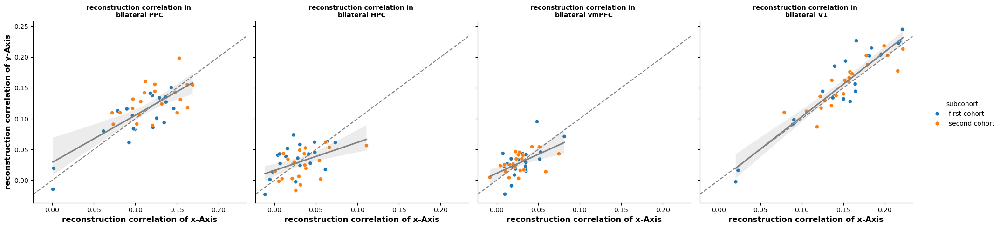

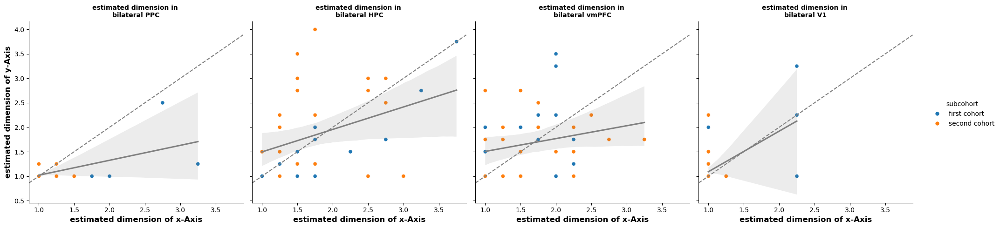

In [264]:
# see if the estimation for x axis and y axis are consistent
plot_yvars = {"reconstruction correlation":"reconstruction_corr","estimated dimension":"est_dim"}
for yname, ycol in plot_yvars.items():
    plotdf = svdestdim_df_sum[svdestdim_df_sum.subgroup=="Generalizer"].copy().pivot(index=["roi","region","side","subgroup","subcohort","subid"], columns="dimonaxis", values=ycol).reset_index()
    gs = sns.relplot(data=plotdf,
                     x="x axis",
                     y= "y axis",
                     hue="subcohort",palette="tab10",
                     col="region",
                     row="side",
                     kind="scatter")
    gs.map_dataframe(sns.regplot,
                     x="x axis",
                     y= "y axis",
                     color="grey",scatter=False)
    for ax in gs.axes.flatten():
        if "dim" in yname:
            ax.axline((1,1),slope=1,color="grey",linestyle="--")
        else:
            ax.axline((0,0),slope=1,color="grey",linestyle="--")
    gs.set_titles("%s in \n{row_name} {col_name}"%(yname),fontdict={"fontsize":15,"fontweight":"bold"})
    gs.set_axis_labels(x_var=f"{yname} of x-Axis", y_var=f"{yname} of y-Axis", clear_inner=False, fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    gs.tight_layout()


In [265]:
svdestdim_df_sum_wide = svdestdim_df_sum.pivot(index=["roi","subid","subgroup"],columns="dimonaxis",values="est_dim").reset_index()
for roiname, roidf in svdestdim_df_sum_wide[(svdestdim_df_sum_wide.subgroup=="Generalizer")].copy().groupby("roi"):
    if "vmPFC_bilateral" in roiname:
        print(roiname)
        print(correlation_equiv_permutation(roidf["x axis"].values,roidf["y axis"].values,
                                            corrfun=lambda x,y: scipy.stats.pearsonr(x,y).statistic,
                                            return_ponly=False))
        print(ttestpairedsamp_equiv_permutation(roidf["y axis"].values,roidf["x axis"].values,
                                            return_ponly=False))

vmPFC_bilateral
PermutationTestResult(statistic=0.21645233703786837, pvalue=0.1917808219178082, null_distribution=array([ 0.11111648, -0.01616434, -0.06883227, ..., -0.09516624,
        0.01894761,  0.13306145]))
PermutationTestResult(statistic=0.024390243902439025, pvalue=0.8799120087991201, null_distribution=array([ 0.06097561,  0.08536585,  0.14634146, ...,  0.03658537,
        0.09756098, -0.01219512]))


## Sum over splits to create average estimates

In [266]:
svdestdim_df_sum_overaxis = svdestdim_df_sum.groupby(["roi","subid"])[["est_dim","reconstruction_corr"]].mean().reset_index()
svdestdim_df_sum_overaxis["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in svdestdim_df_sum_overaxis["subid"]]
svdestdim_df_sum_overaxis.shape
svdestdim_df_sum_overaxis.columns

Index(['roi', 'subid', 'est_dim', 'reconstruction_corr', 'subgroup'], dtype='object')

In [267]:
svd_dim_descriptive = pd.concat(
    [svdestdim_df_sum_overaxis.groupby(["subgroup","roi"])["est_dim"].agg(descriptive_stats).reset_index(),
     svdestdim_df_sum_overaxis.groupby(["roi"])["est_dim"].agg(descriptive_stats).reset_index().assign(subgroup="All")
     ]
)

svd_dim_descriptive.rename(columns={"<lambda_0>":"se"},inplace=True)
svd_dim_descriptive.to_csv(os.path.join(ROIRSAdir,'cvSVD_dimsionality',"descriptive_stats_estdim.csv"),index=False)

svd_corr_descriptive = pd.concat(
    [svdestdim_df_sum_overaxis.groupby(["subgroup","roi"])["reconstruction_corr"].agg(descriptive_stats).reset_index(),
     svdestdim_df_sum_overaxis.groupby(["roi"])["reconstruction_corr"].agg(descriptive_stats).reset_index().assign(subgroup="All")
     ]
)

svd_corr_descriptive.rename(columns={"<lambda_0>":"se"},inplace=True)
#svd_corr_descriptive.to_csv(os.path.join(ROIRSAdir,'cvSVD_dimsionality',"descriptive_stats_reconstcorr.csv"),index=False)

In [268]:
svdestdim_df_sum_overaxis_wide = svdestdim_df_sum_overaxis.pivot(index=["subid","subgroup"],columns="roi",values="est_dim").reset_index()
svdestdim_df_sum_overaxis_wide



roi,subid,subgroup,PPC_bilateral,HPC_bilateral,vmPFC_bilateral,V1_bilateral
0,sub001,Generalizer,1.000,1.875,1.250,1.000
1,sub002,nonGeneralizer,1.125,1.250,1.750,1.000
2,sub003,Generalizer,1.000,1.875,1.125,1.000
3,sub004,nonGeneralizer,1.000,2.375,1.750,1.000
4,sub005,Generalizer,1.000,1.125,1.500,1.000
5,sub006,Generalizer,1.000,1.500,1.750,1.000
6,sub007,Generalizer,1.000,1.250,1.125,1.000
7,sub008,Generalizer,1.375,2.250,2.000,1.625
8,sub009,Generalizer,2.250,3.000,2.750,2.750
9,sub010,nonGeneralizer,1.875,2.125,3.000,1.375


In [269]:
HPCavedim = svdestdim_df_sum_overaxis_wide.query("subgroup=='Generalizer'")["HPC_bilateral"].values
vmPFCavedim = svdestdim_df_sum_overaxis_wide.query("subgroup=='Generalizer'")["vmPFC_bilateral"].values
V1avedim = svdestdim_df_sum_overaxis_wide.query("subgroup=='Generalizer'")["V1_bilateral"].values
SPGavedim = svdestdim_df_sum_overaxis_wide.query("subgroup=='Generalizer'")["PPC_bilateral"]

dim_pairedtest_df = pd.DataFrame(
    {"roi1":[],
     "roi2":[],
     "pval":[],
     "statistic":[]}
)
for r1,r2 in itertools.combinations(rois,2):
    print(f"\n{r1} vs {r2}")
    perm_res = ttestpairedsamp_equiv_permutation(
        svdestdim_df_sum_overaxis_wide.query("subgroup=='Generalizer'")[r1].values,
        svdestdim_df_sum_overaxis_wide.query("subgroup=='Generalizer'")[r2].values,
        return_ponly=False
    )
    print(perm_res)
    dim_pairedtest_df = pd.concat([dim_pairedtest_df,
                                   pd.DataFrame({
                                       "roi1": [roi_shortnames[r1]],
                                       "roi2": [roi_shortnames[r2]],
                                       "statistic": [perm_res.statistic],
                                       "pval": [perm_res.pvalue]
                                   })])
        
    

#dim_pairedtest_df.to_csv(os.path.join(ROIRSAdir,'cvSVD_dimsionality',"pairedpermutationtest_estdim.csv"),index=False)



PPC_bilateral vs HPC_bilateral
PermutationTestResult(statistic=-0.7103658536585366, pvalue=0.00019998000199980003, null_distribution=array([ 0.19817073, -0.03353659,  0.08231707, ..., -0.1554878 ,
       -0.14939024, -0.125     ]))

PPC_bilateral vs vmPFC_bilateral
PermutationTestResult(statistic=-0.5396341463414634, pvalue=0.00019998000199980003, null_distribution=array([ 0.10670732, -0.04573171,  0.05792683, ..., -0.2652439 ,
       -0.0152439 , -0.0945122 ]))

PPC_bilateral vs V1_bilateral
PermutationTestResult(statistic=-0.01524390243902439, pvalue=0.7157284271572842, null_distribution=array([-0.03963415, -0.02134146,  0.00914634, ..., -0.06402439,
        0.00304878, -0.02743902]))

HPC_bilateral vs vmPFC_bilateral
PermutationTestResult(statistic=0.17073170731707318, pvalue=0.1311868813118688, null_distribution=array([-0.09146341, -0.01219512, -0.02439024, ..., -0.1097561 ,
        0.13414634,  0.0304878 ]))

HPC_bilateral vs V1_bilateral
PermutationTestResult(statistic=0.6951219

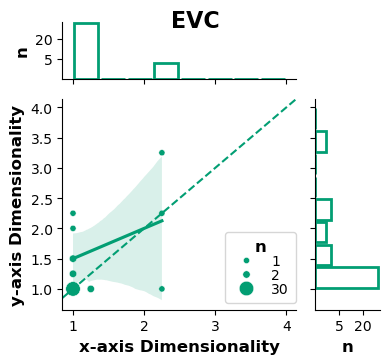

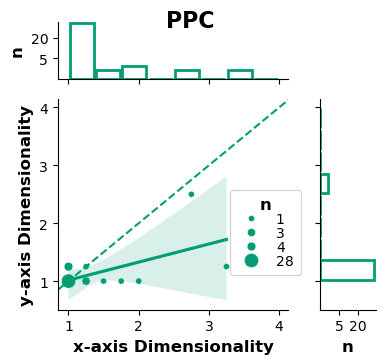

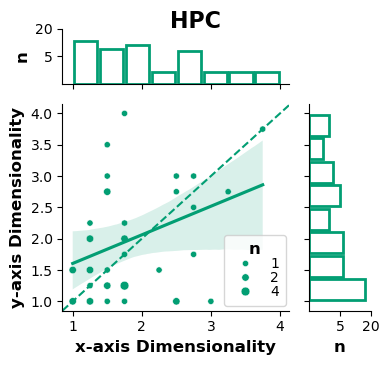

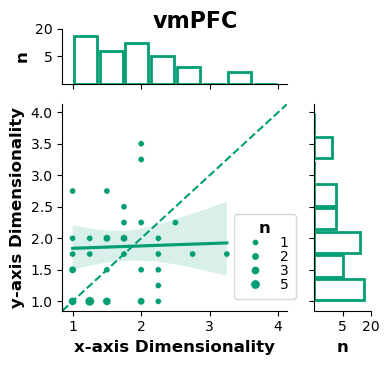

In [270]:
legendbbox = dict(zip(  
    ["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],
    [(0.85,0.4),(0.9,0.6),(0.85,0.4),(0.9,0.5)]
)
)
for roi in ["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"]:
    pdf = svdestdim_df_sum[(svdestdim_df_sum.subgroup=="Generalizer")&(svdestdim_df_sum.roi==roi)].copy()

    pdf_wide = pdf.pivot(index=["subid"], columns="dimonaxis", values="est_dim").reset_index()
        
    pdf_counts = pdf_wide.groupby(['x axis', 'y axis']).size().reset_index(name='counts')

    dot_color=  colors.hex2color(participantgrouphex["Generalizer"])
    gs = sns.JointGrid(data=pdf_counts, x="x axis", y="y axis",
                    marginal_ticks=True,ratio=3,space=0.,height=4)
    unique_sizes = np.sort(pdf_counts["counts"].unique())
    
    plot_sizes = np.sqrt(unique_sizes)*20
    
    sns.scatterplot(pdf_counts,
                    x="x axis",
                    y="y axis",
                    size="counts",
                    sizes=dict(zip(
                        unique_sizes,
                        plot_sizes                                
                        )), 
                    #hue="subgroup",palette=participantgrouphex,
                    color=dot_color,
                    ax=gs.ax_joint
                    )

    #gs.ax_joint.set_aspect(1.1)

    sns.histplot(x="x axis", 
                fill=False, linewidth=2, 
                binrange=[1,4], bins=8, element="bars", 
                shrink=0.9, line_kws={'width':0.1}, 
                ax=gs.ax_marg_x,kde=False, color=dot_color,data=pdf_wide
                )
    gs.ax_marg_x.set_yscale('function', functions=(lambda x:x**(1/2), lambda x:x**2))
    gs.ax_marg_x.set_yticks([5,20])
    gs.ax_marg_x.set_ylabel("n",fontdict=def_font_axis_legend_titles)

    sns.histplot(y="y axis", fill=False, linewidth=2, 
                binrange=[1,4], bins=8, element="bars", 
                shrink=0.9, line_kws={'width':0.1}, 
                ax=gs.ax_marg_y,kde=False, color=dot_color,data=pdf_wide)
    gs.ax_marg_y.set_xscale('function', functions=(lambda x:x**(1/2), lambda x:x**2))
    gs.ax_marg_y.set_xticks([5,20])
    gs.ax_marg_y.set_xlabel("n",fontdict=def_font_axis_legend_titles)

    handles, labels = gs.ax_joint.get_legend_handles_labels()
    for handle in handles:
        handle.set_color(dot_color)
    
    gs.ax_joint.legend(handles=handles,#[handles[1],handles[3],handles[-1]],
                    labels=labels,prop={"size":def_font_axis_tick_labels["fontsize"],"weight":def_font_axis_tick_labels["fontweight"]},
                    title="n",title_fontproperties={"size":def_font_axis_legend_titles["fontsize"],"weight":def_font_axis_legend_titles["fontweight"]},                    
                    labelspacing=0,
                    borderpad=0.5,
                    loc="upper center",bbox_to_anchor=legendbbox[roi])

    sns.regplot(data=pdf_counts, x="x axis", y="y axis",scatter=False,ax=gs.ax_joint,color=dot_color,ci=95, n_boot=10000)
    gs.ax_joint.axline((1,1),slope=1,color=dot_color,linestyle="--")

    gs.ax_joint.set_xlabel("x-axis Dimensionality",fontdict=def_font_axis_legend_titles)
    gs.ax_joint.set_ylabel("y-axis Dimensionality",fontdict=def_font_axis_legend_titles)
    #gs.fig.set_figwidth(4.5/1.1)
    #gs.fig.set_figheight(4.5)
    #jointax_pos = gs.ax_joint.get_position()
    #xmargax_pos = gs.ax_marg_x.get_position()
    #ymargax_pos = gs.ax_marg_y.get_position()
    #gs.ax_marg_x.set_position([jointax_pos.x0,xmargax_pos.y0,jointax_pos.width,xmargax_pos.height])
    #gs.ax_marg_y.set_position([ymargax_pos.x0,jointax_pos.y0,ymargax_pos.width,jointax_pos.height])
    gs.figure.suptitle(roi_shortnames[roi],y=0.9,**def_font_subplot_titles)
    gs.figure.tight_layout()


## projection onto first singular vector

In [103]:
ROIRSAdir

'D:\\OneDrive - Nexus365\\pirate_ongoing\\AALandHCPMMP1_anatrepfun'

In [271]:
#svdprojection_df = pd.read_csv(os.path.join(ROIRSAdir,"cvSVD_dimsionality","trainingstim_withinax_svd1Dproj_df.csv"))
svdprojection_df = pd.read_csv(os.path.join(ROIRSAdir,"cvSVD_dimsionality","trainingstim_withinax_meanXsvd1Dproj_df.csv"))

svdprojection_df_sum = svdprojection_df.groupby(["roi","subid","dimonaxis","axisloc"]).mean().reset_index()

svdprojection_df
svdprojection_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in svdprojection_df["subid"]]
svdprojection_df["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in svdprojection_df["subid"]]
svdprojection_df["roi"] = pd.Categorical(svdprojection_df.roi, categories=rois,ordered=True)

svdprojection_df_sum["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in svdprojection_df_sum["subid"]]
svdprojection_df_sum["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in svdprojection_df_sum["subid"]] 
svdprojection_df_sum["roi"] = pd.Categorical(svdprojection_df_sum.roi, categories=rois,ordered=True)


In [156]:
svdprojection_df

,SVD_projection,axisloc,subid,roi,dimonaxis,subgroup,subcohort
0,-6.331865,-1.0,sub001,PPC_bilateral,x axis,Generalizer,first cohort
1,-60.497262,-0.5,sub001,PPC_bilateral,x axis,Generalizer,first cohort
2,64.835804,0.5,sub001,PPC_bilateral,x axis,Generalizer,first cohort
3,1.993324,1.0,sub001,PPC_bilateral,x axis,Generalizer,first cohort
4,-33.460409,-1.0,sub001,PPC_bilateral,y axis,Generalizer,first cohort
...,...,...,...,...,...,...,...
1787,-66.369883,1.0,sub130,V1_bilateral,x axis,Generalizer,second cohort
1788,-95.634988,-1.0,sub130,V1_bilateral,y axis,Generalizer,second cohort
1789,32.166473,-0.5,sub130,V1_bilateral,y axis,Generalizer,second cohort
1790,70.352894,0.5,sub130,V1_bilateral,y axis,Generalizer,second cohort


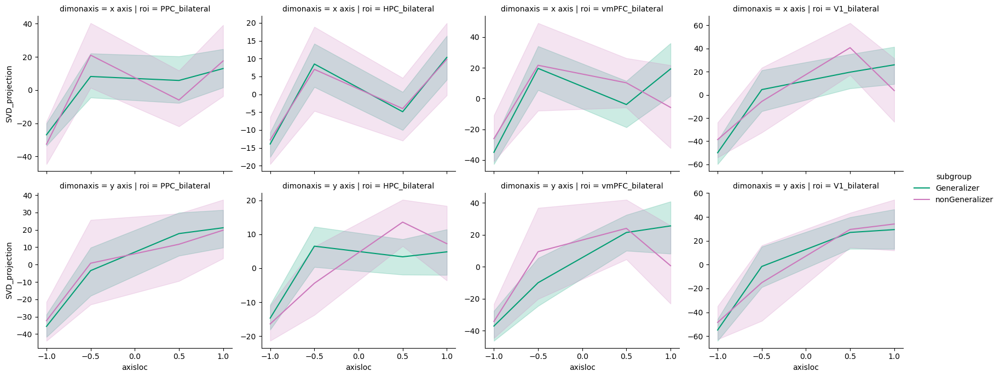

In [272]:
sns.relplot(data=svdprojection_df_sum,
            col="roi",row="dimonaxis",
            x="axisloc",y="SVD_projection",
            hue="subgroup",palette=participantgrouphex,
            kind="line",
            #units="subid",estimator=None,
            facet_kws={"sharey":False,"sharex":True},
            height=3.5,aspect=1.2)

### abs corr

In [21]:
null_projection_corr_df = pd.read_csv(os.path.join(ROIRSAdir,'cvSVD_dimsionality',"null_projection_abscorr_df.csv"))
null_projection_corr_df
groupnull_projection_corr_df = null_projection_corr_df.groupby(["subgroup","randomseed","roi","dimonaxis"])[["spearman_corr","abs_spearman_corr"]].mean().reset_index()


In [ ]:
counter = 0
fig = plt.figure(figsize=(16,6))
for (sg,axname,roi), sgdf in projection_corr_df.groupby(["subgroup","dimonaxis","roi"]):
    print(f"\n{sg} {roi} {axname}")
    sgnull = groupnull_projection_corr_df.query("roi==@roi and dimonaxis==@axname and subgroup==@sg").copy()
    assert sgnull.shape[0] == 1000, f"No null data for this group, got {sgnull.shape[0]}"
    obs = sgdf["abs_spearman_corr"].mean()
    pval = 1-np.mean(obs>sgnull["abs_spearman_corr"].values)
    print(f"Observed abs spearman correlation: {obs:.3f}, p-value: {pval:.3f}, null mean: {sgnull['abs_spearman_corr'].mean():.3f}, null std: {sgnull['abs_spearman_corr'].std():.3f}")

    if sg == "Generalizer":
        counter = counter + 1
        ax = fig.add_subplot(2,4,counter)
        sns.histplot(sgnull["abs_spearman_corr"],bins=50,ax=ax,stat="density",
                     color="grey",alpha=0.5,label="Null distribution")
        ax.axvline(obs,color=choose_color_from[1],linestyle="-",label="Observed")
        ax.set_title(f"{roi_shortnames[roi]} {axname} axis")
fig.tight_layout()

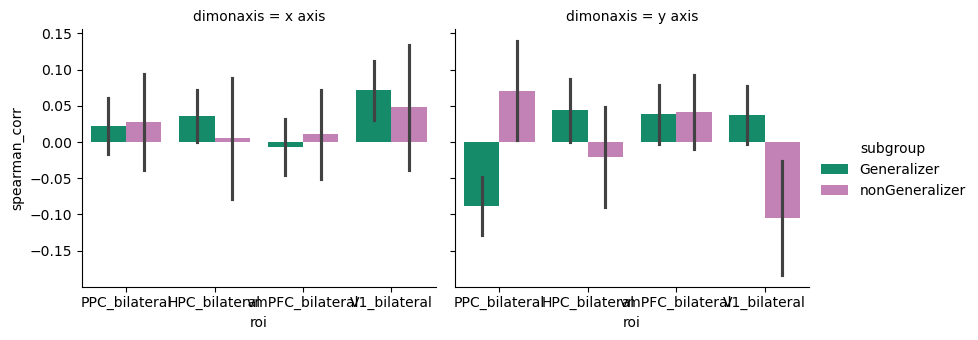

In [ ]:
gs = sns.catplot(data=projection_corr_df,
            x="roi",y="spearman_corr",
            hue="subgroup",palette=participantgrouphex,
            kind="bar",errorbar="se",
            col="dimonaxis",
            height=3.5,aspect=1.2,
            order=rois
            )

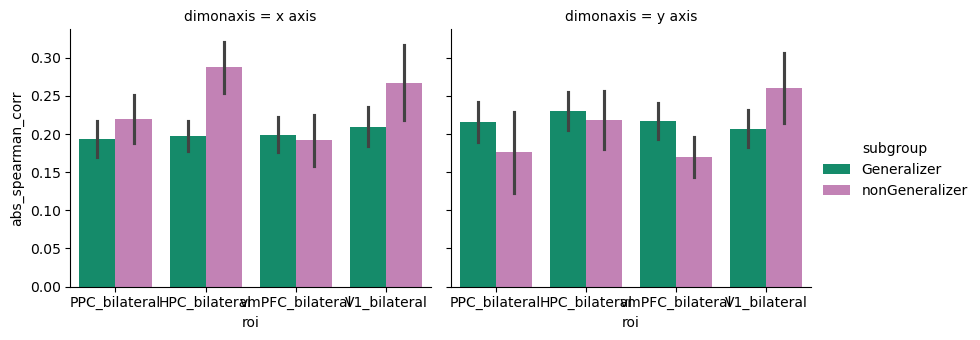

In [ ]:
gs = sns.catplot(data=projection_corr_df,
            x="roi",y="abs_spearman_corr",
            hue="subgroup",palette=participantgrouphex,
            kind="bar",errorbar="se",
            col="dimonaxis",
            height=3.5,aspect=1.2,
            order=rois
            )

### scale the projection

In [244]:
minmax_scale_anyD = lambda x: (x - np.min(x)) / (np.max(x) - np.min(x))

In [273]:
scaled_projection_dfs = []
for (subid,roi,axname), sdf in svdprojection_df.groupby(["subid","roi","dimonaxis"]):
    sdf["SVD_projection_scaled"] = minmax_scale_anyD(sdf["SVD_projection"])
    
    scaled_projection_dfs.append(sdf[["roi","subid","dimonaxis","axisloc","SVD_projection","SVD_projection_scaled"]].copy())
scaled_projection_df = pd.concat(scaled_projection_dfs,ignore_index=True)

scaled_projection_df_sum = scaled_projection_df.groupby(["roi","subid","dimonaxis","axisloc"]).mean().reset_index()

scaled_projection_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in scaled_projection_df["subid"]]
scaled_projection_df["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in scaled_projection_df["subid"]]
scaled_projection_df["roi"] = pd.Categorical(scaled_projection_df.roi, categories=rois,ordered=True)

scaled_projection_df_sum["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in scaled_projection_df_sum["subid"]]
scaled_projection_df_sum["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in scaled_projection_df_sum["subid"]] 
scaled_projection_df_sum["roi"] = pd.Categorical(scaled_projection_df_sum.roi, categories=rois,ordered=True)


In [ ]:
scaled_projection_dfs = []
for (subid,roi,r,axname), sdf in svdprojection_df.groupby(["subid","roi","run","dimonaxis"]):
    sdf["SVD_projection_scaled"] = minmax_scale_anyD(sdf["SVD_projection"])
    
    scaled_projection_dfs.append(sdf[["roi","run","subid","dimonaxis","axisloc","SVD_projection","SVD_projection_scaled"]].copy())
scaled_projection_df = pd.concat(scaled_projection_dfs,ignore_index=True)

scaled_projection_df_sum = scaled_projection_df.groupby(["roi","subid","dimonaxis","axisloc"]).mean().reset_index()

scaled_projection_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in scaled_projection_df["subid"]]
scaled_projection_df["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in scaled_projection_df["subid"]]
scaled_projection_df["roi"] = pd.Categorical(scaled_projection_df.roi, categories=rois,ordered=True)

scaled_projection_df_sum["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in scaled_projection_df_sum["subid"]]
scaled_projection_df_sum["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in scaled_projection_df_sum["subid"]] 
scaled_projection_df_sum["roi"] = pd.Categorical(scaled_projection_df_sum.roi, categories=rois,ordered=True)


In [248]:
scaled_projection_df_sum

,roi,subid,dimonaxis,axisloc,SVD_projection,SVD_projection_scaled,subgroup,subcohort
0,PPC_bilateral,sub001,x axis,-1.0,-48.223002,0.000000,Generalizer,first cohort
1,PPC_bilateral,sub001,x axis,-0.5,-3.549992,0.406434,Generalizer,first cohort
2,PPC_bilateral,sub001,x axis,0.5,-9.918556,0.348493,Generalizer,first cohort
3,PPC_bilateral,sub001,x axis,1.0,61.691551,1.000000,Generalizer,first cohort
4,PPC_bilateral,sub001,y axis,-1.0,66.445688,1.000000,Generalizer,first cohort
...,...,...,...,...,...,...,...,...
1787,V1_bilateral,sub130,x axis,1.0,-57.288711,0.000000,Generalizer,second cohort
1788,V1_bilateral,sub130,y axis,-1.0,-30.374047,0.149494,Generalizer,second cohort
1789,V1_bilateral,sub130,y axis,-0.5,-51.677368,0.000000,Generalizer,second cohort
1790,V1_bilateral,sub130,y axis,0.5,-8.773872,0.301072,Generalizer,second cohort


C:\Users\liangz\AppData\Local\Temp\ipykernel_42228\843481013.py:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(
C:\Users\liangz\AppData\Local\Temp\ipykernel_42228\843481013.py:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(
C:\Users\liangz\AppData\Local\Temp\ipykernel_42228\843481013.py:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(
C:\Users\liangz\AppData\Local\Temp\ipykernel_42228\843481013.py:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(
C:\Users\liangz\AppData\Local\Temp\ipykernel_42228\843481013.py:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(
C:\Users\liangz\AppData\Local\Temp\ipykernel_42228\843481013.py:30: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(
C:\Users\l

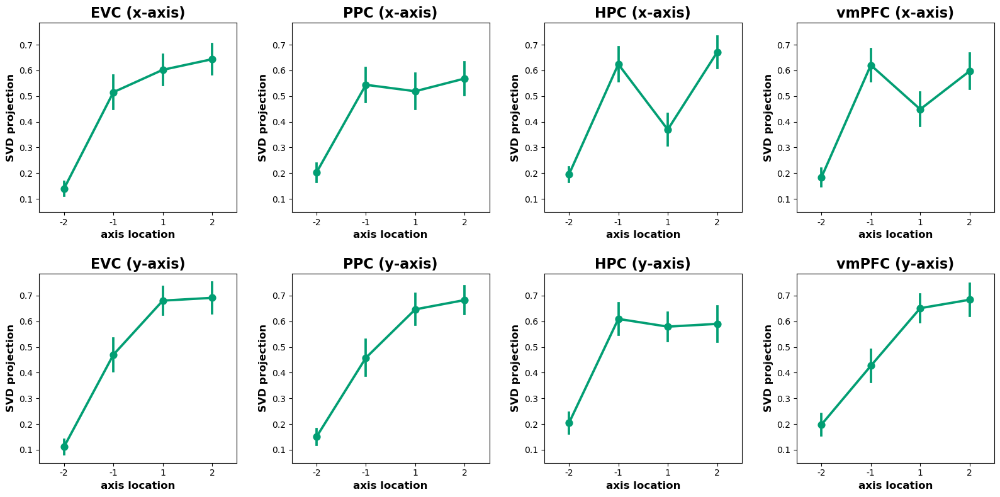

In [274]:
fig, axes = plt.subplots(2,4,figsize=(16,8),
                         sharey=True,sharex=True)

for jrow,dimonaxis in enumerate(["x axis","y axis"]):
    for kcol,roi in enumerate(["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"]):
        dot_color = colors.hex2color(participantgrouphex["Generalizer"])
        pdf = scaled_projection_df_sum.query("roi==@roi & dimonaxis==@dimonaxis").copy()
        pdf = pdf[pdf.subgroup=="Generalizer"].copy()
        pdf["axisloc_F"] = pdf["axisloc"]*2+2
        ax = axes[jrow,kcol]
        
        sns.pointplot(data=pdf,
                        x="axisloc",y="SVD_projection_scaled",
                        #hue="subgroup",palette=participantgrouphex,
                        color=dot_color,label="Generalizer",
                        errorbar="se",
                        ax=ax)
        
        # sns.lineplot(data=pdf,
        #             x="axisloc_F",y="SVD_projection_scaled",
        #             #hue="subgroup",palette=participantgrouphex,
        #             color=dot_color,linestyle="--",#label="Generalizer",
        #             units="subid",estimator=None,
        #             alpha=.3,
        #             ax=ax)
        
        ax.legend_.remove()

        ax.set_title(f"{roi_shortnames[roi]} ({dimonaxis.replace(' ','-')})",fontdict=def_font_subplot_titles)   
        ax.set_xticklabels(
            labels=["-2","-1","1","2"],
            fontdict=def_font_axis_tick_labels
            )
        #ax.set_yticks([0,0.25,0.5,0.75,1])

        #ax.tick_params(axis='both', which='both')
        ax.set_ylabel("SVD projection",fontdict=def_font_axis_legend_titles)
        ax.set_xlabel("axis location",fontdict=def_font_axis_legend_titles)
        ax.tick_params(labelleft=True, labelbottom=True)
        ax.xaxis.label.set_visible(True)
        ax.yaxis.label.set_visible(True)
        
fig.tight_layout(w_pad=2.5,h_pad=2)

In [275]:
scaled_projection_df.to_csv(os.path.join(ROIRSAdir,'cvSVD_dimsionality',"scaled_svdprojection_df.csv"),index=False)

### projection RDM corr

In [131]:
projection_rdmcorr_dfs = []
emp_rdms = dict(zip(
    rois,
    [{"x axis":[], "y axis":[]} for _ in rois]
)
)
for roi in rois:
    for subdata,subid in zip(roi_data[roi],subid_list):
        navi_filter = subdata["stimdf"].taskname.to_numpy() == "navigation"
        training_filter = subdata["stimdf"].stim_group.to_numpy() == 1
        non_center_filter = [not all([x==0, y==0]) for x,y in subdata["stimdf"][["stim_x","stim_y"]].to_numpy()]

        filter_x = subdata["stimdf"].stim_y.to_numpy() == 0
        filter_y = subdata["stimdf"].stim_x.to_numpy() == 0

        for axname, axisfil in zip(["x axis","y axis"],[filter_x,filter_y]):
            fil = np.vstack([navi_filter,training_filter,non_center_filter,axisfil]).all(axis=0)
            
            whitenedX = np.copy(subdata["preprocX"][fil])

            #make sure order is correct:
            reordered_df = subdata["stimdf"][fil].copy().reset_index().sort_values(by=["stim_session","training_axlocTL"])
            row_order = reordered_df.index.to_numpy()
            whitenedX = whitenedX[row_order,:]
            
            session_labels = reordered_df.stim_session.to_numpy()
            if axname == "x axis":
                stim_features = reordered_df["stim_x"].to_numpy()
            elif axname == "y axis":
                stim_features = reordered_df["stim_y"].to_numpy()

            mean_X = np.mean(split_data(whitenedX,reordered_df.stim_session.values),axis=0)
            mean_X = mean_X - np.mean(mean_X,axis=0)  #center the mean X
            #reconstruct using SVD
            u,s,vh = np.linalg.svd(mean_X,full_matrices=False)
            optdim = 1#for sanity check, set this to s.size  #assert np.allclose(reconst1D_mean_X, mean_X) 
            reconst1D_mean_X =  np.dot(u[:,:optdim]*s[:optdim],vh[:optdim,:])
            #assert np.allclose(reconst1D_mean_X, mean_X)
            emp_rdm = compute_rdm(reconst1D_mean_X,metric="euclidean")
            if subid in generalizers:
                emp_rdms[roi][axname].append(minmax_scale(emp_rdm))
            
            euc_rdm = compute_rdm(reordered_df[["training_axlocTL"]].to_numpy()[session_labels==0,:],metric="euclidean")
            res = scipy.stats.spearmanr(lower_tri(emp_rdm)[0],
                                        lower_tri(euc_rdm)[0])
            projection_rdmcorr_dfs.append(pd.DataFrame({
                "roi": roi,
                "subid": subid,
                "dimonaxis": axname,
                #"run":r,
                "spearman_corr": res.correlation,
                "spearman_pval": res.pvalue,
                "zcorr": np.arctanh(res.correlation)
            },index=[0]))
projection_rdmcorr_df = pd.concat(projection_rdmcorr_dfs,ignore_index=True)

projection_rdmcorr_df_sum = projection_rdmcorr_df.groupby(["roi","subid","dimonaxis"])[["spearman_corr","zcorr"]].mean().reset_index()
projection_rdmcorr_df_sumoveraxis = projection_rdmcorr_df.groupby(["roi","subid"])[["spearman_corr","zcorr"]].mean().reset_index()

projection_rdmcorr_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in projection_rdmcorr_df["subid"]]
projection_rdmcorr_df["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in projection_rdmcorr_df["subid"]]

projection_rdmcorr_df_sum["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in projection_rdmcorr_df_sum["subid"]]
projection_rdmcorr_df_sum["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in projection_rdmcorr_df_sum["subid"]]

projection_rdmcorr_df_sumoveraxis = projection_rdmcorr_df.groupby(["roi","subid"])[["spearman_corr","zcorr"]].mean().reset_index()
projection_rdmcorr_df_sumoveraxis["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in projection_rdmcorr_df_sumoveraxis["subid"]]
projection_rdmcorr_df_sumoveraxis["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in projection_rdmcorr_df_sumoveraxis["subid"]]

In [39]:
projection_rdmcorr_dfs = []
emp_rdms = dict(zip(
    rois,
    [{"x axis":[], "y axis":[]} for _ in rois]
)
)
for (subid,roi,axname), sdf in scaled_projection_df.groupby(["subid","roi","dimonaxis"]):
    emp_rdm = compute_rdm(sdf[["SVD_projection"]].to_numpy(),metric="euclidean")
    if subid in generalizers:
        emp_rdms[roi][axname].append(minmax_scale(emp_rdm))
    euc_rdm = compute_rdm(sdf[["axisloc"]].to_numpy(),metric="euclidean")
    res = scipy.stats.spearmanr(lower_tri(emp_rdm)[0],
                                lower_tri(euc_rdm)[0])
    projection_rdmcorr_dfs.append(pd.DataFrame({
        "roi": sdf["roi"].unique()[0],
        "subid": subid,
        "dimonaxis": axname,
        #"run":r,
        "spearman_corr": res.correlation,
        "spearman_pval": res.pvalue,
        "zcorr": np.arctanh(res.correlation)
    },index=[0]))
projection_rdmcorr_df = pd.concat(projection_rdmcorr_dfs,ignore_index=True)

projection_rdmcorr_df_sum = projection_rdmcorr_df.groupby(["roi","subid","dimonaxis"])[["spearman_corr","zcorr"]].mean().reset_index()

projection_rdmcorr_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in projection_rdmcorr_df["subid"]]
projection_rdmcorr_df["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in projection_rdmcorr_df["subid"]]

projection_rdmcorr_df_sum["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in projection_rdmcorr_df_sum["subid"]]
projection_rdmcorr_df_sum["subcohort"] = ["first cohort" if subid in cohort1ids else "second cohort" for subid in projection_rdmcorr_df_sum["subid"]]



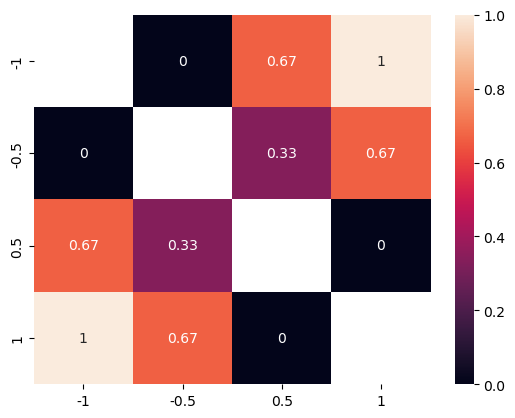

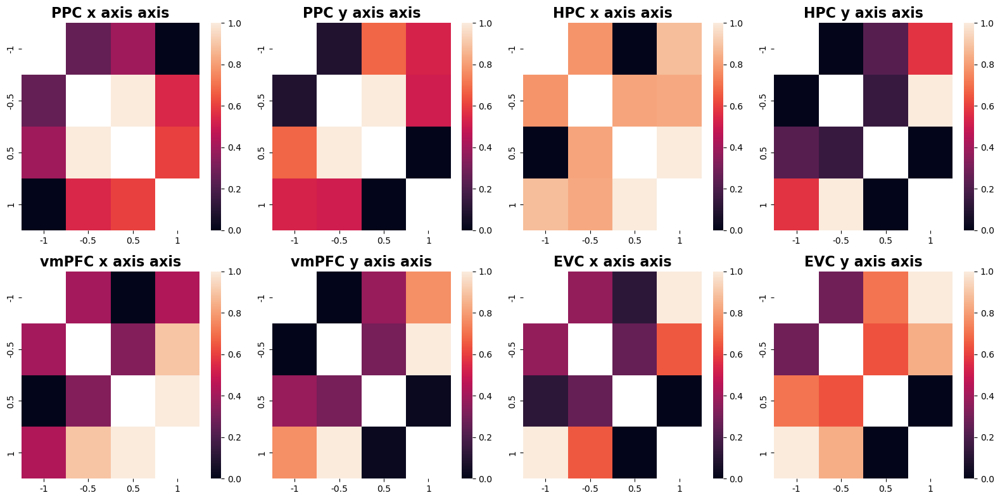

In [132]:
vseuc_rdm = minmax_scale(euc_rdm)
np.fill_diagonal(vseuc_rdm,np.nan)
sns.heatmap(vseuc_rdm,
            xticklabels=[-1,-.5,.5,1],
            yticklabels=[-1,-.5,.5,1],
            annot=True,
)
fig = plt.figure(figsize=(16,8))
for roi in rois:
    for axname in ["x axis","y axis"]:
        currax=fig.add_subplot(2,4,rois.index(roi)*2 + ["x axis","y axis"].index(axname)+1)
        meanrdm = minmax_scale(np.mean(emp_rdms[roi][axname],axis=0))
        np.fill_diagonal(meanrdm,np.nan)
        sns.heatmap(
            meanrdm,
            xticklabels=[-1,-.5,.5,1],
            yticklabels=[-1,-.5,.5,1],
            ax=currax
        )
        currax.set_title(f"{roi_shortnames[roi]} {axname} axis",**def_font_subplot_titles)
fig.tight_layout()

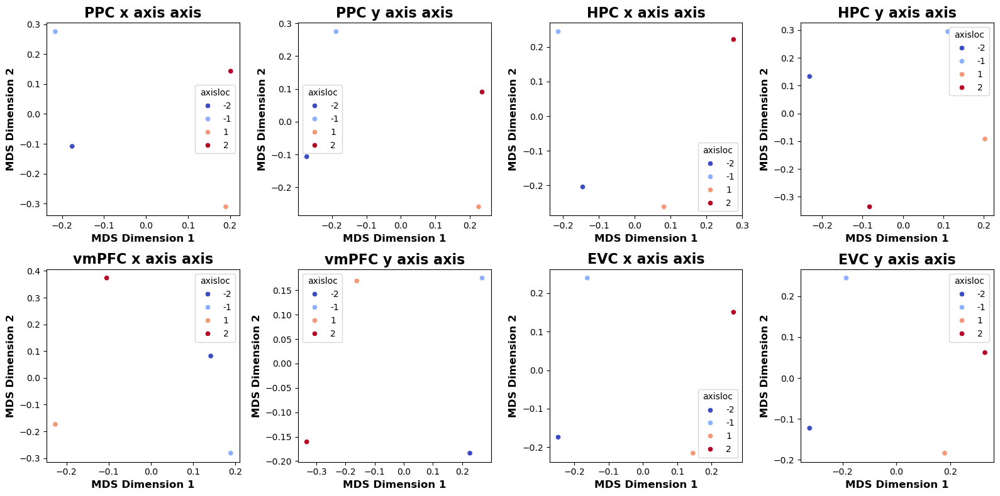

In [133]:
from sklearn.manifold import MDS
fig = plt.figure(figsize=(16,8))
for axname in ["x axis","y axis"]:
    for roi in rois:
        currax=fig.add_subplot(2,4,rois.index(roi)*2 + ["x axis","y axis"].index(axname)+1)
        mean_emp_rdm = np.mean(emp_rdms[roi][axname],axis=0)
        mds = MDS(n_components=2, dissimilarity='precomputed', random_state=0)
        mds_coords = mds.fit_transform(mean_emp_rdm)
        mdsdf = pd.DataFrame(mds_coords, columns=["MDS Dimension 1","MDS Dimension 2"])
        mdsdf["axisloc"] = np.array([-2,-1,1,2])
        sns.scatterplot(data=mdsdf,
                        x="MDS Dimension 1",
                        y="MDS Dimension 2",
                        hue="axisloc",palette="coolwarm",
                        ax=currax)
        currax.set_xlabel("MDS Dimension 1", **def_font_axis_legend_titles)
        currax.set_ylabel("MDS Dimension 2", **def_font_axis_legend_titles)
        currax.set_title(f"{roi_shortnames[roi]} {axname} axis",**def_font_subplot_titles)
fig.tight_layout()

In [46]:
projection_rdmcorr_df_sum

,roi,subid,dimonaxis,spearman_corr,zcorr,subgroup,subcohort
0,V1_bilateral,sub001,x axis,0.353094,0.481557,Generalizer,first cohort
1,V1_bilateral,sub001,y axis,-0.242752,-0.272650,Generalizer,first cohort
2,V1_bilateral,sub002,x axis,0.110342,0.129745,nonGeneralizer,first cohort
3,V1_bilateral,sub002,y axis,0.529641,0.611016,nonGeneralizer,first cohort
4,V1_bilateral,sub003,x axis,-0.220684,-0.267876,Generalizer,first cohort
...,...,...,...,...,...,...,...
107,V1_bilateral,sub128,y axis,0.441367,0.481126,Generalizer,second cohort
108,V1_bilateral,sub129,x axis,0.110342,0.112425,Generalizer,second cohort
109,V1_bilateral,sub129,y axis,-0.044137,-0.016735,Generalizer,second cohort
110,V1_bilateral,sub130,x axis,0.176547,0.184487,Generalizer,second cohort


              roi   subid dimonaxis  spearman_corr     zcorr        subgroup  \
224  V1_bilateral  sub001    x axis       0.088273  0.088504     Generalizer   
225  V1_bilateral  sub001    y axis       0.088273  0.088504     Generalizer   
226  V1_bilateral  sub002    x axis       0.088273  0.088504  nonGeneralizer   
227  V1_bilateral  sub002    y axis      -0.088273 -0.088504  nonGeneralizer   
228  V1_bilateral  sub003    x axis      -0.617914 -0.721624     Generalizer   
..            ...     ...       ...            ...       ...             ...   
331  V1_bilateral  sub128    y axis       0.088273  0.088504     Generalizer   
332  V1_bilateral  sub129    x axis       0.176547  0.178416     Generalizer   
333  V1_bilateral  sub129    y axis      -0.176547 -0.178416     Generalizer   
334  V1_bilateral  sub130    x axis      -0.088273 -0.088504     Generalizer   
335  V1_bilateral  sub130    y axis       0.088273  0.088504     Generalizer   

         subcohort  
224   first cohort

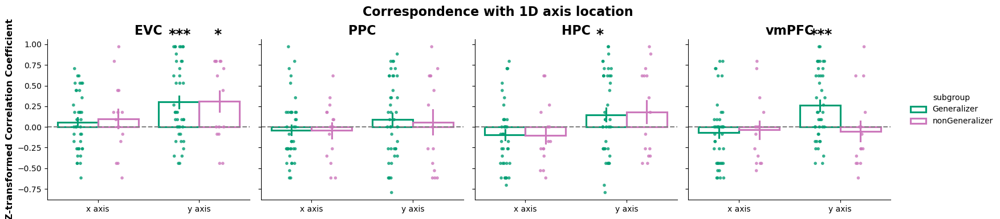

In [134]:
projection_rdmcorr_df_sum.roi = pd.Categorical(projection_rdmcorr_df_sum.roi,
                                                categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],
                                                ordered=True)

gs = sns.catplot(data=projection_rdmcorr_df_sum,
            x="dimonaxis",y="spearman_corr",
            col="roi",
            hue="subgroup",palette=participantgrouphex,
            kind="bar",errorbar="se",fill=False,alpha=1,
            #kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
            #inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=1
            ).refline(y=0).set_titles("{col_name}")
gs.map_dataframe(sns.stripplot,x="dimonaxis",y="spearman_corr",
                jitter=0.1,
                hue="subgroup",palette=participantgrouphex,dodge=True,
                alpha=0.8,s=4
                )


for ax in gs.axes.flatten():
    axdf = projection_rdmcorr_df_sum[projection_rdmcorr_df_sum.roi==ax.title.get_text()]
    print(axdf)
    ax.set_title(roi_shortnames[axdf.roi.values[0]],**def_font_subplot_titles)

    ax.set_ylabel("Z-transformed Correlation Coefficient",**def_font_axis_legend_titles)
    ax.set_xlabel("")
    plt.setp(ax.get_xticklabels(),**def_font_axis_tick_labels)
    for j,(tar,tardf) in enumerate(axdf.groupby(["dimonaxis","subgroup"])):
        
        pval = ttest1samp_equiv_permutation(tardf.zcorr.values)
        if tardf.zcorr.mean()>0:
            minorplus = 1*((j%2)==1)
            dw = [-.3,0.15][minorplus]
            
            ax.text(x=np.floor(j/2)+dw,y=1.1*axdf["spearman_corr"].max(),
                    s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                    size=18,fontweight="bold")
    
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test two-sided)')
#sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.85),ncol=1,title="",prop={'size': 12})
#gs.figure.suptitle("Correspondence with\n Model Retrieval Patterns",fontweight="bold",fontsize=14,y=1.05,x=0.4)
#gs.legend.remove()
gs.figure.suptitle("Correspondence with 1D axis location",y=0.95,x=0.5,**def_font_subplot_titles)
gs.tight_layout()

### data RDM corr

In [12]:
#run RSA analysis
rsa_df_list = []
for roi in rois:
    for subdata,subid in zip(roi_data[roi],subid_list):
        print(f"{roi} - {subid}",end="\r",flush=True)
        subgroup = "Generalizer" if subid in generalizers else "nonGeneralizer"
        subcohort = "first cohort" if subid in cohort1ids else "second cohort"
        preprocedX = deepcopy(subdata["preprocX"])#deepcopy(subdata["rawX"])#
        stimdf = subdata["stimdf"]
        
        navi_filter = stimdf.taskname.to_numpy() == "navigation"
        non_center_filter = [not all([x==0, y==0]) for x,y in stimdf[["stim_x","stim_y"]].to_numpy()]

        final_filter = np.all([navi_filter,non_center_filter],axis=0)
        #average across sessions
        navi_X = np.mean(split_data(X      = preprocedX[final_filter,:],
                                    groups = stimdf[final_filter].copy().stim_session.to_numpy()),
                        axis=0)
        
        stim_dict = stimdf[final_filter&(stimdf.stim_session==0)].copy().reset_index(drop=True).to_dict('list')
        submodelrdm = ModelRDM(
            stimid    = stim_dict["stim_id"],
            stimgtloc = np.vstack([stim_dict["stim_x"],stim_dict["stim_y"]]).T,
            stimresploc= np.vstack([stim_dict["resp_x"],stim_dict["resp_y"]]).T,
            stimfeature = np.vstack([stim_dict["stim_color"],stim_dict["stim_shape"]]).T,
            stimgroup = stim_dict["stim_group"],
            sessions = stim_dict["stim_session"],
            nan_identity = False,
            splitgroup  = True
        )

        prim_reg_names = ["gtlocEuclidean","feature"]
        respprim_reg_names = ["resplocEuclidean","feature"]
        
                
        analyses = [
            {"name": "train stim withinxy - Euc",
            "reg_names": ["withinxy_trainstimpairs_gtlocEuclidean"],
            "short_names": ["locEuc within axis"]
            },
            {"name": "train stim withinx - Euc",
            "reg_names": ["withinx_trainstimpairs_gtlocEuclidean"],
            "short_names": ["locEuc within x-axis"]
            },
            {"name": "train stim withiny - Euc",
            "reg_names": ["withiny_trainstimpairs_gtlocEuclidean"],
            "short_names": ["locEuc within y-axis"]
            },

            {"name": "train stim withinxy - RESP Euc",
            "reg_names": ["withinxy_trainstimpairs_resplocEuclidean"],
            "short_names": ["resplocEuc within axis"]
            },
            {"name": "train stim withinx - RESP Euc",
            "reg_names": ["withinx_trainstimpairs_resplocEuclidean"],
            "short_names": ["resplocEuc within x-axis"]
            },
            {"name": "train stim withiny - RESP Euc",
            "reg_names": ["withiny_trainstimpairs_resplocEuclidean"],
            "short_names": ["resplocEuc within y-axis"]
            },
            
            

            {"name": "train stim Compete Feature Cartesian",
            "reg_names": [f"trainstimpairs_{x}" for x in prim_reg_names],
            "short_names":  prim_reg_names
            },

            {"name": "test stim Compete Feature Cartesian",
            "reg_names": [f"teststimpairs_{x}" for x in prim_reg_names],
            "short_names":  prim_reg_names
            },
            {"name": "train stim Compete Feature RESP Cartesian",
            "reg_names": [f"trainstimpairs_{x}" for x in respprim_reg_names],
            "short_names":  respprim_reg_names
            },

            {"name": "test stim Compete Feature RESP Cartesian",
            "reg_names": [f"teststimpairs_{x}" for x in respprim_reg_names],
            "short_names":  respprim_reg_names
            },
            
            

            {"name": "test stim Cartesian",
            "reg_names": [f"teststimpairs_gtlocEuclidean"],
            "short_names": ["gtlocEuclidean"]
            },
            {"name": "test stim feature",
            "reg_names": [f"teststimpairs_feature"],
            "short_names": ["feature"]
            },
            {"name": "test stim withinxy - Euc",
            "reg_names": [f"withinxy_teststimpairs_gtlocEuclidean"],
            "short_names": ["locEuc within axis"]
            },
            {"name": "between ax test stim Cartesian",
            "reg_names": [f"betweenxy_teststimpairs_gtlocEuclidean"],
            "short_names": ["gtlocEuclidean"]
            },


            {"name": "test stim RESP Cartesian",
            "reg_names": [f"teststimpairs_resplocEuclidean"],
            "short_names": ["resplocEuc"]
            },
            {"name": "test stim withinxy - RESP Euc",
            "reg_names": [f"withinxy_teststimpairs_resplocEuclidean"],
            "short_names": ["resplocEuc within axis"]
            },
            {"name": "between ax test stim RESP Cartesian",
            "reg_names": [f"betweenxy_teststimpairs_resplocEuclidean"],
            "short_names": ["resplocEuc"]
            },
            
        ]
        
        for analysis_dict in analyses:
            reg_names, short_names = analysis_dict["reg_names"], analysis_dict["short_names"]
            reg_vals  = [submodelrdm.models[k] for k in reg_names]
            if len(reg_names)>1: # get regression coefficients if number of model rdm is more than 1
                reg_estimator  = MultipleRDMRegression(navi_X,
                                                    modelrdms=reg_vals,
                                                    modelnames=short_names,
                                                    rdm_metric="correlation")
            else: # get spearman correlation coefficient if only one model rdm
                reg_estimator  = PatternCorrelation(navi_X,
                                                    modelrdms=reg_vals,
                                                    modelnames=short_names,
                                                    rdm_metric="correlation",
                                                    type="spearman",
                                                    ztransform=False)
            reg_estimator.fit()
            res_df = pd.DataFrame(
                {"modelrdm":   reg_estimator.modelnames,
                "coefficient": reg_estimator.result}
            ).assign(
            roi = roi,
            subid=subid,
            subgroup=subgroup,
            cohort = subcohort,
            analysis = analysis_dict["name"],
            adjR2 = reg_estimator.adjR2 if len(reg_names)>1 else np.nan,
            R2    = reg_estimator.R2 if len(reg_names)>1 else np.nan,
            )
            rsa_df_list.append(res_df)



In [94]:
rsa_df = pd.concat(rsa_df_list,axis=0).reset_index(drop=True)
print(rsa_df.shape)
print(f"unique analysis names: {np.unique(rsa_df.analysis)}")
print(f"unique modelrdm names: {np.unique(rsa_df.modelrdm)}")
rsa_df.head(5)

(4704, 9)
unique analysis names: ['between ax test stim Cartesian' 'between ax test stim RESP Cartesian'
 'test stim Cartesian' 'test stim Compete Feature Cartesian'
 'test stim Compete Feature RESP Cartesian' 'test stim RESP Cartesian'
 'test stim feature' 'test stim withinxy - Euc'
 'test stim withinxy - RESP Euc' 'train stim Compete Feature Cartesian'
 'train stim Compete Feature RESP Cartesian' 'train stim withinx - Euc'
 'train stim withinx - RESP Euc' 'train stim withinxy - Euc'
 'train stim withinxy - RESP Euc' 'train stim withiny - Euc'
 'train stim withiny - RESP Euc']
unique modelrdm names: ['feature' 'gtlocEuclidean' 'locEuc within axis' 'locEuc within x-axis'
 'locEuc within y-axis' 'resplocEuc' 'resplocEuc within axis'
 'resplocEuc within x-axis' 'resplocEuc within y-axis' 'resplocEuclidean']


,modelrdm,coefficient,roi,subid,subgroup,cohort,analysis,adjR2,R2
0,locEuc within axis,0.000000,PPC_bilateral,sub001,Generalizer,first cohort,train stim withinxy - Euc,NaN,NaN
1,locEuc within x-axis,-0.088273,PPC_bilateral,sub001,Generalizer,first cohort,train stim withinx - Euc,NaN,NaN
2,locEuc within y-axis,0.176547,PPC_bilateral,sub001,Generalizer,first cohort,train stim withiny - Euc,NaN,NaN
3,resplocEuc within axis,0.244755,PPC_bilateral,sub001,Generalizer,first cohort,train stim withinxy - RESP Euc,NaN,NaN
4,resplocEuc within x-axis,0.257143,PPC_bilateral,sub001,Generalizer,first cohort,train stim withinx - RESP Euc,NaN,NaN



PPC train stim withinx - Euc ('locEuc within x-axis', 'Generalizer') p-value: 0.014

PPC train stim withinx - Euc ('locEuc within x-axis', 'nonGeneralizer') p-value: 0.578

PPC train stim withiny - Euc ('locEuc within y-axis', 'Generalizer') p-value: 0.169

PPC train stim withiny - Euc ('locEuc within y-axis', 'nonGeneralizer') p-value: 0.754

PPC train stim withinxy - Euc ('locEuc within axis', 'Generalizer') p-value: 0.148

PPC train stim withinxy - Euc ('locEuc within axis', 'nonGeneralizer') p-value: 0.780

PPC test stim withinxy - Euc ('locEuc within axis', 'Generalizer') p-value: 0.004

PPC test stim withinxy - Euc ('locEuc within axis', 'nonGeneralizer') p-value: 0.150

PPC train stim Compete Feature Cartesian ('feature', 'Generalizer') p-value: 0.002

PPC train stim Compete Feature Cartesian ('feature', 'nonGeneralizer') p-value: 0.006

PPC train stim Compete Feature Cartesian ('gtlocEuclidean', 'Generalizer') p-value: 0.429

PPC train stim Compete Feature Cartesian ('gtlocEuc

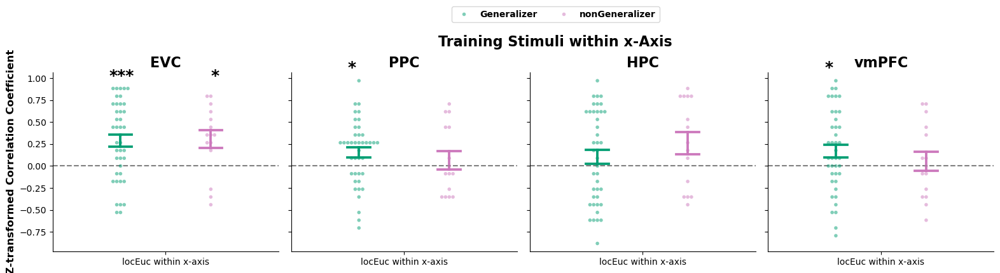

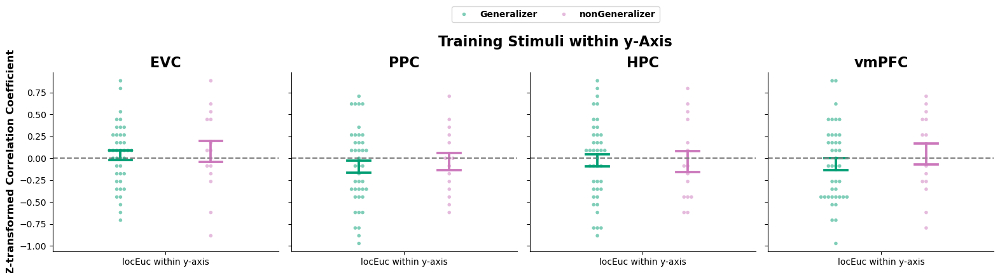

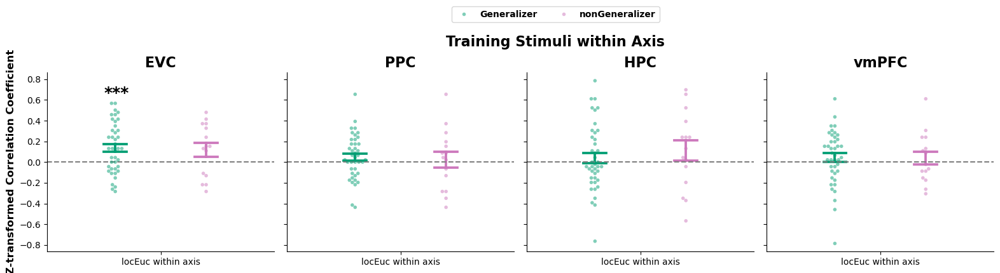

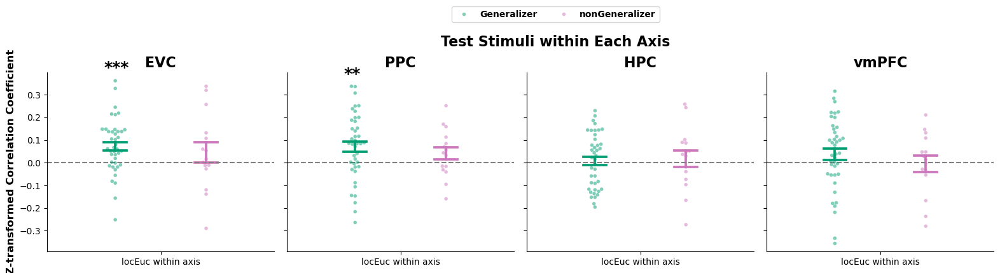

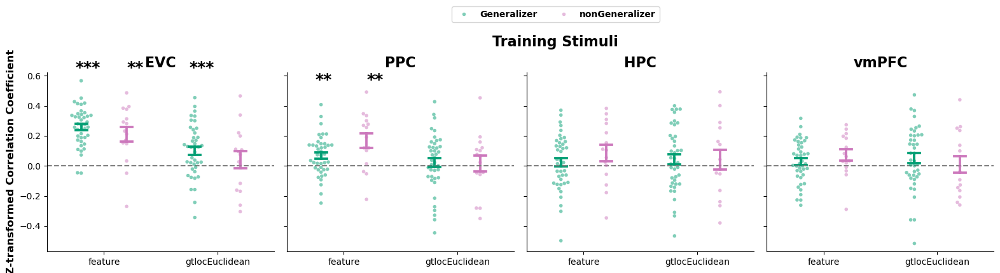

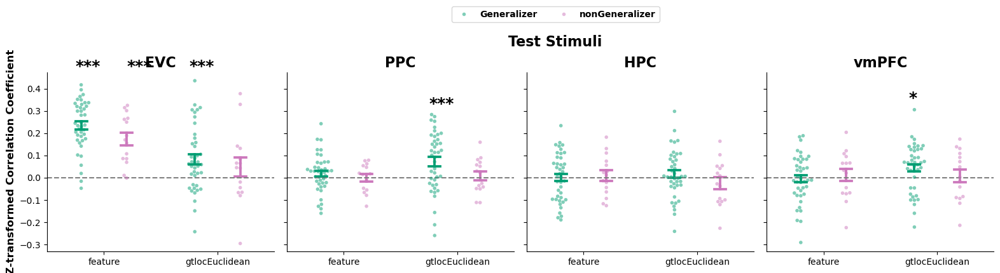

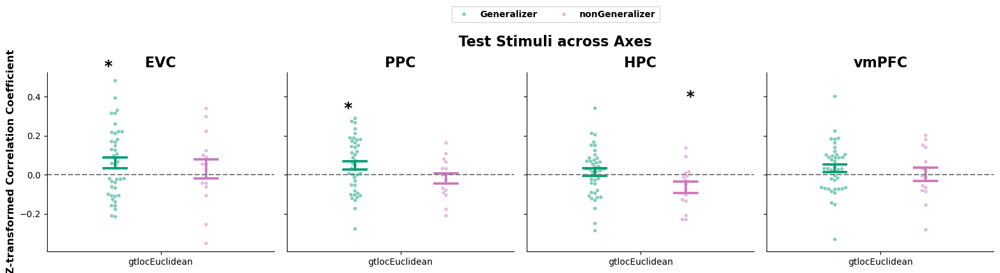

In [97]:
# GROUND TRUTH LOCATION RSA
xvar, gvar, yvar, yvartest = "modelrdm",  "subgroup", "coefficient", "coefficient"


plt_ana = dict(zip(["train stim withinx - Euc",
                    "train stim withiny - Euc",
                    "train stim withinxy - Euc",
                    "test stim withinxy - Euc",
                    "train stim Compete Feature Cartesian",
                    "test stim Compete Feature Cartesian",
                    "between ax test stim Cartesian"                     
                    ],
                   
                   ["Training Stimuli within x-Axis",
                    "Training Stimuli within y-Axis",
                    "Training Stimuli within Axis",
                    "Test Stimuli within Each Axis",
                    "Training Stimuli",
                    "Test Stimuli",
                    "Test Stimuli across Axes", 
                    ]))
aprs    = dict(zip(["train stim withinx - Euc",
                    "train stim withiny - Euc",
                    "train stim withinxy - Euc",
                    "test stim withinxy - Euc",
                    "train stim Compete Feature Cartesian",
                    "test stim Compete Feature Cartesian", 
                    "between ax test stim Cartesian"
                    ],
                   [1.2,
                    1.2,
                    1.2,
                    1.2,
                    1,
                    1,
                    1
]))


#for cname,clist in zip(["First Cohort","Second Cohort","Combined Cohort"],[cohort1ids,cohort2ids,subid_list]):
for cname,clist in zip(["Combined Cohort"],[subid_list]):
    for a, atitle in plt_ana.items():
        curr_pdf = rsa_df[(rsa_df.analysis==a)&(rsa_df.subid.isin(clist))].copy().reset_index(drop=True)
        curr_pdf.modelrdm = pd.Categorical(curr_pdf.modelrdm)
        
        curr_pdf.roi = pd.Categorical(curr_pdf.roi,
                                    categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],
                                    ordered=True)

        gs = sns.catplot(data=curr_pdf,
                    x=xvar,y=yvar,
                    col="roi",
                    hue="subgroup",palette=participantgrouphex,
                    kind="point",errorbar="se",capsize=0.1,markersize=0,linestyle="none",dodge=.4,
                    #kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
                    #inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
                    height=4,aspect=1
                    ).refline(y=0).set_titles("{col_name}")
        gs.map_dataframe(sns.swarmplot,x=xvar,y=yvar,
                        hue="subgroup",palette=participantgrouphex,dodge=.5,
                        alpha=0.5,s=4
                        )


        for ax in gs.axes.flatten():
            axdf = curr_pdf[curr_pdf.roi==ax.title.get_text()]
            ax.set_title(roi_shortnames[axdf.roi.values[0]],**def_font_subplot_titles)
            if "Compete" not in atitle:
                ax.set_ylabel("Z-transformed Correlation Coefficient",**def_font_axis_legend_titles)
            else:
                ax.set_ylabel("Regression Coefficient",**def_font_axis_legend_titles)
            ax.set_xlabel("")
            plt.setp(ax.get_xticklabels(),**def_font_axis_tick_labels)
            for j,(tar,tardf) in enumerate(axdf.groupby([xvar,"subgroup"])):
                
                pval = ttest1samp_equiv_permutation(tardf[yvar].values)
                if roi_shortnames[axdf.roi.values[0]]=="PPC":
                    print(f"\n{roi_shortnames[axdf.roi.values[0]]} {a} {tar} p-value: {pval:.3f}")
                #print(pval)
                minorplus = 1*((j%2)==1)
                dw = [-.25,0.2][minorplus]
                
                ax.text(x=np.floor(j/2)+dw,y=1.1*axdf[yvar].max(),
                        s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                        size=18,fontweight="bold")
        gs.legend.remove()   
        hs,ls = gs.axes.flatten()[0].get_legend_handles_labels()
        gs.figure.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
                prop = dict(weight="bold"))
    
        gs.figure.suptitle(f"{atitle}",y=0.95,x=0.5,**def_font_subplot_titles)
        gs.tight_layout()



PPC train stim withinx - RESP Euc ('resplocEuc within x-axis', 'Generalizer') p-value: 0.038

PPC train stim withinx - RESP Euc ('resplocEuc within x-axis', 'nonGeneralizer') p-value: 0.977

PPC train stim withiny - RESP Euc ('resplocEuc within y-axis', 'Generalizer') p-value: 0.526

PPC train stim withiny - RESP Euc ('resplocEuc within y-axis', 'nonGeneralizer') p-value: 0.782

PPC train stim withinxy - RESP Euc ('resplocEuc within axis', 'Generalizer') p-value: 0.701

PPC train stim withinxy - RESP Euc ('resplocEuc within axis', 'nonGeneralizer') p-value: 0.167

PPC test stim withinxy - RESP Euc ('resplocEuc within axis', 'Generalizer') p-value: 0.002

PPC test stim withinxy - RESP Euc ('resplocEuc within axis', 'nonGeneralizer') p-value: 0.551

PPC train stim Compete Feature RESP Cartesian ('feature', 'Generalizer') p-value: 0.003

PPC train stim Compete Feature RESP Cartesian ('feature', 'nonGeneralizer') p-value: 0.004

PPC train stim Compete Feature RESP Cartesian ('resplocEucli

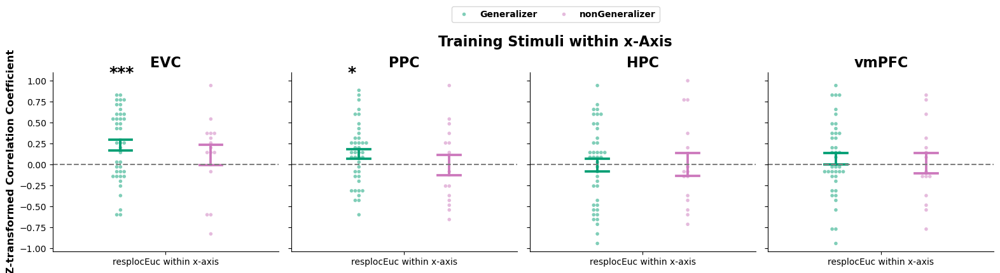

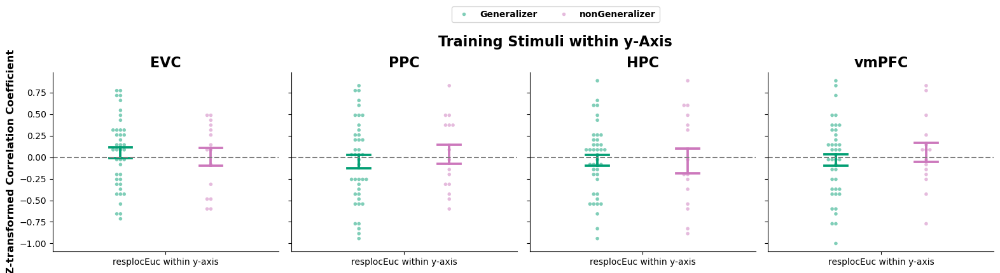

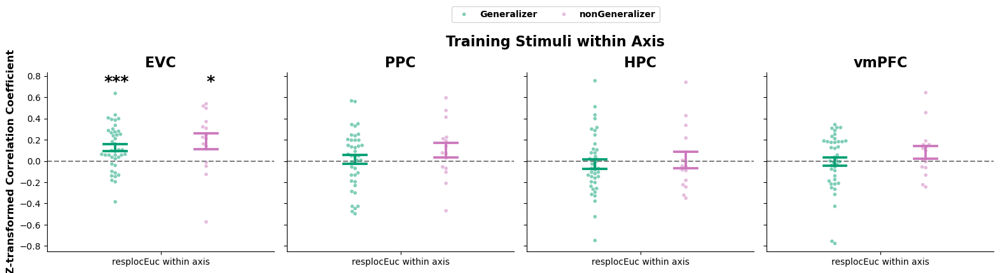

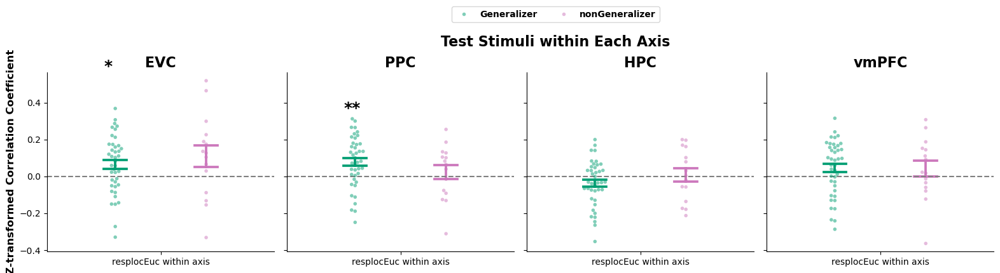

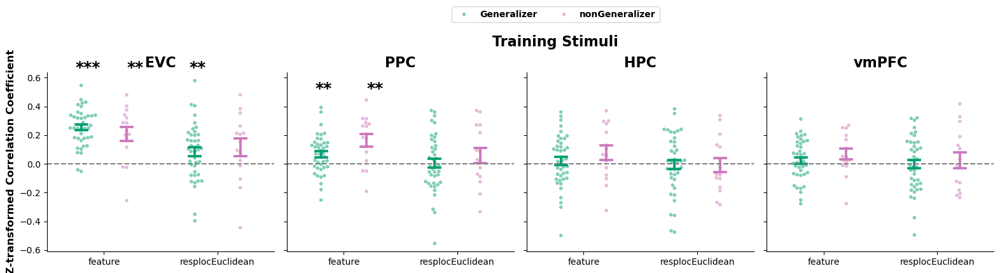

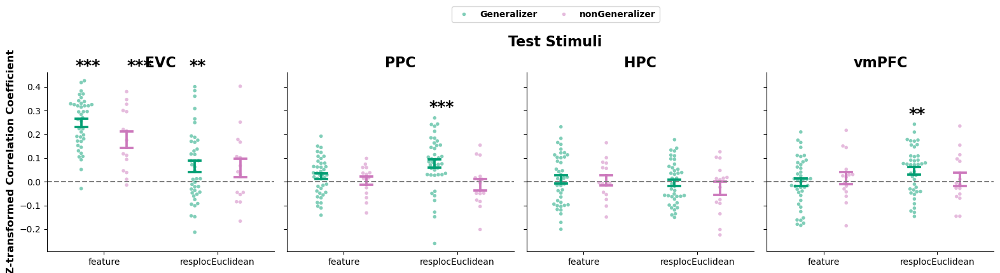

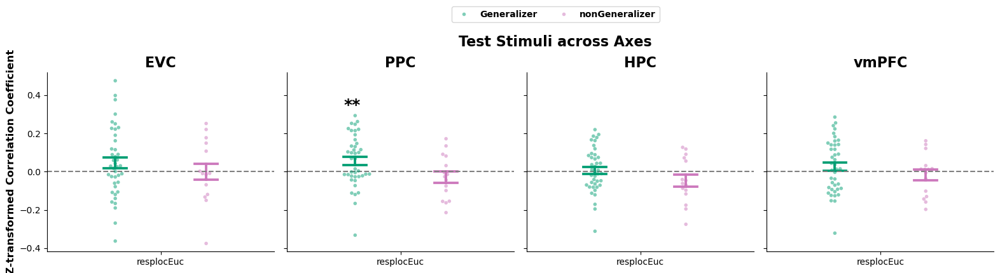

In [98]:
# test if coefficients are significantly above zero
xvar, gvar, yvar, yvartest = "modelrdm",  "subgroup", "coefficient", "coefficient"


plt_ana = dict(zip(["train stim withinx - RESP Euc",
                    "train stim withiny - RESP Euc",
                    "train stim withinxy - RESP Euc",
                    "test stim withinxy - RESP Euc",
                    "train stim Compete Feature RESP Cartesian",
                    "test stim Compete Feature RESP Cartesian",
                    "between ax test stim RESP Cartesian"                     
                    ],
                   
                   ["Training Stimuli within x-Axis",
                    "Training Stimuli within y-Axis",
                    "Training Stimuli within Axis",
                    "Test Stimuli within Each Axis",
                    "Training Stimuli",
                    "Test Stimuli",
                    "Test Stimuli across Axes", 
                    ]))
aprs    = dict(zip(["train stim withinx - RESP Euc",
                    "train stim withiny - RESP Euc",
                    "train stim withinxy - RESP Euc",
                    "test stim withinxy - RESP Euc",
                    "train stim Compete Feature RESP Cartesian",
                    "test stim Compete Feature RESP Cartesian", 
                    "between ax test stim RESP Cartesian"
                    ],
                   [1.2,
                    1.2,
                    1.2,
                    1.2,
                    1,
                    1,
                    1
]))


#for cname,clist in zip(["First Cohort","Second Cohort","Combined Cohort"],[cohort1ids,cohort2ids,subid_list]):
for cname,clist in zip(["Combined Cohort"],[subid_list]):
    for a, atitle in plt_ana.items():
        curr_pdf = rsa_df[(rsa_df.analysis==a)&(rsa_df.subid.isin(clist))].copy().reset_index(drop=True)
        curr_pdf.modelrdm = pd.Categorical(curr_pdf.modelrdm)
        
        curr_pdf.roi = pd.Categorical(curr_pdf.roi,
                                    categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],
                                    ordered=True)

        gs = sns.catplot(data=curr_pdf,
                    x=xvar,y=yvar,
                    col="roi",
                    hue="subgroup",palette=participantgrouphex,
                    kind="point",errorbar="se",capsize=0.1,markersize=0,linestyle="none",dodge=.4,
                    #kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
                    #inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
                    height=4,aspect=1
                    ).refline(y=0).set_titles("{col_name}")
        gs.map_dataframe(sns.swarmplot,x=xvar,y=yvar,
                        hue="subgroup",palette=participantgrouphex,dodge=.5,
                        alpha=0.5,s=4
                        )


        for ax in gs.axes.flatten():
            axdf = curr_pdf[curr_pdf.roi==ax.title.get_text()]
            ax.set_title(roi_shortnames[axdf.roi.values[0]],**def_font_subplot_titles)
            if "Compete" not in atitle:
                ax.set_ylabel("Z-transformed Correlation Coefficient",**def_font_axis_legend_titles)
            else:
                ax.set_ylabel("Regression Coefficient",**def_font_axis_legend_titles)
            ax.set_xlabel("")
            plt.setp(ax.get_xticklabels(),**def_font_axis_tick_labels)
            for j,(tar,tardf) in enumerate(axdf.groupby([xvar,"subgroup"])):
                
                pval = ttest1samp_equiv_permutation(tardf[yvar].values)
                if roi_shortnames[axdf.roi.values[0]]=="PPC":
                    print(f"\n{roi_shortnames[axdf.roi.values[0]]} {a} {tar} p-value: {pval:.3f}")
                minorplus = 1*((j%2)==1)
                dw = [-.25,0.2][minorplus]
                
                ax.text(x=np.floor(j/2)+dw,y=1.1*axdf[yvar].max(),
                        s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                        size=18,fontweight="bold")
        gs.legend.remove()   
        hs,ls = gs.axes.flatten()[0].get_legend_handles_labels()
        gs.figure.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
                prop = dict(weight="bold"))
    
        gs.figure.suptitle(f"{atitle}",y=0.95,x=0.5,**def_font_subplot_titles)
        gs.tight_layout()


# Axis Feature Decoding (related to dimensionality)

## load data and overview

In [190]:
nctrstim_decoding_res = load(os.path.join(ROIRSAdir,"trainingstim_decoding_results","noncenter_trainingstim_LRdecoding_acc_skf.pkl"))
print(nctrstim_decoding_res.keys())
print(nctrstim_decoding_res['GSresults'].columns)
print(nctrstim_decoding_res['performance'].columns)
print(nctrstim_decoding_res['performance'].shape)

dict_keys(['GSresults', 'decoder', 'performance', 'confusion_matrices'])
Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_C', 'params', 'split0_test_score', 'split1_test_score',
       'split2_test_score', 'split3_test_score', 'split4_test_score',
       'split5_test_score', 'split6_test_score', 'split7_test_score',
       'split8_test_score', 'split9_test_score', 'split10_test_score',
       'split11_test_score', 'split12_test_score', 'split13_test_score',
       'split14_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score', 'roi', 'subid', 'target', 'straifiedfold'],
      dtype='object')
Index(['fit_acc', 'eval_acc', 'straifiedfold', 'roi', 'subid', 'target',
       'random_state'],
      dtype='object')
(53760, 7)


In [ ]:
nctrstim_decoding_res["performance"].shape[0]/len(subid_list)/nctrstim_decoding_res["performance"].target.nunique()/nctrstim_decoding_res["performance"].straifiedfold.nunique()/nctrstim_decoding_res["performance"].random_state.nunique()/nctrstim_decoding_res["performance"].roi.nunique()

1.0

In [191]:
nctrstimdc_performance_df = nctrstim_decoding_res["performance"].copy()
nctrstimdc_performance_dfsum = nctrstimdc_performance_df.groupby(["roi","subid","target"])[["fit_acc","eval_acc"]].mean().reset_index()

nctrstimdc_performance_dfsum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nctrstimdc_performance_dfsum["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
)
nctrstimdc_performance_dfsum[['region','side']] = nctrstimdc_performance_dfsum.roi.str.split("_",expand=True)
#
nctrstimdc_performance_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nctrstimdc_performance_df["subid"]]
nctrstimdc_performance_df[['region','side']] = nctrstimdc_performance_df.roi.str.split("_",expand=True)

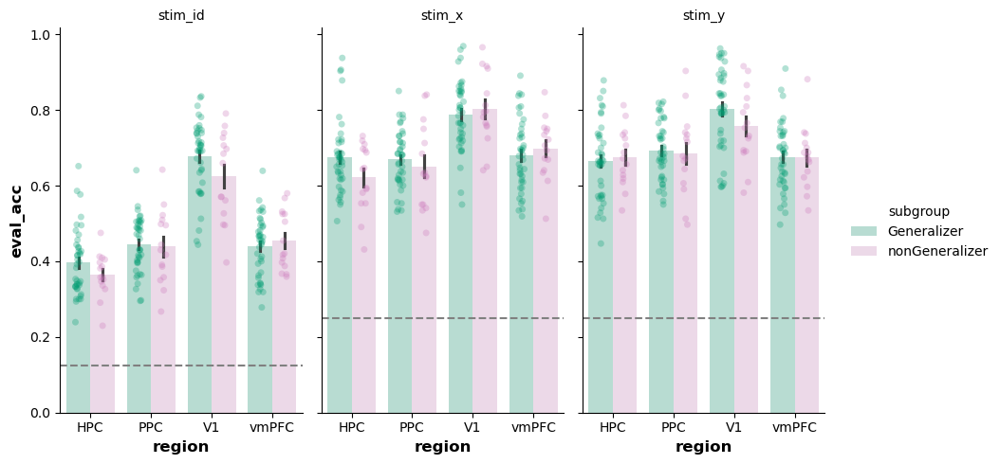

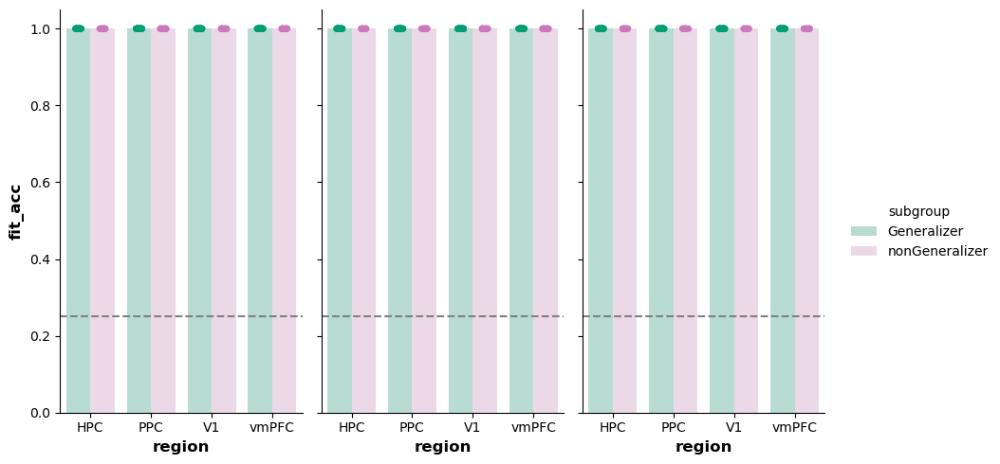

In [ ]:
gs = sns.catplot(data=nctrstimdc_performance_dfsum,
            x="region",y="eval_acc",
            hue="subgroup",palette=participantgrouphex,
            col="target",
            kind="bar",errorbar="se",alpha=0.3,aspect=0.6).set_titles("{col_name}")
for ax in gs.axes.flatten():
    ax.set_xlabel("region",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel(f"Decoding Accuracy of {ax.get_title()}",fontdict={"fontsize":12,"fontweight":"bold"})
    if "stim_id" in ax.get_title():
        ax.axhline(1/8,linestyle="--",color="grey",label="stim ID decoding chance level")
    else:
        ax.axhline(1/4,linestyle="--",color="grey",label="stim feature decoding chance level")
gs.map_dataframe(sns.stripplot,
                 x="region",y="eval_acc",alpha=0.3,
                hue="subgroup",palette=participantgrouphex,
                dodge=True)
#sns.move_legend(gs,loc="upper center", bbox_to_anchor=(0.5, 1), ncol=5)


gs = sns.catplot(data=nctrstimdc_performance_dfsum,
            x="region",y="fit_acc",
            hue="subgroup",palette=participantgrouphex,
            col="target",
            kind="bar",errorbar="se",alpha=0.3,aspect=0.6).set_titles("")
for ax in gs.axes.flatten():
    ax.set_xlabel("region",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("(Fitting) Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    if "stim_id" in ax.get_title():
        ax.axhline(1/8,linestyle="--",color="grey",label="stim ID decoding chance level")
    else:
        ax.axhline(1/4,linestyle="--",color="grey",label="stim feature decoding chance level")
gs.map_dataframe(sns.stripplot,
                 x="region",y="fit_acc",
                hue="subgroup",palette=participantgrouphex,
                dodge=True)
#sns.move_legend(gs,loc="upper center", bbox_to_anchor=(0.5, 1), ncol=5)


## correlation between dim and decoding

In [192]:
# correlation between decoding accuracy and dimensionality separately for each axis
nctrstimdc_performance_dfsum["target"] = pd.Categorical(nctrstimdc_performance_dfsum["target"],categories=["stim_id","stim_x","stim_y"],ordered=True)

training_feature_decoding = nctrstimdc_performance_df.query("target!='stim_id'").groupby(["roi","subid","target"])[["fit_acc","eval_acc"]].mean().reset_index()
training_feature_decoding["dimonaxis"] = training_feature_decoding["target"].map(dict(zip(['stim_x', 'stim_y'], ['x axis', 'y axis'])))
training_feature_decoding = training_feature_decoding.join(svdestdim_df_sum.set_index(["roi","subid","dimonaxis"]),on=["roi","subid","dimonaxis"],rsuffix="_svd")
training_feature_decoding.shape

(448, 15)

### separately for each axis

In [193]:
def partialrankcorr(data,x, y,covar, ax=None,**kwargs):
    res = pingouin.partial_corr(data=data, x=x,y=y,x_covar=covar,method="pearson",alternative="greater")
    rho,pval = res.r[0], res["p-val"][0]
    print(pval)
    ax = ax if ax is not None else plt.gca()
    if pval<=0.05:
        ax.annotate(r'$\rho$ = '+f'{rho:.3f}{gen_pval_annot(pval,show_pval=False)}', xy=(0.1, 0.9), xycoords=ax.transAxes,fontsize=12)
    else:
        ax.annotate(r'$\rho$ = '+f'{rho:.3f}', xy=(0.1, 0.9), xycoords=ax.transAxes,fontsize=12)


 x axis V1_bilateral partial correlation:
0.2945011204076635

 x axis PPC_bilateral partial correlation:
0.07580360978083167

 x axis HPC_bilateral partial correlation:
0.5816344223334994

 x axis vmPFC_bilateral partial correlation:
0.3457397636428129

 y axis V1_bilateral partial correlation:
0.5205529440758618

 y axis PPC_bilateral partial correlation:
0.7976619931233413

 y axis HPC_bilateral partial correlation:
0.49176452473854265

 y axis vmPFC_bilateral partial correlation:
0.45126810178590626


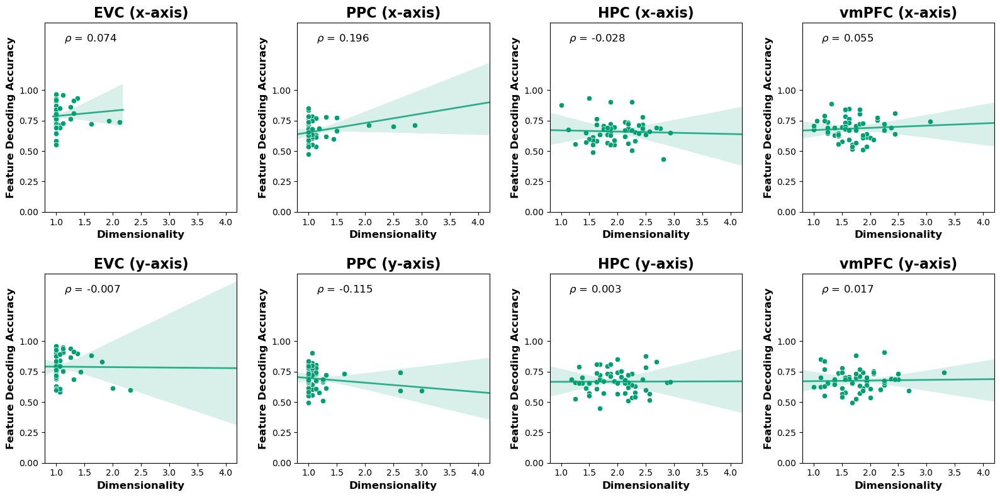

In [ ]:
fig, axes = plt.subplots(2,4,figsize=(16,8),
                         sharey=True,sharex=True)

for jrow,dimonaxis in enumerate(["x axis","y axis"]):
    for kcol,roi in enumerate(["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"]):
        dot_color = colors.hex2color(participantgrouphex["Generalizer"])
        pdf = training_feature_decoding.query("roi==@roi & dimonaxis==@dimonaxis").copy()
        ax = axes[jrow,kcol]
        
        sns.scatterplot(data=pdf.copy(),
                        x="est_dim",y="eval_acc",
                        #hue="subgroup",palette=participantgrouphex,
                        color=dot_color,label="Generalizer",
                        ax=ax)
        sns.regplot(data=pdf,
                    x="est_dim",y="eval_acc",
                    scatter=False,truncate=False,
                    #hue="subgroup",palette=participantgrouphex,
                    color=dot_color,
                    line_kws={"alpha":0.8,"linewidth":2},
                    x_partial="reconstruction_corr",
                    ci=95, n_boot=10000,
                    ax=ax)
        print(f"\n {dimonaxis} {roi} partial correlation pval:")
        partialrankcorr(pdf,"est_dim","eval_acc","reconstruction_corr",ax=ax)
        #print(f"{dimonaxis} {roi} correlation:")
        #print(scipy.stats.spearmanr(pdf["est_dim"],pdf["eval_acc"]))
        ax.legend_.remove()
        
        ax.set_title(f"{roi_shortnames[roi]} ({dimonaxis.replace(' ','-')})",fontdict=def_font_subplot_titles)   
        ax.set_xlim(.8,4.2)
        ax.set_yticks([0,0.25,0.5,0.75,1])

        #ax.tick_params(axis='both', which='both')
        ax.set_ylabel("Feature Decoding Accuracy",fontdict=def_font_axis_legend_titles)
        ax.set_xlabel("Dimensionality",fontdict=def_font_axis_legend_titles)
        ax.tick_params(labelleft=True, labelbottom=True)
        ax.xaxis.label.set_visible(True)
        ax.yaxis.label.set_visible(True)
        
fig.tight_layout(w_pad=2.5,h_pad=2)


 x axis V1_bilateral partial correlation:
0.3618427918249125

 x axis PPC_bilateral partial correlation:
0.0028396647386645397

 x axis HPC_bilateral partial correlation:
0.001018037111579133

 x axis vmPFC_bilateral partial correlation:
9.675993491484043e-07

 y axis V1_bilateral partial correlation:
0.1729966506001303

 y axis PPC_bilateral partial correlation:
0.8327222801698351

 y axis HPC_bilateral partial correlation:
0.000886879227718999

 y axis vmPFC_bilateral partial correlation:
0.009728478918468685


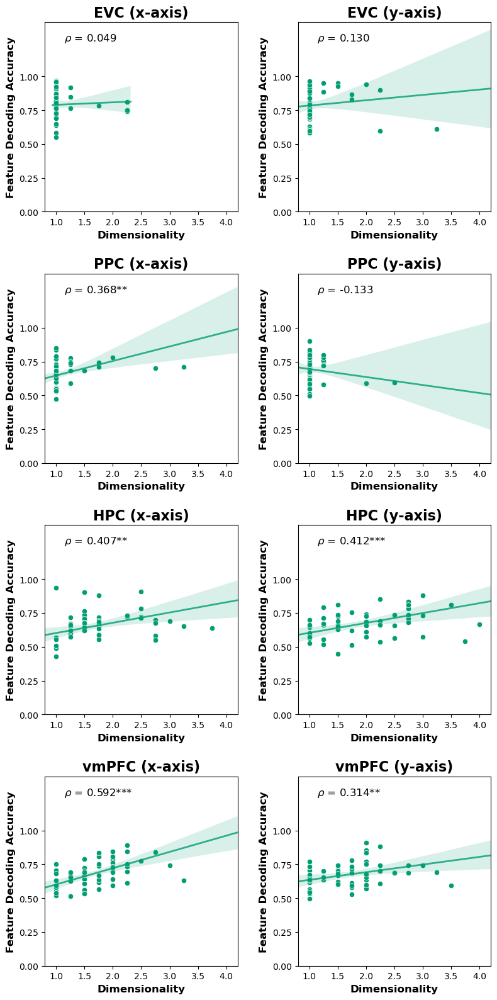

In [ ]:
fig, axes = plt.subplots(4,2,figsize=(8,16),
                         sharey=True,sharex=True)

for kcol,dimonaxis in enumerate(["x axis","y axis"]):
    for jrow,roi in enumerate(["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"]):
        dot_color = colors.hex2color(participantgrouphex["Generalizer"])
        pdf = training_feature_decoding.query("roi==@roi & dimonaxis==@dimonaxis").copy()
        ax = axes[jrow,kcol]
        
        sns.scatterplot(data=pdf.copy(),
                        x="est_dim",y="eval_acc",
                        #hue="subgroup",palette=participantgrouphex,
                        color=dot_color,label="Generalizer",
                        ax=ax)
        sns.regplot(data=pdf,
                    x="est_dim",y="eval_acc",
                    scatter=False,truncate=False,
                    #hue="subgroup",palette=participantgrouphex,
                    color=dot_color,
                    line_kws={"alpha":0.8,"linewidth":2},
                    x_partial="reconstruction_corr",
                    ci=95, n_boot=10000,
                    ax=ax)
        print(f"\n {dimonaxis} {roi} partial correlation:")
        partialrankcorr(pdf,"est_dim","eval_acc","reconstruction_corr",ax=ax)
        #print(f"{dimonaxis} {roi} correlation:")
        #print(scipy.stats.spearmanr(pdf["est_dim"],pdf["eval_acc"]))
        ax.legend_.remove()
        
        ax.set_title(f"{roi_shortnames[roi]} ({dimonaxis.replace(' ','-')})",fontdict=def_font_subplot_titles)   
        ax.set_xlim(.8,4.2)
        ax.set_yticks([0,0.25,0.5,0.75,1])

        #ax.tick_params(axis='both', which='both')
        ax.set_ylabel("Feature Decoding Accuracy",fontdict=def_font_axis_legend_titles)
        ax.set_xlabel("Dimensionality",fontdict=def_font_axis_legend_titles)
        ax.tick_params(labelleft=True, labelbottom=True)
        ax.xaxis.label.set_visible(True)
        ax.yaxis.label.set_visible(True)
        
fig.tight_layout(w_pad=2.5,h_pad=2)

### sum over axis

In [ ]:
training_feature_decoding_sumoveraxs = training_feature_decoding.groupby(["roi","subid"])[["fit_acc","eval_acc","est_dim","reconstruction_corr"]].mean().reset_index()
training_feature_decoding_sumoveraxs
training_feature_decoding_sumoveraxs["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in training_feature_decoding_sumoveraxs["subid"]]


0.01080827485654461


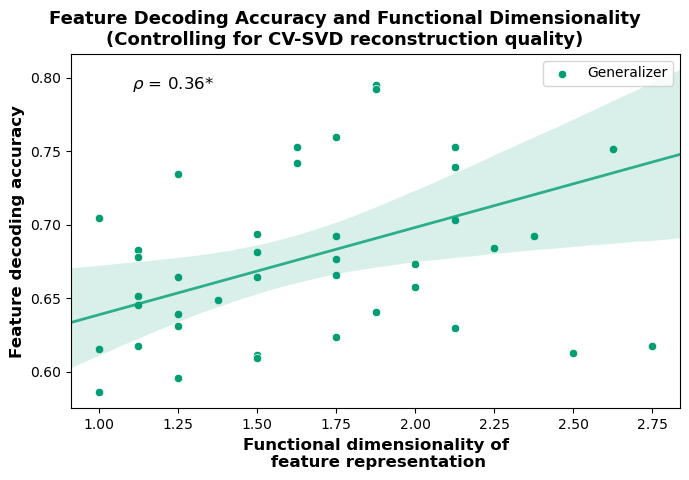

In [ ]:
pdf = training_feature_decoding_sumoveraxs[(training_feature_decoding_sumoveraxs.subgroup=="Generalizer")&(training_feature_decoding_sumoveraxs.roi==f"vmPFC_bilateral")].copy() #(training_feature_decoding.subgroup=="Generalizer")
dot_color=  colors.hex2color(participantgrouphex["Generalizer"])


def partialrankcorr(data,x, y,covar, ax=None,**kwargs):
    res = pingouin.partial_corr(data=data, x=x,y=y,x_covar=covar,method="pearson",alternative="greater")
    rho,pval = res.r[0], res["p-val"][0]
    print(pval)
    ax = ax if ax is not None else plt.gca()
    if pval<=0.05:
        ax.annotate(r'$\rho$ = '+f'{rho:.2f}{gen_pval_annot(pval,show_pval=False)}', xy=(0.1, 0.9), xycoords=ax.transAxes,fontsize=12)
    else:
        ax.annotate(r'$\rho$ = '+f'{rho:.2f}', xy=(0.1, 0.9), xycoords=ax.transAxes,fontsize=12)

fig, ax = plt.subplots(1,1,figsize=(7,5),
                         sharey=True,sharex=True)
    
sns.scatterplot(data=pdf.copy(),
                x="est_dim",y="eval_acc",
                #hue="subgroup",palette=participantgrouphex,
                color=dot_color,label="Generalizer",
                ax=ax)
sns.regplot(data=pdf,
            x="est_dim",y="eval_acc",
            scatter=False,truncate=False,
            #hue="subgroup",palette=participantgrouphex,
            color=dot_color,
            line_kws={"alpha":0.8,"linewidth":2},
            x_partial="reconstruction_corr",
            ci=95, n_boot=10000,
            ax=ax)
partialrankcorr(pdf,"est_dim","eval_acc","reconstruction_corr",ax=ax)

ax.tick_params(axis='both', which='both', labelsize=10,labelleft=True, labelbottom=True)
ax.set_ylabel("Feature decoding accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
ax.set_xlabel("Functional dimensionality of\n feature representation",fontdict={"fontsize":12,"fontweight":"bold"})

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles, labels=labels, title="")

fig.suptitle("Feature Decoding Accuracy and Functional Dimensionality\n(Controlling for CV-SVD reconstruction quality)",
                   fontsize=13,fontweight="bold",y=0.95)
fig.tight_layout()


# Composition

## Load data

In [279]:
retrivepat_res = load(os.path.join(ROIRSAdir,"retrievalpatternCV_rotated","resoverview","retrievalpatternCV_results.pkl"))


compositionretrieval_resdf = retrivepat_res["results"].copy()
compositionretrieval_resdf[["analysis","metricname"]] = compositionretrieval_resdf.metric.str.split("-",expand=True)
dsshortname={"rotated":"R","rotatedshuffle":"RS"}
compositionretrieval_resdf["anagroup"] = [x if ds=="orginal" else f"{dsshortname[ds]}{x}" for x,ds in compositionretrieval_resdf[['analysis','dataset']].to_numpy()]
compositionretrieval_resdf["region"] = [x.split("_")[0] for x in compositionretrieval_resdf.roi]

train2testencoding_resdf = compositionretrieval_resdf.query("anagroup=='train2test' and dataset=='orginal'").copy()
train2testencoding_resdf = train2testencoding_resdf.join(svdestdim_df_sum_overaxis.set_index(["roi","subid"]),on=["roi","subid"],rsuffix="_svd")
train2testencoding_resdf = train2testencoding_resdf[train2testencoding_resdf.roi.isin(rois)]
print(train2testencoding_resdf.metricname.unique())

compositionretrieval_resdf["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in compositionretrieval_resdf["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True    
)


['fit_corr_O2E' 'eval_corr_O2E' 'fit_corr_E2O' 'eval_corr_E2O' 'fit_r2'
 'eval_r2' 'fit_corr' 'eval_corr' 'reg_distmod' 'reg_percept'
 'compoweight_x' 'compoweight_y' 'compoweight' 'noncompoweight_x'
 'noncompoweight_y' 'noncompoweight' 'meanweightdiff' 'sumweightdiff']


c:\Users\liangz\miniconda3\envs\piratefmri\lib\site-packages\scipy\stats\_resampling.py:992: RuntimeWarning: overflow encountered in scalar power
  n_max = factorial(n_obs_sample)**n_samples


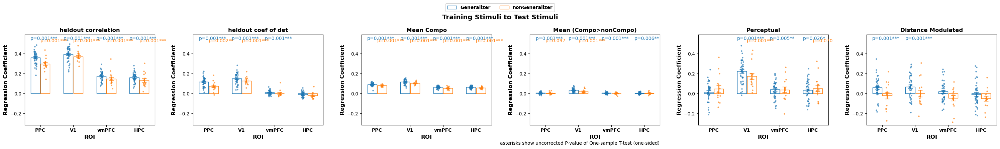

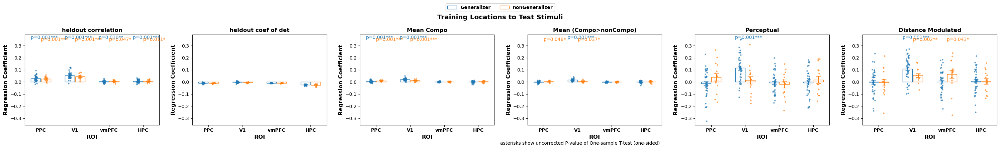

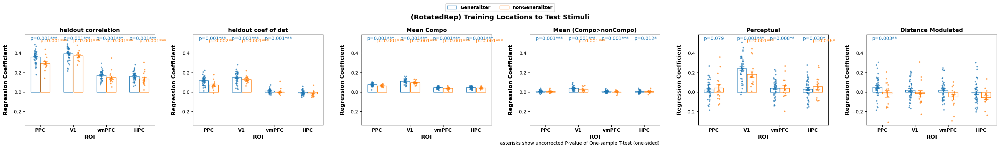

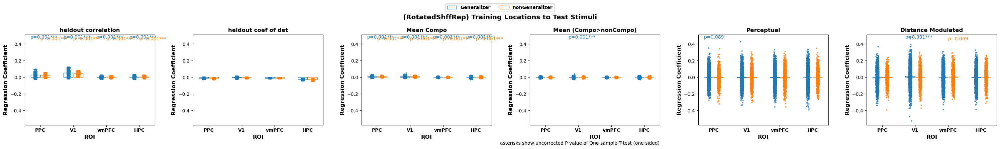

In [ ]:
xvar, gvar, yvar, yvartest = "region",  "subgroup", "value", "value"
plt_mts = ["eval_corr","eval_r2","compoweight","meanweightdiff","reg_percept","reg_distmod"]
facet_names = dict(zip(plt_mts,["heldout correlation","heldout coef of det","Mean Compo","Mean (Compo>nonCompo)","Perceptual", "Distance Modulated"]))
plt_ana = dict(zip(["train2test","loc2test"]+["Rloc2test","RSloc2test"], #,"loc2train","loc2test"
                   [
                    "Training Stimuli to Test Stimuli", 
                    #"Training Locations to Training Stimuli",
                    "Training Locations to Test Stimuli"
                   ]+[
                       "(RotatedRep) Training Locations to Test Stimuli",
                       "(RotatedShffRep) Training Locations to Test Stimuli"]))
for a, atitle in plt_ana.items():
    curr_pdf = compositionretrieval_resdf[(compositionretrieval_resdf.metricname.isin(plt_mts))&(compositionretrieval_resdf.anagroup==a)].copy()
    curr_pdf.metricname = pd.Categorical(curr_pdf.metricname,categories=plt_mts,ordered=True)
    curr_pdf[xvar] = pd.Categorical(curr_pdf[xvar],categories=curr_pdf[xvar].unique(),ordered=True)
    fig,axes = grouped_barscatter_withstats(curr_pdf,
                                facet_vars = "metricname", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                prows=1,pcols=len(plt_mts),
                                hrow=4,wcol=5,
                                statfunc=lambda yt: ttest1samp_equiv_permutation(yt,alternative="greater",n_perm=1000))
    for ifacet, _ in enumerate(axes.flatten()):
        axes.flatten()[ifacet].set_ylabel("Regression Coefficient",fontweight="bold",fontsize="large")
        axes.flatten()[ifacet].set_xlabel("ROI",fontweight="bold",fontsize="large")
        oldtitle = axes.flatten()[ifacet].title.get_text()
        axes.flatten()[ifacet].set_title(facet_names[oldtitle],fontweight="bold",fontsize="large")
        
    hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
    fig.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
            prop = dict(weight="bold"))
    fig.suptitle(f"{atitle}",fontweight="bold",fontsize="x-large")
    fig.text(x=0.5, y=0, s='asterisks show uncorrected P-value of One-sample T-test (one-sided)')
    fig.tight_layout()

c:\Users\liangz\miniconda3\envs\piratefmri\lib\site-packages\scipy\stats\_resampling.py:992: RuntimeWarning: overflow encountered in scalar power
  n_max = factorial(n_obs_sample)**n_samples


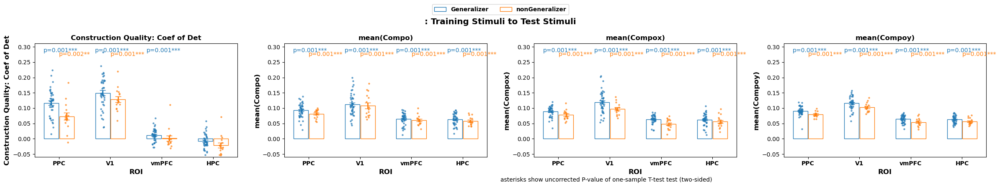

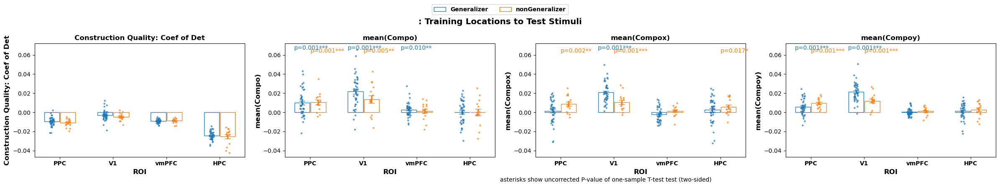

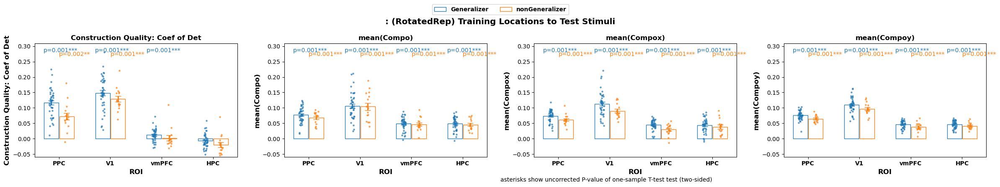

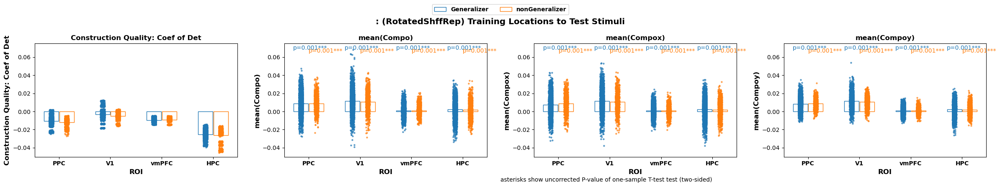

In [ ]:
# sanity check, see if coefficient of Compo is greater than zero, and if compo>noncompo
xvar, gvar, yvar, yvartest = "region",  "subgroup", "value", "value"
plt_mts = ["eval_r2","compoweight_x","compoweight_y","compoweight"] #"eval_corr",
facet_names = dict(zip(plt_mts,
                       ["Construction Quality: Coef of Det",# "Construction Quality: Cor",
                        "mean(Compo)", "mean(Compox)", "mean(Compoy)"]))
plt_ana = dict(zip(["train2test","loc2test"]+["Rloc2test","RSloc2test"],
                   ["Training Stimuli to Test Stimuli", #"Training Locations to Training Stimuli",
                     "Training Locations to Test Stimuli"]+[
                         "(RotatedRep) Training Locations to Test Stimuli",
                         "(RotatedShffRep) Training Locations to Test Stimuli"]))
sname,slist ="",subid_list
for a, atitle in plt_ana.items():
    curr_pdf = compositionretrieval_resdf[(compositionretrieval_resdf.metricname.isin(plt_mts))&(compositionretrieval_resdf.anagroup==a)&(compositionretrieval_resdf.subid.isin(slist))].copy()
    curr_pdf.metricname = pd.Categorical(curr_pdf.metricname,categories=plt_mts,ordered=True)
    curr_pdf[xvar] = pd.Categorical(curr_pdf[xvar],categories=curr_pdf[xvar].unique(),ordered=True)
    fig,axes = grouped_barscatter_withstats(curr_pdf,
                                facet_vars = "metricname", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                prows=1,pcols=len(plt_mts),
                                hrow=4,wcol=6,
                                statfunc=lambda yt: ttest1samp_equiv_permutation(yt,alternative="greater",n_perm=1000))
    for ifacet, _ in enumerate(axes.flatten()):
        oldtitle = axes.flatten()[ifacet].title.get_text()
        axes.flatten()[ifacet].set_ylabel(facet_names[oldtitle],fontweight="bold",fontsize="large")
        axes.flatten()[ifacet].set_xlabel("ROI",fontweight="bold",fontsize="large")
        axes.flatten()[ifacet].set_title(facet_names[oldtitle],fontweight="bold",fontsize="large")
        
    hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
    fig.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
            prop = dict(weight="bold"))
    fig.suptitle(f"{sname}: {atitle}",fontweight="bold",fontsize="x-large")
    fig.text(x=0.5, y=0, s='asterisks show uncorrected P-value of one-sample T-test test (two-sided)')
    fig.tight_layout()


c:\Users\liangz\miniconda3\envs\piratefmri\lib\site-packages\scipy\stats\_resampling.py:992: RuntimeWarning: overflow encountered in scalar power
  n_max = factorial(n_obs_sample)**n_samples


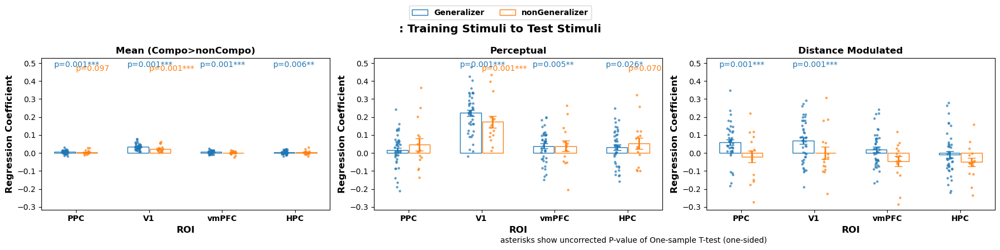

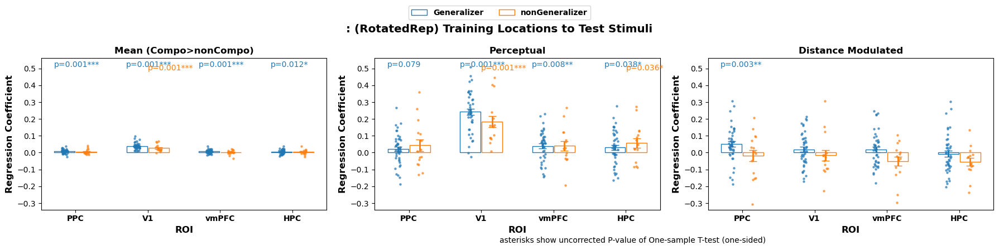

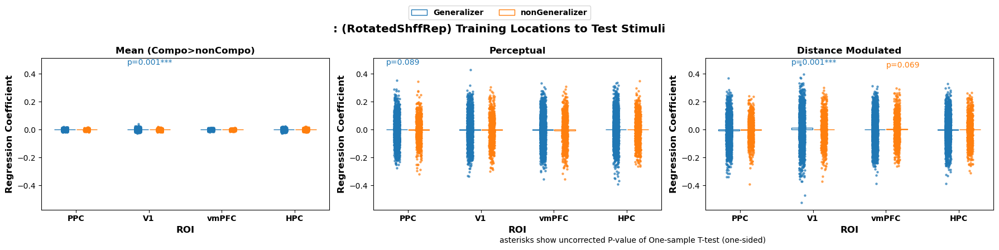

In [ ]:
xvar, gvar, yvar, yvartest = "region",  "subgroup", "value", "value"
plt_mts = ["meanweightdiff","reg_percept","reg_distmod"]
facet_names = dict(zip(plt_mts,["Mean (Compo>nonCompo)","Perceptual", "Distance Modulated"]))
plt_ana = dict(zip(["train2test"]+["Rloc2test","RSloc2test"], #,"loc2train","loc2test"
                   ["Training Stimuli to Test Stimuli"#, 
                    #"Training Locations to Training Stimuli",
                    #"Training Locations to Test Stimuli"
                   ]+[
                       "(RotatedRep) Training Locations to Test Stimuli",
                       "(RotatedShffRep) Training Locations to Test Stimuli"]))
for a, atitle in plt_ana.items():
    curr_pdf = compositionretrieval_resdf[(compositionretrieval_resdf.metricname.isin(plt_mts))&(compositionretrieval_resdf.anagroup==a)&(compositionretrieval_resdf.subid.isin(slist))].copy()
    curr_pdf.metricname = pd.Categorical(curr_pdf.metricname,categories=plt_mts,ordered=True)
    curr_pdf[xvar] = pd.Categorical(curr_pdf[xvar],categories=curr_pdf[xvar].unique(),ordered=True)
    fig,axes = grouped_barscatter_withstats(curr_pdf,
                                facet_vars = "metricname", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                prows=1,pcols=len(plt_mts),
                                hrow=4,wcol=6,
                                statfunc=lambda yt: ttest1samp_equiv_permutation(yt,alternative="greater",n_perm=1000))
    for ifacet, _ in enumerate(axes.flatten()):
        axes.flatten()[ifacet].set_ylabel("Regression Coefficient",fontweight="bold",fontsize="large")
        axes.flatten()[ifacet].set_xlabel("ROI",fontweight="bold",fontsize="large")
        oldtitle = axes.flatten()[ifacet].title.get_text()
        axes.flatten()[ifacet].set_title(facet_names[oldtitle],fontweight="bold",fontsize="large")
        
    hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
    fig.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
            prop = dict(weight="bold"))
    fig.suptitle(f"{sname}: {atitle}",fontweight="bold",fontsize="x-large")
    fig.text(x=0.5, y=0, s='asterisks show uncorrected P-value of One-sample T-test (one-sided)')
    fig.tight_layout()

## plot example

In [277]:
from scipy.spatial.distance import cdist
from sklearn.linear_model import LinearRegression
config_locrep  = np.array(list(itertools.product([-2,-1,1,2],[-2,-1,1,2])))
compo_locrep   = np.vstack([list(itertools.product([-2,-1,1,2],[0])),
                           list(itertools.product([0],[-2,-1,1,2]))])
compo_locrep

percept_reg_coefs = cdist(config_locrep, compo_locrep, lambda u,v: sum(u==v))
dist_mod_reg_coefs = LinearRegression(fit_intercept=False,positive=False).fit(compo_locrep.T, config_locrep.T).coef_


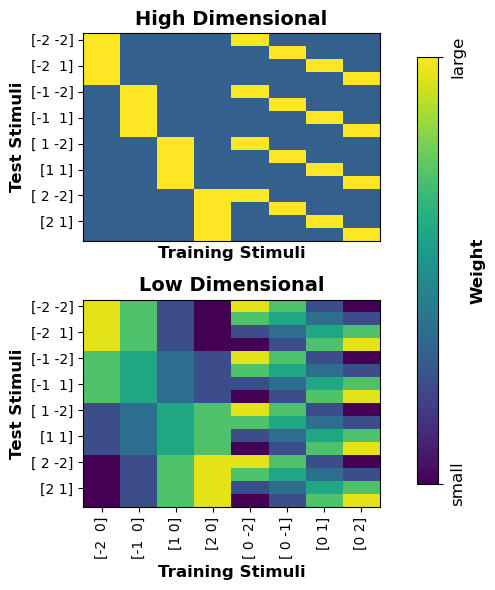

In [278]:
stim_df = roi_data["V1_bilateral"][0]["stimdf"].copy()
test_df = stim_df[stim_df.stim_group==0].copy().reset_index(drop=True)
training_df = stim_df[stim_df.stim_group==1].copy().reset_index(drop=True)
training_df.sort_values(by=["training_axset","training_axlocTL"],inplace=True)
allylabs = (test_df[test_df.stim_session==0].copy()[["stim_x","stim_y"]].to_numpy()*2).astype(int)
allxlabs = (training_df[training_df.stim_session==0].copy()[["stim_x","stim_y"]].to_numpy()*2).astype(int)
xticksat = np.arange(0,8,1)
yticksat = np.arange(0,16,2)

def rescale_mat(mat,newmin=0,newmax=1):
    mat = np.array(mat)
    omin,omax = mat.min(),mat.max()
    return (mat-omin)/(omax-omin)*(newmax-newmin)+newmin

roi = "V1_bilateral"
ana="train2test"
fig,axes = plt.subplots(2,1,figsize=(4.5,6))
pmodel = scale_feature(percept_reg_coefs,2)
dmodel = scale_feature(dist_mod_reg_coefs,2)

# create a single norm to be shared across all images
norm = colors.Normalize(vmin=np.min([pmodel,dmodel]), vmax=np.max([pmodel,dmodel]))

im1 = axes[0].imshow(pmodel,cmap="viridis",norm=norm)
axes[0].set_title(f"High Dimensional",fontweight="bold",fontsize=14) # \n(High dimensional)
im2 = axes[1].imshow(dmodel,cmap="viridis",norm=norm)
axes[1].set_title(f"Low Dimensional",fontweight="bold",fontsize=14) #\n(Low dimensional)
 

for ax,im in zip(axes.flatten(),[im1,im2]):
    ax.set_xticks(xticksat)
    ax.set_yticks(yticksat)
    ax.set_xticklabels(allxlabs[xticksat],rotation=90,**def_font_axis_tick_labels)
    ax.set_yticklabels(allylabs[yticksat],rotation=0,**def_font_axis_tick_labels)
    ax.set_xlabel("Training Stimuli",**def_font_axis_legend_titles)
    ax.set_ylabel("Test Stimuli",**def_font_axis_legend_titles)
    ax.set_aspect(.35)
    #cb =fig.colorbar(im, orientation="horizontal", pad = 0.2)
    #cb.set_label(label='Average Weight',weight='bold')
axes[0].set_xticks([])
#divider = make_axes_locatable(ax)
#cax = divider.new_vertical(size='5%', pad=0.05, pack_start = True)
#fig.add_axes(cax)
#fig.colorbar(im, cax = cax, orientation = 'horizontal')

fig.tight_layout()

#fig.suptitle("Retrieval Patterns",y=1,**def_font_subplot_titles)
cb =fig.colorbar(im1, ax=axes,
                 orientation="vertical", 
                 location="right",
                 fraction = 0.1, shrink=.9,
                 pad=0.1)
cb.set_label(label='Weight',weight=def_font_axis_legend_titles["fontweight"],fontsize=def_font_axis_legend_titles["fontsize"])
cb.set_ticks(ticks=[np.min([pmodel,dmodel]), np.max([pmodel,dmodel])],
             labels=["small","large"],fontsize=def_font_axis_legend_titles["fontsize"],rotation=90,va="center")
cb.ax.yaxis.set_tick_params(pad=5)

#fig.tight_layout()


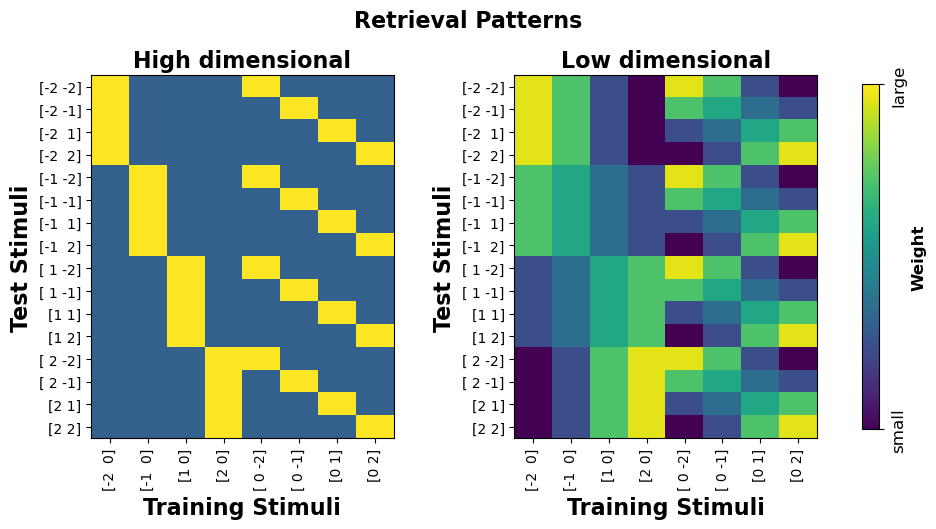

In [308]:
stim_df = roi_data["V1_bilateral"][0]["stimdf"].copy()
test_df = stim_df[stim_df.stim_group==0].copy().reset_index(drop=True)
training_df = stim_df[stim_df.stim_group==1].copy().reset_index(drop=True)
training_df.sort_values(by=["training_axset","training_axlocTL"],inplace=True)
allylabs = (test_df[test_df.stim_session==0].copy()[["stim_x","stim_y"]].to_numpy()*2).astype(int)
allxlabs = (training_df[training_df.stim_session==0].copy()[["stim_x","stim_y"]].to_numpy()*2).astype(int)
xticksat = np.arange(0,8,1)
yticksat = np.arange(0,16,1)

def rescale_mat(mat,newmin=0,newmax=1):
    mat = np.array(mat)
    omin,omax = mat.min(),mat.max()
    return (mat-omin)/(omax-omin)*(newmax-newmin)+newmin

roi = "V1_bilateral"
ana="train2test"
fig,axes = plt.subplots(1,2,figsize=(10,5))
pmodel = scale_feature(percept_reg_coefs,2)
dmodel = scale_feature(dist_mod_reg_coefs,2)

# create a single norm to be shared across all images
norm = colors.Normalize(vmin=np.min([pmodel,dmodel]), vmax=np.max([pmodel,dmodel]))

im1 = axes[0].imshow(pmodel,cmap="viridis",norm=norm)
axes[0].set_title(f"High dimensional",**def_font_subplot_titles)
im2 = axes[1].imshow(dmodel,cmap="viridis",norm=norm)
axes[1].set_title(f"Low dimensional",**def_font_subplot_titles)
 

for ax,im in zip(axes.flatten(),[im1,im2]):
    ax.set_xticks(xticksat)
    ax.set_yticks(yticksat)
    ax.set_xticklabels(allxlabs[xticksat],rotation=90,**def_font_axis_tick_labels)
    ax.set_yticklabels(allylabs[yticksat],rotation=0,**def_font_axis_tick_labels)
    ax.set_xlabel("Training Stimuli",**def_font_subplot_titles)
    ax.set_ylabel("Test Stimuli",**def_font_subplot_titles)
    ax.set_aspect(0.6)
    #cb =fig.colorbar(im, orientation="horizontal", pad = 0.2)
    #cb.set_label(label='Average Weight',weight='bold')

#divider = make_axes_locatable(ax)
#cax = divider.new_vertical(size='5%', pad=0.05, pack_start = True)
#fig.add_axes(cax)
#fig.colorbar(im, cax = cax, orientation = 'horizontal')

fig.tight_layout(w_pad=3)

fig.suptitle("Retrieval Patterns",y=1.05,**def_font_subplot_titles)
cb =fig.colorbar(im1, ax=axes,orientation="vertical", fraction = 0.1, shrink=.95)
cb.set_label(label='Weight',weight=def_font_axis_legend_titles["fontweight"],fontsize=def_font_axis_legend_titles["fontsize"])
cb.set_ticks(ticks=[np.min([pmodel,dmodel]), np.max([pmodel,dmodel])],
             labels=["small","large"],fontsize=def_font_axis_legend_titles["fontsize"],rotation=90,va="center")
cb.ax.yaxis.set_tick_params(pad=5)

#fig.tight_layout()


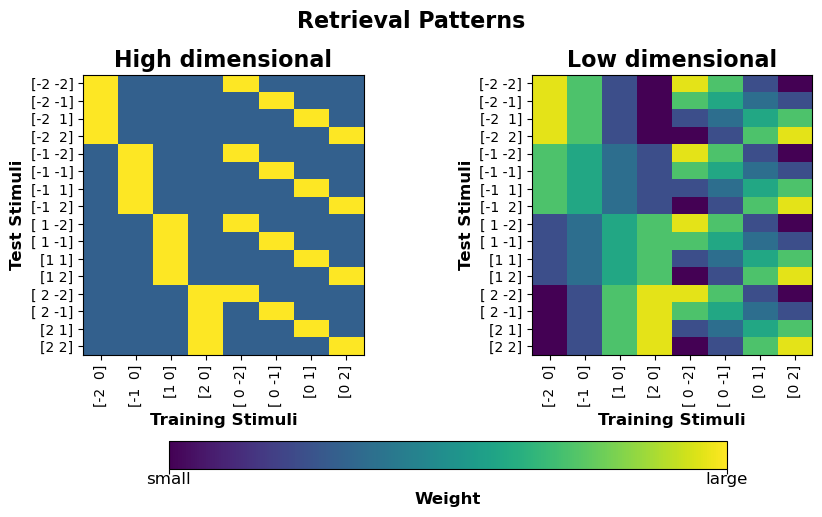

In [301]:
stim_df = roi_data["V1_bilateral"][0]["stimdf"].copy()
test_df = stim_df[stim_df.stim_group==0].copy().reset_index(drop=True)
training_df = stim_df[stim_df.stim_group==1].copy().reset_index(drop=True)
training_df.sort_values(by=["training_axset","training_axlocTL"],inplace=True)
allylabs = (test_df[test_df.stim_session==0].copy()[["stim_x","stim_y"]].to_numpy()*2).astype(int)
allxlabs = (training_df[training_df.stim_session==0].copy()[["stim_x","stim_y"]].to_numpy()*2).astype(int)
xticksat = np.arange(0,8,1)
yticksat = np.arange(0,16,1)

def rescale_mat(mat,newmin=0,newmax=1):
    mat = np.array(mat)
    omin,omax = mat.min(),mat.max()
    return (mat-omin)/(omax-omin)*(newmax-newmin)+newmin

roi = "V1_bilateral"
ana="train2test"
fig,axes = plt.subplots(1,2,figsize=(9,5))
pmodel = scale_feature(percept_reg_coefs,2)
dmodel = scale_feature(dist_mod_reg_coefs,2)

# create a single norm to be shared across all images
norm = colors.Normalize(vmin=np.min([pmodel,dmodel]), vmax=np.max([pmodel,dmodel]))

im1 = axes[0].imshow(pmodel,cmap="viridis",norm=norm)
axes[0].set_title(f"High dimensional",**def_font_subplot_titles)
im2 = axes[1].imshow(dmodel,cmap="viridis",norm=norm)
axes[1].set_title(f"Low dimensional",**def_font_subplot_titles)
 

for ax,im in zip(axes.flatten(),[im1,im2]):
    ax.set_xticks(xticksat)
    ax.set_yticks(yticksat)
    ax.set_xticklabels(allxlabs[xticksat],rotation=90,**def_font_axis_tick_labels)
    ax.set_yticklabels(allylabs[yticksat],rotation=0,**def_font_axis_tick_labels)
    ax.set_xlabel("Training Stimuli",**def_font_axis_legend_titles)
    ax.set_ylabel("Test Stimuli",**def_font_axis_legend_titles)
    ax.set_aspect(0.5)
    #cb =fig.colorbar(im, orientation="horizontal", pad = 0.2)
    #cb.set_label(label='Average Weight',weight='bold')

#divider = make_axes_locatable(ax)
#cax = divider.new_vertical(size='5%', pad=0.05, pack_start = True)
#fig.add_axes(cax)
#fig.colorbar(im, cax = cax, orientation = 'horizontal')

fig.tight_layout(w_pad=2)

fig.suptitle("Retrieval Patterns",y=1.1,**def_font_subplot_titles)
cb =fig.colorbar(im1, ax=axes,
                 orientation="horizontal", 
                 location="bottom",
                 fraction = 0.15, shrink=0.7,
                 pad=0.2)
cb.set_label(label='Weight',weight=def_font_axis_legend_titles["fontweight"],fontsize=def_font_axis_legend_titles["fontsize"])
cb.set_ticks(ticks=[np.min([pmodel,dmodel]), np.max([pmodel,dmodel])],
             labels=["small","large"],fontsize=def_font_axis_legend_titles["fontsize"],rotation=0,va="center")
cb.ax.yaxis.set_tick_params(pad=5)

#fig.tight_layout()


## plot for each region

In [ ]:
def_font_axis_legend_titles
def_font_axis_tick_labels
def_font_subplot_titles

In [ ]:
'%.3f' % tardf.value.values.mean()

'-0.046'

#### only plot compositional regions

In [281]:

compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.subid.isin(generalizers))].copy() # &

##### plot as swarmplots and group mean 

In [ ]:
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['eval_r2']))].copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],ordered=True)
pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"eval_r2":"Coefficient of Determination"}),
    categories=["Coefficient of Determination"],ordered=True
)
pdf=pdf[pdf.subgroup.isin(["Generalizer"])].copy()

gs = sns.catplot(data=pdf,
            x="roi",y="value",
            hue="subgroup",palette=participantgrouphex,
            kind="point",errorbar="se",alpha=1,dodge=False,capsize=.2,markersize=1.5, linestyle="none",#fill=False,
            #kind="violin",inner="box",fill=False,split=True,gap=0,cut=True,
            #inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=1.5,sharey=True,
            ).refline(y=0)
gs.map_dataframe(sns.swarmplot,x="roi",y="value",
                #s=4,
                hue="subgroup",palette=participantgrouphex,dodge=False,
                alpha=0.5)


for ax in gs.axes.flatten():
    axdf = pdf.copy()
    ax.set_ylabel("Coefficient of Determination",**def_font_axis_legend_titles)
    ax.set_xlabel('')    
    
    ax.set_xticks(np.arange(len(pdf.roi.cat.categories)),
                  labels=[roi_shortnames[roi] for roi in pdf.roi.cat.categories],
                  **def_font_axis_legend_titles)
    ax.set_ylim(axdf.value.values.min()-0.01,axdf.value.values.max()+0.04)
    plt.setp(ax.get_xticklabels(),
            rotation=0,ha="center",
            **def_font_axis_legend_titles)
    ax.tick_params(axis='x', which='major', pad=1)
            
    for j,(tar,tardf) in enumerate(axdf.groupby(["roi","subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.value.values,alternative="greater")
        print(f"{roi_shortnames[axdf.roi.values[0]]}  {tar}: mean = {'%.3f' % tardf.value.values.mean()}, p-value = {'%.3f' % pval}")
        dw = [-.3,0.15][minorplus]
        
        if tardf.value.values.mean()>0:
            ax.text(x=j-.2,y=ax.get_ylim()[1]*.9,
                    s=gen_pval_annot(pval,show_pval=False).replace("p=",""),size=18,fontweight="bold")
        
        ax.tick_params(labelleft=True, labelbottom=True)
        ax.xaxis.label.set_visible(True)
        ax.yaxis.label.set_visible(True)
        ax.spines["top"].set_visible(True)
        ax.spines["right"].set_visible(True)
#sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.9),ncol=2)
gs.legend.remove()
#gs.figure.suptitle("Prediction quality in held-out",y=0.95,x=0.5,**def_font_subplot_titles)
#gs.figure.set_size_inches(4,4)
gs.tight_layout()
#gs.figure.savefig(os.path.join(ROIRSAdir,"V1lowdim","V1_locteEncoding.png"),dpi=300)



PPC  ('V1_bilateral', 'Generalizer'): mean = 0.150, p-value = 0.000
PPC  ('PPC_bilateral', 'Generalizer'): mean = 0.117, p-value = 0.000
PPC  ('HPC_bilateral', 'Generalizer'): mean = -0.008, p-value = 0.983
PPC  ('vmPFC_bilateral', 'Generalizer'): mean = 0.012, p-value = 0.000


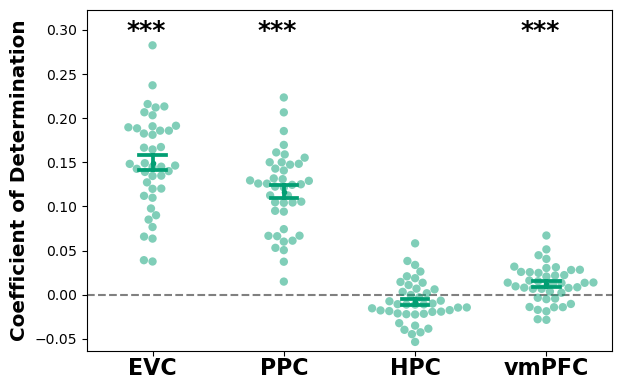

In [293]:

pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['eval_r2']))].copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],ordered=True)
pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"eval_r2":"Coefficient of Determination"}),
    categories=["Coefficient of Determination"],ordered=True
)
pdf=pdf[pdf.subgroup.isin(["Generalizer"])].copy()

gs = sns.catplot(data=pdf,
            x="roi",y="value",
            hue="subgroup",palette=participantgrouphex,
            kind="point",errorbar="se",alpha=1,dodge=False,capsize=.2,markersize=2, linestyle="none",#fill=False,
            #kind="violin",inner="box",fill=False,split=True,gap=0,cut=True,
            #inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=1.6,sharey=True,
            ).refline(y=0)
gs.map_dataframe(sns.swarmplot,x="roi",y="value",
                s=6,
                hue="subgroup",palette=participantgrouphex,dodge=False,
                alpha=0.5)


for ax in gs.axes.flatten():
    axdf = pdf.copy()
    ax.set_ylabel("Coefficient of Determination",fontweight="bold",fontsize=def_font_subplot_titles["fontsize"]*.9)
    ax.set_xlabel('')    
    
    ax.set_xticks(np.arange(len(pdf.roi.cat.categories)),
                  labels=[roi_shortnames[roi] for roi in pdf.roi.cat.categories],
                  **def_font_axis_legend_titles)
    ax.set_ylim(axdf.value.values.min()-0.01,axdf.value.values.max()+0.04)
    plt.setp(ax.get_xticklabels(),
            rotation=0,ha="center",
            **def_font_subplot_titles)
    ax.tick_params(axis='x', which='major', pad=1)
            
    for j,(tar,tardf) in enumerate(axdf.groupby(["roi","subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.value.values,alternative="greater")
        print(f"{roi_shortnames[axdf.roi.values[0]]}  {tar}: mean = {'%.3f' % tardf.value.values.mean()}, p-value = {'%.3f' % pval}")
        dw = [-.3,0.15][minorplus]
        
        if tardf.value.values.mean()>0:
            ax.text(x=j-.2,y=ax.get_ylim()[1]*.9,
                    s=gen_pval_annot(pval,show_pval=False).replace("p=",""),size=18,fontweight="bold")
        
        ax.tick_params(labelleft=True, labelbottom=True)
        ax.xaxis.label.set_visible(True)
        ax.yaxis.label.set_visible(True)
        ax.spines["top"].set_visible(True)
        ax.spines["right"].set_visible(True)
#sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.9),ncol=2)
gs.legend.remove()
#gs.figure.suptitle("Prediction quality in held-out",y=0.95,x=0.5,**def_font_subplot_titles)
#gs.figure.set_size_inches(4,4)
gs.tight_layout()
#gs.figure.savefig(os.path.join(ROIRSAdir,"V1lowdim","V1_locteEncoding.png"),dpi=300)







EVC - ('$\\beta_{High Dimensional}$', 'Generalizer'): mean = 0.222, p-value = 0.000
EVC - ('$\\beta_{Low Dimensional}$', 'Generalizer'): mean = 0.067, p-value = 0.001
PPC - ('$\\beta_{High Dimensional}$', 'Generalizer'): mean = 0.015, p-value = 0.314
PPC - ('$\\beta_{Low Dimensional}$', 'Generalizer'): mean = 0.059, p-value = 0.001
vmPFC - ('$\\beta_{High Dimensional}$', 'Generalizer'): mean = 0.039, p-value = 0.008
vmPFC - ('$\\beta_{Low Dimensional}$', 'Generalizer'): mean = 0.019, p-value = 0.223


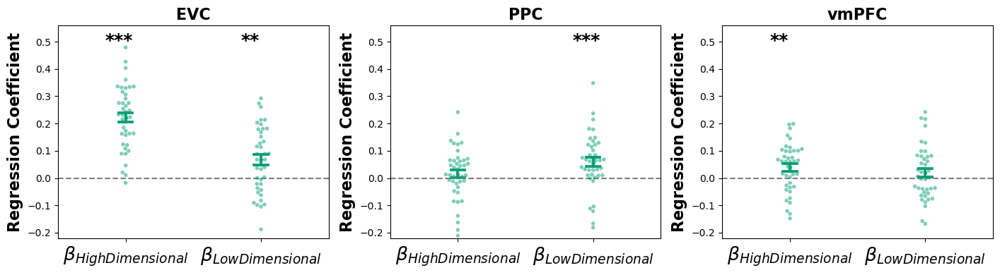

In [299]:
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['reg_distmod','reg_percept']))].copy()
pdf = pdf.query("roi in ['V1_bilateral','PPC_bilateral','vmPFC_bilateral']").copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral","vmPFC_bilateral"],ordered=True)

pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"reg_distmod":r'$\beta_{Low Dimensional}$',"reg_percept":r'$\beta_{High Dimensional}$'}),
    categories=[r'$\beta_{High Dimensional}$',r'$\beta_{Low Dimensional}$'],ordered=True
)

gs = sns.catplot(data=pdf,
            x="metricname",y="value",
            col="roi",
            hue="subgroup",palette=participantgrouphex,
            kind="point",errorbar="se",alpha=1,capsize=.1,dodge=False,markersize=1.5, linestyle="none",#fill=False,
            #kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
            #inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=1.2
            ).refline(y=0).set_titles("{col_name}")
gs.map_dataframe(sns.swarmplot,x="metricname",y="value",
                hue="subgroup",palette=participantgrouphex,dodge=False,
                alpha=0.5,s=4
                )


for ax in gs.axes.flatten():
    axdf = pdf[pdf.roi==ax.title.get_text()]
    ax.set_title(roi_shortnames[axdf.roi.values[0]],**def_font_subplot_titles)

    ax.set_ylim(pdf.value.values.min()-0.01,pdf.value.values.max()+0.08)
    ax.set_ylabel("Regression Coefficient",**def_font_subplot_titles)
    ax.set_xlabel("")
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=def_font_subplot_titles["fontsize"]*1.2,)
    for j,(tar,tardf) in enumerate(axdf.groupby(["metricname","subgroup"])):
        
        pval = ttest1samp_equiv_permutation(tardf.value.values)
        print(f"{roi_shortnames[axdf.roi.values[0]]} - {tar}: mean = {'%.3f' % tardf.value.values.mean()}, p-value = {'%.3f' % pval}")
        minorplus = 1*((j%2)==1)
        dw = [-.3,0.15][minorplus]
        
        ax.text(x=j-.15,y=1.01*pdf.value.max(),
                s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=18,fontweight="bold")
        
        
        ax.tick_params(labelleft=True, labelbottom=True)
        ax.xaxis.label.set_visible(True)
        ax.yaxis.label.set_visible(True)
        ax.spines["top"].set_visible(True)
        ax.spines["right"].set_visible(True)
    
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test two-sided)')
#sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.85),ncol=1,title="",prop={'size': 12})
#gs.figure.suptitle("Correspondence with\n Model Retrieval Patterns",fontweight="bold",fontsize=14,y=1.05,x=0.4)
gs.legend.remove()
#gs.figure.suptitle("Correspondence with Model Retrieval Patterns",y=0.95,x=0.5,**def_font_subplot_titles)
gs.tight_layout()

##### plot as bivariate correlation or distribution

vmPFC - low D reg_distmod: mean = 0.067, p-value = 0.001
vmPFC - low D reg_distmod: mean = 0.059, p-value = 0.001
vmPFC - low D reg_distmod: mean = 0.019, p-value = 0.223


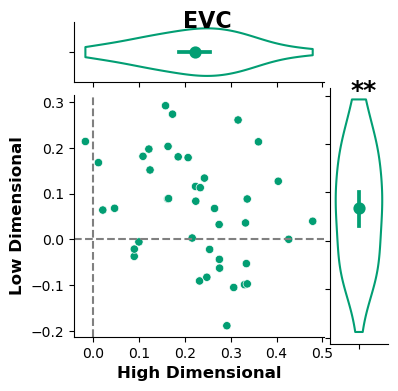

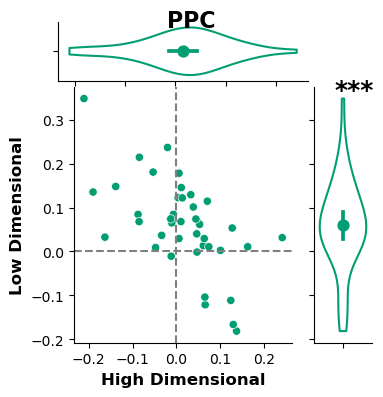

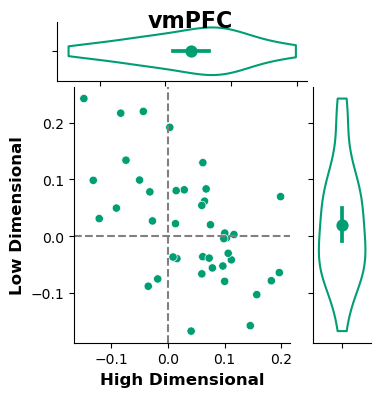

In [ ]:
# JointPlot with correlation and group average of regression coefficients
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['reg_distmod','reg_percept']))].copy()
pdf = pdf.query("roi in ['V1_bilateral','PPC_bilateral','vmPFC_bilateral']").copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral","vmPFC_bilateral"],ordered=True)

pdf_wide = pdf.pivot_table(index=["roi","subgroup","subid"],columns="metricname",values="value").reset_index()
pdf_wide
for roi in pdf.roi.cat.categories:
    facet_df = pdf_wide.loc[pdf_wide.roi==roi].copy() 
    gs = sns.JointGrid(data=facet_df, x="reg_percept", y="reg_distmod",
                        marginal_ticks=True,ratio=4,space=0.1,height=4)
        
        
    sns.scatterplot(facet_df,
                    x="reg_percept", y="reg_distmod",
                    hue="subgroup",palette=participantgrouphex,
                    ax=gs.ax_joint
                    )
    gs.ax_joint.axhline(0,linestyle="--",color="grey")
    gs.ax_joint.axvline(0,linestyle="--",color="grey")
    gs.ax_joint.set_aspect(1)

    # plot on x
    gs.ax_joint.set_xlabel("High Dimensional",fontdict=def_font_axis_legend_titles)
    sns.violinplot(x="reg_percept", 
                 hue="subgroup",palette=participantgrouphex,
                 ax=gs.ax_marg_x,
                 fill=False,inner=None,dodge=False,cut=0,
                 data=facet_df)
    sns.pointplot(x="reg_percept", 
                 hue="subgroup",palette=participantgrouphex,
                 ax=gs.ax_marg_x,
                 data=facet_df)
    
    # plot on y
    gs.ax_joint.set_ylabel("Low Dimensional",fontdict=def_font_axis_legend_titles)
    sns.violinplot(y="reg_distmod", 
                 hue="subgroup",palette=participantgrouphex,
                 ax=gs.ax_marg_y,
                 fill=False,inner=None,dodge=False,cut=0,
                 data=facet_df)
    sns.pointplot(y="reg_distmod", 
                 hue="subgroup",palette=participantgrouphex,
                 ax=gs.ax_marg_y,
                 data=facet_df)
    pval = ttest1samp_equiv_permutation(facet_df.reg_distmod.values)
    print(f"{roi_shortnames[axdf.roi.values[0]]} - low D reg_distmod: mean = {'%.3f' % facet_df.reg_distmod.values.mean()}, p-value = {'%.3f' % pval}")        
    gs.ax_marg_y.text(x=0-.15,y=1.01*facet_df.reg_distmod.values.max(),
            s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
            size=18,fontweight="bold")
    
    

    gs.ax_marg_y.legend().remove()
    gs.ax_marg_x.legend().remove()
    gs.ax_joint.legend().remove()

    gs.figure.suptitle(f"{roi_shortnames[roi]}",**def_font_subplot_titles)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


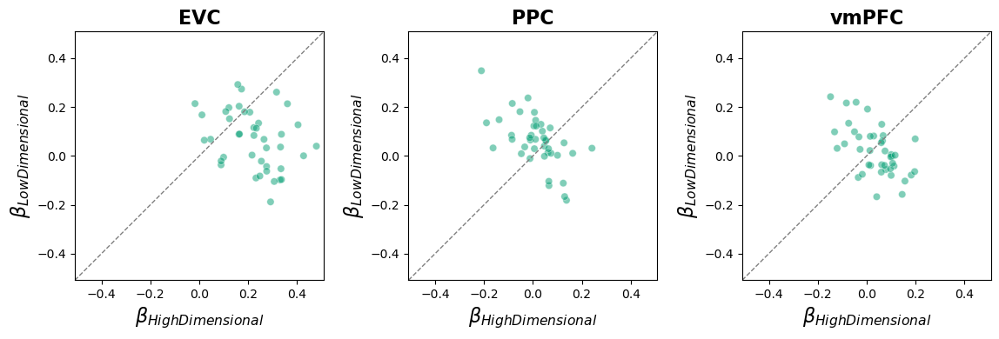

In [ ]:
# correlation plots with the two regression coefficients
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['reg_distmod','reg_percept']))].copy()
pdf = pdf.query("roi in ['V1_bilateral','PPC_bilateral','vmPFC_bilateral']").copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral","vmPFC_bilateral"],ordered=True)

pdf_wide = pdf.pivot_table(index=["roi","subgroup","subid"],columns="metricname",values="value").reset_index()
gs = sns.relplot(data=pdf_wide, x="reg_percept", y="reg_distmod",
                 hue="subgroup",palette=participantgrouphex,
                 col="roi",alpha=.5,
                 kind="scatter",height=4).set_titles("{col_name}")#.refline(y=0, linestyle='--', linewidth=1).refline(x=0, linestyle='--', linewidth=1)
        
axlim = np.max(
    [pdf_wide.reg_percept.values.max(),pdf_wide.reg_distmod.values.max(),
     np.abs(pdf_wide.reg_percept.values.min()),np.abs(pdf_wide.reg_distmod.values.min())]
)+.03
gs.legend.remove()
for ax in gs.axes.flatten():
    roi = ax.title.get_text()
    facet_df = pdf_wide.loc[pdf_wide.roi==roi].copy()
    ax.set_aspect(1)

    ax.legend().remove()
    ax.set_title(f"{roi_shortnames[roi]}",**def_font_subplot_titles)

    ax.set_xlabel(r'$\beta_{High Dimensional}$',fontdict=def_font_subplot_titles)
    ax.set_ylabel(r'$\beta_{Low Dimensional}$',fontdict=def_font_subplot_titles)

    ax.plot([-axlim,axlim], [-axlim,axlim], color='grey', linestyle='--', linewidth=1)

    ax.set_xlim(-axlim,axlim)
    ax.set_ylim(-axlim,axlim)

    ax.spines["top"].set_visible(True)
    ax.spines["right"].set_visible(True)

    ax.tick_params(labelleft=True, labelbottom=True)
    ax.xaxis.label.set_visible(True)
    ax.yaxis.label.set_visible(True)

gs.tight_layout()

EVC 1
EVC 2
EVC 3


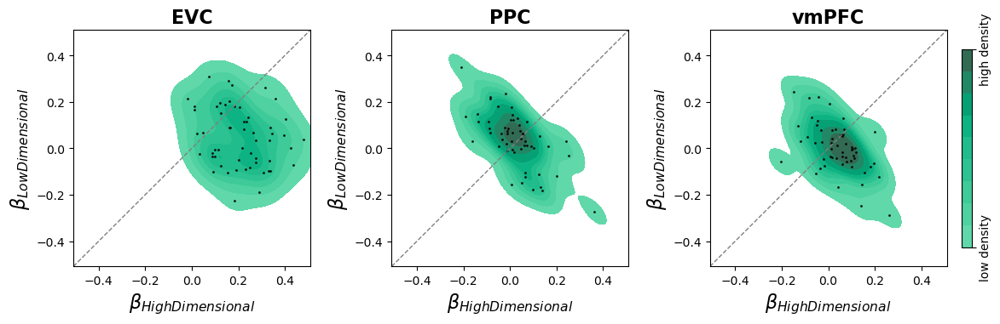

In [150]:
# 2D-KDE plots with the two regression coefficients
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['reg_distmod','reg_percept']))].copy()
pdf = pdf.query("roi in ['V1_bilateral','PPC_bilateral','vmPFC_bilateral']").copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral","vmPFC_bilateral"],ordered=True)

pdf_wide = pdf.pivot_table(index=["roi","subgroup","subid"],columns="metricname",values="value").reset_index()
gs = sns.displot(data=pdf_wide, x="reg_percept", y="reg_distmod",
                 #hue="subgroup",palette=participantgrouphex,
                 color=participantgrouphex["Generalizer"],
                 col="roi",fill=True,alpha=1,
                 cbar=True,common_norm=True,levels=10,
                 cbar_kws={"label": "Density","shrink": 0.7},
                 kind="kde",height=4).set_titles("{col_name}")#.refline(y=0, linestyle='--', linewidth=1).refline(x=0, linestyle='--', linewidth=1)
gs.map_dataframe(sns.scatterplot,
                 x="reg_percept", y="reg_distmod",
                #hue="subgroup",palette=participantgrouphex,
                color="black",#participantgrouphex["Generalizer"],
                alpha=0.9,
                edgecolor=None,linewidth=0,marker="o",
                s=4
                )
        
axlim = np.max(
    [pdf_wide.reg_percept.values.max(),pdf_wide.reg_distmod.values.max(),
     np.abs(pdf_wide.reg_percept.values.min()),np.abs(pdf_wide.reg_distmod.values.min())]
)+.03

for ax in gs.axes.flatten():
    roi = ax.title.get_text()
    facet_df = pdf_wide.loc[pdf_wide.roi==roi].copy()

    # sns.scatterplot(facet_df,
    #                 x="reg_percept", y="reg_distmod",
    #                 hue="subgroup",palette=participantgrouphex,
    #                 ax=ax,alpha=.5,edgecolor=None,linewidth=0,marker="o",#s=2
    #                 )
    ax.set_aspect(1)

    ax.set_title(f"{roi_shortnames[roi]}",**def_font_subplot_titles)

    ax.set_xlabel(r'$\beta_{High Dimensional}$',fontdict=def_font_subplot_titles)
    ax.set_ylabel(r'$\beta_{Low Dimensional}$',fontdict=def_font_subplot_titles)

    ax.plot([-axlim,axlim], [-axlim,axlim], color='grey', linestyle='--', linewidth=1)

    ax.set_xlim(-axlim,axlim)
    ax.set_ylim(-axlim,axlim)

    ax.spines["top"].set_visible(True)
    ax.spines["right"].set_visible(True)

    ax.tick_params(labelleft=True, labelbottom=True)
    ax.xaxis.label.set_visible(True)
    ax.yaxis.label.set_visible(True)
    
    cbcounter=0
    for cb_ax in gs.figure.axes:
        if cb_ax is not ax and cb_ax.get_ylabel() == 'Density':
            cbcounter+=1
            cmin,cmax = cb_ax.get_ylim()
            # set cbar ticks
            cb_ax.set_yticks([cmin, cmax])
            #cb_ax.set_yticklabels([f"{cmin:.2f}", f"{cmax:.2f}"],rotation=90)
            #cb_ax.set_ylabel("Density",fontdict=def_font_axis_legend_titles,labelpad =-1)
            cb_ax.set_ylabel("")
            cb_ax.set_yticklabels(["low density","high density"],rotation=90,va="center")
            print(ax.title.get_text(),cbcounter)
            if cbcounter<3:
                # remove the colorbar for vmPFC_bilateral
                cb_ax.remove()


gs.tight_layout()

EVC 1
EVC 2
EVC 3
EVC - ('$\\beta_{High D}$',): mean = 0.222, p-value = 0.000
EVC - ('$\\beta_{Low D}$',): mean = 0.067, p-value = 0.001
PPC - ('$\\beta_{High D}$',): mean = 0.015, p-value = 0.314
PPC - ('$\\beta_{Low D}$',): mean = 0.059, p-value = 0.001
vmPFC - ('$\\beta_{High D}$',): mean = 0.039, p-value = 0.008
vmPFC - ('$\\beta_{Low D}$',): mean = 0.019, p-value = 0.223


c:\Users\liangz\miniconda3\envs\piratefmri\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  self._figure.tight_layout(*args, **kwargs)


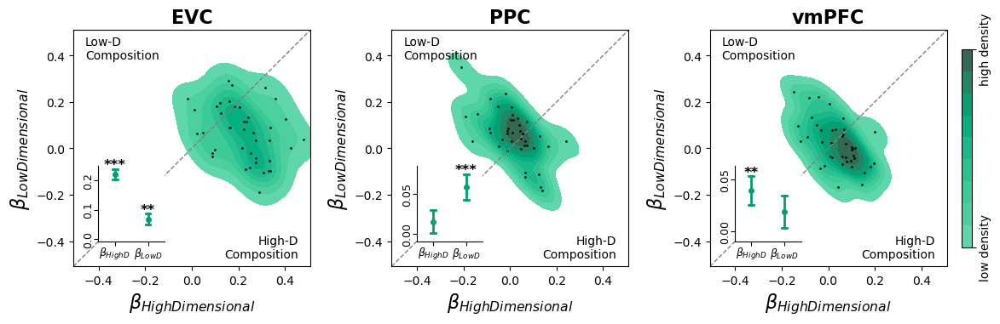

In [269]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


# 2D-KDE plots with the two regression coefficients and plot s.e.m. as insect
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['reg_distmod','reg_percept']))].copy()
pdf = pdf.query("roi in ['V1_bilateral','PPC_bilateral','vmPFC_bilateral']").copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral","vmPFC_bilateral"],ordered=True)

pdf = pdf.query("subgroup=='Generalizer'").copy()

pdf_wide = pdf.pivot_table(index=["roi","subgroup","subid"],columns="metricname",values="value").reset_index()

pdf["metricname_short"] = pd.Categorical(
    pdf.metricname.map({"reg_distmod":r'$\beta_{Low D}$',"reg_percept":r'$\beta_{High D}$'}),
    categories=[r'$\beta_{High D}$',r'$\beta_{Low D}$'],ordered=True
)


gs = sns.displot(data=pdf_wide, x="reg_percept", y="reg_distmod",
                 #hue="subgroup",palette=participantgrouphex,
                 color=participantgrouphex["Generalizer"],
                 col="roi",fill=True,alpha=1,
                 cbar=True,common_norm=True,levels=10,
                 cbar_kws={"label": "Density","shrink": 0.7},
                 kind="kde",height=4).set_titles("{col_name}")#.refline(y=0, linestyle='--', linewidth=1).refline(x=0, linestyle='--', linewidth=1)
gs.map_dataframe(sns.scatterplot,
                 x="reg_percept", y="reg_distmod",
                #hue="subgroup",palette=participantgrouphex,
                color="black",#participantgrouphex["Generalizer"],
                alpha=0.9,
                edgecolor=None,linewidth=0,marker="o",
                s=4
                )
        
axlim = np.max(
    [pdf_wide.reg_percept.values.max(),pdf_wide.reg_distmod.values.max(),
     np.abs(pdf_wide.reg_percept.values.min()),np.abs(pdf_wide.reg_distmod.values.min())]
)+.03

gs_insect_axes = []
for ax in gs.axes.flatten():
    roi = ax.title.get_text()
    facet_df = pdf_wide.loc[pdf_wide.roi==roi].copy()

    
    ax.set_aspect(1)

    ax.set_title(f"{roi_shortnames[roi]}",**def_font_subplot_titles)

    ax.set_xlabel(r'$\beta_{High Dimensional}$',fontdict=def_font_subplot_titles)
    ax.set_ylabel(r'$\beta_{Low Dimensional}$',fontdict=def_font_subplot_titles)

    ax.plot([-axlim,axlim], [-axlim,axlim], color='grey', linestyle='--', linewidth=1)

    ax.set_xlim(-axlim,axlim)
    ax.set_ylim(-axlim,axlim)

    ax.spines["top"].set_visible(True)
    ax.spines["right"].set_visible(True)

    ax.tick_params(labelleft=True, labelbottom=True)
    ax.xaxis.label.set_visible(True)
    ax.yaxis.label.set_visible(True)
    
    ax.text(x=-0.9*axlim, y=0.95*axlim,s="Low-D\nComposition",size=def_font_axis_tick_labels["fontsize"],ha="left",va="top")
    ax.text(x=0.9*axlim, y=-0.95*axlim,s="High-D\nComposition",size=def_font_axis_tick_labels["fontsize"],ha="right",va="bottom")
    
    cbcounter=0
    for cb_ax in gs.figure.axes:
        if cb_ax is not ax and cb_ax.get_ylabel() == 'Density':
            cbcounter+=1
            cmin,cmax = cb_ax.get_ylim()
            # set cbar ticks
            cb_ax.set_yticks([cmin, cmax])
            #cb_ax.set_yticklabels([f"{cmin:.2f}", f"{cmax:.2f}"],rotation=90)
            #cb_ax.set_ylabel("Density",fontdict=def_font_axis_legend_titles,labelpad =-1)
            cb_ax.set_ylabel("")
            cb_ax.set_yticklabels(["low density","high density"],rotation=90,va="center")
            print(ax.title.get_text(),cbcounter)
            if cbcounter<3:
                # remove the colorbar for vmPFC_bilateral
                cb_ax.remove()

    # plot S.E.M. as inset
    inset_ax = inset_axes(ax,
                    width="100%", # width = 30% of parent_bbox
                    height="100%", # height  = 30% of parent_bbox
                    loc='lower left',
                    bbox_to_anchor = (0.08, 0.08, 0.28,0.32), # x, y, width, height
                    bbox_transform=ax.transAxes,
                    axes_kwargs=dict(fc="white") #"none"

    )
    insect_df = pdf.query("roi==@roi").copy()
    sns.pointplot(
        data=insect_df, x="metricname_short",y="value",
        color=participantgrouphex["Generalizer"],
        ax=inset_ax,
        errorbar="se",alpha=1,capsize=.15,dodge=False,markersize=3.5, linestyle="none",lw=2
    )
    inset_ax_max  = np.max([tardf["value"].values.mean()+compute_se(tardf["value"].values) for _,(_,tardf) in enumerate(insect_df.groupby(["metricname_short"]))])
    
    inset_ax.set_ylim(-0.01, inset_ax_max+.01)#max(mean_plus_se_)+.05)
    inset_ax.set_xlabel("")
    inset_ax.set_ylabel("")
    inset_ax.set_title("")
    yticks = np.arange(0,inset_ax_max+0.01,0.05)
    if len(yticks)>3:
        yticks = np.arange(0,inset_ax_max+0.01,0.1)
    inset_ax.set_yticks(yticks)
    plt.setp(inset_ax.get_xticklabels(),fontsize=0.9*def_font_axis_tick_labels["fontsize"],fontweight="regular")
    plt.setp(inset_ax.get_yticklabels(),fontsize=0.9*def_font_axis_tick_labels["fontsize"],fontweight="regular",
             rotation=90,va="center")
    for j,(tar,tardf) in enumerate(insect_df.groupby(["metricname_short"])):
        
        pval = ttest1samp_equiv_permutation(tardf.value.values)
        print(f"{roi_shortnames[roi]} - {tar}: mean = {'%.3f' % tardf.value.values.mean()}, p-value = {'%.3f' % pval}")
        currsem = tardf.value.values.mean() + compute_se(tardf.value.values)
        inset_ax.text(x=j,y=currsem+.0005,
                s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=0.9*13,fontweight="bold",ha="center")        
        
        inset_ax.tick_params(labelleft=True, labelbottom=True,pad=0)
        inset_ax.xaxis.label.set_visible(True)
        inset_ax.yaxis.label.set_visible(True)
        inset_ax.spines["top"].set_visible(False)
        inset_ax.spines["right"].set_visible(False)
    gs_insect_axes.append(inset_ax)


gs.tight_layout()

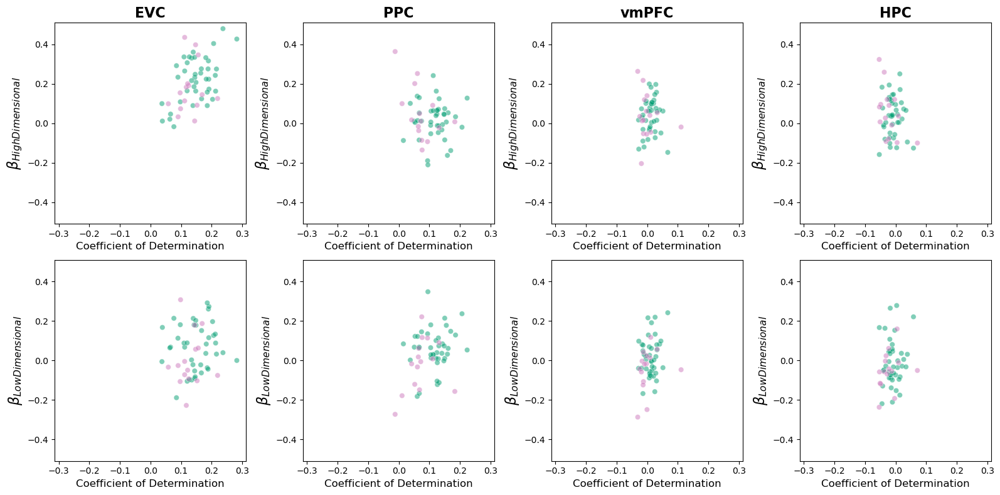

In [ ]:
# correlation plots with the r2 and the two regression coefficients
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['eval_r2','reg_distmod','reg_percept']))].copy()
pdf = pdf.query("roi in ['V1_bilateral','PPC_bilateral','vmPFC_bilateral','HPC_bilateral']").copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral","vmPFC_bilateral",'HPC_bilateral'],ordered=True)

pdf_wide = pdf.pivot_table(index=["roi","subgroup","subid"],columns="metricname",values="value").reset_index()

fig, axes = plt.subplots(2,len(pdf.roi.cat.categories), figsize=(16, 8), sharex=True, sharey=True)

axlim_y = np.max(
    [pdf_wide.reg_percept.values.max(),pdf_wide.reg_distmod.values.max(),
     np.abs(pdf_wide.reg_percept.values.min()),np.abs(pdf_wide.reg_distmod.values.min())]
)+.03
axlim_x = np.max(
    [pdf_wide.eval_r2.values.max(),
     np.abs(pdf_wide.eval_r2.values.min())]
)+.03

for jcol, (roi, roidf) in enumerate(pdf_wide.groupby("roi")):
    sns.scatterplot(data=roidf, 
                    x="eval_r2", y="reg_percept",
                    hue="subgroup",palette=participantgrouphex,
                    alpha=.5,
                    ax=axes[0,jcol])
    axes[0,jcol].set_ylabel(r'$\beta_{High Dimensional}$',fontdict=def_font_subplot_titles)

    sns.scatterplot(data=roidf, 
                    x="eval_r2", y="reg_distmod",
                    hue="subgroup",palette=participantgrouphex,
                    alpha=.5,
                    ax=axes[1,jcol])
    axes[1,jcol].set_ylabel(r'$\beta_{Low Dimensional}$',fontdict=def_font_subplot_titles)

    
    
    axes[0,jcol].set_title(f"{roi_shortnames[roi]}",**def_font_subplot_titles)

    
for ax in axes.flatten():
    if ax.legend() is not None:
        ax.legend().remove()
    ax.set_xlabel("Coefficient of Determination",fontsize=def_font_axis_legend_titles["fontsize"])
    #ax.plot([-axlim,axlim], [-axlim,axlim], color='grey', linestyle='--', linewidth=1)

    #ax.set_aspect(1)
    ax.set_xlim(-axlim_x,axlim_x)
    ax.set_ylim(-axlim_y,axlim_y)

    ax.spines["top"].set_visible(True)
    ax.spines["right"].set_visible(True)

    ax.tick_params(labelleft=True, labelbottom=True)
    ax.xaxis.label.set_visible(True)
    ax.yaxis.label.set_visible(True)


fig.tight_layout(w_pad=1,h_pad=1)        

#### plot all regions

EVC  ('Coefficient of Determination', 'Generalizer'): mean = 0.150, p-value = 0.000
PPC  ('Coefficient of Determination', 'Generalizer'): mean = 0.117, p-value = 0.000
HPC  ('Coefficient of Determination', 'Generalizer'): mean = -0.008, p-value = 0.983
vmPFC  ('Coefficient of Determination', 'Generalizer'): mean = 0.012, p-value = 0.000
EVC - ('Perceptual\nMatching', 'Generalizer'): mean = 0.222, p-value = 0.000
EVC - ('Distance\nModulated', 'Generalizer'): mean = 0.067, p-value = 0.001
PPC - ('Perceptual\nMatching', 'Generalizer'): mean = 0.015, p-value = 0.314
PPC - ('Distance\nModulated', 'Generalizer'): mean = 0.059, p-value = 0.001
HPC - ('Perceptual\nMatching', 'Generalizer'): mean = 0.032, p-value = 0.044
HPC - ('Distance\nModulated', 'Generalizer'): mean = -0.008, p-value = 0.656
vmPFC - ('Perceptual\nMatching', 'Generalizer'): mean = 0.039, p-value = 0.008
vmPFC - ('Distance\nModulated', 'Generalizer'): mean = 0.019, p-value = 0.223


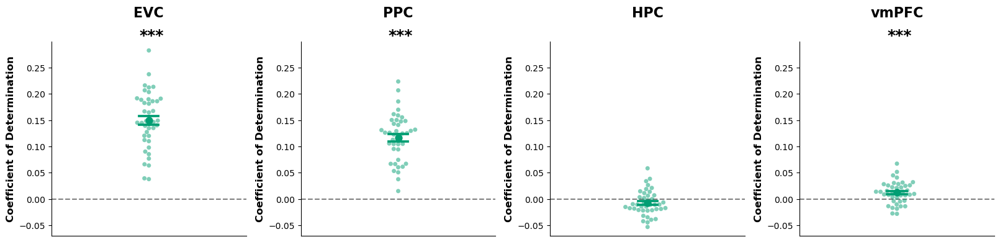

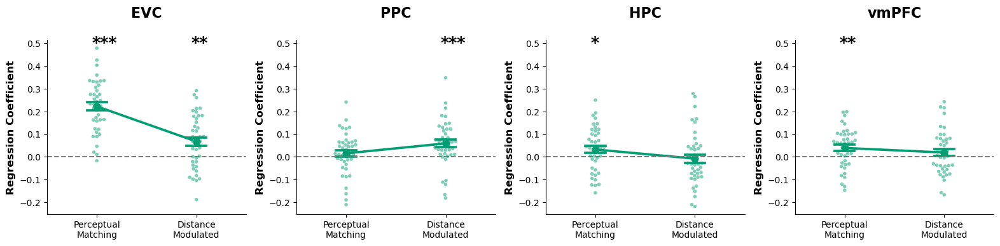

In [ ]:

compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.subid.isin(generalizers))].copy() # &
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['eval_r2']))].copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],ordered=True)
pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"eval_r2":"Coefficient of Determination"}),
    categories=["Coefficient of Determination"],ordered=True
)

gs = sns.catplot(data=pdf,
            x="metricname",y="value",
            col="roi",
            hue="subgroup",palette=participantgrouphex,
            kind="point",errorbar="se",alpha=1,dodge=False,capsize=.1,#fill=False,
            #kind="violin",inner="box",fill=False,split=True,gap=0,cut=True,
            #inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=1,sharey=True,
            ).set_titles("{col_name}").refline(y=0)
gs.map_dataframe(sns.swarmplot,x="metricname",y="value",
                #color="grey",
                hue="subgroup",palette=participantgrouphex,dodge=False,
                alpha=0.5)


for ax in gs.axes.flatten():
    axdf = pdf[pdf.roi==ax.title.get_text()]
    ax.set_ylabel("Coefficient of Determination",**def_font_axis_legend_titles)
    ax.set_xlabel('')    
    ax.set_xticks([])
    plt.setp(ax.get_xticklabels(),
            rotation=0,ha="center",
            **def_font_axis_tick_labels)
    ax.tick_params(axis='x', which='major', pad=1)
            
    ax.set_title(roi_shortnames[axdf.roi.values[0]],y=1.1,**def_font_subplot_titles)
    for j,(tar,tardf) in enumerate(axdf.groupby(["metricname","subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.value.values,alternative="greater")
        print(f"{roi_shortnames[axdf.roi.values[0]]}  {tar}: mean = {'%.3f' % tardf.value.values.mean()}, p-value = {'%.3f' % pval}")
        dw = [-.3,0.15][minorplus]
        
        if tardf.value.values.mean()>0:
            ax.text(x=j-.05,y=ax.get_ylim()[1]*1.01,
                    s=gen_pval_annot(pval,show_pval=False).replace("p=",""),size=18,fontweight="bold")
        
        ax.tick_params(labelleft=True, labelbottom=True)
        ax.xaxis.label.set_visible(True)
        ax.yaxis.label.set_visible(True)
#sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.9),ncol=2)
gs.legend.remove()
#gs.figure.suptitle("Prediction quality in held-out",y=0.95,x=0.5,**def_font_subplot_titles)
gs.figure.set_size_inches(18,4)
gs.tight_layout()
#gs.figure.savefig(os.path.join(ROIRSAdir,"V1lowdim","V1_locteEncoding.png"),dpi=300)




pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['reg_distmod','reg_percept']))].copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],ordered=True)

pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"reg_distmod":"Distance\nModulated","reg_percept":"Perceptual\nMatching"}),
    categories=["Perceptual\nMatching","Distance\nModulated"],ordered=True
)

gs = sns.catplot(data=pdf,
            x="metricname",y="value",
            col="roi",
            hue="subgroup",palette=participantgrouphex,
            kind="point",errorbar="se",alpha=1,capsize=.2,dodge=False,#fill=False,
            #kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
            #inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=1
            ).refline(y=0).set_titles("{col_name}")
gs.map_dataframe(sns.swarmplot,x="metricname",y="value",
                hue="subgroup",palette=participantgrouphex,dodge=False,
                alpha=0.5,s=4
                )


for ax in gs.axes.flatten():
    axdf = pdf[pdf.roi==ax.title.get_text()]
    ax.set_title(roi_shortnames[axdf.roi.values[0]],y=1.1,**def_font_subplot_titles)

    ax.set_ylabel("Regression Coefficient",**def_font_axis_legend_titles)
    ax.set_xlabel("")
    plt.setp(ax.get_xticklabels(),**def_font_axis_tick_labels)
    for j,(tar,tardf) in enumerate(axdf.groupby(["metricname","subgroup"])):
        
        pval = ttest1samp_equiv_permutation(tardf.value.values)
        print(f"{roi_shortnames[axdf.roi.values[0]]} - {tar}: mean = {'%.3f' % tardf.value.values.mean()}, p-value = {'%.3f' % pval}")
        minorplus = 1*((j%2)==1)
        dw = [-.3,0.15][minorplus]
        
        ax.text(x=j-.05,y=1.01*pdf.value.max(),
                s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=18,fontweight="bold")
        
        
        ax.tick_params(labelleft=True, labelbottom=True)
        ax.xaxis.label.set_visible(True)
        ax.yaxis.label.set_visible(True)
    
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test two-sided)')
#sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.85),ncol=1,title="",prop={'size': 12})
#gs.figure.suptitle("Correspondence with\n Model Retrieval Patterns",fontweight="bold",fontsize=14,y=1.05,x=0.4)
gs.legend.remove()
#gs.figure.suptitle("Correspondence with Model Retrieval Patterns",y=0.95,x=0.5,**def_font_subplot_titles)
gs.tight_layout()


('Coefficient of Determination', 'Generalizer'): mean = 0.150, p-value = 0.000
('Coefficient of Determination', 'nonGeneralizer'): mean = 0.128, p-value = 0.000
('Coefficient of Determination', 'Generalizer'): mean = 0.117, p-value = 0.000
('Coefficient of Determination', 'nonGeneralizer'): mean = 0.073, p-value = 0.000
('Coefficient of Determination', 'Generalizer'): mean = -0.008, p-value = 0.983
('Coefficient of Determination', 'nonGeneralizer'): mean = -0.021, p-value = 0.984
('Coefficient of Determination', 'Generalizer'): mean = 0.012, p-value = 0.000
('Coefficient of Determination', 'nonGeneralizer'): mean = 0.001, p-value = 0.480
EVC - ('Perceptual\nMatching', 'Generalizer'): mean = 0.222, p-value = 0.000
EVC - ('Perceptual\nMatching', 'nonGeneralizer'): mean = 0.173, p-value = 0.000
EVC - ('Distance\nModulated', 'Generalizer'): mean = 0.067, p-value = 0.001
EVC - ('Distance\nModulated', 'nonGeneralizer'): mean = 0.001, p-value = 0.992
PPC - ('Perceptual\nMatching', 'Generalize

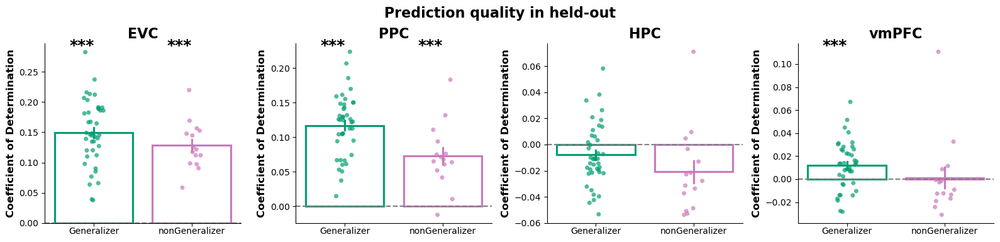

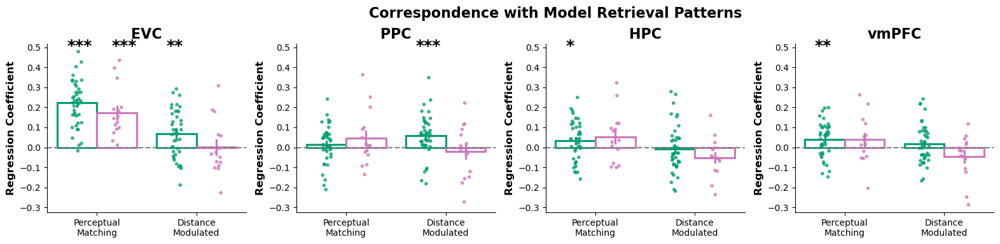

In [ ]:

compo_retrieve_roisubset_df = compositionretrieval_resdf.copy() # &(compositionretrieval_resdf.subid.isin(generalizers))
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['eval_r2']))].copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],ordered=True)
pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"eval_r2":"Coefficient of Determination"}),
    categories=["Coefficient of Determination"],ordered=True
)

gs = sns.catplot(data=pdf,
            x="subgroup",y="value",
            col="roi",
            hue="subgroup",palette=participantgrouphex,
            kind="bar",errorbar="se",fill=False,alpha=1,dodge=False,
            #kind="violin",inner="box",fill=False,split=True,gap=0,cut=True,
            #inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=1,sharey=False,
            ).set_titles("{col_name}").refline(y=0)
gs.map_dataframe(sns.stripplot,x="subgroup",y="value",
                #color="grey",
                hue="subgroup",palette=participantgrouphex,dodge=False,
                alpha=0.7)


for ax in gs.axes.flatten():
    axdf = pdf[pdf.roi==ax.title.get_text()]
    ax.set_ylabel("Coefficient of Determination",**def_font_axis_legend_titles)
    ax.set_xlabel('')    
    plt.setp(ax.get_xticklabels(),
            rotation=0,ha="center",
            **def_font_axis_tick_labels)
    ax.tick_params(axis='x', which='major', pad=1)
            
    ax.set_title(roi_shortnames[axdf.roi.values[0]],**def_font_subplot_titles)
    for j,(tar,tardf) in enumerate(axdf.groupby(["metricname","subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.value.values,alternative="greater")
        print(f"{tar}: mean = {'%.3f' % tardf.value.values.mean()}, p-value = {'%.3f' % pval}")
        if tardf.value.values.mean()>0:
            ax.text(x=j-0.25,y=1.01*axdf.value.max(),
                    s=gen_pval_annot(pval,show_pval=False).replace("p=",""),size=18,fontweight="bold")
#sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.9),ncol=2)
#gs.legend.remove()
gs.figure.suptitle("Prediction quality in held-out",y=0.95,x=0.5,**def_font_subplot_titles)
gs.tight_layout()
#gs.figure.savefig(os.path.join(ROIRSAdir,"V1lowdim","V1_locteEncoding.png"),dpi=300)

compo_retrieve_roisubset_df = compositionretrieval_resdf.copy() # &(compositionretrieval_resdf.subid.isin(generalizers))
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['reg_distmod','reg_percept']))].copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],ordered=True)

pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"reg_distmod":"Distance\nModulated","reg_percept":"Perceptual\nMatching"}),
    categories=["Perceptual\nMatching","Distance\nModulated"],ordered=True
)

gs = sns.catplot(data=pdf,
            x="metricname",y="value",
            col="roi",
            hue="subgroup",palette=participantgrouphex,
            kind="bar",errorbar="se",fill=False,alpha=1,
            #kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
            #inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=1
            ).refline(y=0).set_titles("{col_name}")
gs.map_dataframe(sns.stripplot,x="metricname",y="value",
                jitter=0.1,
                hue="subgroup",palette=participantgrouphex,dodge=True,
                alpha=0.8,s=4
                )


for ax in gs.axes.flatten():
    axdf = pdf[pdf.roi==ax.title.get_text()]
    ax.set_title(roi_shortnames[axdf.roi.values[0]],**def_font_subplot_titles)

    ax.set_ylabel("Regression Coefficient",**def_font_axis_legend_titles)
    ax.set_xlabel("")
    plt.setp(ax.get_xticklabels(),**def_font_axis_tick_labels)
    for j,(tar,tardf) in enumerate(axdf.groupby(["metricname","subgroup"])):
        
        pval = ttest1samp_equiv_permutation(tardf.value.values)
        print(f"{roi_shortnames[axdf.roi.values[0]]} - {tar}: mean = {'%.3f' % tardf.value.values.mean()}, p-value = {'%.3f' % pval}")
        minorplus = 1*((j%2)==1)
        dw = [-.3,0.15][minorplus]
        
        ax.text(x=np.floor(j/2)+dw,y=1.01*pdf.value.max(),
                s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=18,fontweight="bold")
        
        
        ax.tick_params(labelleft=True, labelbottom=True)
        ax.xaxis.label.set_visible(True)
        ax.yaxis.label.set_visible(True)
    
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test two-sided)')
#sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.85),ncol=1,title="",prop={'size': 12})
#gs.figure.suptitle("Correspondence with\n Model Retrieval Patterns",fontweight="bold",fontsize=14,y=1.05,x=0.4)
gs.legend.remove()
gs.figure.suptitle("Correspondence with Model Retrieval Patterns",y=0.95,x=0.5,**def_font_subplot_titles)
gs.tight_layout()


## localizer2ts

In [ ]:
compo_retrieve_roisubset_df.anagroup.unique()

array(['train2test', 'loc2test', 'loc2train', 'Rloc2test', 'Rloc2train',
       'RSloc2test', 'RSloc2train'], dtype=object)

In [ ]:
stim_df = roi_data["V1_bilateral"][0]["stimdf"].copy()
test_df = stim_df[stim_df.stim_group==0].copy().reset_index(drop=True)
training_df = stim_df[stim_df.stim_group==1].copy().reset_index(drop=True)
training_df.sort_values(by=["training_axset","training_axlocTL"],inplace=True)
allylabs = (test_df[test_df.stim_session==0].copy()[["stim_x","stim_y"]].to_numpy()*2).astype(int)
allxlabs = (training_df[training_df.stim_session==0].copy()[["stim_x","stim_y"]].to_numpy()*2).astype(int)
xticksat = np.arange(0,8,1)
yticksat = np.arange(0,16,2)
yticksat

array([ 0,  2,  4,  6,  8, 10, 12, 14])

Text(0.5, 1.05, 'Retrieval Patterns')

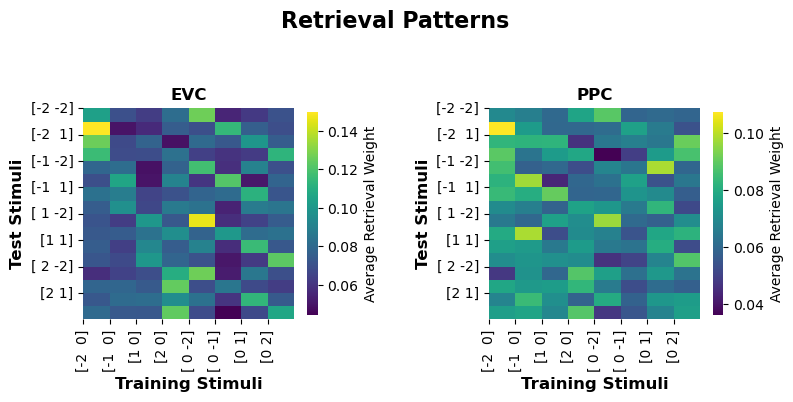

In [ ]:
fig,axes = plt.subplots(1,2,figsize=(8,4))

meanGrp = {}
for j,roi in enumerate(["V1_bilateral","PPC_bilateral"]):
    G_rps = [x for x,subid in zip(retrivepat_res["rotated_coefs"][roi]['loc2test'],subid_list) if subid in generalizers]
    meanGrp[roi] = np.mean(G_rps,axis=0)#np.mean(rescale_mat(G_rps),axis=0)

norm = colors.Normalize(vmin=np.min([x for x in meanGrp.values()]), 
                        vmax=np.max([x for x in meanGrp.values()])
                        )
ims = []
for j,roi in enumerate(["V1_bilateral","PPC_bilateral"]):
    #currim = axes[j].imshow(meanGrp[roi],cmap="viridis")
    #ims.append(currim)
    sns.heatmap(meanGrp[roi], ax=axes[j], cmap="viridis",
                cbar=True,cbar_kws={"shrink":.6,"label":"Average Retrieval Weight"})
    axes[j].set_title(f"{roi_shortnames[roi]}",**def_font_axis_legend_titles)

for ax,_ in zip(axes.flatten(),roi):
    ax.set_xticks(xticksat)
    ax.set_yticks(yticksat)
    ax.set_xticklabels(allxlabs[xticksat],rotation=90,**def_font_axis_tick_labels)
    ax.set_yticklabels(allylabs[yticksat],rotation=0,**def_font_axis_tick_labels)
    ax.set_xlabel("Training Stimuli",**def_font_axis_legend_titles)
    ax.set_ylabel("Test Stimuli",**def_font_axis_legend_titles)
    ax.set_aspect(0.5)
    #cb =fig.colorbar(im, orientation="horizontal", pad = 0.2)
    #cb.set_label(label='Average Weight',weight='bold')

#divider = make_axes_locatable(ax)
#cax = divider.new_vertical(size='5%', pad=0.05, pack_start = True)
#fig.add_axes(cax)
#fig.colorbar(im, cax = cax, orientation = 'horizontal')

fig.tight_layout(w_pad=3)

fig.suptitle("Retrieval Patterns",y=1.05,**def_font_subplot_titles)
# cb =fig.colorbar(im, ax=axes,orientation="vertical", fraction = 0.1, shrink=.8)
# cb.set_label(label='Weight',weight=def_font_axis_legend_titles["fontweight"],fontsize=def_font_axis_legend_titles["fontsize"])
# cb.set_ticks(ticks=[np.min([pmodel,dmodel]), np.max([pmodel,dmodel])],
#              labels=["small","large"],fontsize=def_font_axis_legend_titles["fontsize"],rotation=90,va="center")
# cb.ax.yaxis.set_tick_params(pad=5)

### only plot for G

PPC  ('V1_bilateral', 'Generalizer'): mean = 0.148, p-value = 0.000
PPC  ('PPC_bilateral', 'Generalizer'): mean = 0.116, p-value = 0.000


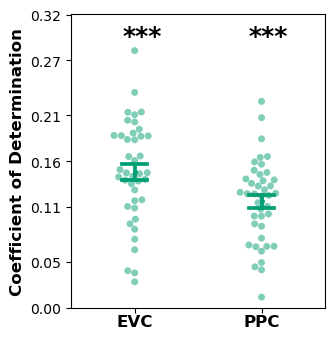

In [ ]:

compo_retrieve_roisubset_df = compositionretrieval_resdf[(compositionretrieval_resdf.subid.isin(generalizers))].copy() # &
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="Rloc2test")&(compo_retrieve_roisubset_df.metricname.isin(['eval_r2']))].copy()
pdf = pdf.query("roi in ['V1_bilateral','PPC_bilateral']").copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral"],ordered=True)
pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"eval_r2":"Coefficient of Determination"}),
    categories=["Coefficient of Determination"],ordered=True
)

gs = sns.catplot(data=pdf,
            x="roi",y="value",
            hue="subgroup",palette=participantgrouphex,
            kind="point",errorbar="se",alpha=1,dodge=False,capsize=.2,markersize=1.5, linestyle="none",#fill=False,
            #kind="violin",inner="box",fill=False,split=True,gap=0,cut=True,
            #inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=3.5,aspect=1,sharey=True,
            )#.refline(y=0)
gs.map_dataframe(sns.swarmplot,x="roi",y="value",
                #s=4,
                hue="subgroup",palette=participantgrouphex,dodge=False,
                alpha=0.5)


for ax in gs.axes.flatten():
    axdf = pdf.copy()
    ax.set_ylabel("Coefficient of Determination",**def_font_axis_legend_titles)
    ax.set_xlabel('')    
    
    ax.set_xticks(np.arange(len(pdf.roi.cat.categories)),
                  labels=[roi_shortnames[roi] for roi in pdf.roi.cat.categories],
                  **def_font_axis_legend_titles)
    ax.set_ylim(axdf.value.values.min(),axdf.value.values.max()+0.04)
    y_ticks=np.linspace(0, axdf.value.values.max()+0.04,num=7)
    ax.set_yticks(ticks=np.round(y_ticks,2),
                  labels=[f"{x:.2f}" for x in y_ticks],
                  **def_font_axis_tick_labels)
    plt.setp(ax.get_xticklabels(),
            rotation=0,ha="center",
            **def_font_axis_legend_titles)
    ax.tick_params(axis='x', which='major', pad=1)
            
    for j,(tar,tardf) in enumerate(axdf.groupby(["roi","subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.value.values,alternative="greater")
        print(f"{roi_shortnames[axdf.roi.values[0]]}  {tar}: mean = {'%.3f' % tardf.value.values.mean()}, p-value = {'%.3f' % pval}")
        dw = [-.3,0.15][minorplus]
        
        if tardf.value.values.mean()>0:
            ax.text(x=j-.1,y=ax.get_ylim()[1]*.9,
                    s=gen_pval_annot(pval,show_pval=False).replace("p=",""),size=18,fontweight="bold")
        
        ax.tick_params(labelleft=True, labelbottom=True)
        ax.xaxis.label.set_visible(True)
        ax.yaxis.label.set_visible(True)
        ax.spines["top"].set_visible(True)
        ax.spines["right"].set_visible(True)
#sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.9),ncol=2)
gs.legend.remove()
#gs.figure.suptitle("Prediction quality in held-out",y=0.95,x=0.5,**def_font_subplot_titles)
#gs.figure.set_size_inches(4,4)
gs.tight_layout()
#gs.figure.savefig(os.path.join(ROIRSAdir,"V1lowdim","V1_locteEncoding.png"),dpi=300)







EVC 1
EVC 2


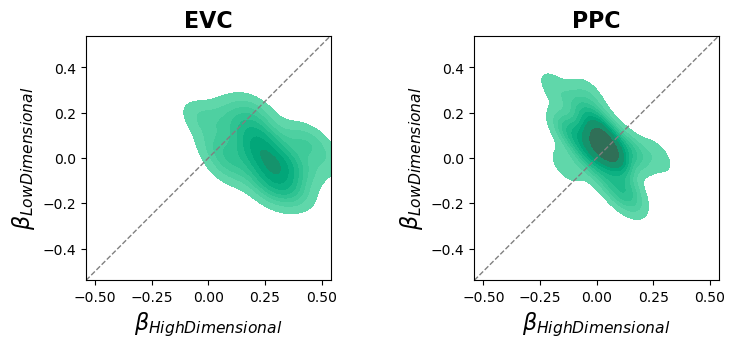

In [ ]:

pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="Rloc2test")&(compo_retrieve_roisubset_df.metricname.isin(['reg_distmod','reg_percept']))].copy()
pdf = pdf.query("roi in ['V1_bilateral','PPC_bilateral']").copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral"],ordered=True)

pdf_wide = pdf.pivot_table(index=["roi","subgroup","subid"],columns="metricname",values="value").reset_index()
gs = sns.displot(data=pdf_wide, x="reg_percept", y="reg_distmod",
                 #hue="subgroup",palette=participantgrouphex,
                 color=participantgrouphex["Generalizer"],
                 col="roi",fill=True,alpha=1,
                 cbar=True,common_norm=True,levels=10,
                 cbar_kws={"label": "Density","shrink": 0.7},
                 kind="kde",height=4).set_titles("{col_name}")#.refline(y=0, linestyle='--', linewidth=1).refline(x=0, linestyle='--', linewidth=1)
        
axlim = np.max(
    [pdf_wide.reg_percept.values.max(),pdf_wide.reg_distmod.values.max(),
     np.abs(pdf_wide.reg_percept.values.min()),np.abs(pdf_wide.reg_distmod.values.min())]
)+.03

for ax in gs.axes.flatten():
    roi = ax.title.get_text()
    facet_df = pdf_wide.loc[pdf_wide.roi==roi].copy()

    # sns.scatterplot(facet_df,
    #                 x="reg_percept", y="reg_distmod",
    #                 hue="subgroup",palette=participantgrouphex,
    #                 ax=ax,alpha=.5,edgecolor=None,linewidth=0,marker="o",#s=2
    #                 )
    ax.set_aspect(1)

    ax.set_title(f"{roi_shortnames[roi]}",**def_font_subplot_titles)

    ax.set_xlabel(r'$\beta_{High Dimensional}$',fontdict=def_font_subplot_titles)
    ax.set_ylabel(r'$\beta_{Low Dimensional}$',fontdict=def_font_subplot_titles)

    ax.plot([-axlim,axlim], [-axlim,axlim], color='grey', linestyle='--', linewidth=1)

    ax.set_xlim(-axlim,axlim)
    ax.set_ylim(-axlim,axlim)

    ax.spines["top"].set_visible(True)
    ax.spines["right"].set_visible(True)

    ax.tick_params(labelleft=True, labelbottom=True)
    ax.xaxis.label.set_visible(True)
    ax.yaxis.label.set_visible(True)
    
    cbcounter=0
    for cb_ax in gs.figure.axes:
        if cb_ax is not ax and cb_ax.get_ylabel() == 'Density':
            cbcounter+=1
            cmin,cmax = cb_ax.get_ylim()
            # set cbar ticks
            cb_ax.set_yticks([cmin, cmax])
            #cb_ax.set_yticklabels([f"{cmin:.2f}", f"{cmax:.2f}"],rotation=90)
            #cb_ax.set_ylabel("Density",fontdict=def_font_axis_legend_titles,labelpad =-1)
            cb_ax.set_ylabel("")
            cb_ax.set_yticklabels(["low density","high density"],rotation=90,va="center")
            print(ax.title.get_text(),cbcounter)
            if cbcounter<3:
                # remove the colorbar for vmPFC_bilateral
                cb_ax.remove()

#gs.figure.set_size_inches(9,4)
gs.tight_layout(w_pad=5)

EVC - ('$\\beta_{High Dimensional}$', 'Generalizer'): mean = 0.242, p-value = 0.000
EVC - ('$\\beta_{Low Dimensional}$', 'Generalizer'): mean = 0.019, p-value = 0.216
PPC - ('$\\beta_{High Dimensional}$', 'Generalizer'): mean = 0.022, p-value = 0.154
PPC - ('$\\beta_{Low Dimensional}$', 'Generalizer'): mean = 0.051, p-value = 0.005


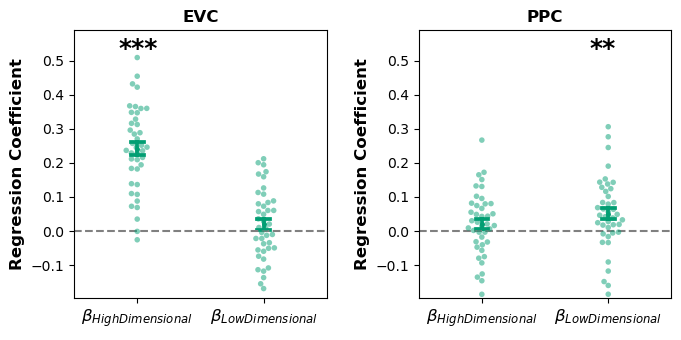

In [ ]:
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="Rloc2test")&(compo_retrieve_roisubset_df.metricname.isin(['reg_distmod','reg_percept']))].copy()
pdf = pdf.query("roi in ['V1_bilateral','PPC_bilateral']").copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral"],ordered=True)

pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"reg_distmod":r'$\beta_{Low Dimensional}$',"reg_percept":r'$\beta_{High Dimensional}$'}),
    categories=[r'$\beta_{High Dimensional}$',r'$\beta_{Low Dimensional}$'],ordered=True
)

gs = sns.catplot(data=pdf,
            x="metricname",y="value",
            col="roi",
            hue="subgroup",palette=participantgrouphex,
            kind="point",errorbar="se",alpha=1,capsize=.1,dodge=False,markersize=1.5, linestyle="none",#fill=False,
            #kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
            #inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=3.5,aspect=1
            ).refline(y=0).set_titles("{col_name}")
gs.map_dataframe(sns.swarmplot,x="metricname",y="value",
                hue="subgroup",palette=participantgrouphex,dodge=False,
                alpha=0.5,s=4
                )


for ax in gs.axes.flatten():
    axdf = pdf[pdf.roi==ax.title.get_text()]
    ax.set_title(roi_shortnames[axdf.roi.values[0]],**def_font_axis_legend_titles) #def_font_subplot_titles

    ax.set_ylim(pdf.value.values.min()-0.01,pdf.value.values.max()+0.08)
    ax.set_ylabel("Regression Coefficient",**def_font_axis_legend_titles)
    ax.set_xlabel("")
    plt.setp(ax.get_xticklabels(),**def_font_axis_legend_titles)
    for j,(tar,tardf) in enumerate(axdf.groupby(["metricname","subgroup"])):
        
        pval = ttest1samp_equiv_permutation(tardf.value.values)
        print(f"{roi_shortnames[axdf.roi.values[0]]} - {tar}: mean = {'%.3f' % tardf.value.values.mean()}, p-value = {'%.3f' % pval}")
        minorplus = 1*((j%2)==1)
        dw = [-.3,0.15][minorplus]
        
        ax.text(x=j-.15,y=1.01*pdf.value.max(),
                s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=18,fontweight="bold")
        
        
        ax.tick_params(labelleft=True, labelbottom=True)
        ax.xaxis.label.set_visible(True)
        ax.yaxis.label.set_visible(True)
        ax.spines["top"].set_visible(True)
        ax.spines["right"].set_visible(True)
    
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test two-sided)')
#sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.85),ncol=1,title="",prop={'size': 12})
#gs.figure.suptitle("Correspondence with\n Model Retrieval Patterns",fontweight="bold",fontsize=14,y=1.05,x=0.4)
gs.legend.remove()
#gs.figure.suptitle("Correspondence with Model Retrieval Patterns",y=0.95,x=0.5,**def_font_subplot_titles)
gs.tight_layout(w_pad=2)

In [ ]:
pdf

,value,metric,roi,subid,dataset,perm,analysis,metricname,anagroup,region,subgroup
3032,-0.148638,loc2test-reg_distmod,PPC_bilateral,sub001,rotated,NaN,loc2test,NaN,Rloc2test,PPC,Generalizer
3033,0.079820,loc2test-reg_percept,PPC_bilateral,sub001,rotated,NaN,loc2test,NaN,Rloc2test,PPC,Generalizer
3104,0.083585,loc2test-reg_distmod,PPC_bilateral,sub003,rotated,NaN,loc2test,NaN,Rloc2test,PPC,Generalizer
3105,0.102115,loc2test-reg_percept,PPC_bilateral,sub003,rotated,NaN,loc2test,NaN,Rloc2test,PPC,Generalizer
3176,0.276971,loc2test-reg_distmod,PPC_bilateral,sub005,rotated,NaN,loc2test,NaN,Rloc2test,PPC,Generalizer
...,...,...,...,...,...,...,...,...,...,...,...
110781,0.367944,loc2test-reg_percept,V1_bilateral,sub128,rotated,NaN,loc2test,NaN,Rloc2test,V1,Generalizer
110816,0.079964,loc2test-reg_distmod,V1_bilateral,sub129,rotated,NaN,loc2test,NaN,Rloc2test,V1,Generalizer
110817,0.229381,loc2test-reg_percept,V1_bilateral,sub129,rotated,NaN,loc2test,NaN,Rloc2test,V1,Generalizer
110852,0.028749,loc2test-reg_distmod,V1_bilateral,sub130,rotated,NaN,loc2test,NaN,Rloc2test,V1,Generalizer


In [ ]:
tardf[tardf["relevance"]=="relevant"]

,value,metric,roi,subid,dataset,perm,analysis,metricname,anagroup,region,subgroup,relevance,axes
108874,0.072089,loc2test-compoweight_x,V1_bilateral,sub001,rotated,NaN,loc2test,$\beta_{relevant_x}$,Rloc2test,V1,Generalizer,relevant,x
108946,0.149358,loc2test-compoweight_x,V1_bilateral,sub003,rotated,NaN,loc2test,$\beta_{relevant_x}$,Rloc2test,V1,Generalizer,relevant,x
109018,0.093286,loc2test-compoweight_x,V1_bilateral,sub005,rotated,NaN,loc2test,$\beta_{relevant_x}$,Rloc2test,V1,Generalizer,relevant,x
109054,0.208686,loc2test-compoweight_x,V1_bilateral,sub006,rotated,NaN,loc2test,$\beta_{relevant_x}$,Rloc2test,V1,Generalizer,relevant,x
109090,0.130621,loc2test-compoweight_x,V1_bilateral,sub007,rotated,NaN,loc2test,$\beta_{relevant_x}$,Rloc2test,V1,Generalizer,relevant,x
109126,0.065988,loc2test-compoweight_x,V1_bilateral,sub008,rotated,NaN,loc2test,$\beta_{relevant_x}$,Rloc2test,V1,Generalizer,relevant,x
109162,0.078810,loc2test-compoweight_x,V1_bilateral,sub009,rotated,NaN,loc2test,$\beta_{relevant_x}$,Rloc2test,V1,Generalizer,relevant,x
109234,0.118523,loc2test-compoweight_x,V1_bilateral,sub011,rotated,NaN,loc2test,$\beta_{relevant_x}$,Rloc2test,V1,Generalizer,relevant,x
109378,0.099483,loc2test-compoweight_x,V1_bilateral,sub015,rotated,NaN,loc2test,$\beta_{relevant_x}$,Rloc2test,V1,Generalizer,relevant,x
109414,0.066551,loc2test-compoweight_x,V1_bilateral,sub016,rotated,NaN,loc2test,$\beta_{relevant_x}$,Rloc2test,V1,Generalizer,relevant,x


EVC - ('x',): mean rel = 0.106, mean irrel = 0.072, y1>y2 p-value = 0.0001
EVC - ('y',): mean rel = 0.113, mean irrel = 0.069, y1>y2 p-value = 0.0001
PPC - ('x',): mean rel = 0.077, mean irrel = 0.070, y1>y2 p-value = 0.0400
PPC - ('y',): mean rel = 0.074, mean irrel = 0.064, y1>y2 p-value = 0.0012


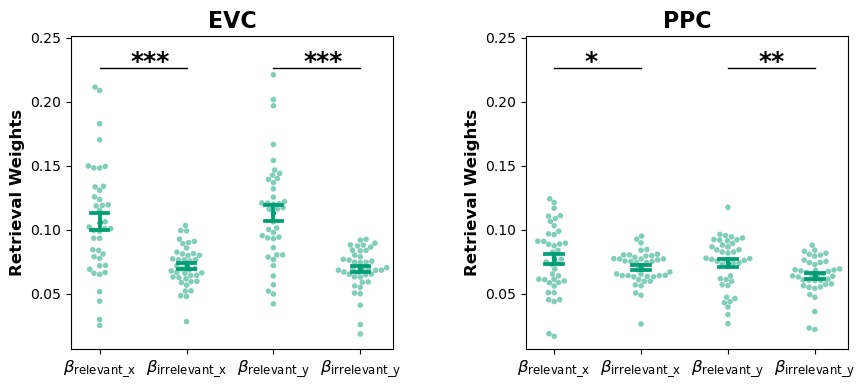

In [ ]:
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="Rloc2test")&(compo_retrieve_roisubset_df.metricname.isin(
    ['compoweight_x','compoweight_y','noncompoweight_x','noncompoweight_y']
    ))].copy()
pdf = pdf.query("roi in ['V1_bilateral','PPC_bilateral']").copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral"],ordered=True)

pdf[["relevance","axes"]] = pdf["metricname"].str.split("_",expand=True)
pdf["relevance"] = pdf["relevance"].map({"compoweight":"relevant","noncompoweight":"irrelevant"})

#pdf["relevance"] = pd.Categorical(pdf["relevance"], categories=["relevant","irrelevant"], ordered = True)

#pdf["axes"] = pd.Categorical(pdf["axes"], categories=["x","y"], ordered = True)

pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"compoweight_x":r'$\beta_{\mathrm{relevant\_x}}$', "compoweight_y":r'$\beta_{\mathrm{relevant\_y}}$',
                        "noncompoweight_x":r'$\beta_{\mathrm{irrelevant\_x}}$', "noncompoweight_y":r'$\beta_{\mathrm{irrelevant\_y}}$'}),
    categories=[r'$\beta_{\mathrm{relevant\_x}}$', r'$\beta_{\mathrm{irrelevant\_x}}$', 
                r'$\beta_{\mathrm{relevant\_y}}$', r'$\beta_{\mathrm{irrelevant\_y}}$'],
    ordered=True
)

gs = sns.catplot(data=pdf,
            x="metricname",y="value",
            col="roi",
            hue="subgroup",palette=participantgrouphex,
            kind="point",errorbar="se",alpha=1,capsize=.2,dodge=False,markersize=1.5, linestyle="none",#fill=False,
            #kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
            #inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=1.1
            ).refline(y=0).set_titles("{col_name}")
gs.map_dataframe(sns.swarmplot,x="metricname",y="value",
                hue="subgroup",palette=participantgrouphex,dodge=False,
                alpha=0.5,s=4
                )


for ax in gs.axes.flatten():
    axdf = pdf[pdf.roi==ax.title.get_text()]
    ax.set_title(roi_shortnames[axdf.roi.values[0]],**def_font_subplot_titles)

    ax.set_ylim(pdf.value.values.min()-0.01,pdf.value.values.max()+0.03)
    ax.set_ylabel("Retrieval Weights",**def_font_axis_legend_titles)
    ax.set_xlabel("")
    plt.setp(ax.get_xticklabels(),fontweight="bold",fontsize=12)
    for j,(tar,tardf) in enumerate(axdf.groupby(["axes"])):
        y1 = tardf[tardf["relevance"]=="relevant"].value.values
        y2 = tardf[tardf["relevance"]=="irrelevant"].value.values
        pval = ttestpairedsamp_equiv_permutation(y1,y2,alternative="greater")

        print(f"{roi_shortnames[axdf.roi.values[0]]} - {tar}: mean rel = {'%.3f' % y1.mean()}, mean irrel = {'%.3f' % y2.mean()}, y1>y2 p-value = {'%.4f' % pval}")
        minorplus = 1*((j%2)==1)
        dw = [-.3,0.15][minorplus]
        
        ax.text(x=j*2+.35,y=1.02*pdf.value.max(),
                s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=18,fontweight="bold")
        ax.plot([j*2,j*2+1],[pdf.value.max()+.005,pdf.value.max()+.005],color="black",linewidth=1,linestyle="solid")
        
        
        ax.tick_params(labelleft=True, labelbottom=True)
        ax.xaxis.label.set_visible(True)
        ax.yaxis.label.set_visible(True)
        ax.spines["top"].set_visible(True)
        ax.spines["right"].set_visible(True)
    
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test two-sided)')
#sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.85),ncol=1,title="",prop={'size': 12})
#gs.figure.suptitle("Correspondence with\n Model Retrieval Patterns",fontweight="bold",fontsize=14,y=1.05,x=0.4)
gs.legend.remove()
#gs.figure.suptitle("Correspondence with Model Retrieval Patterns",y=0.95,x=0.5,**def_font_subplot_titles)
gs.tight_layout(w_pad=5)

## cross-task RSA

In [99]:
crosstask_rsa_df = pd.read_csv(os.path.join(ROIRSAdir,"taskrdms_similarity","crosstask_rsa_df.csv"))

crosstask_rsa_df_sum = crosstask_rsa_df.groupby(
    ["roi","subid","navi_stim_group","compare_axis"]
    )["coefficient"].mean().reset_index()

crosstask_rsa_df_sum["subgroup"] = pd.Categorical(
    crosstask_rsa_df_sum.subid.map(lambda x: "Generalizer" if x in generalizers else "nonGeneralizer"),
    categories=["Generalizer","nonGeneralizer"],
    ordered=True
)
crosstask_rsa_df_sum["navi_stim_group"] = pd.Categorical(
    crosstask_rsa_df_sum.navi_stim_group,
    categories=["training","test mean","test","test all"],
    ordered=True    
)

In [66]:
print(crosstask_rsa_df_sum.shape[0])
print(crosstask_rsa_df_sum[crosstask_rsa_df_sum["navi_stim_group"]=="training"].copy().shape[0])
crosstask_rsa_df_sum

1792
448


,roi,subid,navi_stim_group,compare_axis,coefficient,subgroup
0,HPC_bilateral,sub001,test,stim_x,0.171429,Generalizer
1,HPC_bilateral,sub001,test,stim_y,-0.257143,Generalizer
2,HPC_bilateral,sub001,test all,stim_x,0.137457,Generalizer
3,HPC_bilateral,sub001,test all,stim_y,-0.236144,Generalizer
4,HPC_bilateral,sub001,test mean,stim_x,0.085714,Generalizer
...,...,...,...,...,...,...
1787,vmPFC_bilateral,sub130,test all,stim_y,0.088113,Generalizer
1788,vmPFC_bilateral,sub130,test mean,stim_x,0.142857,Generalizer
1789,vmPFC_bilateral,sub130,test mean,stim_y,-0.028571,Generalizer
1790,vmPFC_bilateral,sub130,training,stim_x,0.257143,Generalizer


c:\Users\liangz\miniconda3\envs\piratefmri\lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in arctanh
  result = getattr(ufunc, method)(*inputs, **kwargs)


EVC ('stim_x', 'Generalizer') 0.0004999500049995
EVC ('stim_x', 'nonGeneralizer') 0.607039296070393
EVC ('stim_y', 'Generalizer') 0.0040995900409959
EVC ('stim_y', 'nonGeneralizer') 0.5483451654834517
PPC ('stim_x', 'Generalizer') 0.49735026497350265
PPC ('stim_x', 'nonGeneralizer') 0.12218778122187782
PPC ('stim_y', 'Generalizer') 0.5064493550644935
PPC ('stim_y', 'nonGeneralizer') 0.31596840315968405
HPC ('stim_x', 'Generalizer') 0.3350664933506649
HPC ('stim_x', 'nonGeneralizer') 0.9845015498450155
HPC ('stim_y', 'Generalizer') 0.7210278972102789
HPC ('stim_y', 'nonGeneralizer') 0.7021297870212979
vmPFC ('stim_x', 'Generalizer') 0.5936406359364064
vmPFC ('stim_x', 'nonGeneralizer') 0.8995100489951005
vmPFC ('stim_y', 'Generalizer') 0.36246375362463756
vmPFC ('stim_y', 'nonGeneralizer') 0.1563843615638436
EVC ('stim_x', 'Generalizer') 0.001999800019998
EVC ('stim_x', 'nonGeneralizer') 0.7370262973702629
EVC ('stim_y', 'Generalizer') 0.0010998900109989002
EVC ('stim_y', 'nonGeneralize

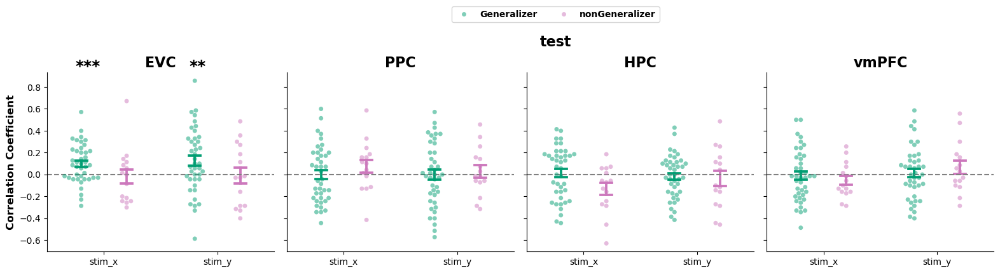

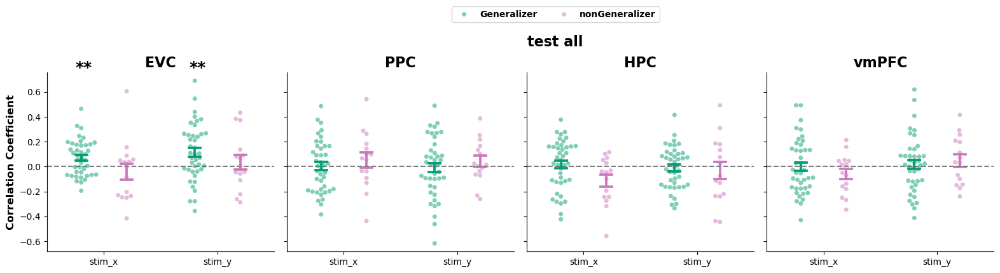

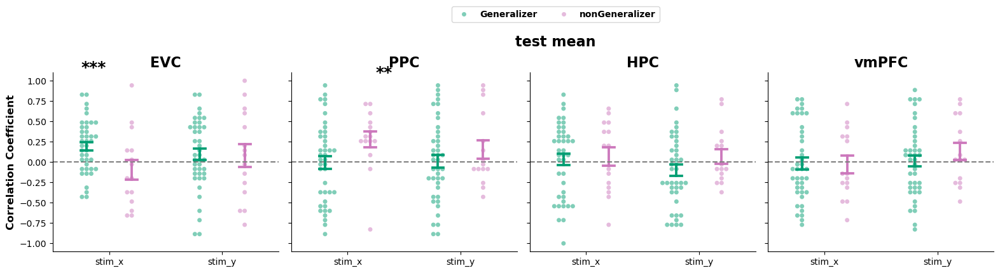

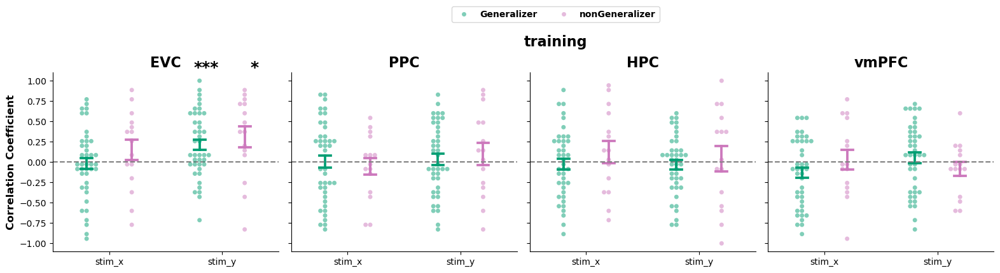

In [100]:
# test if correlation coefficients are significantly above zero
crosstask_rsa_df_sum["z_coefficient"] = np.arctanh(crosstask_rsa_df_sum["coefficient"]) # z-transform the coefficients
xvar, gvar, yvar, yvartest = "compare_axis",  "subgroup", "coefficient", "z_coefficient"
colvar, colnamedict = "roi", roi_shortnames
split_plot_var = "navi_stim_group"

for a in crosstask_rsa_df_sum[split_plot_var].unique():
    atitle = a
    curr_pdf = crosstask_rsa_df_sum[(crosstask_rsa_df_sum[split_plot_var]==a)].copy().reset_index(drop=True)
    assert curr_pdf.shape[0]>0, f"No data for {a}"
    #print(curr_pdf.modelrdm.nunique())
    
    curr_pdf.roi = pd.Categorical(curr_pdf.roi,
                                categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],
                                ordered=True)

    gs = sns.catplot(data=curr_pdf,
                x=xvar,y=yvar,
                col=colvar,
                hue=gvar,palette=participantgrouphex,
                kind="point",errorbar="se",capsize=0.1,markersize=0,linestyle="none",dodge=.4,
                #kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
                #inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
                height=4,aspect=1
                ).refline(y=0).set_titles("{col_name}")
    gs.map_dataframe(sns.swarmplot,x=xvar,y=yvar,
                    hue=gvar,palette=participantgrouphex,dodge=0.5,
                    alpha=0.5
                    )


    for ax in gs.axes.flatten():
        axdf = curr_pdf[curr_pdf[colvar]==ax.title.get_text()]
        ax.set_title(roi_shortnames[axdf[colvar].values[0]],**def_font_subplot_titles)
        ax.set_ylabel("Correlation Coefficient",**def_font_axis_legend_titles)
        ax.set_xlabel("")
        plt.setp(ax.get_xticklabels(),**def_font_axis_tick_labels)
        for j,(tar,tardf) in enumerate(axdf.groupby([xvar,gvar])):
            
            pval = ttest1samp_equiv_permutation(tardf[yvar].values,alternative="greater")
            print(ax.title.get_text(), tar,pval)
            minorplus = 1*((j%2)==1)
            dw = [-.25,0.25][minorplus]
            
            ax.text(x=np.floor(j/2)+dw,y=1.1*axdf[yvar].max(),
                    s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                    size=18,fontweight="bold")
    gs.legend.remove()    
    hs,ls = gs.axes.flatten()[0].get_legend_handles_labels()
    gs.figure.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
            prop = dict(weight="bold"))
    gs.figure.suptitle(f"{atitle}",y=0.95,x=0.5,**def_font_subplot_titles)
    gs.tight_layout()


 ('V1_bilateral', 'Generalizer') 0.022497750224977502
 ('V1_bilateral', 'nonGeneralizer') 0.008999100089991
 ('PPC_bilateral', 'Generalizer') 0.35266473352664734
 ('PPC_bilateral', 'nonGeneralizer') 0.38316168383161686
 ('HPC_bilateral', 'Generalizer') 0.7372262773722628
 ('HPC_bilateral', 'nonGeneralizer') 0.20257974202579743
 ('vmPFC_bilateral', 'Generalizer') 0.801919808019198
 ('vmPFC_bilateral', 'nonGeneralizer') 0.6476352364763523
 ('V1_bilateral', 'Generalizer') 0.0005999400059994001
 ('V1_bilateral', 'nonGeneralizer') 0.5333466653334666
 ('PPC_bilateral', 'Generalizer') 0.49545045495450457
 ('PPC_bilateral', 'nonGeneralizer') 0.0045995400459954
 ('HPC_bilateral', 'Generalizer') 0.7506249375062494
 ('HPC_bilateral', 'nonGeneralizer') 0.17598240175982402
 ('vmPFC_bilateral', 'Generalizer') 0.5227477252274773
 ('vmPFC_bilateral', 'nonGeneralizer') 0.25677432256774324
 ('V1_bilateral', 'Generalizer') 9.999000099990002e-05
 ('V1_bilateral', 'nonGeneralizer') 0.6155384461553844
 ('PP

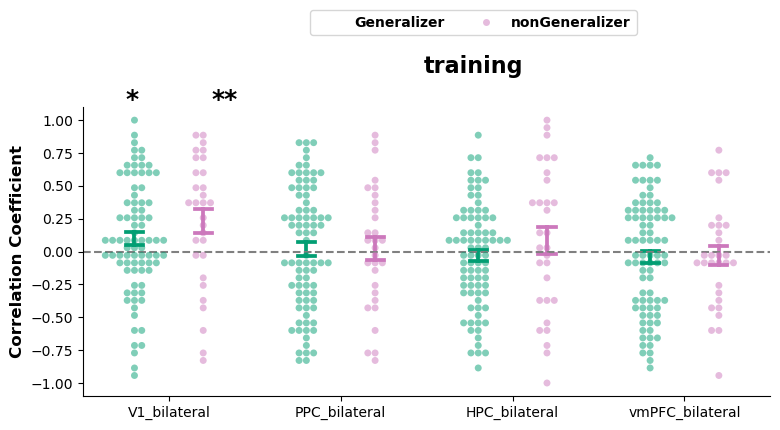

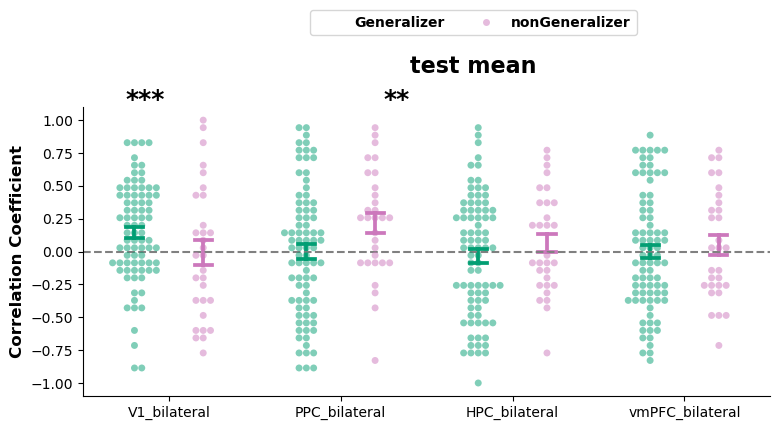

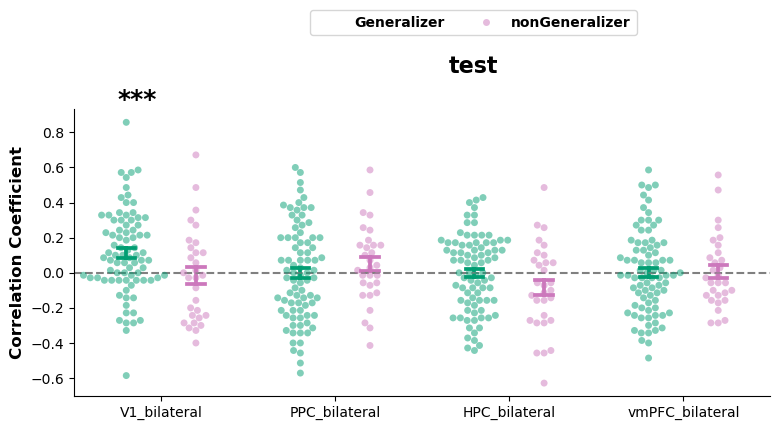

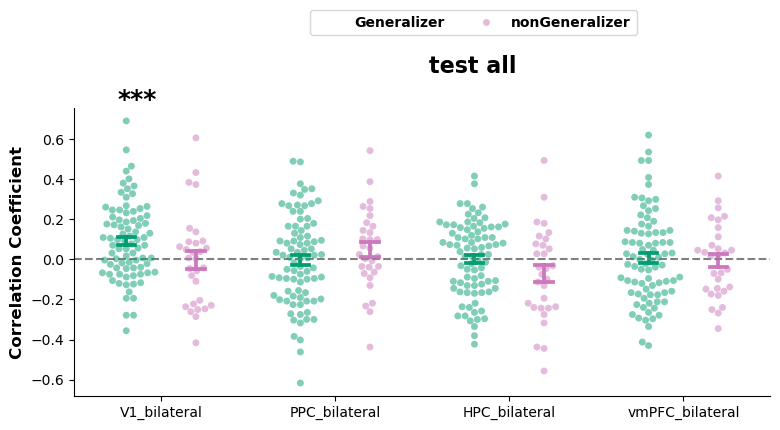

In [101]:
crosstask_rsa_df_sum_overaxis = crosstask_rsa_df_sum.groupby(
    ["roi","subid","navi_stim_group"])[["coefficient","z_coefficient"]].mean().reset_index()
crosstask_rsa_df_sum_overaxis["subgroup"] = pd.Categorical(
        crosstask_rsa_df_sum_overaxis.subid.map(lambda x: "Generalizer" if x in generalizers else "nonGeneralizer"),
        categories=["Generalizer","nonGeneralizer"],
        ordered=True
    ) 


xvar, gvar, yvar, yvartest = "roi",  "subgroup", "coefficient", "coefficient"
split_plot_var = "navi_stim_group"

for a in crosstask_rsa_df_sum_overaxis[split_plot_var].unique():
    atitle = a
    curr_pdf = crosstask_rsa_df_sum[(crosstask_rsa_df_sum[split_plot_var]==a)].copy().reset_index(drop=True)
    assert curr_pdf.shape[0]>0, f"No data for {a}"
    
    curr_pdf.roi = pd.Categorical(curr_pdf.roi,
                            categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],
                            ordered=True)  
    gs = sns.catplot(data=curr_pdf,
                x=xvar,y=yvar,
                hue=gvar,palette=participantgrouphex,
                kind="point",errorbar="se",capsize=0.1,markersize=0,linestyle="none",dodge=.4,
                #kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
                #inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
                height=4,aspect=2
                ).refline(y=0).set_titles("{col_name}")
    gs.map_dataframe(sns.swarmplot,x=xvar,y=yvar,
                    hue=gvar,palette=participantgrouphex,dodge=0.5,
                    alpha=0.5
                    )


    for ax in gs.axes.flatten():
        axdf = curr_pdf.copy()
        ax.set_ylabel("Correlation Coefficient",**def_font_axis_legend_titles)
        ax.set_xlabel("")
        plt.setp(ax.get_xticklabels(),**def_font_axis_tick_labels)
        for j,(tar,tardf) in enumerate(axdf.groupby([xvar,gvar])):
            
            pval = ttest1samp_equiv_permutation(tardf[yvar].values,alternative="greater")
            print(ax.title.get_text(), tar,pval)
            minorplus = 1*((j%2)==1)
            dw = [-.25,0.25][minorplus]
            
            ax.text(x=np.floor(j/2)+dw,y=1.1*axdf[yvar].max(),
                    s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                    size=18,fontweight="bold")
        gs.legend.remove()    
        hs,ls = gs.axes.flatten()[0].get_legend_handles_labels()
        gs.figure.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
                prop = dict(weight="bold"))
        gs.figure.suptitle(f"{atitle}",y=0.95,x=0.5,**def_font_subplot_titles)
        gs.tight_layout()

In [130]:
ax.get_title()

'vmPFC_bilateral'

EVC - r-val = -0.042, p-value = 0.703
PPC - r-val = -0.159, p-value = 0.150
HPC - r-val = -0.130, p-value = 0.240
vmPFC - r-val = -0.055, p-value = 0.632
EVC - r-val = 0.083, p-value = 0.468
PPC - r-val = 0.104, p-value = 0.342
HPC - r-val = 0.023, p-value = 0.818
vmPFC - r-val = 0.152, p-value = 0.174
EVC - r-val = 0.181, p-value = 0.116
PPC - r-val = 0.155, p-value = 0.164
HPC - r-val = 0.070, p-value = 0.514
vmPFC - r-val = 0.033, p-value = 0.756
EVC - r-val = 0.174, p-value = 0.131
PPC - r-val = 0.150, p-value = 0.180
HPC - r-val = 0.078, p-value = 0.470
vmPFC - r-val = 0.056, p-value = 0.607


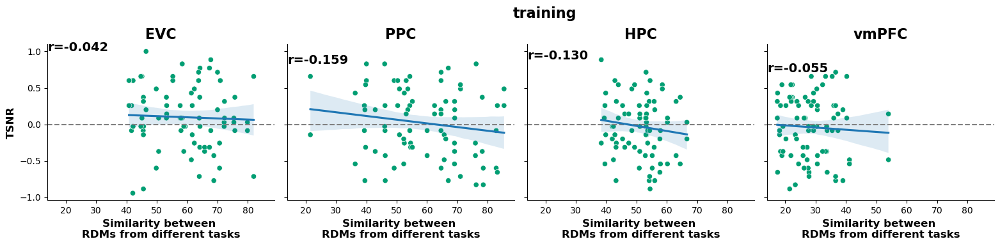

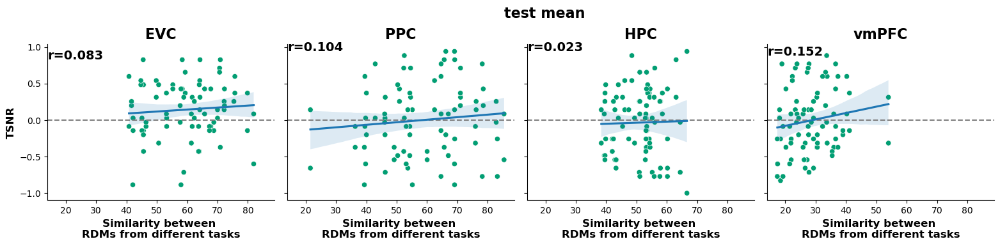

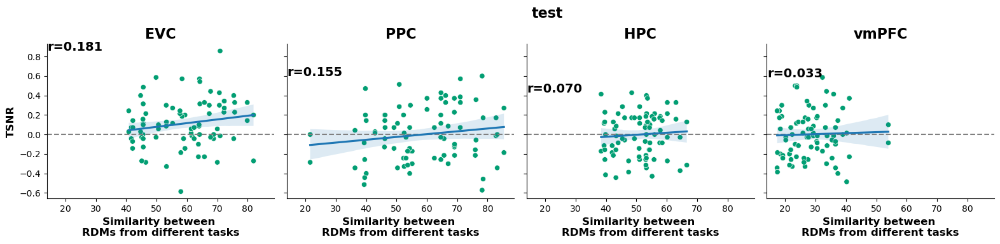

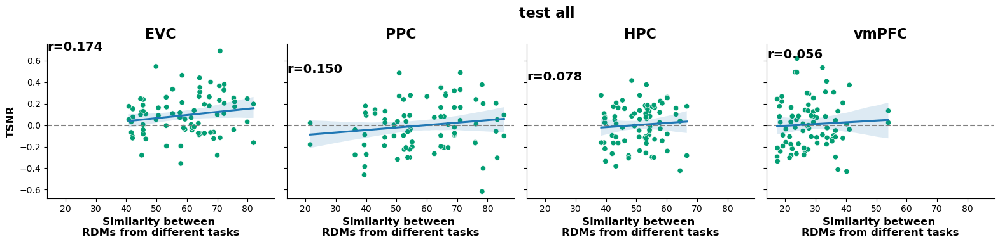

In [140]:


tsnr_df = pd.read_csv(os.path.join(ROIRSAdir,"taskrdms_similarity","voxel_tsnr_df.csv"))
tsnr_df["meantask_tsnr"] = tsnr_df[["lzer_tsnr","navi_tsnr"]].mean(axis=1)
crosstask_rsa_df_sum_overaxis = crosstask_rsa_df_sum.groupby(
    ["roi","subid","navi_stim_group"])[["coefficient","z_coefficient"]].mean().reset_index()
crosstask_rsa_df_sum_overaxis["subgroup"] = pd.Categorical(
        crosstask_rsa_df_sum_overaxis.subid.map(lambda x: "Generalizer" if x in generalizers else "nonGeneralizer"),
        categories=["Generalizer","nonGeneralizer"],
        ordered=True
    ) 


xvar, gvar, yvar, yvartest = "meantask_tsnr",  "subgroup", "coefficient", "coefficient"
colvar, colnamedict = "roi", roi_shortnames
split_plot_var = "navi_stim_group"

for a in crosstask_rsa_df_sum_overaxis[split_plot_var].unique():
    atitle = a
    curr_pdf = crosstask_rsa_df_sum[(crosstask_rsa_df_sum[split_plot_var]==a)].copy().reset_index(drop=True)
    assert curr_pdf.shape[0]>0, f"No data for {a}"
    
    curr_pdf = curr_pdf.merge(tsnr_df, how='left', on=["roi","subid","subgroup"])
    curr_pdf = curr_pdf.query("subgroup=='Generalizer'").copy()
    curr_pdf.roi = pd.Categorical(curr_pdf.roi,
                            categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],
                            ordered=True)  
    gs = sns.relplot(data=curr_pdf,
                x=xvar,y=yvar,
                col = colvar,
                hue=gvar, palette=participantgrouphex,
                kind="scatter",
                height=4,aspect=1
                ).refline(y=0).set_titles("{col_name}")
    gs.map_dataframe(sns.regplot,x=xvar,y=yvar,
                     scatter=False
                    )


    for ax in gs.axes.flatten():
        axdf = curr_pdf[curr_pdf[colvar]==ax.get_title()].copy()
        ax.set_title(roi_shortnames[axdf[colvar].values[0]],**def_font_subplot_titles)
        ax.set_ylabel("TSNR",**def_font_axis_legend_titles)
        ax.set_xlabel("Similarity between \nRDMs from different tasks",**def_font_axis_legend_titles)
        plt.setp(ax.get_xticklabels(),**def_font_axis_tick_labels)
            
        pval = correlation_equiv_permutation(y1=axdf[yvar].values,
                                             y2=axdf[xvar].values,
                                             corrfun=lambda x,y: scipy.stats.pearsonr(x,y).statistic)
        rval = scipy.stats.pearsonr(axdf[yvar].values, axdf[xvar].values).statistic
        print(f"{roi_shortnames[axdf[colvar].values[0]]} - r-val = {rval:.3f}, p-value = {pval:.3f}")
        ax.text(x=ax.get_xlim()[0]+0.1,
                y=axdf[yvar].values.max(),
                s=f'r={rval:.3f}{gen_pval_annot(pval,show_pval=False).replace("p=","")}',
                size=14,fontweight="bold")
    gs.legend.remove()
    gs.figure.suptitle(f"{atitle}",y=0.95,x=0.5,**def_font_subplot_titles)
    gs.tight_layout()

### get mean rdm from task to check

In [ ]:
#run RSA analysis
trstim_rdms, lzerstim_rdms = {}, {}
filtered_roi_data = {roi: [] for roi in rois}
crosstask_rsa_df_list = []
for roi in rois:
    trstim_rdms[roi] = []
    lzerstim_rdms[roi] = []
    for subdata,subid in zip(roi_data[roi],subid_list):
        print(f"{roi} - {subid}",end="\r",flush=True)
        subgroup = "Generalizer" if subid in generalizers else "nonGeneralizer"
        subcohort = "first cohort" if subid in cohort1ids else "second cohort"
        preprocedX = deepcopy(subdata["preprocX"])#deepcopy(subdata["rawX"])#
        stimdf = subdata["stimdf"].copy()
        

        #get treasure hunt data and average across sessions
        navi_filter = stimdf.taskname.to_numpy() == "navigation"
        non_center_filter = [not all([x==0, y==0]) for x,y in stimdf[["stim_x","stim_y"]].to_numpy()]
        ncnavi_filter = np.all([navi_filter,non_center_filter],axis=0)
        navi_X = np.mean(split_data(X      = preprocedX[ncnavi_filter,:],
                                    groups = stimdf[ncnavi_filter].copy().stim_session.to_numpy()),
                        axis=0)
        navi_stim_df = stimdf[ncnavi_filter&(stimdf.stim_session==0)].copy().reset_index(drop=True)
        
        # get localizer task data
        lzer_filter = stimdf.taskname.to_numpy() == "localizer"
        non_center_filter = [not all([x==0, y==0]) for x,y in stimdf[["stim_x","stim_y"]].to_numpy()]
        nclzer_filter = np.all([lzer_filter,non_center_filter],axis=0)
        lzer_X = preprocedX[nclzer_filter,:]
        lzer_stim_df = stimdf[nclzer_filter].copy().reset_index(drop=True)
        
        # concatenate localizer and navigation data
        crosstask_X = np.concatenate([navi_X,lzer_X], axis=0)
        crosstask_stim_df = pd.concat([navi_stim_df,lzer_stim_df], axis=0).reset_index(drop=True)
        crosstask_stim_df["tasknum"] = crosstask_stim_df.taskname.map({"navigation":0,"localizer":1})
        crosstask_stim_dict = crosstask_stim_df.to_dict('list')

        filtered_roi_data[roi].append(
            [subid,crosstask_X,crosstask_stim_df]
        )

        submodelrdm = ModelRDM(
            stimid      = crosstask_stim_dict["stim_id"],
            stimgtloc   = np.vstack([crosstask_stim_dict["stim_x"],crosstask_stim_dict["stim_y"]]).T,
            stimfeature = np.vstack([crosstask_stim_dict["stim_color"],crosstask_stim_dict["stim_shape"]]).T,
            stimgroup   = crosstask_stim_dict["stim_group"],
            sessions    = crosstask_stim_dict["tasknum"],
            nan_identity = False,
            splitgroup   = True
        )

        prim_reg_names = ["gtlocEuclidean","feature"]
                
        analyses = [
            {"name": "cross-task(stim2loc) train2train same2same",
            "reg_names": ["between_trainstimpairs_stimuli"],
            "short_names":  ["same2same"]
            },
            {"name": "cross-task(stim2loc) all2train same2same",
            "reg_names": ["between_stimuli"],
            "short_names":  ["same2same"]
            },
            

            {"name": "cross-task(stim2loc) train2train Compete Feature Cartesian",
            "reg_names": [f"between_trainstimpairs_{x}" for x in prim_reg_names],
            "short_names":  prim_reg_names
            },

            {"name": "cross-task(stim2loc) test2train Compete Feature Cartesian",
            "reg_names": [f"between_mixedstimpairs_{x}" for x in prim_reg_names],
            "short_names":  prim_reg_names
            },
            {"name": "cross-task(stim2loc) all2train Compete Feature Cartesian",
            "reg_names": [f"between_{x}" for x in prim_reg_names],
            "short_names":  prim_reg_names
            }
            
        ]
        
        for analysis_dict in analyses:
            reg_names, short_names = analysis_dict["reg_names"], analysis_dict["short_names"]
            reg_vals  = [submodelrdm.models[k] for k in reg_names]
            if len(reg_names)>1: # get regression coefficients if number of model rdm is more than 1
                reg_estimator  = MultipleRDMRegression(crosstask_X,
                                                    modelrdms=reg_vals,
                                                    modelnames=short_names,
                                                    rdm_metric="correlation")
            else: # get z-transformed spearman correlation coefficient if only one model rdm
                reg_estimator  = PatternCorrelation(crosstask_X,
                                                    modelrdms=reg_vals,
                                                    modelnames=short_names,
                                                    rdm_metric="correlation",
                                                    type="spearman",
                                                    ztransform=True)
            reg_estimator.fit()
            res_df = pd.DataFrame(
                {"modelrdm":   reg_estimator.modelnames,
                "coefficient": reg_estimator.result}
            ).assign(
            roi = roi,
            subid=subid,
            subgroup=subgroup,
            cohort = subcohort,
            analysis = analysis_dict["name"],
            adjR2 = reg_estimator.adjR2 if len(reg_names)>1 else np.nan,
            R2    = reg_estimator.R2 if len(reg_names)>1 else np.nan,
            )
            crosstask_rsa_df_list.append(res_df)


        ## compare lzer to navi train
        #get treasure hunt training stim data and average across sessions
        training_filter = stimdf.stim_group.to_numpy() == 1
        ncnavitrain_filter = np.all([navi_filter,non_center_filter,training_filter],axis=0)
        navitr_X = np.mean(split_data(X      = preprocedX[ncnavitrain_filter,:],
                                    groups = stimdf[ncnavitrain_filter].copy().stim_session.to_numpy()),
                        axis=0)
        navitr_stim_df = stimdf[ncnavitrain_filter&(stimdf.stim_session==0)].copy().reset_index(drop=True)
        
        new_order_navitr = navitr_stim_df.sort_values(["training_axset","training_axlocTL"]).index.to_numpy()
        new_order_lzer = lzer_stim_df.sort_values(["training_axset","training_axlocTL"]).index.to_numpy()

        navitr_rdm = compute_rdm(navitr_X[new_order_navitr,:],"correlation")
        lzer_rdm = compute_rdm(lzer_X[new_order_lzer,:],"correlation")

        trstim_rdms[roi].append(navitr_rdm)
        lzerstim_rdms[roi].append(lzer_rdm)
        
        corrval = scipy.stats.spearmanr(lower_tri(navitr_rdm)[0],
                              lower_tri(lzer_rdm)[0]).correlation
        res_df = pd.DataFrame(
                {"modelrdm":   ["localizer_rep"],
                "coefficient": [corrval]},
                index = [0]
            ).assign(
            roi = roi,
            subid=subid,
            subgroup=subgroup,
            cohort = subcohort,
            analysis = "lzer rdm vs navi train rdm",
            adjR2 = np.nan,
            R2    = np.nan,
            )
        crosstask_rsa_df_list.append(res_df)


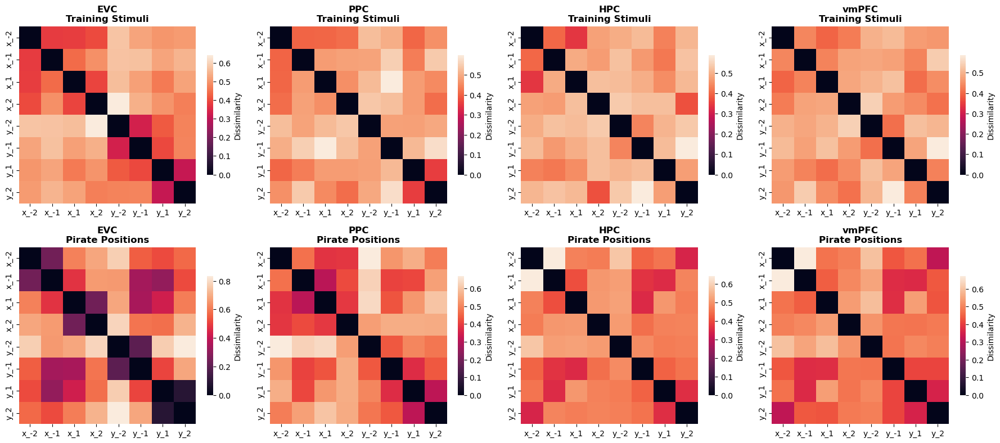

In [ ]:
# mean rdm of training stimuli and localizer stimuli
fig_rdm,axes_rdm = plt.subplots(1,2,figsize=(18,8))
ticklabels = [f"{['x','y'][int(ax)]}_{int(loc*2)}" for ax,loc in lzer_stim_df[["training_axset","training_axlocTL"]].to_numpy()[new_order_lzer,:]]
for j, roi in enumerate(["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"]):
    sns.heatmap(
        np.mean([minmax_scale(x) for x,subid in zip(trstim_rdms[roi],subid_list) if subid in generalizers],axis=0),
        square=True,ax=axes_rdm[0,j],
        xticklabels=ticklabels,
        yticklabels=ticklabels,
        cbar_kws={"shrink": 0.6, "label": "Dissimilarity"},
        cbar=True#submodelrdm.models["between_stimuli"],
    )
    axes_rdm[0,j].set_title(f"{roi_shortnames[roi]}\nTraining Stimuli",**def_font_axis_legend_titles)
    sns.heatmap(
        np.mean([minmax_scale(x) for x,subid in zip(lzerstim_rdms[roi],subid_list) if subid in generalizers],axis=0),
        square=True,ax=axes_rdm[1,j],
        xticklabels=ticklabels,
        yticklabels=ticklabels,
        cbar_kws={"shrink": 0.6, "label": "Dissimilarity"},
        cbar=True
        #submodelrdm.models["between_stimuli"],
    )
    axes_rdm[1,j].set_title(f"{roi_shortnames[roi]}\nPirate Positions",**def_font_axis_legend_titles)
fig_rdm.tight_layout()

In [1117]:
crosstask_rsa_df = pd.concat(crosstask_rsa_df_list,axis=0).reset_index(drop=True)
print(crosstask_rsa_df.shape)
print(f"unique analysis names: {np.unique(crosstask_rsa_df.analysis)}")
print(f"unique modelrdm names: {np.unique(crosstask_rsa_df.modelrdm)}")
crosstask_rsa_df.head(5)

(2016, 9)
unique analysis names: ['cross-task(stim2loc) all2train Compete Feature Cartesian'
 'cross-task(stim2loc) all2train same2same'
 'cross-task(stim2loc) test2train Compete Feature Cartesian'
 'cross-task(stim2loc) train2train Compete Feature Cartesian'
 'cross-task(stim2loc) train2train same2same' 'lzer rdm vs navi train rdm']
unique modelrdm names: ['feature' 'gtlocEuclidean' 'localizer_rep' 'same2same']


,modelrdm,coefficient,roi,subid,subgroup,cohort,analysis,adjR2,R2
0,same2same,0.007673,PPC_bilateral,sub001,Generalizer,first cohort,cross-task(stim2loc) train2train same2same,NaN,NaN
1,same2same,0.026811,PPC_bilateral,sub001,Generalizer,first cohort,cross-task(stim2loc) all2train same2same,NaN,NaN
2,gtlocEuclidean,-0.052321,PPC_bilateral,sub001,Generalizer,first cohort,cross-task(stim2loc) train2train Compete Featu...,0.000890,0.016749
3,feature,0.145766,PPC_bilateral,sub001,Generalizer,first cohort,cross-task(stim2loc) train2train Compete Featu...,0.000890,0.016749
4,gtlocEuclidean,0.171749,PPC_bilateral,sub001,Generalizer,first cohort,cross-task(stim2loc) test2train Compete Featur...,0.037458,0.045037


In [1140]:
cross_task_analysis_dict = {
    "train2test": ["training","test"],
    "lzer2train": ["localizer","training"],
    "lzer2test": ["localizer","test"],
    "lzer2navi": ["localizer","navigation"],
}
rsa_analysis_dict = [
            
            {"name": "cross-task RSA Compete Feature Cartesian",
            "reg_names": [f"between_{x}" for x in prim_reg_names],
            "short_names":  prim_reg_names
            },
            
            {"name": "cross-task RSA WithinAx Compete Feature Cartesian",
            "reg_names": [f"between_withinxy_{x}" for x in prim_reg_names],
            "short_names":  prim_reg_names
            },
            
            {"name": "cross-task RSA AcrossAx Compete Feature Cartesian",
            "reg_names": [f"between_betweenxy_{x}" for x in prim_reg_names],
            "short_names":  prim_reg_names
            }
            
        ]
    
APlinreg_res_list = {"df":[],"rdm":{roi: dict(zip(cross_task_analysis_dict.keys(),[[],[],[],[]])) for roi in rois}}
crossRSA_res_list = {"df":[],"rdm":{roi: dict(zip(cross_task_analysis_dict.keys(),[[],[],[],[]])) for roi in rois}}

for roi in rois:
    print(f"{roi} - {subid}",end="\r",flush=True)
    for subid, crosstask_X, crosstask_stim_df in filtered_roi_data[roi]:
        subgroup = "Generalizer" if subid in generalizers else "nonGeneralizer"
        subcohort = "first cohort" if subid in cohort1ids else "second cohort"
        
        reordered_df = crosstask_stim_df.sort_values(["taskname","stim_group","training_axset","training_axlocTL","stim_x","stim_y"])
        new_order = reordered_df.index.to_numpy()
        reordered_crosstask_X = crosstask_X[new_order,:]
        
        testfilt = np.vstack([reordered_df.taskname.values == "navigation",
                              reordered_df.stim_group.values == 0]).all(axis=0)
        trainingfilt = np.vstack([reordered_df.taskname.values == "navigation",
                                  reordered_df.stim_group.values == 1]).all(axis=0)
        lzerfilt = reordered_df.taskname.values == "localizer"
        filt_dict = {
            "test": testfilt,
            "training": trainingfilt,
            "localizer": lzerfilt,
            "navigation": reordered_df.taskname.values == "navigation"
        }

        assert testfilt.sum() == 16, f"Test data should have 16 stimuli, but found {testfilt.sum()}"
        assert trainingfilt.sum() == 8, f"Training data should have 8 stimuli (excluding central), but found {trainingfilt.sum()}"
        assert lzerfilt.sum() == 8, f"Localizer data should have 8 stimuli (excluding central), but found {lzerfilt.sum()}"

        for crosstaskgroups, (indvar,tar) in cross_task_analysis_dict.items():
            # get filter
            indvar_filt, tar_filt = filt_dict[indvar], filt_dict[tar]
            
            # get AP matrix
            indv_X = reordered_crosstask_X[indvar_filt,:]
            tar_X = reordered_crosstask_X[tar_filt,:] 
            
            # run in the form of retrieval pattern without CV
            APlinreg_estimator = LinearRegression(fit_intercept=True,positive=False).fit(indv_X.T,tar_X.T)
            sub_APlinreg_mat = APlinreg_estimator.coef_
            assert np.logical_and(sub_APlinreg_mat.shape[0] == (tar_filt.sum()),
                                  sub_APlinreg_mat.shape[1] == (indvar_filt.sum())), \
                f"Coefficient shape mismatch: {sub_APlinreg_mat.shape} for {crosstaskgroups} analysis, expected shape ({tar_filt.sum()},{indvar_filt.sum()})"
            APlinreg_res_list["rdm"][roi][crosstaskgroups].append(sub_APlinreg_mat)

            indvar_locrep  = reordered_df[indvar_filt].copy()[["stim_x","stim_y"]].to_numpy()*2
            tarvar_locrep = reordered_df[tar_filt].copy()[["stim_x","stim_y"]].to_numpy()*2
            if crosstaskgroups == "lzer2train":
                percept_reg_coefs = cdist(tarvar_locrep, indvar_locrep, lambda u,v: 1*np.array_equal(u,v))
            else:
                percept_reg_coefs = cdist(tarvar_locrep, indvar_locrep, lambda u,v: sum(u==v))
            dist_mod_reg_coefs = LinearRegression(fit_intercept=False,positive=False).fit(indvar_locrep.T, tarvar_locrep.T).coef_
            pdcoef = LinearRegression(fit_intercept=True).fit(
                        X=np.array([scale_feature(dist_mod_reg_coefs.flatten(),2),scale_feature(percept_reg_coefs.flatten(),2)]).T,
                        y=scale_feature(sub_APlinreg_mat.flatten(),2)
                    ).coef_
            res_df = pd.DataFrame(
                    {"modelrdm":   ["reg_distmod","reg_percept"],
                    "coefficient": pdcoef}
                ).assign(
                    roi = roi,
                    subid=subid,
                    subgroup=subgroup,
                    cohort = subcohort,
                    analysis = "RtrvlPAT",
                    crosstaskgroups = crosstaskgroups,
                    adjR2 = reg_estimator.adjR2 if len(reg_names)>1 else np.nan,
                    R2    = reg_estimator.R2 if len(reg_names)>1 else np.nan,
                    )
            APlinreg_res_list["df"].append(res_df)
            

            # run in the form of cross-task RSA
            crosstask_rdm = 1-cdist(tar_X, indv_X,  "correlation")
            crossRSA_res_list["rdm"][roi][crosstaskgroups].append(
                (crosstask_rdm, reordered_df[indvar_filt].copy(), reordered_df[tar_filt].copy())
                )

            stacked_X = np.vstack([indv_X,tar_X])
            stacked_df = pd.concat([reordered_df[indvar_filt].copy(),reordered_df[tar_filt].copy()],axis=0).reset_index(drop=True)
            stacked_dict = stacked_df.to_dict('list')

            submodelrdm = ModelRDM(
                stimid      = stacked_dict["stim_id"],
                stimgtloc   = np.vstack([stacked_dict["stim_x"],stacked_dict["stim_y"]]).T,
                stimfeature = np.vstack([stacked_dict["stim_color"],stacked_dict["stim_shape"]]).T,
                stimgroup   = stacked_dict["stim_group"],
                sessions    = stacked_dict["tasknum"],
                nan_identity = False,
                splitgroup   = True
            )            
            for rsa_ana_dict in rsa_analysis_dict:
                reg_names = [x for x in rsa_ana_dict["reg_names"] if x in submodelrdm.models.keys()] 
                short_names = [y for x,y in zip(rsa_ana_dict["reg_names"], rsa_ana_dict["short_names"]) if x in submodelrdm.models.keys()] 
                reg_vals  = [submodelrdm.models[k] for k in reg_names]
                if len(reg_names)>1: # get regression coefficients if number of model rdm is more than 1
                    reg_estimator  = MultipleRDMRegression(stacked_X,
                                                        modelrdms=reg_vals,
                                                        modelnames=short_names,
                                                        rdm_metric="correlation")
                else: # get z-transformed spearman correlation coefficient if only one model rdm
                    reg_estimator  = PatternCorrelation(stacked_X,
                                                        modelrdms=reg_vals,
                                                        modelnames=short_names,
                                                        rdm_metric="correlation",
                                                        type="spearman",
                                                        ztransform=True)
                reg_estimator.fit()
                res_df = pd.DataFrame(
                    {"modelrdm":   reg_estimator.modelnames,
                    "coefficient": reg_estimator.result}
                ).assign(
                    roi = roi,
                    subid=subid,
                    subgroup=subgroup,
                    cohort = subcohort,
                    analysis = rsa_ana_dict["name"],
                    crosstaskgroups = crosstaskgroups,
                    adjR2 = reg_estimator.adjR2 if len(reg_names)>1 else np.nan,
                    R2    = reg_estimator.R2 if len(reg_names)>1 else np.nan,
                    )
                crossRSA_res_list["df"].append(res_df)


In [1029]:
tar_X.shape

(24, 1078)

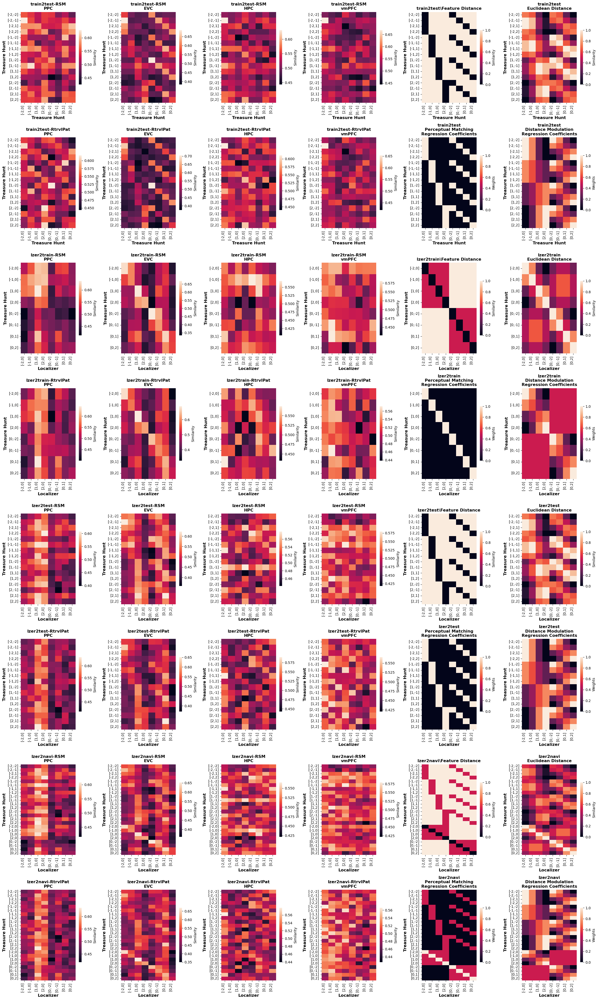

In [1058]:

fig_rsa,axes_rsa = plt.subplots(len(cross_task_analysis_dict)*2,len(rois)+2,figsize=((len(rois)+2)*4,len(cross_task_analysis_dict)*2*5))

for jrows, crosstaskgroups in enumerate(cross_task_analysis_dict.keys()):
    for jcol, roi in enumerate(["PPC_bilateral","V1_bilateral","HPC_bilateral","vmPFC_bilateral"]):
        mean_crosstask_rdm = {
            "Generalizer": np.mean([minmax_scale_anyD(x[0]) for x,subid in zip(crossRSA_res_list["rdm"][roi][crosstaskgroups],subid_list) if subid in generalizers],axis=0)
        }
        mean_retrievalweights = {
            "Generalizer": np.mean([minmax_scale_anyD(x) for x,subid in zip(APlinreg_res_list["rdm"][roi][crosstaskgroups],subid_list) if subid in generalizers],axis=0)
        }

        exp_indvardf = crossRSA_res_list["rdm"][roi][crosstaskgroups][0][1].copy()
        exp_tardf = crossRSA_res_list["rdm"][roi][crosstaskgroups][0][2].copy()
        xticklabels = [f"[{int(xloc*2)},{int(yloc*2)}]" for taskname,xloc,yloc in exp_indvardf[["taskname","stim_x","stim_y"]].to_numpy()]
        yticklabels = [f"[{int(xloc*2)},{int(yloc*2)}]" for taskname,xloc,yloc in exp_tardf[["taskname","stim_x","stim_y"]].to_numpy()]

        indvar_locrep  = exp_indvardf[["stim_x","stim_y"]].to_numpy()*2
        tarvar_locrep = exp_tardf[["stim_x","stim_y"]].to_numpy()*2

        sns.heatmap(
            mean_crosstask_rdm["Generalizer"],#minmax_scale_anyD(),
            square=False,ax=axes_rsa[jrows*2,jcol], 
            xticklabels=xticklabels,
            yticklabels=yticklabels,
            cbar_kws={"shrink": 0.6, "label": "Similarity"},
            cbar=True
        )
        axes_rsa[jrows*2,jcol].set_title(f"{crosstaskgroups}-RSM\n{roi_shortnames[roi]}",**def_font_axis_legend_titles)
        
        
        sns.heatmap(
            mean_retrievalweights["Generalizer"],#minmax_scale_anyD(),
            square=False,ax=axes_rsa[jrows*2+1,jcol], 
            xticklabels=xticklabels,
            yticklabels=yticklabels,
            cbar_kws={"shrink": 0.6, "label": "Similarity"},
            cbar=True
        )
        axes_rsa[jrows*2+1,jcol].set_title(f"{crosstaskgroups}-RtrvlPat\n{roi_shortnames[roi]}",**def_font_axis_legend_titles)

    feat_rdm = cdist(tarvar_locrep, indvar_locrep, lambda u,v: sum(u==v))
    euc_rdm = cdist(tarvar_locrep, indvar_locrep, "euclidean")
    sns.heatmap(
            minmax_scale_anyD(-feat_rdm),#-feat_rdm,#minmax_scale_anyD(-feat_rdm),
            square=False,ax=axes_rsa[jrows*2,-2],
            xticklabels=xticklabels,
            yticklabels=yticklabels,
            cbar_kws={"shrink": 0.6, "label": "Similarity"},
            cbar=True
        )
    axes_rsa[jrows*2,-2].set_title(f"{crosstaskgroups}\Feature Distance",**def_font_axis_legend_titles)
    sns.heatmap(
            minmax_scale_anyD(-euc_rdm),#-euc_rdm,#minmax_scale_anyD(),
            square=False,ax=axes_rsa[jrows*2,-1],
            xticklabels=xticklabels,
            yticklabels=yticklabels,
            cbar_kws={"shrink": 0.6, "label": "Similarity"},
            cbar=True
        )
    axes_rsa[jrows*2,-1].set_title(f"{crosstaskgroups}\nEuclidean Distance",**def_font_axis_legend_titles)
    
    if crosstaskgroups == "lzer2train":
        perceptmodregcoef = cdist(tarvar_locrep, indvar_locrep, lambda u,v: 1*np.array_equal(u,v))
    else:
        perceptmodregcoef = cdist(tarvar_locrep, indvar_locrep, lambda u,v: sum(u==v))
    distmodregcoef = LinearRegression(fit_intercept=False,positive=False).fit(indvar_locrep.T, tarvar_locrep.T).coef_
    sns.heatmap(
            minmax_scale_anyD(perceptmodregcoef),#perceptmodregcoef,#minmax_scale_anyD(),
            square=False,ax=axes_rsa[jrows*2+1,-2],
            xticklabels=xticklabels,
            yticklabels=yticklabels,
            cbar_kws={"shrink": 0.6, "label": "Weights"},
            cbar=True
        )
    axes_rsa[jrows*2+1,-2].set_title(f"{crosstaskgroups}\nPerceptual Matching\nRegression Coefficients",**def_font_axis_legend_titles)
    sns.heatmap(
            minmax_scale_anyD(distmodregcoef),#distmodregcoef,#minmax_scale_anyD(),
            square=False,ax=axes_rsa[jrows*2+1,-1],
            xticklabels=xticklabels,
            yticklabels=yticklabels,
            cbar_kws={"shrink": 0.6, "label": "Weights"},
            cbar=True
        )
    axes_rsa[jrows*2+1,-1].set_title(f"{crosstaskgroups}\nDistance Modulation\nRegression Coefficients",**def_font_axis_legend_titles)

for ax in axes_rsa.flatten():
    if "lzer" in ax.get_title():
        ax.set_xlabel("Localizer",**def_font_axis_legend_titles)
    else:
        ax.set_xlabel("Treasure Hunt",**def_font_axis_legend_titles)
    ax.set_ylabel("Treasure Hunt",**def_font_axis_legend_titles)
    ax.set_xticklabels(ax.get_xticklabels(),rotation=90,ha="right",**def_font_axis_tick_labels)
    ax.set_yticklabels(ax.get_yticklabels(),rotation=0,ha="right",**def_font_axis_tick_labels)
    ax.tick_params(labelleft=True, labelbottom=True)
    ax.xaxis.label.set_visible(True)
    ax.yaxis.label.set_visible(True)


fig_rsa.tight_layout()

In [1132]:
crossRSA_res_df = pd.concat(crossRSA_res_list["df"],axis=0).reset_index(drop=True)
print(crossRSA_res_df.shape)
print(f"unique analysis names: {np.unique(crossRSA_res_df.analysis)}")
print(f"unique modelrdm names: {np.unique(crossRSA_res_df.modelrdm)}")
print(f"unique crosstaskgroups: {np.unique(crossRSA_res_df.crosstaskgroups)}")
crossRSA_res_df.head(5)

(2688, 10)
unique analysis names: ['cross-task RSA AcrossAx Compete Feature Cartesian'
 'cross-task RSA Compete Feature Cartesian'
 'cross-task RSA WithinAx Compete Feature Cartesian']
unique modelrdm names: ['feature' 'gtlocEuclidean']
unique crosstaskgroups: ['lzer2navi' 'lzer2test' 'lzer2train']


,modelrdm,coefficient,roi,subid,subgroup,cohort,analysis,crosstaskgroups,adjR2,R2
0,gtlocEuclidean,-0.052321,PPC_bilateral,sub001,Generalizer,first cohort,cross-task RSA Compete Feature Cartesian,lzer2train,0.000890,0.016749
1,feature,0.145766,PPC_bilateral,sub001,Generalizer,first cohort,cross-task RSA Compete Feature Cartesian,lzer2train,0.000890,0.016749
2,gtlocEuclidean,0.042897,PPC_bilateral,sub001,Generalizer,first cohort,cross-task RSA WithinAx Compete Feature Cartesian,lzer2train,NaN,NaN
3,gtlocEuclidean,-0.370239,PPC_bilateral,sub001,Generalizer,first cohort,cross-task RSA AcrossAx Compete Feature Cartesian,lzer2train,NaN,NaN
4,gtlocEuclidean,0.171749,PPC_bilateral,sub001,Generalizer,first cohort,cross-task RSA Compete Feature Cartesian,lzer2test,0.037458,0.045037


In [1141]:
APlinreg_res_df = pd.concat(APlinreg_res_list["df"],axis=0).reset_index(drop=True)
print(APlinreg_res_df.shape)
print(f"unique analysis names: {np.unique(APlinreg_res_df.analysis)}")
print(f"unique modelrdm names: {np.unique(APlinreg_res_df.modelrdm)}")
print(f"unique crosstaskgroups: {np.unique(APlinreg_res_df.crosstaskgroups)}")
APlinreg_res_df.head(5)

(1792, 10)
unique analysis names: ['RtrvlPAT']
unique modelrdm names: ['reg_distmod' 'reg_percept']
unique crosstaskgroups: ['lzer2navi' 'lzer2test' 'lzer2train' 'train2test']


,modelrdm,coefficient,roi,subid,subgroup,cohort,analysis,crosstaskgroups,adjR2,R2
0,reg_distmod,-0.105607,PPC_bilateral,sub001,Generalizer,first cohort,RtrvlPAT,train2test,NaN,NaN
1,reg_percept,0.015348,PPC_bilateral,sub001,Generalizer,first cohort,RtrvlPAT,train2test,NaN,NaN
2,reg_distmod,0.075922,PPC_bilateral,sub001,Generalizer,first cohort,RtrvlPAT,lzer2train,NaN,NaN
3,reg_percept,0.064441,PPC_bilateral,sub001,Generalizer,first cohort,RtrvlPAT,lzer2train,NaN,NaN
4,reg_distmod,0.234102,PPC_bilateral,sub001,Generalizer,first cohort,RtrvlPAT,lzer2test,NaN,NaN


EVC ('reg_distmod', 'Generalizer') 9.999000099990002e-05
EVC ('reg_distmod', 'nonGeneralizer') 0.0015998400159984002
EVC ('reg_percept', 'Generalizer') 9.999000099990002e-05
EVC ('reg_percept', 'nonGeneralizer') 0.014898510148985102
PPC ('reg_distmod', 'Generalizer') 0.918008199180082
PPC ('reg_distmod', 'nonGeneralizer') 0.9239076092390761
PPC ('reg_percept', 'Generalizer') 0.0165983401659834
PPC ('reg_percept', 'nonGeneralizer') 9.999000099990002e-05
HPC ('reg_distmod', 'Generalizer') 0.5609439056094391
HPC ('reg_distmod', 'nonGeneralizer') 0.1987801219878012
HPC ('reg_percept', 'Generalizer') 0.5589441055894411
HPC ('reg_percept', 'nonGeneralizer') 0.8996100389961004
vmPFC ('reg_distmod', 'Generalizer') 0.5181481851814819
vmPFC ('reg_distmod', 'nonGeneralizer') 0.09709029097090291
vmPFC ('reg_percept', 'Generalizer') 0.37976202379762025
vmPFC ('reg_percept', 'nonGeneralizer') 0.45515448455154484
EVC ('reg_distmod', 'Generalizer') 9.999000099990002e-05
EVC ('reg_distmod', 'nonGeneral

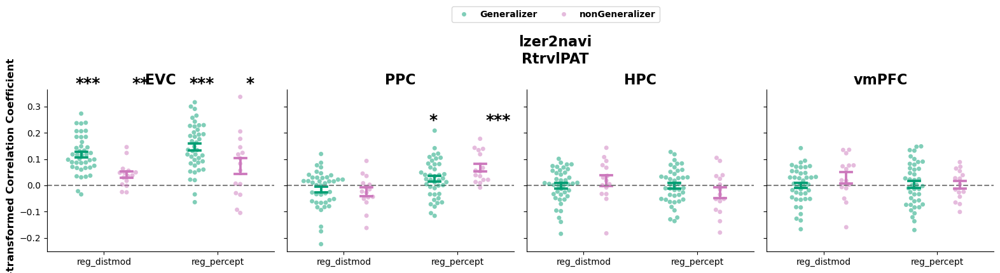

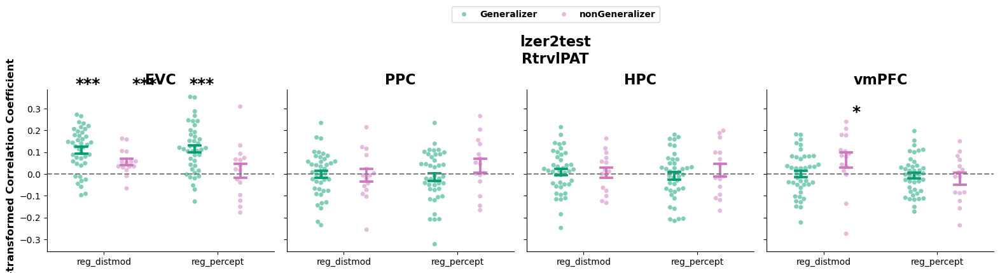

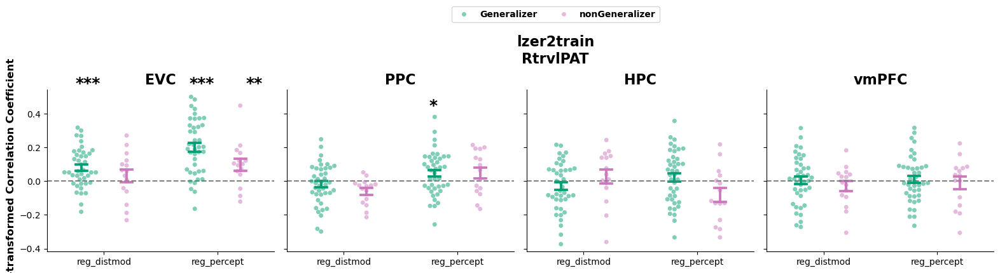

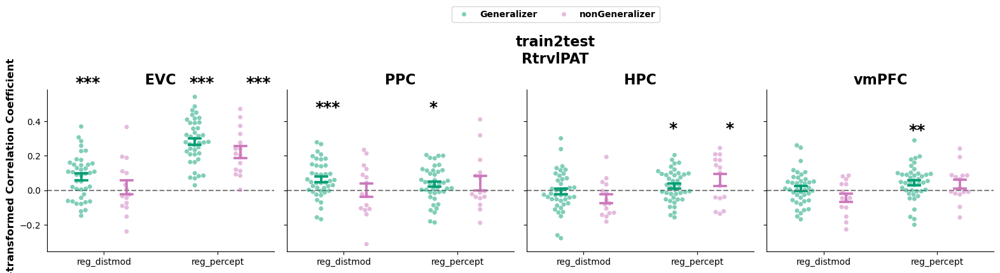

In [1142]:
# test if coefficients are significantly above zero
xvar, gvar, yvar, yvartest = "modelrdm",  "subgroup", "coefficient", "coefficient"


for a in APlinreg_res_df.analysis.unique():
    atitle = a
    for ctg in np.unique(APlinreg_res_df.crosstaskgroups):
        curr_pdf = APlinreg_res_df[(APlinreg_res_df.analysis==a)&(APlinreg_res_df.crosstaskgroups==ctg)].copy().reset_index(drop=True)
        assert curr_pdf.shape[0]>0, f"No data for {a} - {ctg}"
        curr_pdf.modelrdm = pd.Categorical(curr_pdf.modelrdm)
        #print(curr_pdf.modelrdm.nunique())
        
        curr_pdf.roi = pd.Categorical(curr_pdf.roi,
                                    categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],
                                    ordered=True)

        gs = sns.catplot(data=curr_pdf,
                    x=xvar,y=yvar,
                    col="roi",
                    hue="subgroup",palette=participantgrouphex,
                    kind="point",errorbar="se",capsize=0.1,markersize=0,linestyle="none",dodge=.4,
                    #kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
                    #inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
                    height=4,aspect=1
                    ).refline(y=0).set_titles("{col_name}")
        gs.map_dataframe(sns.swarmplot,x=xvar,y=yvar,
                        hue="subgroup",palette=participantgrouphex,dodge=0.5,
                        alpha=0.5
                        )


        for ax in gs.axes.flatten():
            axdf = curr_pdf[curr_pdf.roi==ax.title.get_text()]
            ax.set_title(roi_shortnames[axdf.roi.values[0]],**def_font_subplot_titles)
            if "Compete" not in a:
                ax.set_ylabel("Z-transformed Correlation Coefficient",**def_font_axis_legend_titles)
            else:
                ax.set_ylabel("Regression Coefficient",**def_font_axis_legend_titles)
            ax.set_xlabel("")
            plt.setp(ax.get_xticklabels(),**def_font_axis_tick_labels)
            for j,(tar,tardf) in enumerate(axdf.groupby([xvar,"subgroup"])):
                
                pval = ttest1samp_equiv_permutation(tardf[yvar].values,alternative="greater")
                print(ax.title.get_text(), tar,pval)
                minorplus = 1*((j%2)==1)
                dw = [-.25,0.25][minorplus]
                
                ax.text(x=np.floor(j/2)+dw,y=1.1*axdf[yvar].max(),
                        s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                        size=18,fontweight="bold")
        gs.legend.remove()    
        hs,ls = gs.axes.flatten()[0].get_legend_handles_labels()
        gs.figure.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
                prop = dict(weight="bold"))
        gs.figure.suptitle(f"{ctg}\n{atitle}",y=0.95,x=0.5,**def_font_subplot_titles)
        gs.tight_layout()


EVC ('feature', 'Generalizer') 9.999000099990002e-05
EVC ('feature', 'nonGeneralizer') 0.22557744225577442
EVC ('gtlocEuclidean', 'Generalizer') 9.999000099990002e-05
EVC ('gtlocEuclidean', 'nonGeneralizer') 0.00029997000299970003
PPC ('feature', 'Generalizer') 0.25517448255174485
PPC ('feature', 'nonGeneralizer') 9.999000099990002e-05
PPC ('gtlocEuclidean', 'Generalizer') 0.3143685631436856
PPC ('gtlocEuclidean', 'nonGeneralizer') 0.9542045795420458
HPC ('feature', 'Generalizer') 0.8317168283171683
HPC ('feature', 'nonGeneralizer') 0.9163083691630837
HPC ('gtlocEuclidean', 'Generalizer') 0.1406859314068593
HPC ('gtlocEuclidean', 'nonGeneralizer') 0.026997300269973004
vmPFC ('feature', 'Generalizer') 0.5677432256774323
vmPFC ('feature', 'nonGeneralizer') 0.2608739126087391
vmPFC ('gtlocEuclidean', 'Generalizer') 0.29627037296270375
vmPFC ('gtlocEuclidean', 'nonGeneralizer') 0.28957104289571045
EVC ('feature', 'Generalizer') 9.999000099990002e-05
EVC ('feature', 'nonGeneralizer') 0.8555

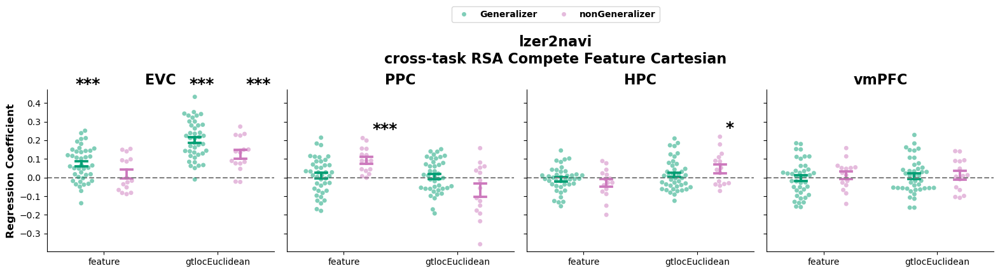

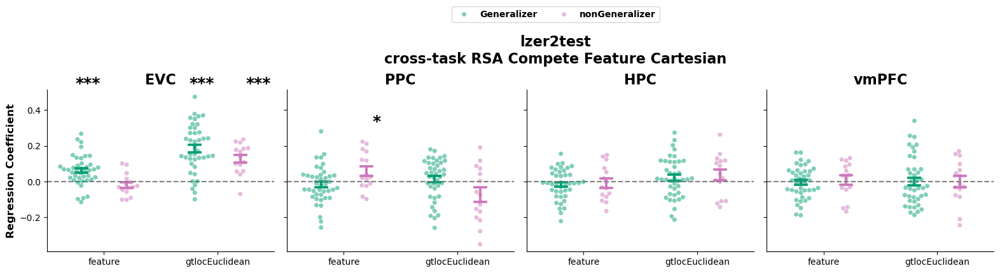

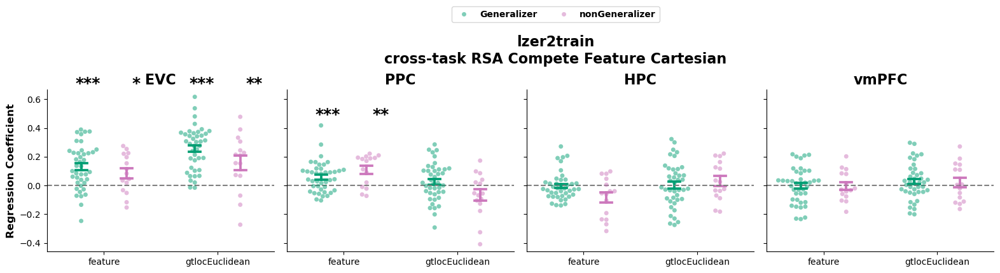

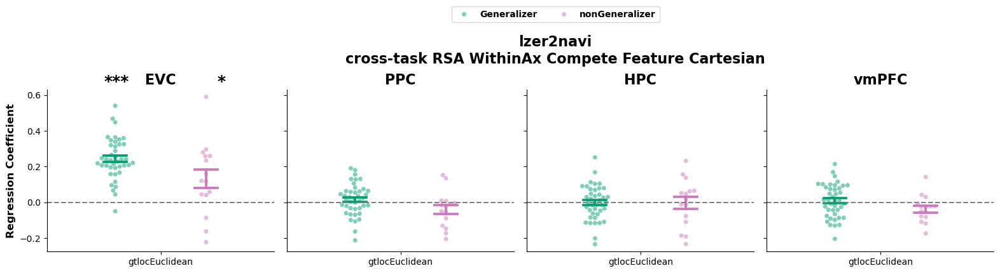

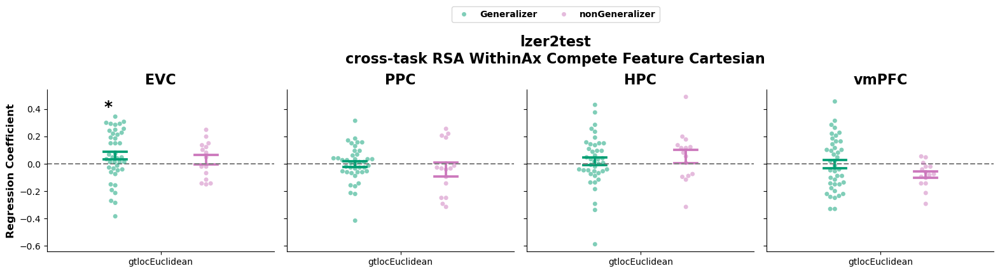

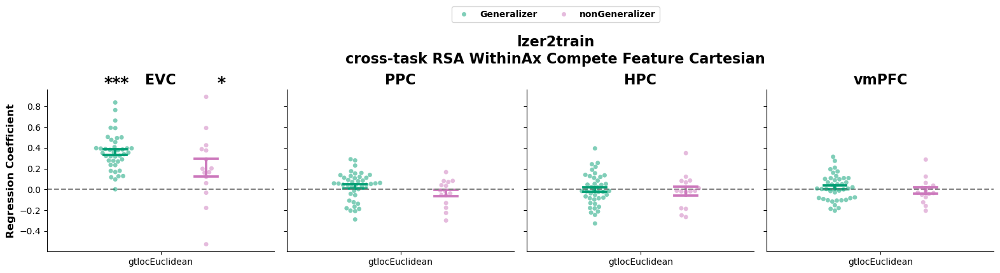

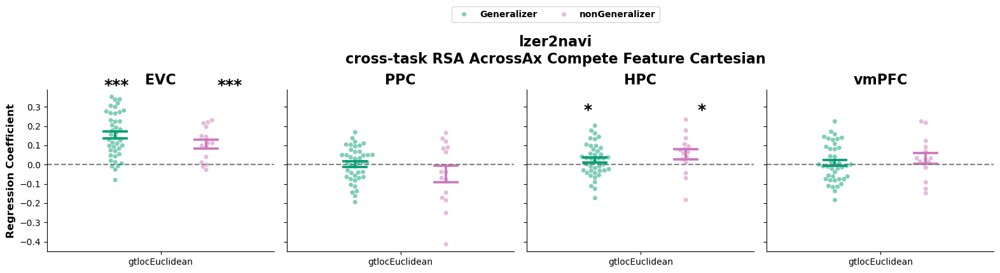

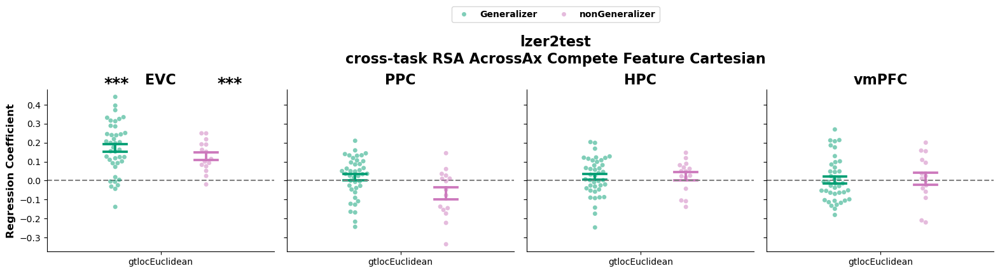

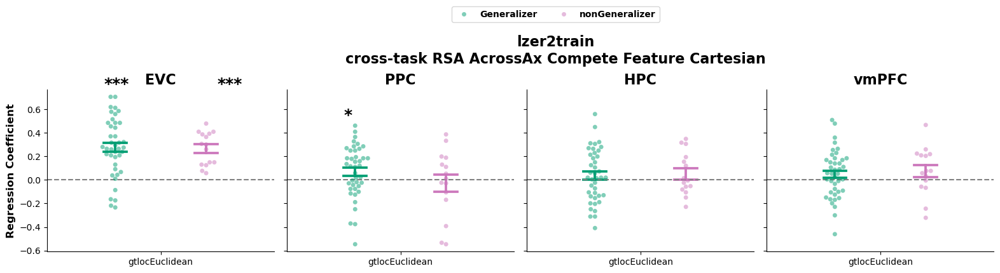

In [1137]:
# test if coefficients are significantly above zero
xvar, gvar, yvar, yvartest = "modelrdm",  "subgroup", "coefficient", "coefficient"


for a in crossRSA_res_df.analysis.unique():
    atitle = a
    for ctg in np.unique(crossRSA_res_df.crosstaskgroups):
        curr_pdf = crossRSA_res_df[(crossRSA_res_df.analysis==a)&(crossRSA_res_df.crosstaskgroups==ctg)].copy().reset_index(drop=True)
        assert curr_pdf.shape[0]>0, f"No data for {a} - {ctg}"
        curr_pdf.modelrdm = pd.Categorical(curr_pdf.modelrdm)
        #print(curr_pdf.modelrdm.nunique())
        
        curr_pdf.roi = pd.Categorical(curr_pdf.roi,
                                    categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],
                                    ordered=True)

        gs = sns.catplot(data=curr_pdf,
                    x=xvar,y=yvar,
                    col="roi",
                    hue="subgroup",palette=participantgrouphex,
                    kind="point",errorbar="se",capsize=0.1,markersize=0,linestyle="none",dodge=.4,
                    #kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
                    #inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
                    height=4,aspect=1
                    ).refline(y=0).set_titles("{col_name}")
        gs.map_dataframe(sns.swarmplot,x=xvar,y=yvar,
                        hue="subgroup",palette=participantgrouphex,dodge=0.5,
                        alpha=0.5
                        )


        for ax in gs.axes.flatten():
            axdf = curr_pdf[curr_pdf.roi==ax.title.get_text()]
            ax.set_title(roi_shortnames[axdf.roi.values[0]],**def_font_subplot_titles)
            if "Compete" not in a:
                ax.set_ylabel("Z-transformed Correlation Coefficient",**def_font_axis_legend_titles)
            else:
                ax.set_ylabel("Regression Coefficient",**def_font_axis_legend_titles)
            ax.set_xlabel("")
            plt.setp(ax.get_xticklabels(),**def_font_axis_tick_labels)
            for j,(tar,tardf) in enumerate(axdf.groupby([xvar,"subgroup"])):
                
                pval = ttest1samp_equiv_permutation(tardf[yvar].values,alternative="greater")
                print(ax.title.get_text(), tar,pval)
                minorplus = 1*((j%2)==1)
                dw = [-.25,0.25][minorplus]
                
                ax.text(x=np.floor(j/2)+dw,y=1.1*axdf[yvar].max(),
                        s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                        size=18,fontweight="bold")
        gs.legend.remove()    
        hs,ls = gs.axes.flatten()[0].get_legend_handles_labels()
        gs.figure.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
                prop = dict(weight="bold"))
        gs.figure.suptitle(f"{ctg}\n{atitle}",y=0.95,x=0.5,**def_font_subplot_titles)
        gs.tight_layout()


EVC ('localizer_rep', 'Generalizer') 0.014798520147985201
EVC ('localizer_rep', 'nonGeneralizer') 0.49345065493450657
PPC ('localizer_rep', 'Generalizer') 0.6191380861913809
PPC ('localizer_rep', 'nonGeneralizer') 0.26447355264473554
HPC ('localizer_rep', 'Generalizer') 0.9777022297770223
HPC ('localizer_rep', 'nonGeneralizer') 0.47905209479052097
vmPFC ('localizer_rep', 'Generalizer') 0.8952104789521048
vmPFC ('localizer_rep', 'nonGeneralizer') 0.50994900509949
EVC ('same2same', 'Generalizer') 9.999000099990002e-05
EVC ('same2same', 'nonGeneralizer') 0.010498950104989501
PPC ('same2same', 'Generalizer') 0.0013998600139986002
PPC ('same2same', 'nonGeneralizer') 0.22307769223077692
HPC ('same2same', 'Generalizer') 0.47315268473152683
HPC ('same2same', 'nonGeneralizer') 0.9287071292870713
vmPFC ('same2same', 'Generalizer') 0.20807919208079192
vmPFC ('same2same', 'nonGeneralizer') 0.7138286171382862
EVC ('same2same', 'Generalizer') 9.999000099990002e-05
EVC ('same2same', 'nonGeneralizer')

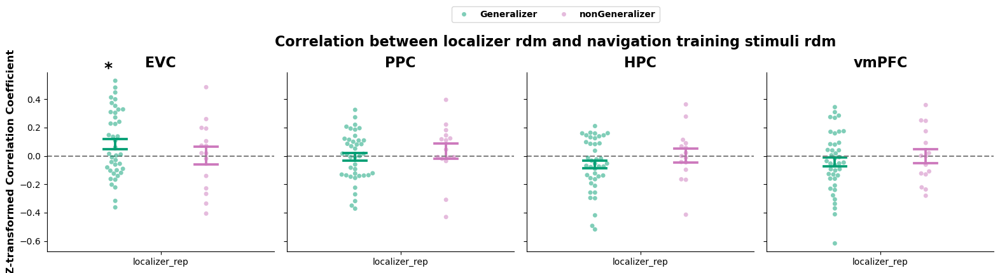

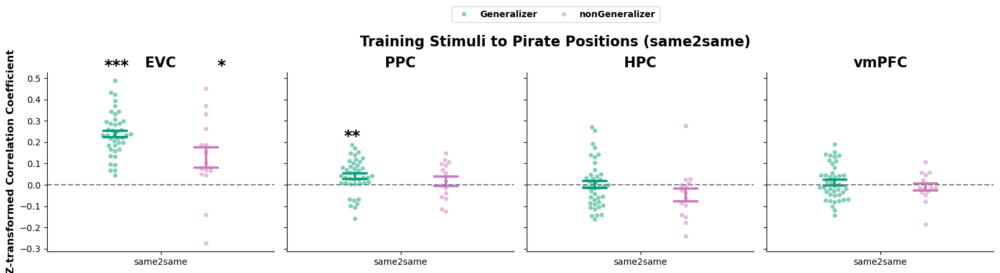

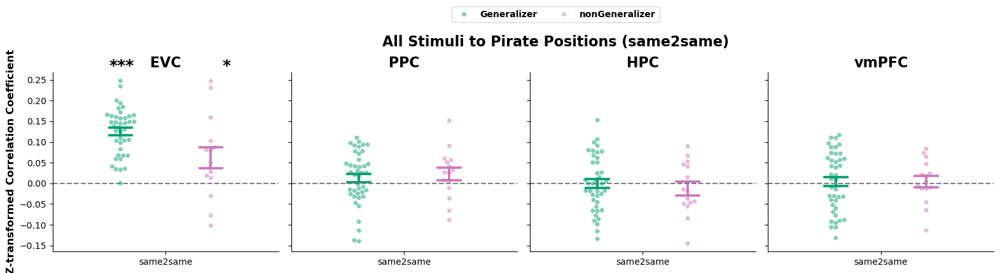

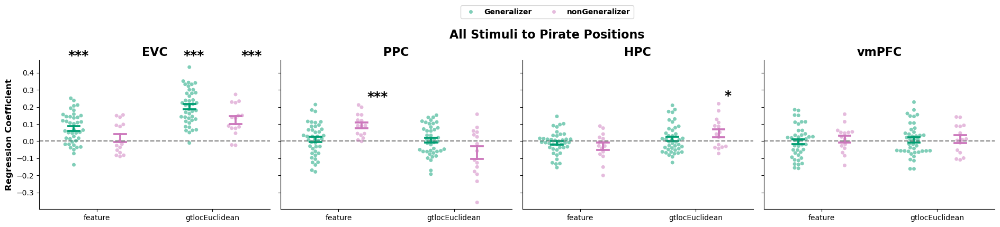

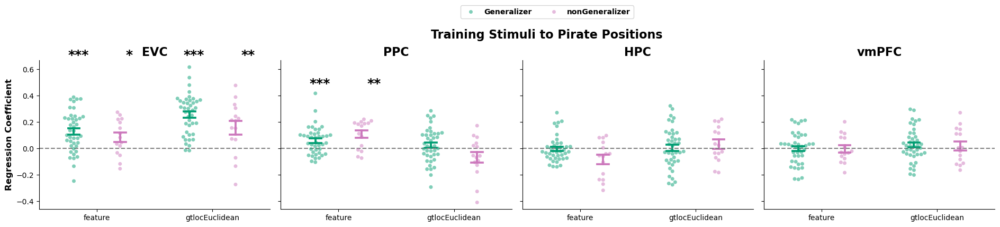

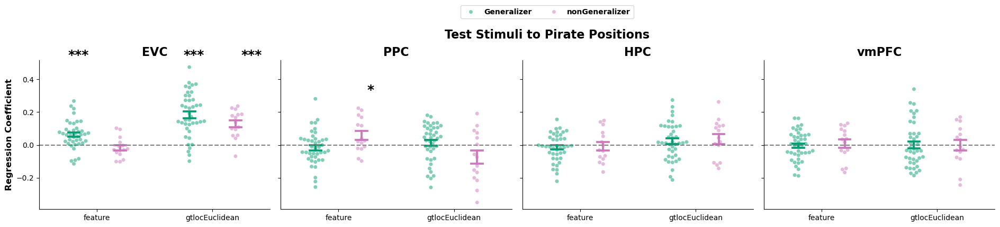

In [596]:
# test if coefficients are significantly above zero
xvar, gvar, yvar, yvartest = "modelrdm",  "subgroup", "coefficient", "coefficient"


plt_ana = dict(zip(['lzer rdm vs navi train rdm',
                    'cross-task(stim2loc) train2train same2same',
                    'cross-task(stim2loc) all2train same2same',
                    'cross-task(stim2loc) all2train Compete Feature Cartesian',
                    'cross-task(stim2loc) train2train Compete Feature Cartesian',
                    'cross-task(stim2loc) test2train Compete Feature Cartesian'
                    ],
                   
                   ['Correlation between localizer rdm and navigation training stimuli rdm',
                    "Training Stimuli to Pirate Positions (same2same)",
                    'All Stimuli to Pirate Positions (same2same)',
                    "All Stimuli to Pirate Positions",
                    "Training Stimuli to Pirate Positions",
                    "Test Stimuli to Pirate Positions"
                    ]))
aprs    = dict(zip(['lzer rdm vs navi train rdm',
                    'cross-task(stim2loc) train2train same2same',
                    'cross-task(stim2loc) all2train same2same',
                    'cross-task(stim2loc) all2train Compete Feature Cartesian',
                    'cross-task(stim2loc) train2train Compete Feature Cartesian',
                    'cross-task(stim2loc) test2train Compete Feature Cartesian'
                    ],
                   [1,
                    1,
                    1,
                    1.2,
                    1.2,
                    1.2
]))


for cname,clist in zip(["Combined Cohort"],[subid_list]):
    for a, atitle in plt_ana.items():
        curr_pdf = crosstask_rsa_df[(crosstask_rsa_df.analysis==a)&(crosstask_rsa_df.subid.isin(clist))].copy().reset_index(drop=True)
        curr_pdf.modelrdm = pd.Categorical(curr_pdf.modelrdm)
        
        curr_pdf.roi = pd.Categorical(curr_pdf.roi,
                                    categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],
                                    ordered=True)

        gs = sns.catplot(data=curr_pdf,
                    x=xvar,y=yvar,
                    col="roi",
                    hue="subgroup",palette=participantgrouphex,
                    kind="point",errorbar="se",capsize=0.1,markersize=0,linestyle="none",dodge=.4,
                    #kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
                    #inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
                    height=4,aspect=aprs[a]
                    ).refline(y=0).set_titles("{col_name}")
        gs.map_dataframe(sns.swarmplot,x=xvar,y=yvar,
                        hue="subgroup",palette=participantgrouphex,dodge=0.5,
                        alpha=0.5
                        )


        for ax in gs.axes.flatten():
            axdf = curr_pdf[curr_pdf.roi==ax.title.get_text()]
            ax.set_title(roi_shortnames[axdf.roi.values[0]],**def_font_subplot_titles)
            if "Compete" not in a:
                ax.set_ylabel("Z-transformed Correlation Coefficient",**def_font_axis_legend_titles)
            else:
                ax.set_ylabel("Regression Coefficient",**def_font_axis_legend_titles)
            ax.set_xlabel("")
            plt.setp(ax.get_xticklabels(),**def_font_axis_tick_labels)
            for j,(tar,tardf) in enumerate(axdf.groupby([xvar,"subgroup"])):
                
                pval = ttest1samp_equiv_permutation(tardf[yvar].values,alternative="greater")
                print(ax.title.get_text(), tar,pval)
                minorplus = 1*((j%2)==1)
                dw = [-.25,0.25][minorplus]
                
                ax.text(x=np.floor(j/2)+dw,y=1.1*axdf[yvar].max(),
                        s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                        size=18,fontweight="bold")
        gs.legend.remove()    
        hs,ls = gs.axes.flatten()[0].get_legend_handles_labels()
        gs.figure.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
                prop = dict(weight="bold"))
        gs.figure.suptitle(f"{atitle}",y=0.95,x=0.5,**def_font_subplot_titles)
        gs.tight_layout()


### composition from lzer plot for both G and nG

('Coefficient of Determination', 'Generalizer'): mean = 0.150, p-value = 0.000
('Coefficient of Determination', 'nonGeneralizer'): mean = 0.128, p-value = 0.000
('Coefficient of Determination', 'Generalizer'): mean = 0.117, p-value = 0.000
('Coefficient of Determination', 'nonGeneralizer'): mean = 0.073, p-value = 0.000
('Coefficient of Determination', 'Generalizer'): mean = -0.008, p-value = 0.983
('Coefficient of Determination', 'nonGeneralizer'): mean = -0.021, p-value = 0.984
('Coefficient of Determination', 'Generalizer'): mean = 0.012, p-value = 0.000
('Coefficient of Determination', 'nonGeneralizer'): mean = 0.001, p-value = 0.480
EVC - ('Perceptual\nMatching', 'Generalizer'): mean = 0.222, p-value = 0.000
EVC - ('Perceptual\nMatching', 'nonGeneralizer'): mean = 0.173, p-value = 0.000
EVC - ('Distance\nModulated', 'Generalizer'): mean = 0.067, p-value = 0.001
EVC - ('Distance\nModulated', 'nonGeneralizer'): mean = 0.001, p-value = 0.992
PPC - ('Perceptual\nMatching', 'Generalize

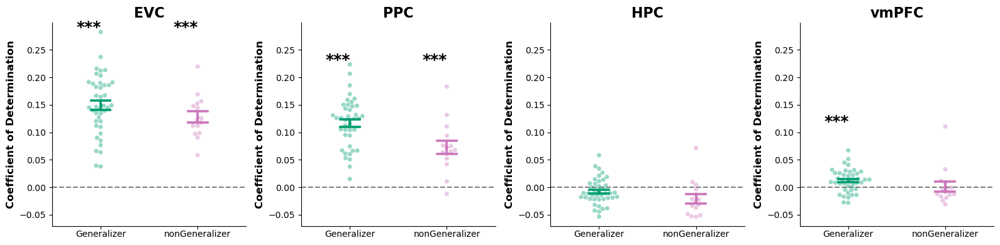

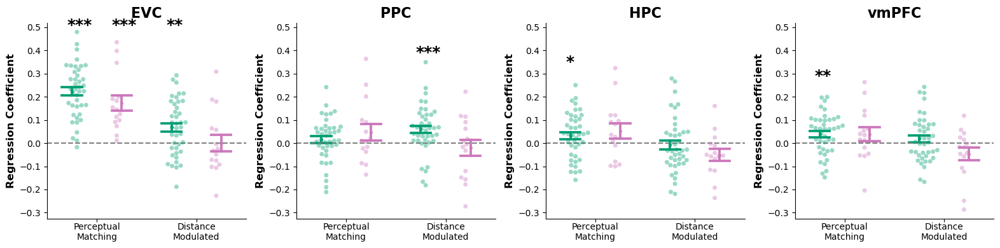

In [139]:

compo_retrieve_roisubset_df = compositionretrieval_resdf.copy() # &(compositionretrieval_resdf.subid.isin(generalizers))
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['eval_r2']))].copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],ordered=True)
pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"eval_r2":"Coefficient of Determination"}),
    categories=["Coefficient of Determination"],ordered=True
)

gs = sns.catplot(data=pdf,
            x="subgroup",y="value",
            col="roi",
            hue="subgroup",palette=participantgrouphex,
            kind="point",errorbar="se",alpha=1,dodge=False,capsize=.2,markersize=1.5, linestyle="none",
            #kind="violin",inner="box",fill=False,split=True,gap=0,cut=True,
            #inner_kws = dict(box_width = 15, whis_width=5,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=1,sharey=True,
            ).set_titles("{col_name}").refline(y=0)
gs.map_dataframe(sns.swarmplot,x="subgroup",y="value",
                #color="grey",
                hue="subgroup",palette=participantgrouphex,dodge=False,
                alpha=0.4)


for ax in gs.axes.flatten():
    axdf = pdf[pdf.roi==ax.title.get_text()]
    ax.set_ylabel("Coefficient of Determination",**def_font_axis_legend_titles)
    ax.set_xlabel('')    
    plt.setp(ax.get_xticklabels(),
            rotation=0,ha="center",
            **def_font_axis_tick_labels)
    ax.tick_params(axis='x', which='major', pad=1)
            
    ax.set_title(roi_shortnames[axdf.roi.values[0]],**def_font_subplot_titles)
    for j,(tar,tardf) in enumerate(axdf.groupby(["metricname","subgroup"])):
        pval = ttest1samp_equiv_permutation(tardf.value.values,alternative="greater")
        print(f"{tar}: mean = {'%.3f' % tardf.value.values.mean()}, p-value = {'%.3f' % pval}")
        if tardf.value.values.mean()>0:
            ax.text(x=j-0.25,y=1*axdf.value.max(),
                    s=gen_pval_annot(pval,show_pval=False).replace("p=",""),size=18,fontweight="bold")
        
        
        ax.tick_params(labelleft=True, labelbottom=True)
        ax.xaxis.label.set_visible(True)
        ax.yaxis.label.set_visible(True)
        
gs.tight_layout()

compo_retrieve_roisubset_df = compositionretrieval_resdf.copy() # &(compositionretrieval_resdf.subid.isin(generalizers))
pdf = compo_retrieve_roisubset_df[(compo_retrieve_roisubset_df.anagroup=="train2test")&(compo_retrieve_roisubset_df.metricname.isin(['reg_distmod','reg_percept']))].copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],ordered=True)

pdf["metricname"] = pd.Categorical(
    pdf.metricname.map({"reg_distmod":"Distance\nModulated","reg_percept":"Perceptual\nMatching"}),
    categories=["Perceptual\nMatching","Distance\nModulated"],ordered=True
)

gs = sns.catplot(data=pdf,
            x="metricname",y="value",
            col="roi",
            hue="subgroup",palette=participantgrouphex,
            kind="point",errorbar="se",alpha=1,dodge=0.5,capsize=.2,markersize=1.5, linestyle="none",
            #kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
            #inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=1
            ).refline(y=0).set_titles("{col_name}")
gs.map_dataframe(sns.swarmplot,x="metricname",y="value",
                hue="subgroup",palette=participantgrouphex,dodge=0.4,
                alpha=0.4
                )


for ax in gs.axes.flatten():
    axdf = pdf[pdf.roi==ax.title.get_text()]
    ax.set_title(roi_shortnames[axdf.roi.values[0]],**def_font_subplot_titles)

    ax.set_ylabel("Regression Coefficient",**def_font_axis_legend_titles)
    ax.set_xlabel("")
    plt.setp(ax.get_xticklabels(),**def_font_axis_tick_labels)
    for j,(tar,tardf) in enumerate(axdf.groupby(["metricname","subgroup"])):
        
        pval = ttest1samp_equiv_permutation(tardf.value.values)
        print(f"{roi_shortnames[axdf.roi.values[0]]} - {tar}: mean = {'%.3f' % tardf.value.values.mean()}, p-value = {'%.3f' % pval}")
        minorplus = 1*((j%2)==1)
        dw = [-.3,0.15][minorplus]
        ax.tick_params(axis='x', which='major', pad=1)
        ax.text(x=np.floor(j/2)+dw,y=1.02*axdf.value.max(),
                s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                size=18,fontweight="bold")
        ax.tick_params(labelleft=True, labelbottom=True)
        ax.xaxis.label.set_visible(True)
        ax.yaxis.label.set_visible(True)
    
gs.legend.remove()
gs.tight_layout()


# LEGACY CODE analysis results (and plotting as a whole)

## identity decoding

In [11]:
TSstim_decoding_res = load(os.path.join(ROIRSAdir,"TSstimidentity_decoding_results","allstimidendity_LRdecoding_acc_skf_HPC_bilateral.pkl"))
print(TSstim_decoding_res.keys())
print(TSstim_decoding_res['GSresults'].columns)
print(TSstim_decoding_res['performance'].columns)
print(TSstim_decoding_res['performance'].shape)

dict_keys(['decoder', 'performance', 'confusion_matrices', 'GSresults'])
Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_C', 'params', 'split0_test_score', 'split1_test_score',
       'split2_test_score', 'split3_test_score', 'split4_test_score',
       'split5_test_score', 'split6_test_score', 'split7_test_score',
       'split8_test_score', 'split9_test_score', 'split10_test_score',
       'split11_test_score', 'split12_test_score', 'split13_test_score',
       'split14_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score', 'roi', 'subid', 'target', 'straifiedfold'],
      dtype='object')
Index(['fit_acc', 'eval_acc', 'straifiedfold', 'roi', 'subid', 'target',
       'random_state'],
      dtype='object')
(1120, 7)


In [12]:
TSstim_decoding_res["performance"].shape[0]/len(subid_list)/TSstim_decoding_res["performance"].target.nunique()/TSstim_decoding_res["performance"].straifiedfold.nunique()/TSstim_decoding_res["performance"].random_state.nunique()/TSstim_decoding_res["performance"].roi.nunique()

1.0

In [13]:
TSstimiddc_performance_df = TSstim_decoding_res["performance"].copy()
TSstimiddc_performance_dfsum = TSstimiddc_performance_df.groupby(["roi","subid","target"])[["fit_acc","eval_acc"]].mean().reset_index()

TSstimiddc_performance_dfsum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in TSstimiddc_performance_dfsum["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
)
TSstimiddc_performance_dfsum[['region','side']] = TSstimiddc_performance_dfsum.roi.str.split("_",expand=True)

TSstimiddc_performance_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in TSstimiddc_performance_df["subid"]]
TSstimiddc_performance_df[['region','side']] = TSstimiddc_performance_df.roi.str.split("_",expand=True)

In [ ]:
gs = sns.catplot(data=TSstimiddc_performance_dfsum,
            x="region",y="eval_acc",
            hue="subgroup",palette=participantgrouphex,
            row="target",
            kind="bar",errorbar="se",alpha=0.3,aspect=0.6).set_titles("")
gs.map_dataframe(sns.stripplot,
                 x="region",y="eval_acc",alpha=0.3,
                hue="subgroup",palette=participantgrouphex,
                dodge=True)
sns.move_legend(gs,loc="upper center", bbox_to_anchor=(0.5, 1), ncol=5)

for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("(Evaluation) Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(1/25,linestyle="--",color="grey",label="stim ID decoding chance level")
    

gs = sns.catplot(data=TSstimiddc_performance_dfsum,
            x="region",y="fit_acc",
            hue="subgroup",palette=participantgrouphex,
            row="target",
            kind="bar",errorbar="se",alpha=0.3,aspect=0.6)
gs.map_dataframe(sns.stripplot,
                 x="region",y="fit_acc",
                hue="subgroup",palette=participantgrouphex,
                dodge=True)
sns.move_legend(gs,loc="upper center", bbox_to_anchor=(0.5, 1), ncol=5)
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("(Fitting) Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(1/8,linestyle="--",color="grey",label="stim ID decoding chance level")
    


## Cross Condition Train-Test Decoding Data

In [20]:
nctrtestim_decoding_res = load(os.path.join(ROIRSAdir,"train2test_decoding_results","noncenter_train2test_LRdecoding_acc_skf_vmPFC_bilateral.pkl"))
print(nctrtestim_decoding_res.keys())
print(nctrtestim_decoding_res['GSresults'].columns)

dict_keys(['decoder', 'performance', 'confusion_matrices', 'GSresults'])
Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_C', 'params', 'split0_test_score', 'split1_test_score',
       'split2_test_score', 'split3_test_score', 'split4_test_score',
       'split5_test_score', 'split6_test_score', 'split7_test_score',
       'split8_test_score', 'split9_test_score', 'split10_test_score',
       'split11_test_score', 'split12_test_score', 'split13_test_score',
       'split14_test_score', 'split15_test_score', 'split16_test_score',
       'split17_test_score', 'split18_test_score', 'split19_test_score',
       'split20_test_score', 'split21_test_score', 'split22_test_score',
       'split23_test_score', 'split24_test_score', 'split25_test_score',
       'split26_test_score', 'split27_test_score', 'split28_test_score',
       'split29_test_score', 'split30_test_score', 'split31_test_score',
       'split32_test_score', 'split33_test_score', 'split3

In [21]:
trtedecodingcheckgsdfsummax = []
for gname,gdf in nctrtestim_decoding_res['GSresults'][nctrtestim_decoding_res['GSresults'].subid.isin(generalizers)].copy().groupby(["subid","roi","target"]):
    gdfsum = gdf.groupby(["subid","roi","target"])["mean_test_score"].max().reset_index()
    gdfsum["param_C"] = gdf.param_C.to_numpy()[np.argmax(gdf.mean_test_score.to_numpy())]
    trtedecodingcheckgsdfsummax.append(gdfsum)
trtedecodingcheckgsdfsummax = pd.concat(trtedecodingcheckgsdfsummax,axis=0).reset_index(drop=True)


In [14]:
print(nctrtestim_decoding_res["performance"].heldouttype.unique())
nctrtestim_decoding_res["performance"].head(5)

['train2test' 'test2train']


,fit_acc,eval_acc,fit_f1micro,eval_f1micro,fit_precision,eval_precision,fit_recall,eval_recall,heldoutgroup,heldouttype,roi,subid,target,random_state
0,1.0,0.296875,1.0,0.296875,1.0,0.296875,1.0,0.296875,0,train2test,HPC_bilateral,sub001,stim_x,0
1,1.0,0.187500,1.0,0.187500,1.0,0.187500,1.0,0.187500,1,test2train,HPC_bilateral,sub001,stim_x,0
2,1.0,0.281250,1.0,0.281250,1.0,0.281250,1.0,0.281250,0,train2test,HPC_bilateral,sub001,stim_y,0
3,1.0,0.250000,1.0,0.250000,1.0,0.250000,1.0,0.250000,1,test2train,HPC_bilateral,sub001,stim_y,0
4,1.0,0.265625,1.0,0.265625,1.0,0.265625,1.0,0.265625,0,train2test,HPC_bilateral,sub002,stim_x,0


In [16]:
nctrtesstimdc_performance_df = nctrtestim_decoding_res["performance"].copy()
nctrtesstimdc_performance_df = nctrtesstimdc_performance_df[nctrtesstimdc_performance_df.roi.str.contains("bilateral")].copy().reset_index(drop=True)   
#nctrtesstimdc_performance_df = nctrtesstimdc_performance_df[nctrtesstimdc_performance_df.heldouttype.str.contains("test2train")].copy().reset_index(drop=True)   
nctrtesstimdc_performance_dfsum = nctrtesstimdc_performance_df.groupby(["roi","subid","heldouttype","target"])[["fit_acc","eval_acc"]].mean().reset_index()
nctrtesstimdc_performance_dfsum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nctrtesstimdc_performance_dfsum["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
)
nctrtesstimdc_performance_dfsum["target"] = pd.Categorical(nctrtesstimdc_performance_dfsum["target"],categories=["stim_x","stim_y"],ordered=True)
nctrtesstimdc_performance_dfsum[['region','side']] = nctrtesstimdc_performance_dfsum.roi.str.split("_",expand=True)

nctrtesstimdc_performance_df[["region","side"]] = nctrtesstimdc_performance_df.roi.str.split("_",expand=True)
nctrtesstimdc_performance_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nctrtesstimdc_performance_df["subid"]]

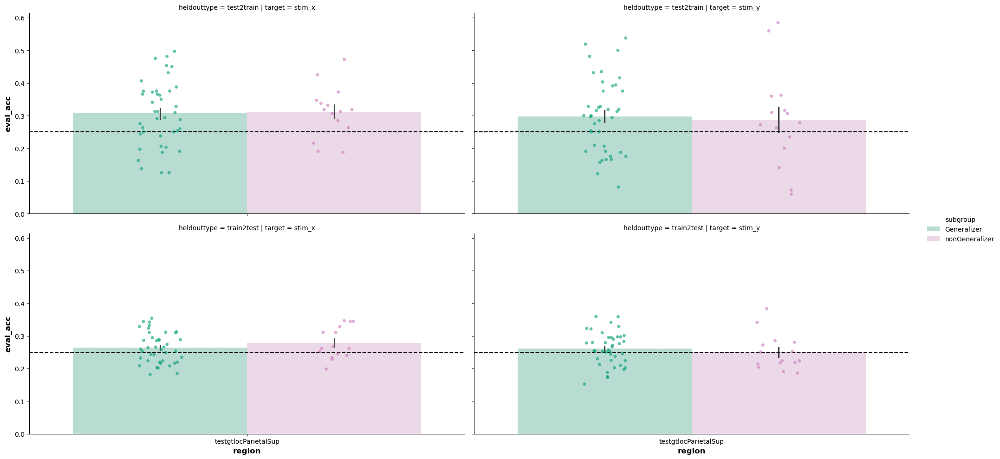

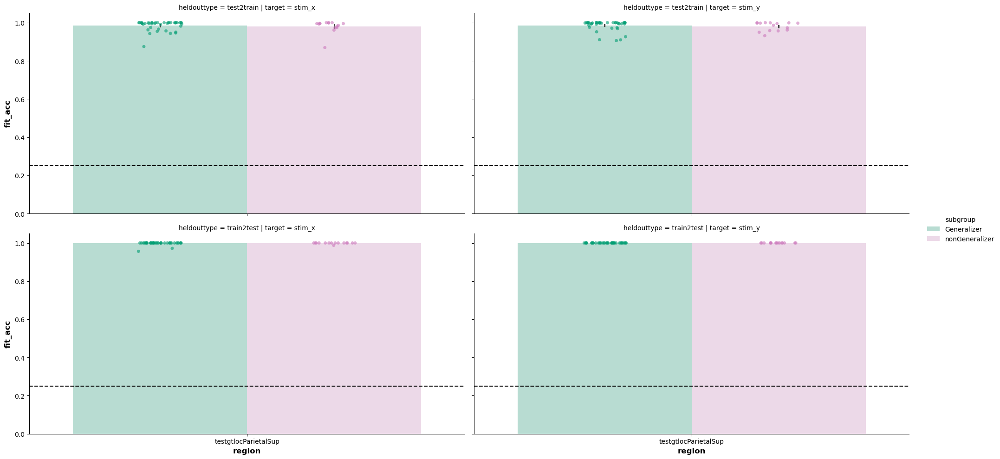

In [17]:
gs = sns.catplot(data=nctrtesstimdc_performance_dfsum,
            x="region",y="eval_acc",
            hue="subgroup",palette=participantgrouphex,
            col="target", row="heldouttype",
            kind="bar",errorbar="se",alpha=0.3,aspect=2)
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.25,linestyle="--",color="black")
gs.map_dataframe(sns.stripplot,
                 x="region",y="eval_acc",
                hue="subgroup",palette=participantgrouphex,alpha=0.6,
                dodge=True)

gs = sns.catplot(data=nctrtesstimdc_performance_dfsum,
            x="region",y="fit_acc",
            hue="subgroup",palette=participantgrouphex,
            col="target", row="heldouttype",
            kind="bar",errorbar="se",alpha=0.3,aspect=2)
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("(Fitting) Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.25,linestyle="--",color="black")
gs.map_dataframe(sns.stripplot,
                 x="region",y="fit_acc",
                hue="subgroup",palette=participantgrouphex,alpha=0.6,
                dodge=True)

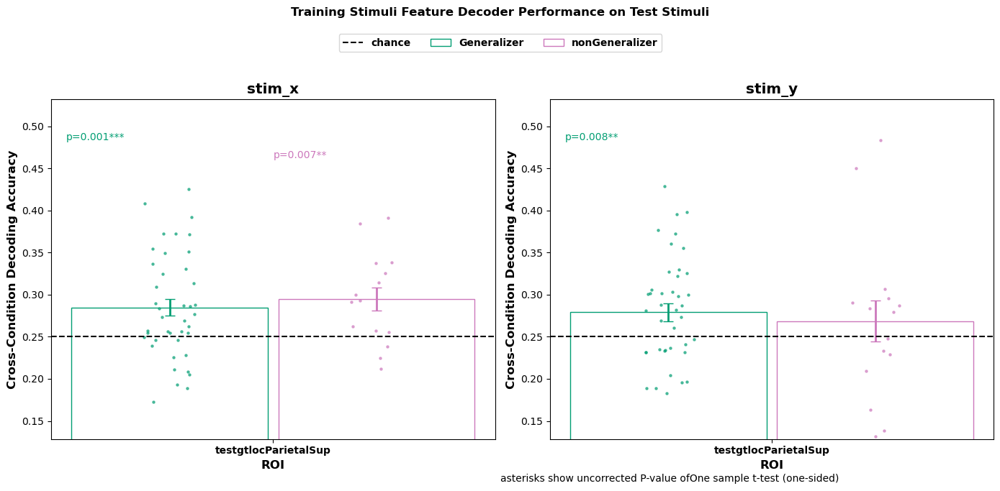

In [18]:
nctrtesstimdc_performance_dfsum["eval_acc_above_chance"] = nctrtesstimdc_performance_dfsum.eval_acc - 0.25

nctrtesstimdc_performance_dfsum["region"] = [x.split("_")[0] for x in nctrtesstimdc_performance_dfsum["roi"]]
nctrtesstimdc_performance_dfsum["region"] = pd.Categorical(nctrtesstimdc_performance_dfsum["region"],ordered=True)
nctrtesstimdc_performance_dfsumoversplits = nctrtesstimdc_performance_dfsum.groupby(["region","subid","target"])[["eval_acc","eval_acc_above_chance"]].mean().reset_index()
nctrtesstimdc_performance_dfsumoversplits["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nctrtesstimdc_performance_dfsumoversplits["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
)
xvar, gvar, yvar, yvartest = "region",  "subgroup", "eval_acc","eval_acc_above_chance"
fig,axes = grouped_barscatter_withstats(nctrtesstimdc_performance_dfsumoversplits,
                             facet_vars = "target", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                             hues=participantgrouphex,
                             prows=1,pcols=2,
                             
                             statfunc=lambda yt: ttest1samp_equiv_permutation(yt,n_perm=10000))
for ifacet, _ in enumerate(axes.flatten()):
    axes.flatten()[ifacet].set_ylabel("Cross-Condition Decoding Accuracy",fontweight="bold",fontsize="large")
    axes.flatten()[ifacet].set_xlabel("ROI",fontweight="bold",fontsize="large")
    axes.flatten()[ifacet].axhline(0.25,label="chance",color="k",ls='--')
    
hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
fig.legend([hs[0],hs[1],hs[-1]],[ls[0],ls[1],ls[-1]],loc="upper center",bbox_to_anchor=(0.5,1.05),ncol = 4,
           prop = dict(weight="bold"))
fig.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test (one-sided)')
fig.suptitle("Training Stimuli Feature Decoder Performance on Test Stimuli",fontweight="bold",fontsize="large",y=1.1)
fig.tight_layout()

# Cross Task Decoding Data

In [23]:
#nclocnavi_decoding_res = load(os.path.join(ROIRSAdir,"navi2loc_decoding_results","noncenter_navi2loc_LRdecoding_acc_skf_flzeralignedprocrustes_testgtlocParietalSup_bilateral.pkl"))
nclocnavi_decoding_res = load(os.path.join(ROIRSAdir,"navi2loc_decoding_results","noncenter_navi2loc_LRdecoding_acc_skf.pkl"))

print(nclocnavi_decoding_res.keys())
print(nclocnavi_decoding_res['performance'].columns)
print(nclocnavi_decoding_res['performance'].target.unique())

dict_keys(['GSresults', 'decoder', 'performance', 'confusion_matrices'])
Index(['fit_acc', 'eval_acc', 'analysis', 'roi', 'subid', 'target',
       'random_state', 'dataset'],
      dtype='object')
['stim_x' 'stim_y']


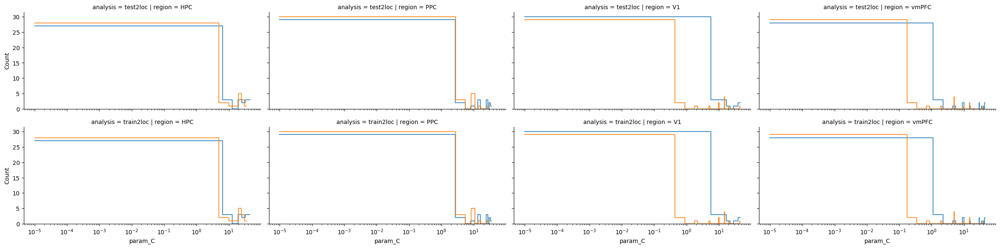

In [24]:
#print(nclocnavi_decoding_res['GSresults'].columns)

nclocnavidecodingcheckgsdfsummax = []
for gname,gdf in nclocnavi_decoding_res['GSresults'][nclocnavi_decoding_res['GSresults'].subid.isin(generalizers)].copy().groupby(["subid","roi","target"]):
    gdfsum = gdf.groupby(["subid","roi","target","analysis"])["mean_test_score"].max().reset_index()
    gdfsum["param_C"] = gdf.param_C.to_numpy()[np.argmax(gdf.mean_test_score.to_numpy())]
    nclocnavidecodingcheckgsdfsummax.append(gdfsum)
nclocnavidecodingcheckgsdfsummax = pd.concat(nclocnavidecodingcheckgsdfsummax,axis=0).reset_index(drop=True)

nclocnavidecodingcheckgsdfsummax[['region','side']] = nclocnavidecodingcheckgsdfsummax.roi.str.split("_",expand=True)
gs = sns.FacetGrid(nclocnavidecodingcheckgsdfsummax, col="region", row="analysis",hue="target",palette="tab10",aspect=2)
#for ifacet, (gnam,gdf) in enumerate(trtedecodingcheckgsdfsummax.groupby(["target","roi"])):
#    sns.histplot(gdf,x="param_C",ax=gs.axes.flatten()[ifacet])
gs.map_dataframe(sns.histplot,x="param_C",alpha=0.8,element="step",fill=False,multiple="layer")
gs.set(xscale="log")


In [26]:
#check average decoding accuracy of all conditions
nclocnavidc_performance_df = nclocnavi_decoding_res["performance"].copy()
nclocnavidc_performance_dfsum = nclocnavidc_performance_df.groupby(["roi","subid","analysis","target"])[["fit_acc","eval_acc"]].mean().reset_index()
nclocnavidc_performance_dfsum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nclocnavidc_performance_dfsum["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True
)
nclocnavidc_performance_dfsum["target"] = pd.Categorical(nclocnavidc_performance_dfsum["target"],categories=["stim_x","stim_y"],ordered=True)
nclocnavidc_performance_dfsum[['region','side']] = nclocnavidc_performance_dfsum.roi.str.split("_",expand=True)

nclocnavidc_performance_df["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in nclocnavidc_performance_df["subid"]]
nclocnavidc_performance_df[['region','side']] = nclocnavidc_performance_df.roi.str.split("_",expand=True)

In [27]:
nclocnavidc_performance_df.columns

Index(['fit_acc', 'eval_acc', 'analysis', 'roi', 'subid', 'target',
       'random_state', 'dataset', 'subgroup', 'region', 'side'],
      dtype='object')

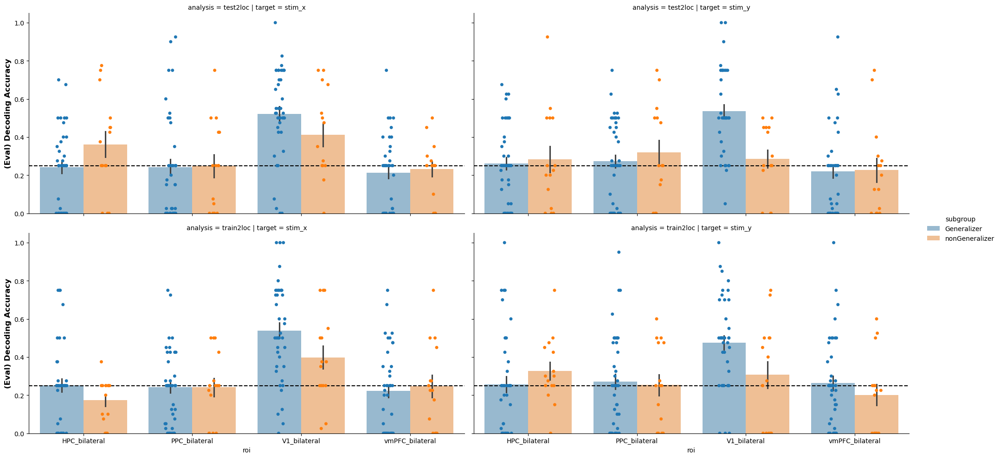

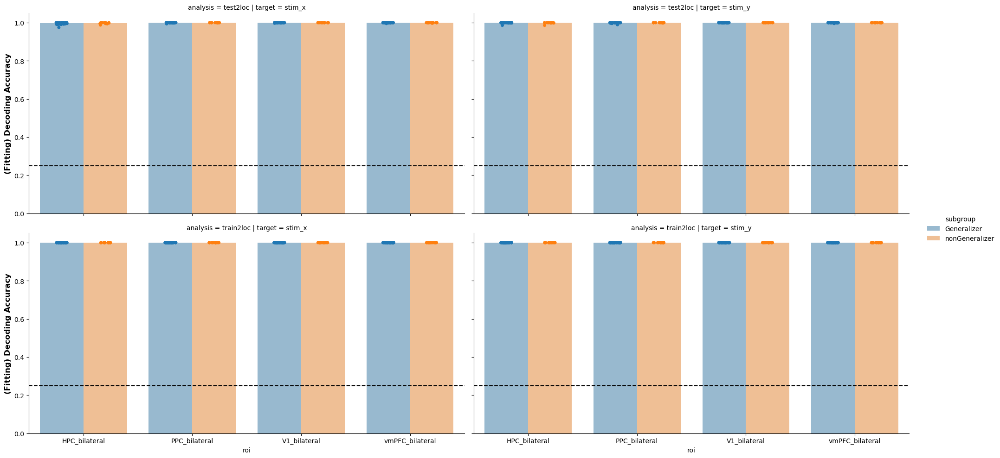

In [28]:
gs = sns.catplot(data=nclocnavidc_performance_dfsum,
            x="roi",y="eval_acc",
            hue="subgroup",palette="tab10",
            col="target",row="analysis",
            kind="bar",errorbar="se",alpha=0.5,aspect=2)
gs.map_dataframe(sns.stripplot,
                 x="roi",y="eval_acc",
                hue="subgroup",palette="tab10",
                dodge=True)
for ax in gs.axes.flatten():
    ax.set_ylabel("(Eval) Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.25,linestyle="--",color="black")

gs = sns.catplot(data=nclocnavidc_performance_dfsum,
            x="roi",y="fit_acc",
            hue="subgroup",palette="tab10",
            col="target",row="analysis",
            kind="bar",errorbar="se",alpha=0.5,aspect=2)
gs.map_dataframe(sns.stripplot,
                 x="roi",y="fit_acc",
                hue="subgroup",palette="tab10",
                dodge=True)
for ax in gs.axes.flatten():
    ax.set_ylabel("(Fitting) Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.25,linestyle="--",color="black")


In [30]:
nclocnavidc_performance_dfsum["eval_acc_above_chance"] = nclocnavidc_performance_dfsum.eval_acc - 0.25

nclocnavidc_performance_dfsum["region"] = pd.Categorical(nclocnavidc_performance_dfsum["region"],ordered=True)

pdf = nclocnavidc_performance_dfsum[(nclocnavidc_performance_dfsum.analysis=="test2loc")].copy()
#pdf = pdf.query("roi in ['V1_bilateral','PPC_bilateral','vmPFC_bilateral']").copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],ordered=True)
pdf

,roi,subid,analysis,target,fit_acc,eval_acc,subgroup,region,side,eval_acc_above_chance
0,HPC_bilateral,sub001,test2loc,stim_x,0.975000,0.250,Generalizer,HPC,bilateral,0.000
1,HPC_bilateral,sub001,test2loc,stim_y,1.000000,0.500,Generalizer,HPC,bilateral,0.250
4,HPC_bilateral,sub002,test2loc,stim_x,1.000000,0.450,nonGeneralizer,HPC,bilateral,0.200
5,HPC_bilateral,sub002,test2loc,stim_y,1.000000,0.000,nonGeneralizer,HPC,bilateral,-0.250
8,HPC_bilateral,sub003,test2loc,stim_x,1.000000,0.000,Generalizer,HPC,bilateral,-0.250
...,...,...,...,...,...,...,...,...,...,...
885,vmPFC_bilateral,sub128,test2loc,stim_y,0.995313,0.075,Generalizer,vmPFC,bilateral,-0.175
888,vmPFC_bilateral,sub129,test2loc,stim_x,1.000000,0.400,Generalizer,vmPFC,bilateral,0.150
889,vmPFC_bilateral,sub129,test2loc,stim_y,1.000000,0.050,Generalizer,vmPFC,bilateral,-0.200
892,vmPFC_bilateral,sub130,test2loc,stim_x,0.995313,0.200,Generalizer,vmPFC,bilateral,-0.050


EVC - Generalizer: mean = 0.522, p-value = 0.000
EVC - nonGeneralizer: mean = 0.412, p-value = 0.019
EVC - Generalizer: mean = 0.536, p-value = 0.000
EVC - nonGeneralizer: mean = 0.287, p-value = 0.490
PPC - Generalizer: mean = 0.243, p-value = 0.852
PPC - nonGeneralizer: mean = 0.248, p-value = 1.000
PPC - Generalizer: mean = 0.273, p-value = 0.504
PPC - nonGeneralizer: mean = 0.320, p-value = 0.295
HPC - Generalizer: mean = 0.241, p-value = 0.787
HPC - nonGeneralizer: mean = 0.362, p-value = 0.120
HPC - Generalizer: mean = 0.261, p-value = 0.732
HPC - nonGeneralizer: mean = 0.283, p-value = 0.668
vmPFC - Generalizer: mean = 0.213, p-value = 0.214
vmPFC - nonGeneralizer: mean = 0.232, p-value = 0.690
vmPFC - Generalizer: mean = 0.219, p-value = 0.367
vmPFC - nonGeneralizer: mean = 0.227, p-value = 0.726


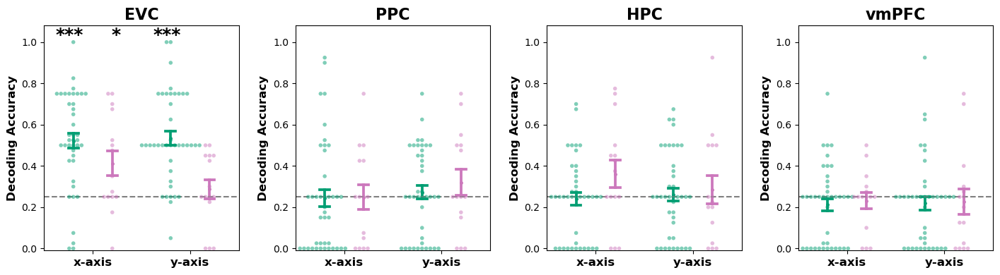

In [53]:
nclocnavidc_performance_dfsum["eval_acc_above_chance"] = nclocnavidc_performance_dfsum.eval_acc - 0.25

nclocnavidc_performance_dfsum["region"] = pd.Categorical(nclocnavidc_performance_dfsum["region"],ordered=True)

pdf = nclocnavidc_performance_dfsum[(nclocnavidc_performance_dfsum.analysis=="test2loc")].copy()
#pdf = pdf.query("roi in ['V1_bilateral','PPC_bilateral','vmPFC_bilateral']").copy()
pdf.roi = pd.Categorical(pdf.roi, categories=["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"],ordered=True)

pdf["target"] = pd.Categorical(
    pdf.target.map({"stim_x":"x-axis","stim_y":"y-axis"}),
    categories=["x-axis","y-axis"],ordered=True
)

xvar, groupvar, yvar, yvartest = "target", "subgroup", "eval_acc", "eval_acc_above_chance"
colvar, colnamedict = "roi", roi_shortnames
xlabel, ylabel = "Decoding Target", "Decoding Accuracy"
gs = sns.catplot(data=pdf,
            x=xvar,y=yvar,
            col=colvar,
            hue=groupvar,palette=participantgrouphex,
            kind="point",errorbar="se",alpha=1,capsize=.1,dodge=0.4,markersize=1.5, linestyle="none",#fill=False,
            #kind="violin",split=True,inner="box",fill=False,gap=0.1,cut=True,
            #inner_kws = dict(box_width = 12, whis_width=4,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),
            height=4,aspect=0.9
            ).refline(y=0.25).set_titles("{col_name}")
gs.map_dataframe(sns.swarmplot,x=xvar,y=yvar,
                hue=groupvar,palette=participantgrouphex,dodge=0.5,
                alpha=0.5,s=4
                )


for ax in gs.axes.flatten():
    axdf = pdf[pdf[colvar]==ax.title.get_text()]
    ax.set_title(colnamedict[axdf[colvar].values[0]],**def_font_subplot_titles)

    ax.set_ylim(pdf[yvar].values.min()-0.01,pdf[yvar].values.max()+0.08)
    ax.set_ylabel("Decoding Accuracy",**def_font_axis_legend_titles)
    ax.set_xlabel("")
    plt.setp(ax.get_xticklabels(),**def_font_axis_legend_titles)
    for j,(xval,xvaldf) in enumerate(axdf.groupby(xvar)):
        for k,(tar,tardf) in enumerate(xvaldf.groupby(groupvar)):            
            pval = ttest1samp_equiv_permutation(tardf[yvartest].values)
            print(f"{colnamedict[axdf[colvar].values[0]]} - {tar}: mean = {'%.3f' % tardf[yvar].values.mean()}, p-value = {'%.3f' % pval}")
            minorplus = k
            dw = [-.24,.24][minorplus]
            
            ax.text(x=j+dw,y=1.01*pdf[yvar].max(),
                    s=gen_pval_annot(pval,show_pval=False).replace("p=",""),
                    size=18,fontweight="bold",ha="center")
            
            
            ax.tick_params(labelleft=True, labelbottom=True)
            ax.xaxis.label.set_visible(True)
            ax.yaxis.label.set_visible(True)
            ax.spines["top"].set_visible(True)
            ax.spines["right"].set_visible(True)
    
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test two-sided)')
#sns.move_legend(gs, loc="lower center",bbox_to_anchor=(0.4,0.85),ncol=1,title="",prop={'size': 12})
#gs.figure.suptitle("Correspondence with\n Model Retrieval Patterns",fontweight="bold",fontsize=14,y=1.05,x=0.4)
gs.legend.remove()
#gs.figure.suptitle("Correspondence with Model Retrieval Patterns",y=0.95,x=0.5,**def_font_subplot_titles)
gs.tight_layout(w_pad=2)

# LEGACY CODE Train-Test Separation

In [227]:
septraintest_decoding_res = load(os.path.join(ROIRSAdir,"navitraintestsplit_decoding_results","navi_septraintest_LRdecoding_acc.pkl"))
print(septraintest_decoding_res.keys())
print(septraintest_decoding_res['GSresults'].columns)
print(septraintest_decoding_res['performance'].columns)
print(septraintest_decoding_res['performance'].target.unique())

dict_keys(['GSresults', 'decoder', 'performance', 'confusion_matrices'])
Index(['mean_fit_time', 'std_fit_time', 'mean_score_time', 'std_score_time',
       'param_C', 'params', 'split0_test_score', 'split1_test_score',
       'split2_test_score', 'split3_test_score', 'split4_test_score',
       'split5_test_score', 'split6_test_score', 'split7_test_score',
       'split8_test_score', 'split9_test_score', 'split10_test_score',
       'split11_test_score', 'split12_test_score', 'split13_test_score',
       'split14_test_score', 'mean_test_score', 'std_test_score',
       'rank_test_score', 'roi', 'subid', 'target', 'straifiedfold'],
      dtype='object')
Index(['fit_acc', 'eval_acc', 'fit_f1micro', 'eval_f1micro', 'fit_precision',
       'eval_precision', 'fit_recall', 'eval_recall', 'straifiedfold', 'roi',
       'subid', 'target'],
      dtype='object')
['stim_group']


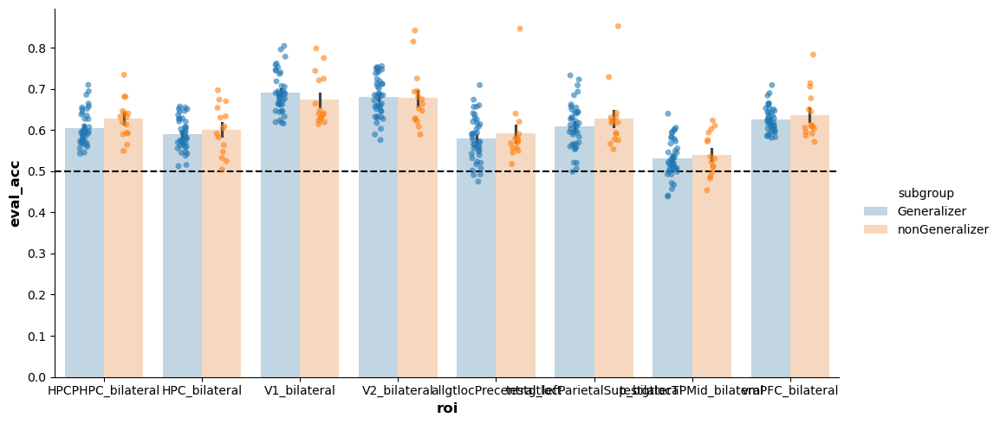

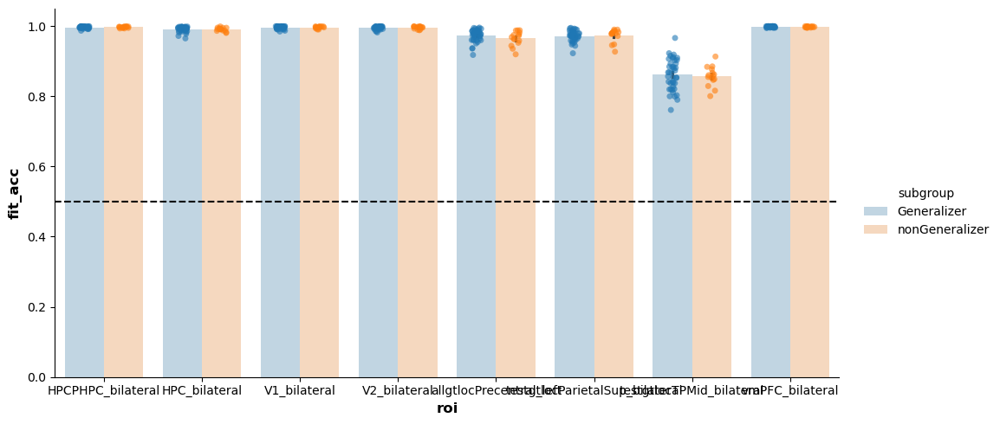

In [228]:
septraintestdc_performance_df = septraintest_decoding_res["performance"].copy()
keep_rois = [x for x in rois if "bilateral" in x] + ["allgtlocPrecentral_left"]
septraintestdc_performance_df = septraintestdc_performance_df[septraintestdc_performance_df.roi.isin(keep_rois)]
septraintestdc_performance_df_sum = septraintestdc_performance_df.groupby(["roi","subid"])[["fit_acc","eval_acc"]].mean().reset_index()
septraintestdc_performance_df_sum["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in septraintestdc_performance_df_sum["subid"]]
gs = sns.catplot(data=septraintestdc_performance_df_sum,
            x="roi",y="eval_acc",
            hue="subgroup",palette="tab10",
            kind="bar",errorbar="se",alpha=0.3,aspect=2)
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.5,linestyle="--",color="black")
gs.map_dataframe(sns.stripplot,
                 x="roi",y="eval_acc",
                hue="subgroup",palette="tab10",alpha=0.6,
                dodge=True)

gs = sns.catplot(data=septraintestdc_performance_df_sum,
            x="roi",y="fit_acc",
            hue="subgroup",palette="tab10",
            kind="bar",errorbar="se",alpha=0.3,aspect=2)
for ax in gs.axes.flatten():
    ax.set_xlabel("Decoding Target",fontdict={"fontsize":12,"fontweight":"bold"},visible=True)
    ax.set_ylabel("(Fitting) Decoding Accuracy",fontdict={"fontsize":12,"fontweight":"bold"})
    ax.axhline(0.5,linestyle="--",color="black")
gs.map_dataframe(sns.stripplot,
                 x="roi",y="fit_acc",
                hue="subgroup",palette="tab10",alpha=0.6,
                dodge=True)

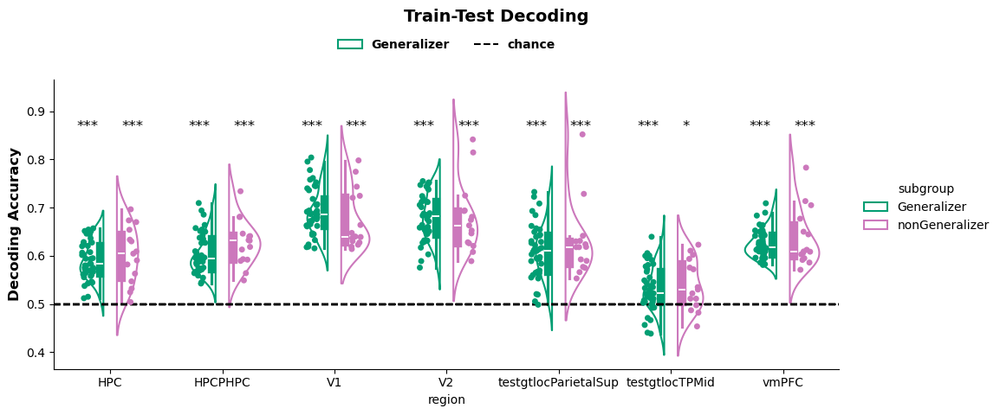

In [229]:
pdf = septraintestdc_performance_df.copy()
#pdf = nctrtesstimdc_performance_df[(nctrtesstimdc_performance_df.roi.str.contains("HPC"))].copy()
pdf["eval_acc_above_chance"] = pdf.eval_acc - 0.5

pdf_sum = pdf.groupby(["roi","subid"])[["fit_acc","eval_acc","eval_acc_above_chance"]].mean().reset_index()
pdf_sum["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in pdf_sum["subid"]]
)

pdf_sum = pdf_sum[(pdf_sum.roi.str.contains("bilateral"))].copy().reset_index(drop=True)
pdf_sum["region"] = [x.split("_")[0] for x in pdf_sum["roi"]]
pdf_sum["region"] = pd.Categorical(pdf_sum["region"],ordered=True)
gs = sns.catplot(data=pdf_sum,
            x="region",
            y="eval_acc",
            kind="violin",
            inner="box",
            fill=False,
            hue="subgroup",palette=participantgrouphex,split=True,gap=0.3,
            #color="white",label=None,
            height=5,aspect=2
            )
gs.map_dataframe(sns.stripplot,x="region",
                y="eval_acc",
                 #color="grey",label="generalizers",alpha=0.8
                 hue="subgroup",palette=participantgrouphex,dodge=True,
                 )


for ax in gs.axes.flatten():
    for j, (gname,gdf) in enumerate(pdf_sum.groupby(["region","subgroup"])):
        ax.set_ylabel("Decoding Accuracy",fontweight="bold",fontsize=12)
        ax.axhline(0.5,label="chance",color="k",ls='--')
        pval = ttest1samp_equiv_permutation(gdf.eval_acc_above_chance.values)
        dm = [-0.3,0.1][j%2]
        ax.text(x=np.floor(j/2)+dm,
                y=1.01*pdf_sum.eval_acc.max(),s=gen_pval_annot(pval,show_pval=False).replace("p=",""),fontsize=12)
        hs,ls = ax.get_legend_handles_labels()
        ax.legend([hs[0],hs[-1]],[ls[0],ls[-1]],loc="lower center",bbox_to_anchor=(0.5,1.06),ncol = 2,
                prop = dict(weight="bold"),frameon=False)  
    
#ax.text(x=0.5, y=0, s='asterisks show uncorrected P-value ofOne sample t-test (one-sided)')
gs.figure.suptitle("Train-Test Decoding",fontweight="bold",fontsize=14,y=0.95)
gs.tight_layout()
#gs.figure.savefig(os.path.join(ROIRSAdir,"HPChighdim","HPC_traintestCCGP.png"),dpi=300)

# MDS result for all stim

In [300]:
rdm_mds_results = load(os.path.join(ROIRSAdir,"mds_results_rescaled.pkl"))

## Plot MDS result of V1

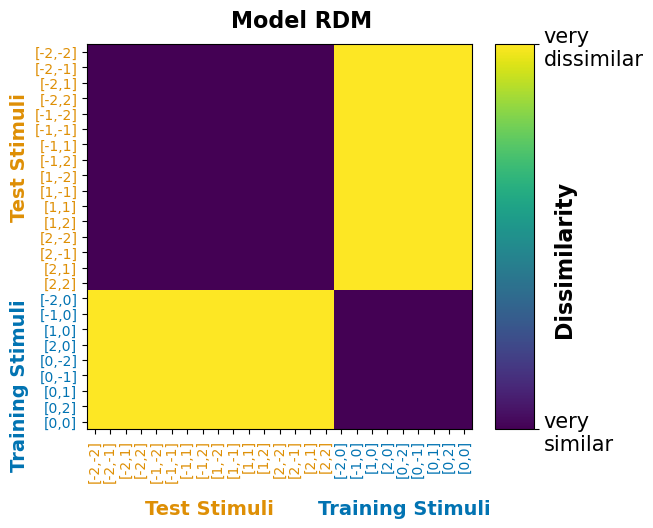

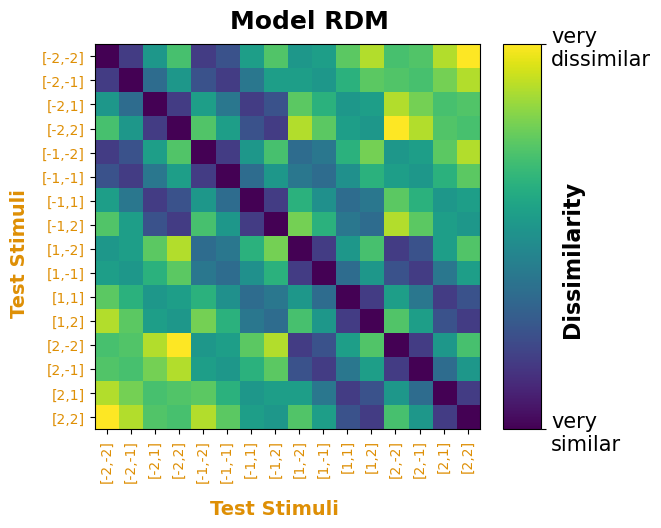

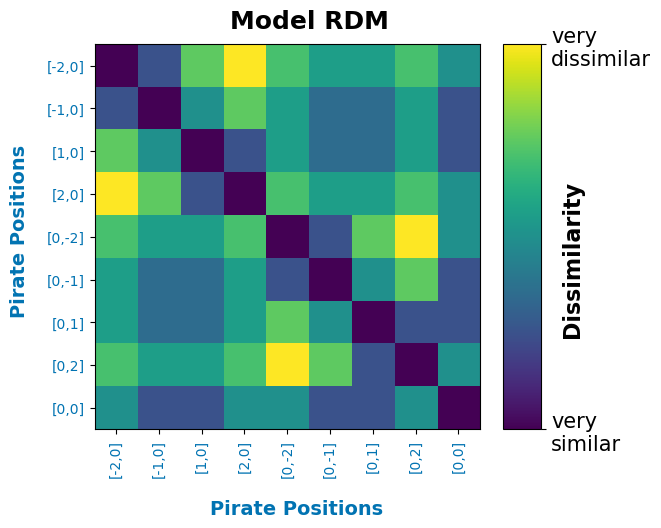

In [301]:
stimdf = roi_data["V1_bilateral"][0]["stimdf"].copy()
stimdf_one_sess = stimdf[stimdf.stim_session==0].copy()
stimdf_one_sess["sg_name"] = stimdf_one_sess.stim_group.map({0:"test",1:"training"})
stimdf_one_sess.sort_values(["sg_name","training_axset","training_axlocTL","stim_x","stim_y"],inplace=True)
stimdf_one_sess["stim_name"] = ["[%d,%d]"%(x*2,y*2) for x,y in stimdf_one_sess[["stim_x","stim_y"]].to_numpy()]

sfilts = generate_filters(stimdf_one_sess)
plot_rdmds = {
    "train-test separation": compute_rdm_identity(stimdf_one_sess[sfilts["allstim"]].copy().stim_group.values),
    "test2d":compute_rdm(stimdf_one_sess[sfilts["test"]].copy()[["stim_x","stim_y"]],"euclidean"),
    "lzer2d":compute_rdm(stimdf_one_sess[sfilts["training_all"]].copy()[["stim_x","stim_y"]],"euclidean")
}
axticks = {
    "train-test separation": stimdf_one_sess[sfilts["allstim"]].copy()["stim_name"].values,
    "test2d":stimdf_one_sess[sfilts["test"]].copy()["stim_name"].values,
    "lzer2d":stimdf_one_sess[sfilts["training_all"]].copy()["stim_name"].values
}
   
for j, (k,v) in enumerate(plot_rdmds.items()):
    fig,ax=plt.subplots(1,1,figsize=(6,5))
    im = ax.imshow(v)
    ax.set_xticks(np.arange(v.shape[0]),axticks[k],rotation=90)
    ax.set_yticks(np.arange(v.shape[1]),axticks[k],rotation=0)
    for txt in ax.get_xticklabels():
        if '0' in txt.get_text():
            txt.set_color(train_test_color_pal["Training Stimuli"])
        else:
            txt.set_color(train_test_color_pal["Test Stimuli"])
    for txt in ax.get_yticklabels():
        if '0' in txt.get_text():
            txt.set_color(train_test_color_pal["Training Stimuli"])
        else:
            txt.set_color(train_test_color_pal["Test Stimuli"])
    if k=="train-test separation":
        ax.annotate(text="Training Stimuli",xy=(-0.2,-0.1),xycoords=ax.transAxes,
                    color=train_test_color_pal["Training Stimuli"],
                    fontweight="bold",fontsize=14,
                    rotation=90)
        ax.annotate(text="Test Stimuli",xy=(-0.2,0.55),xycoords=ax.transAxes,
                    color=train_test_color_pal["Test Stimuli"],
                    fontweight="bold",fontsize=14,
                    rotation=90)
        ax.annotate(text="Training Stimuli",xy=(0.6,-0.22),xycoords=ax.transAxes,
                    color=train_test_color_pal["Training Stimuli"],
                    fontweight="bold",fontsize=14,
                    rotation=0)
        ax.annotate(text="Test Stimuli",xy=(0.15,-0.22),xycoords=ax.transAxes,
                    color=train_test_color_pal["Test Stimuli"],
                    fontweight="bold",fontsize=14,
                    rotation=0)
        fig.suptitle("Model RDM",fontweight="bold",fontsize=16,y=0.95)
    else:
        txt = "Test Stimuli" if k=="test2d" else "Pirate Positions"
        txtcol = "Test Stimuli" if k=="test2d" else "Training Stimuli"
        ax.annotate(text=txt,xy=(-0.22,0.3),xycoords=ax.transAxes,
                    color=train_test_color_pal[txtcol],
                    fontweight="bold",fontsize=14,
                    rotation=90)
        ax.annotate(text=txt,xy=(0.3,-0.22),xycoords=ax.transAxes,
                    color=train_test_color_pal[txtcol],
                    fontweight="bold",fontsize=14,
                    rotation=0)
        fig.suptitle("Model RDM",fontweight="bold",fontsize=18,y=0.95)
    
    cb = plt.colorbar(im,orientation="vertical",cax=None,ax=ax,fraction=0.1,pad=0.05,aspect=10)
    cb.ax.set_title("Dissimilarity",fontweight="bold",fontsize=16,y=0.23,x=1.8,rotation=90)
    cb.ax.set_yticks([v.min(),v.max()],["very\nsimilar","very\ndissimilar"],fontsize=15)


In [ ]:
eucrdm = compute_rdm(stimdf[["stim_x","stim_y"]].to_numpy(),"euclidean")
ftrdm  = compute_rdm_nomial(stimdf[["stim_x","stim_y"]].to_numpy())


In [ ]:
import sklearn.manifold


ssname = "training_nocenter"
roi = "testgtlocParietalSup_bilateral" #"testgtlocParietalSup_bilateral"
cname = "Combined Cohort"
ncompo = 3

roirdm, roimdsdf = deepcopy(rdm_mds_results["aveRDM"][ssname][roi][cname]["G"]),deepcopy(rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"])

eucrdm = compute_rdm(roimdsdf[["stim_x","stim_y"]].to_numpy(),"euclidean")
ftrdm  = compute_rdm_nomial(roimdsdf[["stim_x","stim_y"]].to_numpy())
#roimdsdf[["MDS1","MDS2","MDS3"]] = sklearn.manifold.MDS(n_components=3,dissimilarity="precomputed",eps=1e-10,metric=True
#                                                        ).fit_transform(minmax_scale(roirdm,0,2))
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]
roimdsdf["stim_x_str"] = roimdsdf["stim_x"].astype(str)
roimdsdf["stim_group_str"] = roimdsdf["stim_group"].map({0:"test",1:"training"})

np.fill_diagonal(roirdm,np.nan)
np.fill_diagonal(eucrdm,np.nan)
np.fill_diagonal(ftrdm,np.nan)
print(scipy.stats.spearmanr(lower_tri(roirdm)[0],
                            lower_tri(eucrdm)[0])
                            )
print(scipy.stats.spearmanr(lower_tri(roirdm)[0],
                            lower_tri(ftrdm)[0])
                            )
fig_rdm, axes_rdm = plt.subplots(1,3,figsize=(9,2.5))
plot_rdm_withlabel(eucrdm,
                   lower_tri_only=False,
                   xticks=np.arange(roirdm.shape[0])+0.5,
                   yticks=np.arange(roirdm.shape[0])+0.5,
                   stimlabels_x=roimdsdf.stim_name.values,
                   stimlabels_y=roimdsdf.stim_name.values,
                   ax=axes_rdm[0])
plot_rdm_withlabel(ftrdm,
                   lower_tri_only=False,
                   xticks=np.arange(roirdm.shape[0])+0.5,
                   yticks=np.arange(roirdm.shape[0])+0.5,
                   stimlabels_x=roimdsdf.stim_name.values,
                   stimlabels_y=roimdsdf.stim_name.values,
                   ax=axes_rdm[1])
plot_rdm_withlabel(roirdm,
                   lower_tri_only=False,
                   xticks=np.arange(roirdm.shape[0])+0.5,
                   yticks=np.arange(roirdm.shape[0])+0.5,
                   stimlabels_x=roimdsdf.stim_name.values,
                   stimlabels_y=roimdsdf.stim_name.values,
                   ax=axes_rdm[2])

pxfig = px.scatter_3d(roimdsdf,x="MDS1",y="MDS2",z="MDS3",
                color="stim_x_str",symbol="stim_y",
                color_discrete_map=dict(zip(["-2.0","-1.0","0.0","1.0","2.0"],[stimycolorhex[x] for x in [-2,-1,0,1,2]])),
                symbol_map=dict(zip([-2,-1,0,1,2],["square-open","square","cross","circle","circle-open"]))
                ) # ['circle', 'circle-open', 'cross', 'diamond', 'diamond-open', 'square', 'square-open', 'x']

pxfig.update_layout(#
    title_text=f"{roi} {ssname}",
    title_subtitle_text='%s Generalizers' % (cname),
    title_x=0.3,title_y=0.9,
    title_font_weight="bold",title_font_size=20,
    title_subtitle_font_size=20)


## imagery map in V1

### all stimuli

In [ ]:
ssname = "allstim"
roi = "V1_bilateral"
cname = "Combined Cohort"
ncompo = 3

plot_title=f"Generalizers"

roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (stim_x, stim_y), group in roimdsdf.groupby(['stim_x', 'stim_y']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[stim_y], marker=stimxanimalmarkers[stim_x],
            s=500,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y= %d'%(i))
                for i in np.sort(roimdsdf["stim_y"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

ax.view_init(elev=-20, azim=80,roll=92)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.9, 0.5),fontsize=11)

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

### test stim only

In [ ]:
ssname = "test"
roi = "V1_bilateral"
cname = "Combined Cohort"
ncompo = 3

plot_title=f"MDS in bilateral V1\nGeneralizers"

roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (stim_x, stim_y), group in roimdsdf.groupby(['stim_x', 'stim_y']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[stim_y], marker=stimxanimalmarkers[stim_x],
            s=250,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y= %d'%(i))
                for i in np.sort(roimdsdf["stim_y"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

# Change the viewing angle
ax.view_init(elev=10, azim=71,roll=90)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(1, 0.5),fontsize=11)

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)


## Plot MDS result of testgtlocParietalSup_bilateral

In [ ]:
rois

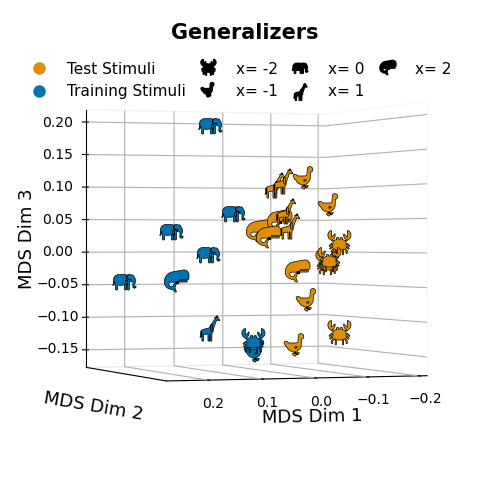

In [670]:
ssname = "allstim"
roi = "testgtlocParietalSup_bilateral" #"testgtlocParietalSup_bilateral"
cname = "Combined Cohort"
ncompo = 3

plot_title="Generalizers"

roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]
roimdsdf["stim_group_str"] = roimdsdf["stim_group"].map({0:"Test Stimuli",1:"Training Stimuli"})
roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure(figsize=(8,5))
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (stim_x, stim_y,sg), group in roimdsdf.groupby(['stim_x', 'stim_y','stim_group_str']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=train_test_color_pal[sg],#stimycolorhex[stim_y], 
            marker=stimxanimalmarkers[stim_x],
            s=400,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=train_test_color_pal[i], markersize=10, label='%s'%(i))
                for i in np.sort(roimdsdf["stim_group_str"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,fontdict={"weight":"bold","size":15},y=1) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13},labelpad=2)
ax.set_ylabel('MDS Dim 2',fontdict={"size":13},labelpad=0,rotation=15)
ax.set_zlabel('MDS Dim 3',fontdict={"size":13},labelpad=12)
ax.set_yticks([])
ax.tick_params(axis='both', which='both', pad=2)
ax.tick_params(axis='z', which='both', pad=8)
plt.setp(ax.get_xticklabels(),rotation=0,ha="center")
plt.setp(ax.get_zticklabels(),rotation=0,ha="center",va="center")

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Change the viewing angle
ax.view_init(elev=0, azim=70,roll=0)
ax.set_box_aspect([1, 1, 1],zoom=0.95) 
ax.legend(handles=color_legend + marker_legend, loc='center left', bbox_to_anchor=(0., 0.85),fontsize=11,ncol=4,frameon=False,columnspacing=0.5)


# Adjust the axis limits to avoid cropping
fig.tight_layout()
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)


In [ ]:
rdm_mds_results["aveRDM"].keys()

In [ ]:
ssname = "trainloc_all"
roi = "testgtlocParietalSup_bilateral" #"testgtlocParietalSup_bilateral"
cname = "Combined Cohort"
ncompo = 3

plot_title="MDS in bilateral ParietalSup"

roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]
roimdsdf["stim_group_str"] = roimdsdf["stim_group"].map({0:"test",1:"training"})
roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (stim_x, stim_y,sg), group in roimdsdf.copy().groupby(['stim_x', 'stim_y','stim_group_str']):
    #for p in stimxanimalmarkers[stim_x]:
    #group['MDS3'] = group['MDS2']
    #group['MDS2'] = 0
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[stim_y], #stim_group_pal[sg],#
            marker=stimxanimalmarkers[stim_x],
            s=250,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y = %d'%(i))
                for i in np.sort(roimdsdf["stim_y"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x = %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Change the viewing angle
ax.view_init(elev=0, azim=90,roll=0)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(1, 0.5),fontsize=11)



In [ ]:
# Change the viewing angle
ax.view_init(elev=150, azim=80,roll=100)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(1, 0.5),fontsize=11)


# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
fig
#mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
#checkdir(mds_output_dir)
#fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

In [ ]:
rdm_mds_results["aveRDM"].keys()

In [ ]:
ssname = "test"
roi = "testgtlocParietalSup_bilateral" #"testgtlocParietalSup_bilateral"
cname = "Combined Cohort"
ncompo = 3

plot_title="MDS in bilateral ParietalSup"

roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]
roimdsdf["stim_group_str"] = roimdsdf["stim_group"].map({0:"Test Stimuli",1:"Training Stimuli"})
roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (stim_x, stim_y,sg), group in roimdsdf.groupby(['stim_x', 'stim_y','stim_group_str']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=train_test_color_pal[sg],#stimycolorhex[stim_y], 
            marker=stimxanimalmarkers[stim_x],
            s=250,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=train_test_color_pal[i], markersize=10, label='%s stimuli'%(i))
                for i in np.sort(roimdsdf["stim_group_str"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Change the viewing angle
ax.view_init(elev=0, azim=80,roll=10)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(1, 0.5),fontsize=11)


# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

rescaled_ave_rdm = minmax_scale(roirdm,0,1)
np.fill_diagonal(rescaled_ave_rdm,np.nan)
sns.heatmap(rescaled_ave_rdm)

# Plot Parallel Axis Groups

## Distribution for main task

In [ ]:
rois

In [1143]:
#load precalculated PS and null distribution of PS
ROIPS_dict = load(os.path.join(ROIRSAdir,"axisPS","PS_NCtrainingstim.pkl"))
sub_cs_perms, sub_cs_obs = ROIPS_dict["permutation"], ROIPS_dict["observation"]
PS_classification = pd.read_csv(os.path.join(ROIRSAdir,"axisPS","PS_classification.csv"))

In [ ]:
sub_cs_permxaxis={}
for roi in rois:
    tmpdic = load(os.path.join(ROIRSAdir,"axisPS",f"PS_NCtrainingstim_{roi}.pkl"))
    sub_cs_permxaxis[roi] = tmpdic["xaxispermutation"]


Index(['Unnamed: 0', 'PPC_bilateral', 'HPC_bilateral', 'vmPFC_bilateral',
       'V1_bilateral', 'subid'],
      dtype='object')


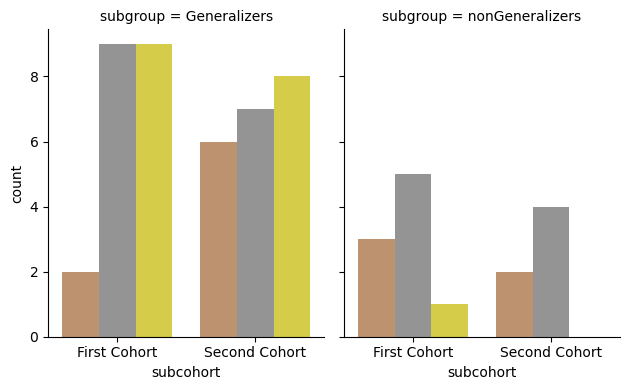

In [28]:
print(PS_classification.columns)
PS_classification["subgroup"] = pd.Categorical(
    ["Generalizers" if subid in generalizers else "nonGeneralizers" for subid in PS_classification["subid"]],
    categories=["Generalizers","nonGeneralizers"],ordered=True)
PS_classification["subcohort"] = pd.Categorical(
    ["First Cohort" if subid in cohort1ids else "Second Cohort" for subid in PS_classification["subid"]],
    categories=["First Cohort","Second Cohort"],ordered=True)

gs = sns.FacetGrid(PS_classification,col="subgroup",height=4,aspect=0.8)
gs.map_dataframe(sns.countplot,x="subcohort",hue="HPC_bilateral",palette=psgroupnum_huedict,legend="auto")


In [83]:
np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in generalizers and subid in slist]).shape

(41, 10000)

### plot fitted (folded) normal distribution

In [85]:
def simulate_dist_data(distribution="norm",mu=0, sigma=1, n_samples=1000,x=None,c=0):
    if x is None:
        x = np.linspace(mu - 3*sigma, mu + 3*sigma, n_samples)
    elif isinstance(x, (list, tuple, np.ndarray)):
        if np.size(x)==2:
            x = np.linspace(x[0], x[1], n_samples)
        else:
            x = np.array(x)
    if distribution == "norm":
        y = scipy.stats.norm.pdf(x, mu, sigma)
    elif distribution == "foldnorm":
        y = scipy.stats.foldnorm .pdf(x, loc=mu, scale=sigma,c=c)
    return x, y

In [103]:
# Bootstrap test: is mean(y2) > mean(y1)?
def bootstrap_diff(y1, y2, n_boot=10000):
    """Bootstrap test: is mean(y2) > mean(y1)

    Parameters
    ----------
    y1 : np.ndarray
        first array of values
    y2 : np.ndarray
        second array of values
    n_boot : int, optional
        number of bootstraps, by default 10000

    Returns
    -------
    np.float
        _description_
    """
    boot_diffs = []
    for _ in range(n_boot):
        b1 = np.random.choice(y1, size=len(y1), replace=True)
        b2 = np.random.choice(y2, size=len(y2), replace=True)
        boot_diffs.append(np.mean(b2) - np.mean(b1))
    return np.array(boot_diffs)



V1_bilateral Generalizers: 
NormaltestResult(statistic=0.5363627897963983, pvalue=0.7647690433173228)
Generalizer PS comes from: N(0.004,0.035)
Null PS comes from: N(-0.000,0.015)
Levene’s test p-value: 0.000
Generalizer absolute PS comes from: folded normal: c=0.289, (mu,std)=(0.001,0.033)
Null absolute PS comes from: folded normal: c=0.005, (mu,std)=(0.000,0.015)

PPC_bilateral Generalizers: 
NormaltestResult(statistic=3.70967541930922, pvalue=0.15647833553751117)
Generalizer PS comes from: N(0.001,0.035)
Null PS comes from: N(-0.000,0.009)
Levene’s test p-value: 0.000
Generalizer absolute PS comes from: folded normal: c=0.078, (mu,std)=(0.001,0.034)
Null absolute PS comes from: folded normal: c=0.030, (mu,std)=(0.000,0.009)

HPC_bilateral Generalizers: 
NormaltestResult(statistic=1.6968765336440044, pvalue=0.42808296153492953)
Generalizer PS comes from: N(0.016,0.039)
Null PS comes from: N(-0.000,0.008)
Levene’s test p-value: 0.000
Generalizer absolute PS comes from: folded normal:

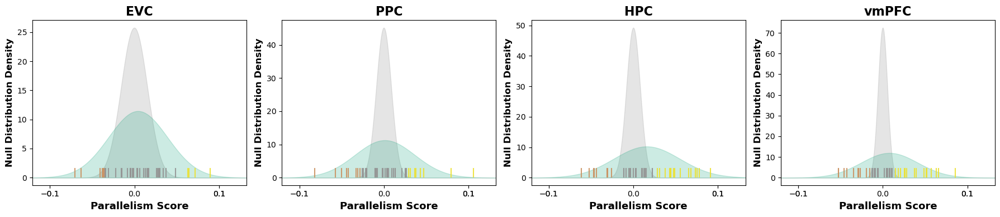

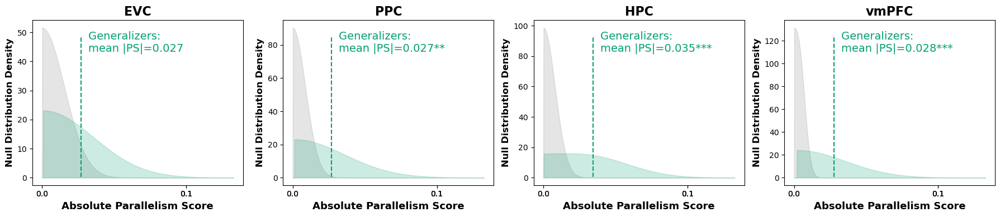

In [113]:

# find the min and max x values for simulation so that all the plots have the same x-axis limits
simx_range = (0,0)
for j,roi in enumerate(["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"]):     
    # get null and observed parallelism scores
    cs_null = np.array(sub_cs_perms[roi]).mean(axis=0)
    
    cs_G = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in generalizers]
    cs_NG = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in nongeneralizers]
    
    G_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in generalizers]).mean(axis=0)
    nG_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in nongeneralizers]).mean(axis=0)

    # calculate absolute values of parallelism scores    
    abscs_G = np.abs(cs_G)
    abscs_nG = np.abs(cs_NG)
    
    Gabs_null = np.abs(G_null)
    nGabs_null = np.abs(nG_null)
    
    csabs_null = np.abs(cs_null)

    # fit the distribution to the data
    G_mu, G_std = scipy.stats.norm.fit(cs_G)
    nG_mu, nG_std = scipy.stats.norm.fit(cs_NG)
    null_mu, null_std = scipy.stats.norm.fit(cs_null)

    # find max range
    max_std = np.max([G_std, nG_std, null_std])
    curr_range = (np.min([G_mu-3*max_std, nG_mu-3*max_std, null_mu-3*max_std]), 
                 np.max([G_mu+3*max_std, nG_mu+3*max_std, null_mu+3*max_std]))
    simx_range = (min(curr_range[0], simx_range[0]), max(curr_range[1], simx_range[1]))


# plot the observed and null distributions of parallelism scores and absolute parallelism scores
axcs_xlim, axabscs_xlim = (0,0), (0,0)
axcs_ylim, axabscs_ylim = (0,0), (0,0)
fig_cs,axes_cs = plt.subplots(1,4,figsize=(18,4))
fig_abscs,axes_abscs = plt.subplots(1,4,figsize=(18,4))
twinaxes_cs, twinaxes_abscs = [], []
    
for j,roi in enumerate(["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"]):     
    # get null and observed parallelism scores
    cs_null = np.array(sub_cs_perms[roi]).mean(axis=0)
    
    cs_G = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in generalizers]
    cs_NG = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in nongeneralizers]

    G_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in generalizers]).mean(axis=0)
    nG_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in nongeneralizers]).mean(axis=0)

    #cs_null = G_null

    # calculate absolute values of parallelism scores    
    abscs_G = np.abs(cs_G)
    abscs_nG = np.abs(cs_NG)
    
    Gabs_null = np.abs(G_null)
    nGabs_null = np.abs(nG_null)
    
    csabs_null = np.abs(cs_null)

    # fit normal distribution
    G_mu, G_std = scipy.stats.norm.fit(cs_G)
    null_mu, null_std = scipy.stats.norm.fit(cs_null)

    print(f"\n{roi} Generalizers: ")
    print(f"{scipy.stats.normaltest(cs_G)}")
    print(f"Generalizer PS comes from: N({G_mu:.3f},{G_std:.3f})")
    print(f"Null PS comes from: N({null_mu:.3f},{null_std:.3f})")
    
    var_stat, var_p = scipy.stats.levene(cs_G, cs_null)
    print(f"Levene’s test p-value: {var_p:.3f}")

    # plot the fitted normal distributions for PS
    axes_cs[j].fill_between(*simulate_dist_data(distribution="norm",mu=null_mu, sigma=null_std, n_samples=1000,x=simx_range),color="grey",
                            alpha=.2,
                            label="Null Distribution")
    axes_cs[j].fill_between(*simulate_dist_data(distribution="norm",mu=G_mu, sigma=G_std, n_samples=1000,x=simx_range),color=participantgrouphex["Generalizer"],
                            alpha=.2,
                            label="Generalizers")
    ### plot the mean
    #axes_cs[j].axvline(null_mu,color="grey",ls='--',lw=1.5)
    #axes_cs[j].axvline(G_mu,color=participantgrouphex["Generalizer"],ls='--',lw=1.5)

    for x,subid,subrc in zip(sub_cs_obs[roi],subid_list,PS_classification[roi]):
        if subid in generalizers and subid in slist:
            alpha_v = 0.9 #0.3 if abs(subrc)==1 else 0.9
            axes_cs[j].axvline(x,ymin=0.05,ymax=.1,color=psgroupnum_huedict[subrc],label="G",alpha=alpha_v)


    axes_cs[j].set_title(roi_shortnames[roi],**def_font_subplot_titles)
    axes_cs[j].set_xlabel("Parallelism Score",fontsize=13,fontweight="bold")
    axes_cs[j].set_ylabel("Null Distribution Density",**def_font_axis_legend_titles)

    axcs_xlim = (min(axes_cs[j].get_xlim()[0],axcs_xlim[0]), max(axes_cs[j].get_xlim()[1],axcs_xlim[1]))
    axcs_ylim = (min(axes_cs[j].get_ylim()[0],axcs_ylim[0]), max(axes_cs[j].get_ylim()[1],axcs_ylim[1]))

    # fit folded normal distribution
    Gfolded_c, Gfolded_mu, Gfolded_std = scipy.stats.foldnorm.fit(abscs_G)
    nullfolded_c, nullfolded_mu, nullfolded_std = scipy.stats.foldnorm.fit(csabs_null)
    
    print(f"Generalizer absolute PS comes from: folded normal: c={Gfolded_c:.3f}, (mu,std)=({Gfolded_mu:.3f},{Gfolded_std:.3f})")
    print(f"Null absolute PS comes from: folded normal: c={nullfolded_c:.3f}, (mu,std)=({nullfolded_mu:.3f},{nullfolded_std:.3f})")

    # plot the fitted folded normal distributions for absolute PS
    axes_abscs[j].fill_between(*simulate_dist_data(distribution="foldnorm",mu=nullfolded_mu, sigma=nullfolded_std, n_samples=1000,x=[0,simx_range[1]],c=nullfolded_c),color="grey",
                            alpha=.2,
                            label="Null Distribution")
    axes_abscs[j].fill_between(*simulate_dist_data(distribution="foldnorm",mu=Gfolded_mu, sigma=Gfolded_std, n_samples=1000,x=[0,simx_range[1]],c=Gfolded_c),color=participantgrouphex["Generalizer"],
                            alpha=.2,
                            label="Generalizers")
    
    axes_abscs[j].set_title(roi_shortnames[roi],**def_font_subplot_titles)
    axes_abscs[j].set_xlabel("Absolute Parallelism Score",fontsize=13,fontweight="bold")
    axes_abscs[j].set_ylabel("Null Distribution Density",**def_font_axis_legend_titles)

    axabscs_xlim = (min(axes_abscs[j].get_xlim()[0],axabscs_xlim[0]), max(axes_abscs[j].get_xlim()[1],axabscs_xlim[1]))
    axabscs_ylim = (min(axes_abscs[j].get_ylim()[0],axabscs_ylim[0]), max(axes_abscs[j].get_ylim()[1],axabscs_ylim[1]))

    #show the mean absolute PS for Generalizers
    G_abscsmu = np.mean(abscs_G)
    axes_abscs[j].axvline(x=G_abscsmu,ymin=0.05,ymax=.9,color=participantgrouphex["Generalizer"],label="Generalizers",ls='--',lw=1.5)
    Gp = (1 - np.mean([G_abscsmu>csn for csn in csabs_null]))
    
    if Gp<0.05:
        axes_abscs[j].text(G_abscsmu+0.005,0.8*axes_abscs[j].get_ylim()[1],f"Generalizers: \nmean |PS|={'%.3f' % G_abscsmu}{gen_pval_annot(Gp,show_pval=False)}",
                        color=participantgrouphex["Generalizer"],size=14)
    else:
        axes_abscs[j].text(G_abscsmu+0.005,0.8*axes_abscs[j].get_ylim()[1],f"Generalizers: \nmean |PS|={'%.3f' % G_abscsmu}",
                        color=participantgrouphex["Generalizer"],size=14)
    



axcs_xlim = simx_range
axcs_xticks = np.round(np.linspace(axcs_xlim[0], axcs_xlim[1], 5),1)
axabscs_xticks = np.round(np.linspace(axabscs_xlim[0], axabscs_xlim[1], 5),1)
for j in range(len(rois)):
    # set the x and y limits and ticks for the PS plot axes
    axes_cs[j].set_xlim(axcs_xlim)
    axes_cs[j].set_xticks(axcs_xticks)
    #axes_cs[j].set_ylim(axcs_ylim)
    #axes_cs[j].set_yticks([])

    # set the x and y limits and ticks for the absolute PS plot axes
    axes_abscs[j].set_xlim(axabscs_xlim)
    axes_abscs[j].set_xticks(axabscs_xticks)
    #axes_abscs[j].set_ylim(axabscs_ylim)
    #axes_abscs[j].set_yticks([])

fig_cs.tight_layout()
fig_abscs.tight_layout()



V1_bilateral Generalizers: 
NormaltestResult(statistic=0.5363627897963983, pvalue=0.7647690433173228)
Generalizer PS comes from: N(0.004,0.035)
Null PS comes from: N(-0.000,0.015)
Levene’s test p-value: 0.000
Generalizer absolute PS comes from: folded normal: c=0.289, (mu,std)=(0.001,0.033)
Null absolute PS comes from: folded normal: c=0.005, (mu,std)=(0.000,0.015)

PPC_bilateral Generalizers: 
NormaltestResult(statistic=3.70967541930922, pvalue=0.15647833553751117)
Generalizer PS comes from: N(0.001,0.035)
Null PS comes from: N(-0.000,0.009)
Levene’s test p-value: 0.000
Generalizer absolute PS comes from: folded normal: c=0.078, (mu,std)=(0.001,0.034)
Null absolute PS comes from: folded normal: c=0.030, (mu,std)=(0.000,0.009)

HPC_bilateral Generalizers: 
NormaltestResult(statistic=1.6968765336440044, pvalue=0.42808296153492953)
Generalizer PS comes from: N(0.016,0.039)
Null PS comes from: N(-0.000,0.008)
Levene’s test p-value: 0.000
Generalizer absolute PS comes from: folded normal:

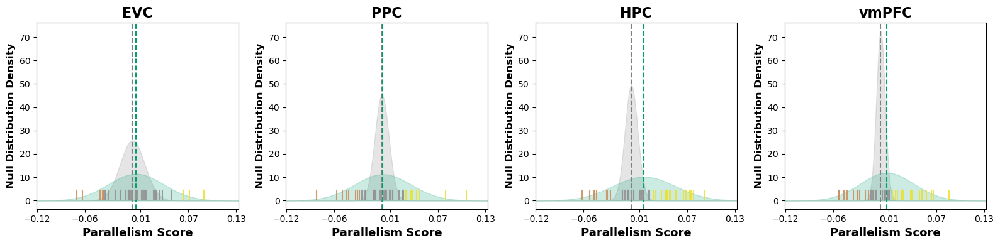

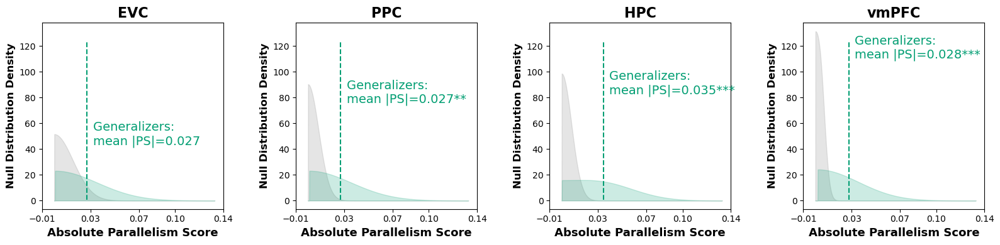

In [622]:


# find the min and max x values for simulation so that all the plots have the same x-axis limits
simx_range = (0,0)
for j,roi in enumerate(["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"]):     
    # get null and observed parallelism scores
    cs_null = np.array(sub_cs_perms[roi]).mean(axis=0)
    
    cs_G = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in generalizers]
    cs_NG = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in nongeneralizers]
    
    G_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in generalizers]).mean(axis=0)
    nG_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in nongeneralizers]).mean(axis=0)

    # calculate absolute values of parallelism scores    
    abscs_G = np.abs(cs_G)
    abscs_nG = np.abs(cs_NG)
    
    Gabs_null = np.abs(G_null)
    nGabs_null = np.abs(nG_null)
    
    csabs_null = np.abs(cs_null)

    # fit the distribution to the data
    G_mu, G_std = scipy.stats.norm.fit(cs_G)
    nG_mu, nG_std = scipy.stats.norm.fit(cs_NG)
    null_mu, null_std = scipy.stats.norm.fit(cs_null)

    # find max range
    max_std = np.max([G_std, nG_std, null_std])
    curr_range = (np.min([G_mu-3*max_std, nG_mu-3*max_std, null_mu-3*max_std]), 
                 np.max([G_mu+3*max_std, nG_mu+3*max_std, null_mu+3*max_std]))
    simx_range = (min(curr_range[0], simx_range[0]), max(curr_range[1], simx_range[1]))


# plot the observed and null distributions of parallelism scores and absolute parallelism scores
axcs_xlim, axabscs_xlim = (0,0), (0,0)
axcs_ylim, axabscs_ylim = (0,0), (0,0)
fig_cs,axes_cs = plt.subplots(1,4,figsize=(16,4))
fig_abscs,axes_abscs = plt.subplots(1,4,figsize=(16,4))
twinaxes_cs, twinaxes_abscs = [], []
    
for j,roi in enumerate(["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"]):     
    # get null and observed parallelism scores
    cs_null = np.array(sub_cs_perms[roi]).mean(axis=0)
    
    cs_G = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in generalizers]
    cs_NG = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in nongeneralizers]

    G_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in generalizers]).mean(axis=0)
    nG_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in nongeneralizers]).mean(axis=0)

    # calculate absolute values of parallelism scores    
    abscs_G = np.abs(cs_G)
    abscs_nG = np.abs(cs_NG)
    
    Gabs_null = np.abs(G_null)
    nGabs_null = np.abs(nG_null)
    
    csabs_null = np.abs(cs_null)

    # fit normal distribution
    G_mu, G_std = scipy.stats.norm.fit(cs_G)
    null_mu, null_std = scipy.stats.norm.fit(cs_null)

    print(f"\n{roi} Generalizers: ")
    print(f"{scipy.stats.normaltest(cs_G)}")
    print(f"Generalizer PS comes from: N({G_mu:.3f},{G_std:.3f})")
    print(f"Null PS comes from: N({null_mu:.3f},{null_std:.3f})")
    
    var_stat, var_p = scipy.stats.levene(cs_G, cs_null)
    print(f"Levene’s test p-value: {var_p:.3f}")

    # plot the fitted normal distributions for PS
    axes_cs[j].fill_between(*simulate_dist_data(distribution="norm",mu=null_mu, sigma=null_std, n_samples=1000,x=simx_range),color="grey",
                            alpha=.2,
                            label="Null Distribution")
    axes_cs[j].axvline(null_mu,color="grey",ls='--',lw=1.5)
    axes_cs[j].fill_between(*simulate_dist_data(distribution="norm",mu=G_mu, sigma=G_std, n_samples=1000,x=simx_range),color=participantgrouphex["Generalizer"],
                            alpha=.2,
                            label="Generalizers")
    axes_cs[j].axvline(G_mu,color=participantgrouphex["Generalizer"],ls='--',lw=1.5)

    for x,subid,subrc in zip(sub_cs_obs[roi],subid_list,PS_classification[roi]):
        if subid in generalizers and subid in slist:
            alpha_v = 0.9 #0.3 if abs(subrc)==1 else 0.9
            axes_cs[j].axvline(x,ymin=0.05,ymax=.1,color=psgroupnum_huedict[subrc],label="G",alpha=alpha_v)


    axes_cs[j].set_title(roi_shortnames[roi],**def_font_subplot_titles)
    axes_cs[j].set_xlabel("Parallelism Score",fontsize=13,fontweight="bold")
    axes_cs[j].set_ylabel("Null Distribution Density",**def_font_axis_legend_titles)

    axcs_xlim = (min(axes_cs[j].get_xlim()[0],axcs_xlim[0]), max(axes_cs[j].get_xlim()[1],axcs_xlim[1]))
    axcs_ylim = (min(axes_cs[j].get_ylim()[0],axcs_ylim[0]), max(axes_cs[j].get_ylim()[1],axcs_ylim[1]))

    # fit folded normal distribution
    Gfolded_c, Gfolded_mu, Gfolded_std = scipy.stats.foldnorm.fit(abscs_G)
    nullfolded_c, nullfolded_mu, nullfolded_std = scipy.stats.foldnorm.fit(csabs_null)
    
    print(f"Generalizer absolute PS comes from: folded normal: c={Gfolded_c:.3f}, (mu,std)=({Gfolded_mu:.3f},{Gfolded_std:.3f})")
    print(f"Null absolute PS comes from: folded normal: c={nullfolded_c:.3f}, (mu,std)=({nullfolded_mu:.3f},{nullfolded_std:.3f})")

    # plot the fitted folded normal distributions for absolute PS
    axes_abscs[j].fill_between(*simulate_dist_data(distribution="foldnorm",mu=nullfolded_mu, sigma=nullfolded_std, n_samples=1000,x=[0,simx_range[1]],c=nullfolded_c),color="grey",
                            alpha=.2,
                            label="Null Distribution")
    axes_abscs[j].fill_between(*simulate_dist_data(distribution="foldnorm",mu=Gfolded_mu, sigma=Gfolded_std, n_samples=1000,x=[0,simx_range[1]],c=Gfolded_c),color=participantgrouphex["Generalizer"],
                            alpha=.2,
                            label="Generalizers")
    
    axes_abscs[j].set_title(roi_shortnames[roi],**def_font_subplot_titles)
    axes_abscs[j].set_xlabel("Absolute Parallelism Score",fontsize=13,fontweight="bold")
    axes_abscs[j].set_ylabel("Null Distribution Density",**def_font_axis_legend_titles)

    axabscs_xlim = (min(axes_abscs[j].get_xlim()[0],axabscs_xlim[0]), max(axes_abscs[j].get_xlim()[1],axabscs_xlim[1]))
    axabscs_ylim = (min(axes_abscs[j].get_ylim()[0],axabscs_ylim[0]), max(axes_abscs[j].get_ylim()[1],axabscs_ylim[1]))

    #show the mean absolute PS for Generalizers
    G_abscsmu = np.mean(abscs_G)
    axes_abscs[j].axvline(x=G_abscsmu,ymin=0.05,ymax=.9,color=participantgrouphex["Generalizer"],label="Generalizers",ls='--',lw=1.5)
    Gp = (1 - np.mean([G_abscsmu>csn for csn in csabs_null]))
    if Gp<0.05:
        axes_abscs[j].text(G_abscsmu+0.005,0.8*axes_abscs[j].get_ylim()[1],f"Generalizers: \nmean |PS|={'%.3f' % G_abscsmu}{gen_pval_annot(Gp,show_pval=False)}",
                        color=participantgrouphex["Generalizer"],size=14)
    else:
        axes_abscs[j].text(G_abscsmu+0.005,0.8*axes_abscs[j].get_ylim()[1],f"Generalizers: \nmean |PS|={'%.3f' % G_abscsmu}",
                        color=participantgrouphex["Generalizer"],size=14)
    



axcs_xlim = simx_range
axcs_xticks = np.round(np.linspace(axcs_xlim[0], axcs_xlim[1], 5),2)
axabscs_xticks = np.round(np.linspace(axabscs_xlim[0], axabscs_xlim[1], 5),2)
for j in range(len(rois)):
    # set the x and y limits and ticks for the PS plot axes
    axes_cs[j].set_xlim(axcs_xlim)
    axes_cs[j].set_ylim(axcs_ylim)
    axes_cs[j].set_xticks(axcs_xticks)
    #axes_cs[j].set_yticks([])

    # set the x and y limits and ticks for the absolute PS plot axes
    axes_abscs[j].set_xlim(axabscs_xlim)
    axes_abscs[j].set_ylim(axabscs_ylim)
    axes_abscs[j].set_xticks(axabscs_xticks)
    #axes_abscs[j].set_yticks([])

fig_cs.tight_layout()
fig_abscs.tight_layout(w_pad=2.8)



HPC_bilateral Generalizers: 
NormaltestResult(statistic=1.6968765336440044, pvalue=0.42808296153492953)
Generalizer PS comes from: N(0.016,0.039)
Null PS comes from: N(-0.000,0.008)
Levene’s test p-value: 0.000


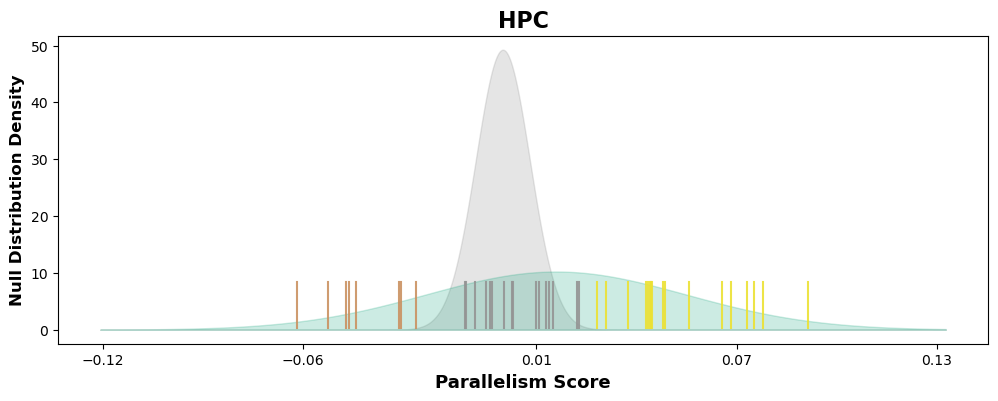

In [670]:

roi = "HPC_bilateral"

fig_HPCcs,axes_HPCcs = plt.subplots(1,1,figsize=(12,4))
    
# get null and observed parallelism scores
cs_null = np.array(sub_cs_perms[roi]).mean(axis=0)

cs_G = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in generalizers]
cs_NG = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in nongeneralizers]

G_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in generalizers]).mean(axis=0)
nG_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in nongeneralizers]).mean(axis=0)

# calculate absolute values of parallelism scores    
abscs_G = np.abs(cs_G)
abscs_nG = np.abs(cs_NG)

Gabs_null = np.abs(G_null)
nGabs_null = np.abs(nG_null)

csabs_null = np.abs(cs_null)

# fit normal distribution
G_mu, G_std = scipy.stats.norm.fit(cs_G)
null_mu, null_std = scipy.stats.norm.fit(cs_null)

print(f"\n{roi} Generalizers: ")
print(f"{scipy.stats.normaltest(cs_G)}")
print(f"Generalizer PS comes from: N({G_mu:.3f},{G_std:.3f})")
print(f"Null PS comes from: N({null_mu:.3f},{null_std:.3f})")

var_stat, var_p = scipy.stats.levene(cs_G, cs_null)
print(f"Levene’s test p-value: {var_p:.3f}")

# plot the fitted normal distributions for PS
axes_HPCcs.fill_between(*simulate_dist_data(distribution="norm",mu=null_mu, sigma=null_std, n_samples=1000,x=simx_range),color="grey",
                        alpha=.2,
                        label="Null Distribution")
axes_HPCcs.fill_between(*simulate_dist_data(distribution="norm",mu=G_mu, sigma=G_std, n_samples=1000,x=simx_range),color=participantgrouphex["Generalizer"],
                        alpha=.2,
                        label="Generalizers")
#axes_HPCcs.axvline(null_mu,color="grey",ls='--',lw=1.5)
#axes_HPCcs.axvline(G_mu,color=participantgrouphex["Generalizer"],ls='--',lw=1.5)

for x,subid,subrc in zip(sub_cs_obs[roi],subid_list,PS_classification[roi]):
    if subid in generalizers and subid in slist:
        alpha_v = 0.9 #0.3 if abs(subrc)==1 else 0.9
        axes_HPCcs.axvline(x,ymin=0.05,ymax=.2,color=psgroupnum_huedict[subrc],label="G",alpha=alpha_v)


axes_HPCcs.set_title(roi_shortnames[roi],**def_font_subplot_titles)
axes_HPCcs.set_xlabel("Parallelism Score",fontsize=13,fontweight="bold")
axes_HPCcs.set_ylabel("Null Distribution Density",**def_font_axis_legend_titles)

axcs_xlim = (min(axes_HPCcs.get_xlim()[0],axcs_xlim[0]), max(axes_HPCcs.get_xlim()[1],axcs_xlim[1]))
axcs_ylim = (min(axes_HPCcs.get_ylim()[0],axcs_ylim[0]), max(axes_HPCcs.get_ylim()[1],axcs_ylim[1]))


# set the x and y limits and ticks for the PS plot axes
#axes_HPCcs.set_xlim(axcs_xlim)
#axes_HPCcs.set_ylim(axcs_ylim)
axes_HPCcs.set_xticks(axcs_xticks)
#axes_HPCcs.set_yticks([])



In [1149]:
tmpcsp = deepcopy(sub_cs_permxaxis)
sub_cs_permxaxis = {}
for roi in rois:
    sub_cs_permxaxis[roi] = tmpcsp[roi][roi]


V1_bilateral Generalizers: 
NormaltestResult(statistic=0.5363627897963983, pvalue=0.7647690433173228)
Generalizer PS comes from: N(0.004,0.035)
Null PS comes from: N(0.000,0.004)
Levene’s test p-value: 0.000
Generalizer absolute PS comes from: folded normal: c=0.289, (mu,std)=(0.001,0.033)
Null absolute PS comes from: folded normal: c=0.000, (mu,std)=(-0.001,0.005)

PPC_bilateral Generalizers: 
NormaltestResult(statistic=3.70967541930922, pvalue=0.15647833553751117)
Generalizer PS comes from: N(0.001,0.035)
Null PS comes from: N(0.000,0.007)
Levene’s test p-value: 0.000
Generalizer absolute PS comes from: folded normal: c=0.078, (mu,std)=(0.001,0.034)
Null absolute PS comes from: folded normal: c=0.002, (mu,std)=(0.000,0.006)

HPC_bilateral Generalizers: 
NormaltestResult(statistic=1.6968765336440044, pvalue=0.42808296153492953)
Generalizer PS comes from: N(0.016,0.039)
Null PS comes from: N(0.000,0.007)
Levene’s test p-value: 0.000
Generalizer absolute PS comes from: folded normal: c

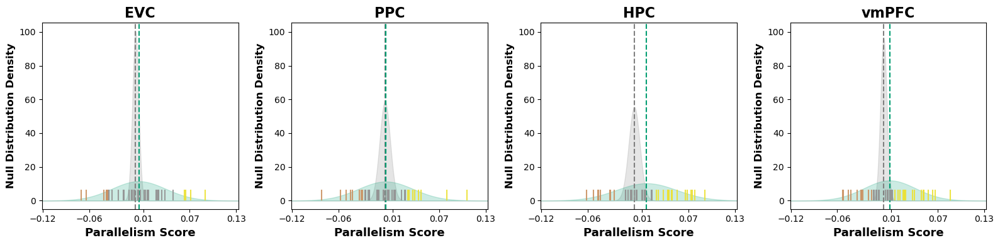

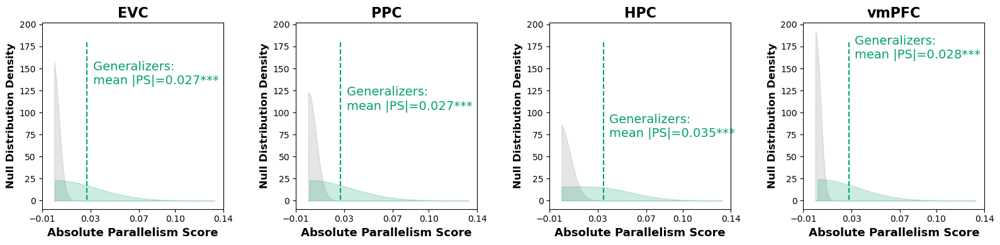

In [1151]:


# find the min and max x values for simulation so that all the plots have the same x-axis limits
simx_range = (0,0)
for j,roi in enumerate(["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"]):     
    # get null and observed parallelism scores
    cs_null = np.array(sub_cs_permxaxis[roi]).mean(axis=0)
    
    cs_G = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in generalizers]
    cs_NG = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in nongeneralizers]
    
    G_null = np.array([cs for cs,subid in zip(sub_cs_permxaxis[roi],subid_list) if subid in generalizers]).mean(axis=0)
    nG_null = np.array([cs for cs,subid in zip(sub_cs_permxaxis[roi],subid_list) if subid in nongeneralizers]).mean(axis=0)

    # calculate absolute values of parallelism scores    
    abscs_G = np.abs(cs_G)
    abscs_nG = np.abs(cs_NG)
    
    Gabs_null = np.abs(G_null)
    nGabs_null = np.abs(nG_null)
    
    csabs_null = np.abs(cs_null)

    # fit the distribution to the data
    G_mu, G_std = scipy.stats.norm.fit(cs_G)
    nG_mu, nG_std = scipy.stats.norm.fit(cs_NG)
    null_mu, null_std = scipy.stats.norm.fit(cs_null)

    # find max range
    max_std = np.max([G_std, nG_std, null_std])
    curr_range = (np.min([G_mu-3*max_std, nG_mu-3*max_std, null_mu-3*max_std]), 
                 np.max([G_mu+3*max_std, nG_mu+3*max_std, null_mu+3*max_std]))
    simx_range = (min(curr_range[0], simx_range[0]), max(curr_range[1], simx_range[1]))


# plot the observed and null distributions of parallelism scores and absolute parallelism scores
axcs_xlim, axabscs_xlim = (0,0), (0,0)
axcs_ylim, axabscs_ylim = (0,0), (0,0)
fig_cs,axes_cs = plt.subplots(1,4,figsize=(16,4))
fig_abscs,axes_abscs = plt.subplots(1,4,figsize=(16,4))
twinaxes_cs, twinaxes_abscs = [], []
    
for j,roi in enumerate(["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"]):     
    # get null and observed parallelism scores
    cs_null = np.array(sub_cs_permxaxis[roi]).mean(axis=0)
    
    cs_G = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in generalizers]
    cs_NG = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in nongeneralizers]

    G_null = np.array([cs for cs,subid in zip(sub_cs_permxaxis[roi],subid_list) if subid in generalizers]).mean(axis=0)
    nG_null = np.array([cs for cs,subid in zip(sub_cs_permxaxis[roi],subid_list) if subid in nongeneralizers]).mean(axis=0)

    # calculate absolute values of parallelism scores    
    abscs_G = np.abs(cs_G)
    abscs_nG = np.abs(cs_NG)
    
    Gabs_null = np.abs(G_null)
    nGabs_null = np.abs(nG_null)
    
    csabs_null = np.abs(cs_null)

    # fit normal distribution
    G_mu, G_std = scipy.stats.norm.fit(cs_G)
    null_mu, null_std = scipy.stats.norm.fit(cs_null)

    print(f"\n{roi} Generalizers: ")
    print(f"{scipy.stats.normaltest(cs_G)}")
    print(f"Generalizer PS comes from: N({G_mu:.3f},{G_std:.3f})")
    print(f"Null PS comes from: N({null_mu:.3f},{null_std:.3f})")
    
    var_stat, var_p = scipy.stats.levene(cs_G, cs_null)
    print(f"Levene’s test p-value: {var_p:.3f}")

    # plot the fitted normal distributions for PS
    axes_cs[j].fill_between(*simulate_dist_data(distribution="norm",mu=null_mu, sigma=null_std, n_samples=1000,x=simx_range),color="grey",
                            alpha=.2,
                            label="Null Distribution")
    axes_cs[j].axvline(null_mu,color="grey",ls='--',lw=1.5)
    axes_cs[j].fill_between(*simulate_dist_data(distribution="norm",mu=G_mu, sigma=G_std, n_samples=1000,x=simx_range),color=participantgrouphex["Generalizer"],
                            alpha=.2,
                            label="Generalizers")
    axes_cs[j].axvline(G_mu,color=participantgrouphex["Generalizer"],ls='--',lw=1.5)

    for x,subid,subrc in zip(sub_cs_obs[roi],subid_list,PS_classification[roi]):
        if subid in generalizers and subid in slist:
            alpha_v = 0.9 #0.3 if abs(subrc)==1 else 0.9
            axes_cs[j].axvline(x,ymin=0.05,ymax=.1,color=psgroupnum_huedict[subrc],label="G",alpha=alpha_v)


    axes_cs[j].set_title(roi_shortnames[roi],**def_font_subplot_titles)
    axes_cs[j].set_xlabel("Parallelism Score",fontsize=13,fontweight="bold")
    axes_cs[j].set_ylabel("Null Distribution Density",**def_font_axis_legend_titles)

    axcs_xlim = (min(axes_cs[j].get_xlim()[0],axcs_xlim[0]), max(axes_cs[j].get_xlim()[1],axcs_xlim[1]))
    axcs_ylim = (min(axes_cs[j].get_ylim()[0],axcs_ylim[0]), max(axes_cs[j].get_ylim()[1],axcs_ylim[1]))

    # fit folded normal distribution
    Gfolded_c, Gfolded_mu, Gfolded_std = scipy.stats.foldnorm.fit(abscs_G)
    nullfolded_c, nullfolded_mu, nullfolded_std = scipy.stats.foldnorm.fit(csabs_null)
    
    print(f"Generalizer absolute PS comes from: folded normal: c={Gfolded_c:.3f}, (mu,std)=({Gfolded_mu:.3f},{Gfolded_std:.3f})")
    print(f"Null absolute PS comes from: folded normal: c={nullfolded_c:.3f}, (mu,std)=({nullfolded_mu:.3f},{nullfolded_std:.3f})")

    # plot the fitted folded normal distributions for absolute PS
    axes_abscs[j].fill_between(*simulate_dist_data(distribution="foldnorm",mu=nullfolded_mu, sigma=nullfolded_std, n_samples=1000,x=[0,simx_range[1]],c=nullfolded_c),color="grey",
                            alpha=.2,
                            label="Null Distribution")
    axes_abscs[j].fill_between(*simulate_dist_data(distribution="foldnorm",mu=Gfolded_mu, sigma=Gfolded_std, n_samples=1000,x=[0,simx_range[1]],c=Gfolded_c),color=participantgrouphex["Generalizer"],
                            alpha=.2,
                            label="Generalizers")
    
    axes_abscs[j].set_title(roi_shortnames[roi],**def_font_subplot_titles)
    axes_abscs[j].set_xlabel("Absolute Parallelism Score",fontsize=13,fontweight="bold")
    axes_abscs[j].set_ylabel("Null Distribution Density",**def_font_axis_legend_titles)

    axabscs_xlim = (min(axes_abscs[j].get_xlim()[0],axabscs_xlim[0]), max(axes_abscs[j].get_xlim()[1],axabscs_xlim[1]))
    axabscs_ylim = (min(axes_abscs[j].get_ylim()[0],axabscs_ylim[0]), max(axes_abscs[j].get_ylim()[1],axabscs_ylim[1]))

    #show the mean absolute PS for Generalizers
    G_abscsmu = np.mean(abscs_G)
    axes_abscs[j].axvline(x=G_abscsmu,ymin=0.05,ymax=.9,color=participantgrouphex["Generalizer"],label="Generalizers",ls='--',lw=1.5)
    Gp = (1 - np.mean([G_abscsmu>csn for csn in csabs_null]))
    if Gp<0.05:
        axes_abscs[j].text(G_abscsmu+0.005,0.8*axes_abscs[j].get_ylim()[1],f"Generalizers: \nmean |PS|={'%.3f' % G_abscsmu}{gen_pval_annot(Gp,show_pval=False)}",
                        color=participantgrouphex["Generalizer"],size=14)
    else:
        axes_abscs[j].text(G_abscsmu+0.005,0.8*axes_abscs[j].get_ylim()[1],f"Generalizers: \nmean |PS|={'%.3f' % G_abscsmu}",
                        color=participantgrouphex["Generalizer"],size=14)
    



axcs_xlim = simx_range
axcs_xticks = np.round(np.linspace(axcs_xlim[0], axcs_xlim[1], 5),2)
axabscs_xticks = np.round(np.linspace(axabscs_xlim[0], axabscs_xlim[1], 5),2)
for j in range(len(rois)):
    # set the x and y limits and ticks for the PS plot axes
    axes_cs[j].set_xlim(axcs_xlim)
    axes_cs[j].set_ylim(axcs_ylim)
    axes_cs[j].set_xticks(axcs_xticks)
    #axes_cs[j].set_yticks([])

    # set the x and y limits and ticks for the absolute PS plot axes
    axes_abscs[j].set_xlim(axabscs_xlim)
    axes_abscs[j].set_ylim(axabscs_ylim)
    axes_abscs[j].set_xticks(axabscs_xticks)
    #axes_abscs[j].set_yticks([])

fig_cs.tight_layout()
fig_abscs.tight_layout(w_pad=2.8)


### plot kde

In [ ]:
def_font_axis_legend_titles

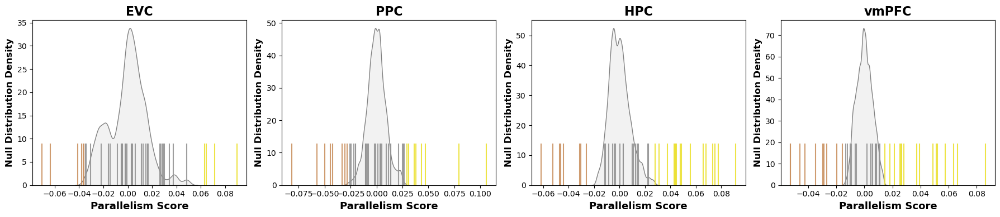

In [ ]:
fig_cs,axes_cs = plt.subplots(1,4,figsize=(18,4))
for j,roi in enumerate(["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"]):     
    GnG_colors = sns.color_palette(None,2)
    cs_null = np.array(sub_cs_perms[roi]).mean(axis=0)
    
    cs_G = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in generalizers and subid in slist]
    cs_NG = [cs for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in nongeneralizers and subid in slist]

    G_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in generalizers and subid in slist]).mean(axis=0)
    nG_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in nongeneralizers and subid in slist]).mean(axis=0)
    #cs_G = G_null

    G_mu, G_std = scipy.stats.norm.fit(cs_G)

    sns.kdeplot(data=pd.DataFrame(np.atleast_2d(cs_null).T,columns=["null"]),
                x="null",bw_adjust=1,
                color="grey",fill=True,alpha=0.1,ax=axes_cs[j])
    #twinax = axes_cs.twinx()
    #sns.kdeplot(data=pd.DataFrame(np.atleast_2d(cs_G).T,columns=["Generalizers"]),
    #            x="Generalizers",bw_adjust=1,
    #            color="blue",fill=True,alpha=0.5,ax=twinax)
    #sns.kdeplot(data=pd.DataFrame(np.atleast_2d(cs_NG).T,columns=["nonGeneralizers"]),
    #            x="nonGeneralizers",bw_adjust=1,
    #            color="orange",fill=True,alpha=0.5,ax=twinax)
    axylim = axes_cs[j].get_ylim()
    axxlim = axes_cs[j].get_xlim()
    
    for x,subid,subrc in zip(sub_cs_obs[roi],subid_list,PS_classification[roi]):
        if subid in generalizers and subid in slist:
            alpha_v = 0.9 #0.3 if abs(subrc)==1 else 0.9
            axes_cs[j].axvline(x,ymin=0,ymax=.25,color=psgroupnum_huedict[subrc],label="G",alpha=alpha_v)

    G_csmu = np.mean(cs_G)
    #axes_cs.axvline(x=G_csmu,color=GnG_colors[0],label="Generalizers")
    NG_csmu = np.mean(cs_NG)
    Gp = (1 - np.mean([G_csmu>csn for csn in cs_null]))
    NGp = (1 - np.mean([NG_csmu>csn for csn in cs_null]))
    #if Gp<0.05:
    #    axes_cs.text(axxlim[0],0.8*axylim[1],f"Generalizers: mean PS={'%.3f' % G_csmu} ({gen_pval_annot(Gp)})",color=GnG_colors[0])
    #else:
    #    axes_cs.text(axxlim[0],0.8*axylim[1],f"Generalizers: mean PS={'%.3f' % G_csmu}",color=GnG_colors[0])
    
    axes_cs[j].set_title(roi_shortnames[roi],**def_font_subplot_titles)
    axes_cs[j].set_xlabel("Parallelism Score",fontsize=13,fontweight="bold")
    axes_cs[j].set_ylabel("Null Distribution Density",**def_font_axis_legend_titles)

    #fig_cs.suptitle(roi_shortnames[roi],**def_font_subplot_titles)
    fig_cs.tight_layout()


In [80]:
PS_aveactivitypattern = pd.DataFrame(sub_cs_obs)
print(PS_aveactivitypattern.columns)
print(PS_aveactivitypattern["HPC_bilateral"].unique())
PS_aveactivitypattern["subid"] = subid_list
PS_aveactivitypattern["subgroup"] = pd.Categorical(
    ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in PS_aveactivitypattern["subid"]],
    categories=["Generalizer","nonGeneralizer"],ordered=True)
PS_aveactivitypattern["subcohort"] = pd.Categorical(
    ["First Cohort" if subid in cohort1ids else "Second Cohort" for subid in PS_aveactivitypattern["subid"]],
    categories=["First Cohort","Second Cohort"],ordered=True)


Index(['PPC_bilateral', 'HPC_bilateral', 'vmPFC_bilateral', 'V1_bilateral'], dtype='object')
[ 0.06572263 -0.03866208 -0.00839792  0.0261322  -0.03130063  0.00014483
 -0.04700746  0.07785895  0.01489999 -0.04018034  0.04456537 -0.00231996
  0.01645424  0.01878181  0.04414408 -0.00392369 -0.08734444  0.01078163
  0.02222451  0.09145123  0.05409282  0.05561454  0.01992889  0.07327479
 -0.0032589   0.00276925  0.02270042  0.04279134  0.06822866 -0.02037652
  0.01278388 -0.05239915  0.04867094  0.02016448  0.00997932 -0.04400137
  0.04338192 -0.04606441  0.03092633 -0.00519644 -0.01147921 -0.03050144
  0.0029443  -0.02613643 -0.01103446  0.0130361  -0.06167195 -0.05296489
  0.00531513  0.04784154  0.02815725  0.07510907  0.04423767  0.03753488
  0.01384959  0.00982412]


In [81]:
def correlation_equiv_permutation(y1,y2,corrfun,corr_kwargs={},n_perm=10000,return_ponly = True,**kwargs):
    res = scipy.stats.permutation_test((y1,y2),
                                       statistic=lambda y1,y2: corrfun(y1,y2),
                                       n_resamples=n_perm,permutation_type="pairings",
                                       random_state  = 0, # for reproducibility
                                       **kwargs)
    if return_ponly:
        return res.pvalue
    else:
        return res

HPC_bilateral vmPFC_bilateral Generalizer
rho = 0.5294, pval = 0.0006
HPC_bilateral vmPFC_bilateral nonGeneralizer
rho = 0.3695, pval = 0.1830


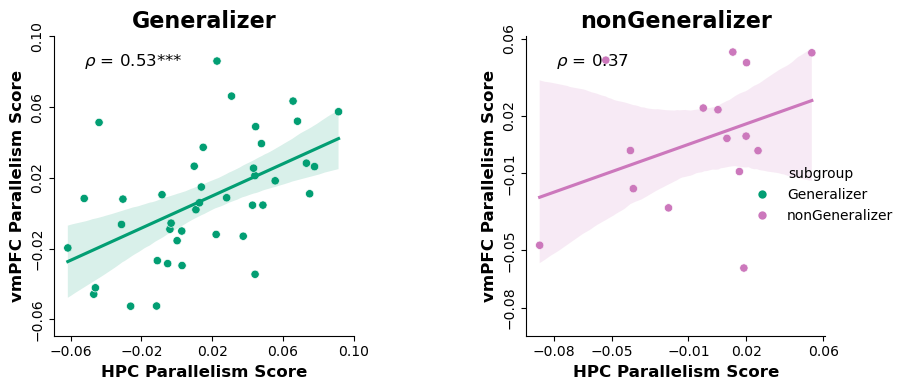

In [82]:
def pearsonrcorr(data,x, y, ax=None,**kwargs):
    res = scipy.stats.pearsonr(data[x], data[y])
    rho,pval = res.statistic, res.pvalue
    corrfun = lambda y1,y2: scipy.stats.pearsonr(y1,y2).statistic
    pval = correlation_equiv_permutation(data[x],data[y],corrfun,n_perm=10000,return_ponly=True)
    ax = ax if ax is not None else plt.gca()
    if pval<=0.05:
        ax.annotate(r'$\rho$ = '+f'{rho:.2f}{gen_pval_annot(pval,show_pval=False)}', xy=(0.1, 0.9), xycoords=ax.transAxes,fontsize=12)
    else:
        ax.annotate(r'$\rho$ = '+f'{rho:.2f}', xy=(0.1, 0.9), xycoords=ax.transAxes,fontsize=12)
    print(f"rho = {rho:.4f}, pval = {pval:.4f}")

for xvar in ["HPC_bilateral"]:#,"vmPFC_bilateral"]:
    for yvar in ["vmPFC_bilateral"]:#,"testgtlocParietalSup_bilateral","V1_bilateral"]:
        gs = sns.relplot(
            PS_aveactivitypattern,
            x=xvar,
            y=yvar,
            col="subgroup",
            hue="subgroup",
            palette=participantgrouphex,
            kind="scatter",
            height=4,aspect=1,
            facet_kws={"sharey":False,"sharex":False}
        ).set_titles("{col_name}",fontweight="bold",fontsize=16,y=1.1)
        #gs.map_dataframe(pearsonrcorr,x=xvar,y=yvar)
        for ax in gs.axes.flatten():
            print(xvar, yvar,  ax.get_title())
            pearsonrcorr(data=PS_aveactivitypattern[PS_aveactivitypattern["subgroup"]==ax.get_title()].copy(),
                        x=xvar,
                        y=yvar,ax=ax)
            sns.regplot(data=PS_aveactivitypattern[PS_aveactivitypattern["subgroup"]==ax.get_title()].copy(),
                        x=xvar,
                        y=yvar,scatter=False,
                        color=participantgrouphex[ax.get_title()],
                        ax=ax)
            ax.set_xlabel(f"{roi_shortnames[xvar]} Parallelism Score",**def_font_axis_legend_titles)
            ax.set_ylabel(f"{roi_shortnames[yvar]} Parallelism Score",**def_font_axis_legend_titles)
            xl,yl = ax.get_xlim(), ax.get_ylim()
            ax.set_aspect(1)
            newl = min(xl[0],yl[0])
            newh = max(xl[1],yl[1])
            ax.set_xlim(newl,newh)
            ax.set_ylim(newl,newh)
            ax.set_xticks(np.round(np.linspace(newl*0.9, newh,5),2))
            ax.set_yticks(np.round(np.linspace(newl*0.9, newh,5),2))
            plt.setp(ax.get_yticklabels(),rotation=90,va="center")
            ax.set_title(ax.get_title(),**def_font_subplot_titles)
        gs.fig.tight_layout()




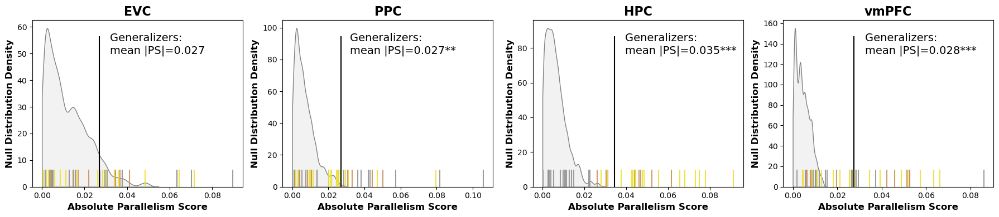

In [47]:
# Look at the absolute value of PS, we should get sth like a  half-normal distribution  for the null of abs(PS)

GnG_colors = ["black","grey"]
plotng = False

sname, slist = "combined", subid_list        
fig_cs,axes_cs = plt.subplots(1,4,figsize=(18,4))
for j,roi in enumerate(["V1_bilateral","PPC_bilateral","HPC_bilateral","vmPFC_bilateral"]):
    cs_null = np.abs(np.mean(sub_cs_perms[roi],axis=0))
    cs_G = [np.abs(cs) for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in generalizers and subid in slist]
    cs_NG = [np.abs(cs) for cs,subid in zip(sub_cs_obs[roi],subid_list) if subid in nongeneralizers and subid in slist]
    
    G_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in generalizers and subid in slist]).mean(axis=0)
    nG_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in nongeneralizers and subid in slist]).mean(axis=0)
    Gabs_null = np.abs(G_null)
    nGabs_null = np.abs(nG_null)
    cs_null = cs_null

    sns.kdeplot(data=pd.DataFrame(np.atleast_2d(cs_null).T,columns=["null"]),
                x="null",bw_adjust=1,common_norm=True,
                clip=(0,None),
                color="grey",fill=True,alpha=0.1,ax=axes_cs[j])
    axylim = axes_cs[j].get_ylim()
    axxlim = axes_cs[j].get_xlim()

    for x,subid,subrc in zip(sub_cs_obs[roi],subid_list,PS_classification["HPC_bilateral"]):
        if subid in generalizers and subid in slist:
            alpha_v = 0.9
            axes_cs[j].axvline(abs(x),ymin=0,ymax=.1,color=psgroupnum_huedict[subrc],label="G",alpha=alpha_v)

    G_csmu = np.mean(cs_G)
    axes_cs[j].axvline(x=G_csmu,ymin=0,ymax=.9,color=GnG_colors[0],label="Generalizers")
    Gp = (1 - np.mean([G_csmu>csn for csn in cs_null]))
    if Gp<0.01:
        axes_cs[j].text(G_csmu+0.005,0.8*axylim[1],f"Generalizers: \nmean |PS|={'%.3f' % G_csmu}{gen_pval_annot(Gp,show_pval=False)}",color=GnG_colors[0],size=14)
    else:
        axes_cs[j].text(G_csmu+0.005,0.8*axylim[1],f"Generalizers: \nmean |PS|={'%.3f' % G_csmu}",color=GnG_colors[0],size=14)
    if plotng:    
        NG_csmu = np.mean(cs_NG)
        axes_cs[j].axvline(x=NG_csmu,color=GnG_colors[1],label="Generalizers")
        NGp = (1 - np.mean([NG_csmu>csn for csn in nGabs_null]))
        if NGp<0.01:
            axes_cs[j].text(axxlim[0],0.6*axylim[1],f"nonGeneralizers: mean |PS|={'%.3f' % NG_csmu} ({gen_pval_annot(NGp)})",color=GnG_colors[1])
        else:
            axes_cs[j].text(axxlim[0],0.6*axylim[1],f"nonGeneralizers: mean |PS|={'%.3f' % NG_csmu}",color=GnG_colors[1])

    axes_cs[j].set_title(roi_shortnames[roi],**def_font_subplot_titles)
    axes_cs[j].set_xlabel("Absolute Parallelism Score",**def_font_axis_legend_titles)
    axes_cs[j].set_ylabel("Null Distribution Density",**def_font_axis_legend_titles)

        

    fig_cs.tight_layout()


## Distribution for localizer task

In [ ]:
#load precalculated PS and null distribution of PS 
ROIPS_dict = load(os.path.join(ROIRSAdir,"axisPS","PS_NCtrainingloc.pkl"))
lzersub_cs_perms, lzersub_cs_obs = ROIPS_dict["permutation"], ROIPS_dict["observation"]


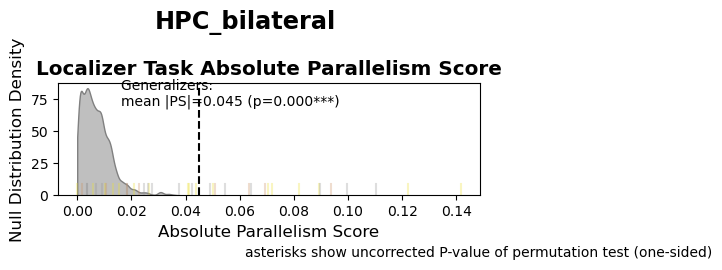

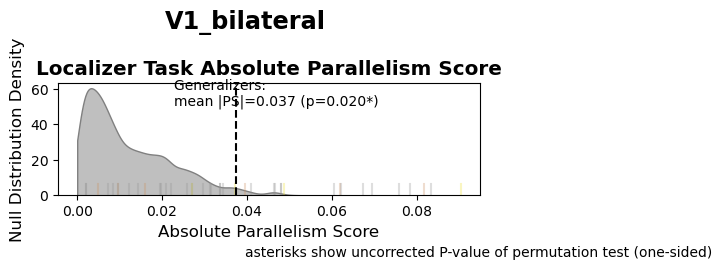

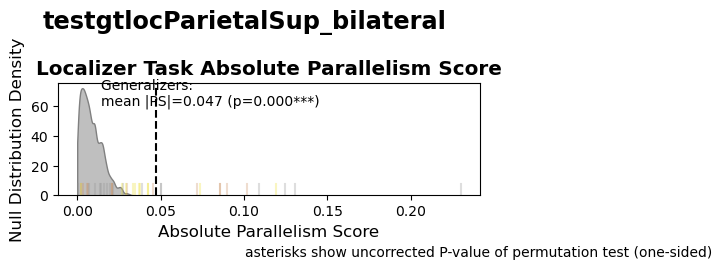

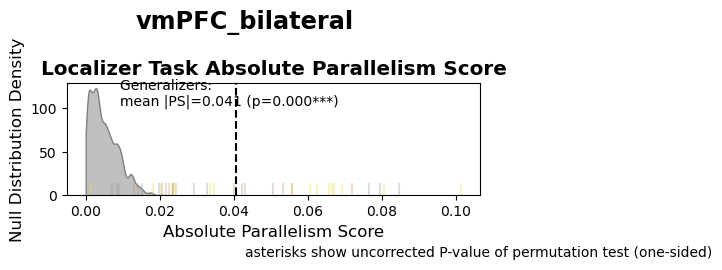

In [49]:
# Look at the absolute value of PS, we should get sth like a  half-normal distribution  for the null of abs(PS)

GnG_colors = ["black","grey"]
plotng = False

sname, slist = "combined", subid_list        
plot_rois = ['HPC_bilateral','V1_bilateral','testgtlocParietalSup_bilateral','vmPFC_bilateral']
for j,roi in enumerate(plot_rois):
    fig_cs,axes_cs = plt.subplots(1,1,figsize=(5,2.5))
    cs_null = np.abs(np.mean(lzersub_cs_perms[roi],axis=0))
    cs_G = [np.abs(cs) for cs,subid in zip(lzersub_cs_obs[roi],subid_list) if subid in generalizers and subid in slist]
    cs_NG = [np.abs(cs) for cs,subid in zip(lzersub_cs_obs[roi],subid_list) if subid in nongeneralizers and subid in slist]

    G_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in generalizers and subid in slist]).mean(axis=0)
    nG_null = np.array([cs for cs,subid in zip(sub_cs_perms[roi],subid_list) if subid in nongeneralizers and subid in slist]).mean(axis=0)
    Gabs_null = np.abs(G_null)
    nGabs_null = np.abs(nG_null)
    cs_null = Gabs_null
    
    sns.kdeplot(data=pd.DataFrame(np.atleast_2d(cs_null).T,columns=["null"]),
                x="null",bw_adjust=1,common_norm=True,
                clip=(0,None),
                color="grey",fill=True,alpha=0.5,ax=axes_cs)
    axylim = axes_cs.get_ylim()
    axxlim = axes_cs.get_xlim()

    for x,subid,subrc in zip(lzersub_cs_obs[roi],subid_list,PS_classification[roi]):
        if subid in generalizers and subid in slist:
            alpha_v = 0.3
            axes_cs.axvline(abs(x),ymin=0,ymax=.1,color=psgroupnum_huedict[subrc],label="G",alpha=alpha_v)

    G_csmu = np.mean(cs_G)
    axes_cs.axvline(x=G_csmu,color=GnG_colors[0],label="Generalizers",linestyle="--")
    Gp = (1 - np.mean([G_csmu>csn for csn in Gabs_null]))
    if Gp<0.05:
        axes_cs.text(axxlim[1]*0.4,0.8*axylim[1],f"Generalizers: \nmean |PS|={'%.3f' % G_csmu} ({gen_pval_annot(Gp)})",color=GnG_colors[0])
    else:
        axes_cs.text(axxlim[1]*0.4,0.8*axylim[1],f"Generalizers: \nmean |PS|={'%.3f' % G_csmu}",color=GnG_colors[0])
    if plotng:    
        NG_csmu = np.mean(cs_NG)
        axes_cs.axvline(x=NG_csmu,color=GnG_colors[1],label="nonGeneralizers",linestyle="--")
        NGp = (1 - np.mean([NG_csmu>csn for csn in nGabs_null]))
        if NGp<0.05:
            axes_cs.text(axxlim[1]*0.4,0.6*axylim[1],f"nonGeneralizers: mean |PS|={'%.3f' % NG_csmu} ({gen_pval_annot(NGp)})",color=GnG_colors[1])
        else:
            axes_cs.text(axxlim[1]*0.4,0.6*axylim[1],f"nonGeneralizers: mean |PS|={'%.3f' % NG_csmu}",color=GnG_colors[1])
        
    axes_cs.set_title("Localizer Task Absolute Parallelism Score",fontweight="bold",fontsize="x-large")
    axes_cs.set_xlabel("Absolute Parallelism Score",fontsize="large")
    axes_cs.set_ylabel("Null Distribution Density",fontsize="large")

        

    fig_cs.text(x=0.5, y=-.01, s='asterisks show uncorrected P-value of permutation test (one-sided)')
    fig_cs.suptitle(roi,fontweight="bold",fontsize="xx-large")
    fig_cs.tight_layout()


## MDS plots

In [671]:
PSAXrdm_mds_results = load(os.path.join(ROIRSAdir,'axisPS','MDS',"ParallAx_nonmetricmds_results.pkl")) # nonmetric_
mds_output_dir = os.path.join(ROIRSAdir,'axisPS','MDS')

### Animation

In [139]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.animation as animation
def update_view(num,angles,ax):
    angle = angles[num]
    # Normalize the angle to the range [-180, 180] for display
    angle_norm = (angle + 180) % 360 - 180

    # Cycle through a full rotation of elevation, then azimuth, roll, and all
    elev = azim = roll = 0
    if angle <= 360:
        elev = angle_norm
    elif angle <= 360*2:
        azim = angle_norm
    elif angle <= 360*3:
        roll = angle_norm
    else:
        elev = azim = roll = angle_norm
    ax.view_init(elev, azim, roll)
    ax.set_title('Elevation: %d°, Azimuth: %d°, Roll: %d°' % (elev, azim, roll))
    return ax

MovieWriter ffmpeg unavailable; using Pillow instead.


(noncenter) training stimuli MDS
 in top-left Generalizers


MovieWriter ffmpeg unavailable; using Pillow instead.


(noncenter) training stimuli MDS
 in top-right Generalizers


MovieWriter ffmpeg unavailable; using Pillow instead.


(noncenter) training stimuli MDS
 in orthogonal Generalizers


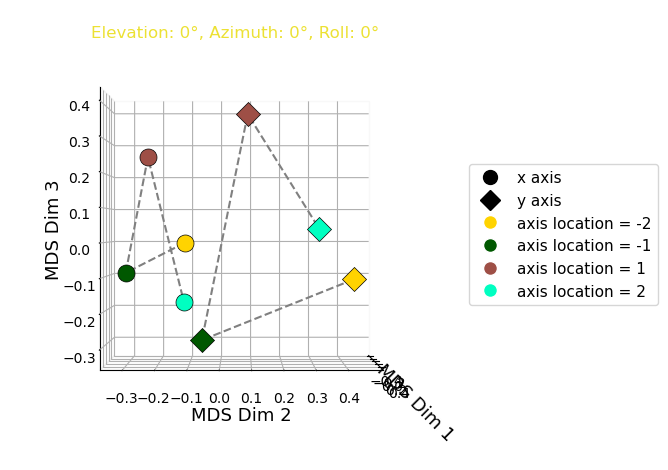

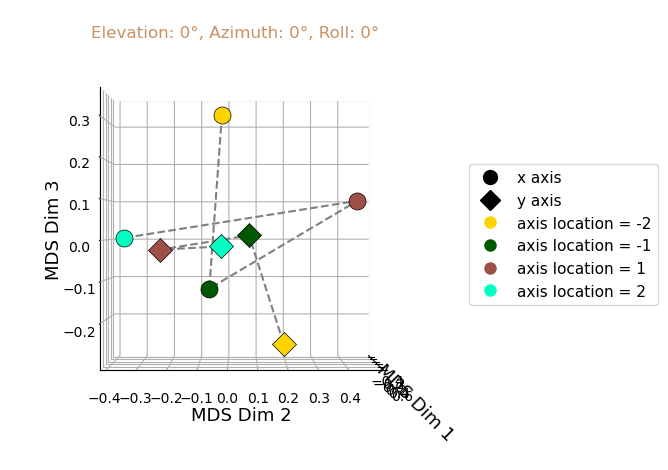

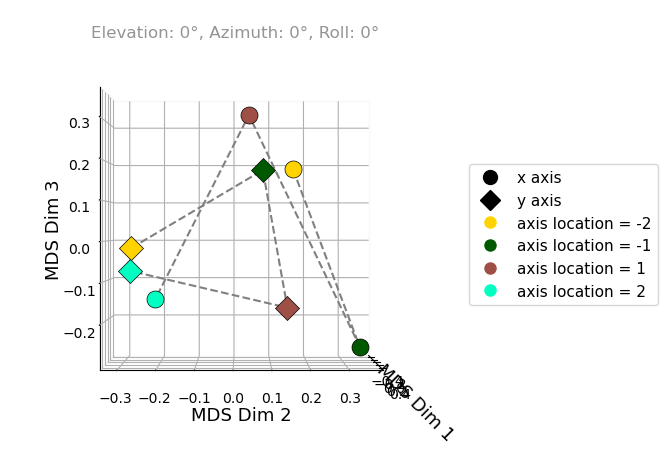

In [140]:
ssname = "training_nocenter"
roi = "HPC_bilateral" #"testgtlocParietalSup_bilateral"
ncompo = 3

for psgroupname in ['top-left', 'top-right','orthogonal']:
    plot_title=f"(noncenter) training stimuli MDS\n in {psgroupname} Generalizers"
    print(plot_title)
    
    roirdm, roimdsdf = deepcopy(PSAXrdm_mds_results["aveRDM"][ssname][roi][psgroupname]["G"]),deepcopy(PSAXrdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][psgroupname]["G"])

    roimdsdf["stim_name"] = ["%s%d"%(x,y) for x,y in roimdsdf[["training_axsetstr","training_axlocTL"]].to_numpy()]

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # Plot each group with different color and marker
    for (ta, tl), group in roimdsdf.groupby(['training_axsetstr', 'training_axlocTL']):
        ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
                color=stimycolorhex[tl], marker=axis_group_markers[ta],
                s=150,edgecolor='black',linewidth=0.5,
                label=f'{ta},{tl}')

    for ta,group in roimdsdf.groupby('training_axsetstr'):
        ax.plot(group['MDS1'], group['MDS2'], group['MDS3'],
                color="grey",linestyle="--")    

    # Create custom legends
    color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='axis location = %d'%(i))
                    for i in np.sort(roimdsdf["training_axlocTL"].unique())]
    marker_legend = [plt.Line2D([0], [0], marker=axis_group_markers[i], color='k', markerfacecolor='k',linewidth=0, markersize=10, label='%s axis'%(i)) 
                    for i in np.sort(roimdsdf["training_axsetstr"].unique())]

    # Set plot title and labels
    ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15,"color":psgroup_huedict[psgroupname]}) # - {cname} Generalizers
    ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
    ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
    ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

    ax.set_box_aspect([1, 1, 1]) 
    ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(1, 0.5),fontsize=11)

    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False

    # Adjust the axis limits to avoid cropping
    fig.tight_layout(pad=0.4)
    ax.view_init(elev=0, azim=0,roll=0)

    angles = np.arange(0, 360*4 + 1,10)
    # Creating the Animation object
    ani = animation.FuncAnimation(
        fig, func=update_view, frames=range(len(angles)), fargs=(angles,ax), interval=500)

    ani.save(os.path.join(mds_output_dir,f"{roi}_{ssname}_{psgroupname}_{ncompo}D.gif"),fps=2)


### static

In [672]:

def cal_PS(X:np.ndarray,stim_locs:np.ndarray, uniqueaxlocs:list)->float:
    """calculate PS for a single run

    Parameters
    ----------
    X : np.ndarray
        activity pattern matrix of the run, shape = (nstim, nvoxel)
    stim_locs : np.ndarray
        locations corresponding to the stimuli in the activity pattern matrix
    uniqueaxlocs : list
        unique axis locations    

    Returns
    -------
    float
        calculated parallelism score (average cosine similarity between axes)
    """
    xlocs, ylocs = stim_locs[:,0], stim_locs[:,1]
    assert all([np.sum(xlocs == j)==1 for j in uniqueaxlocs])
    assert all([np.sum(ylocs == j)==1 for j in uniqueaxlocs])

    # pick x/y stims and put them into same order
    xstims = np.array([X[xlocs== j,:][0] for j in uniqueaxlocs])
    ystims = np.array([X[ylocs == j,:][0] for j in uniqueaxlocs])
    return upper_tri(parallel_axes_cosine_sim(xstims,ystims))[0].mean()

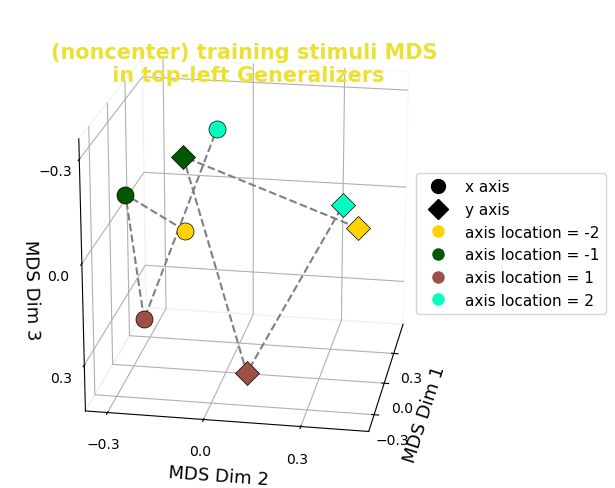

MDS - PS = 0.9062642234550026


In [674]:
ssname = "training_nocenter"
roi = "HPC_bilateral" #"testgtlocParietalSup_bilateral"
psgroupname = 'top-left'
ncompo = 3

plot_title=f"(noncenter) training stimuli MDS\n in {psgroupname} Generalizers"

roirdm, roimdsdf = deepcopy(PSAXrdm_mds_results["aveRDM"][ssname][roi][psgroupname]["G"]),deepcopy(PSAXrdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][psgroupname]["G"])



roimdsdf["stim_name"] = ["%s%d"%(x,y) for x,y in roimdsdf[["training_axsetstr","training_axlocTL"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (ta, tl), group in roimdsdf.groupby(['training_axsetstr', 'training_axlocTL']):
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[tl], marker=axis_group_markers[ta],
            s=150,edgecolor='black',linewidth=0.5,
            label=f'{ta},{tl}')

for ta,group in roimdsdf.groupby('training_axsetstr'):
    ax.plot(group['MDS1'], group['MDS2'], group['MDS3'],
            color="grey",linestyle="--")    

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='axis location = %d'%(i))
                for i in np.sort(roimdsdf["training_axlocTL"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=axis_group_markers[i], color='k', markerfacecolor='k',linewidth=0, markersize=10, label='%s axis'%(i)) 
                 for i in np.sort(roimdsdf["training_axsetstr"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=0.9,fontdict={"weight":"bold","size":15,"color":psgroup_huedict[psgroupname]}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

#ax.view_init(elev=0, azim=-100,roll=0)
ax.view_init(elev=-20, azim=170,roll=180)

ax.set_box_aspect([1, 1, 1]) 

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

def compute_ticks(data,decplace=1):
    min_val,max_val = np.round(np.min(data),decimals=decplace),np.round(np.max(data),decimals=decplace)
    ran = max_val - min_val
    D = np.ceil(ran/10**(-decplace)/2).astype(int)
    ticks = np.linspace(min_val,max_val,D,endpoint=True)
    return ticks
ticks = [-0.3,0,0.3]
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_zticks(ticks)
# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.85, 0.5),fontsize=11)

plt.show()
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{psgroupname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

print(f'MDS - PS = {cal_PS(roimdsdf[["MDS1","MDS2","MDS3"]].to_numpy(),roimdsdf[["stim_x","stim_y"]].to_numpy(),[-2,-1,1,2])}')

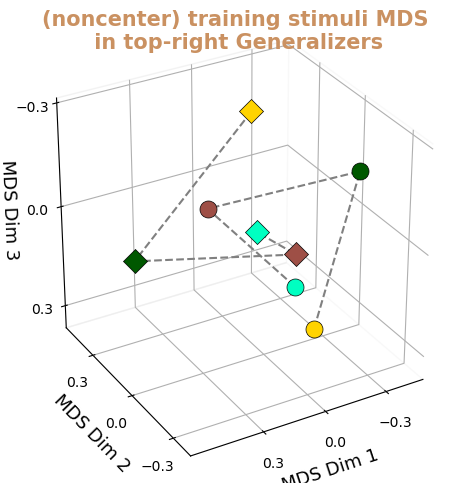

MDS - PS = -0.6531801141289265


In [675]:
ssname = "training_nocenter"
roi = "HPC_bilateral" #"testgtlocParietalSup_bilateral"
psgroupname = 'top-right'
ncompo = 3

plot_title=f"(noncenter) training stimuli MDS\n in {psgroupname} Generalizers"

roirdm, roimdsdf = deepcopy(PSAXrdm_mds_results["aveRDM"][ssname][roi][psgroupname]["G"]),deepcopy(PSAXrdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][psgroupname]["G"])



roimdsdf["stim_name"] = ["%s%d"%(x,y) for x,y in roimdsdf[["training_axsetstr","training_axlocTL"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (ta, tl), group in roimdsdf.groupby(['training_axsetstr', 'training_axlocTL']):
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[tl], marker=axis_group_markers[ta],
            s=150,edgecolor='black',linewidth=0.5,
            label=f'{ta},{tl}')

for ta,group in roimdsdf.groupby('training_axsetstr'):
    ax.plot(group['MDS1'], group['MDS2'], group['MDS3'],
            color="grey",linestyle="--")    

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='axis location = %d'%(i))
                for i in np.sort(roimdsdf["training_axlocTL"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=axis_group_markers[i], color='k', markerfacecolor='k',linewidth=0, markersize=10, label='%s axis'%(i)) 
                 for i in np.sort(roimdsdf["training_axsetstr"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15,"color":psgroup_huedict[psgroupname]}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

#ax.view_init(elev=20, azim=-100,roll=0)
ax.view_init(elev=-30, azim=-60,roll=180, vertical_axis='z')

ax.set_box_aspect([1, 1, 1]) 

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

def compute_ticks(data,decplace=1):
    min_val,max_val = np.round(np.min(data),decimals=decplace),np.round(np.max(data),decimals=decplace)
    ran = max_val - min_val
    D = np.ceil(ran/10**(-decplace)/2).astype(int)
    ticks = np.linspace(min_val,max_val,D,endpoint=True)
    return ticks
ticks = [-0.3,0,0.3]
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_zticks(ticks)
# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.85, 0.5),fontsize=11)
ax.legend().remove()
plt.show()
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{psgroupname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)
print(f'MDS - PS = {cal_PS(roimdsdf[["MDS1","MDS2","MDS3"]].to_numpy(),roimdsdf[["stim_x","stim_y"]].to_numpy(),[-2,-1,1,2])}')

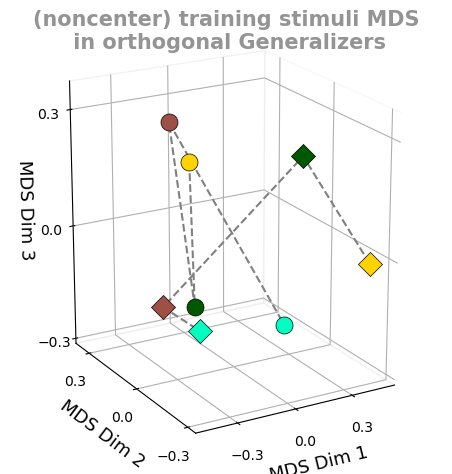

MDS - PS = 0.06262685595947476


In [676]:
ssname = "training_nocenter"
roi = "HPC_bilateral" #"testgtlocParietalSup_bilateral"
psgroupname = 'orthogonal'
ncompo = 3

plot_title=f"(noncenter) training stimuli MDS\n in {psgroupname} Generalizers"

roirdm, roimdsdf = deepcopy(PSAXrdm_mds_results["aveRDM"][ssname][roi][psgroupname]["G"]),deepcopy(PSAXrdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][psgroupname]["G"])



roimdsdf["stim_name"] = ["%s%d"%(x,y) for x,y in roimdsdf[["training_axsetstr","training_axlocTL"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (ta, tl), group in roimdsdf.groupby(['training_axsetstr', 'training_axlocTL']):
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[tl], marker=axis_group_markers[ta],
            s=150,edgecolor='black',linewidth=0.5,
            label=f'{ta},{tl}')

for ta,group in roimdsdf.groupby('training_axsetstr'):
    ax.plot(group['MDS1'], group['MDS2'], group['MDS3'],
            color="grey",linestyle="--")    

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='axis location = %d'%(i))
                for i in np.sort(roimdsdf["training_axlocTL"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=axis_group_markers[i], color='k', markerfacecolor='k',linewidth=0, markersize=10, label='%s axis'%(i)) 
                 for i in np.sort(roimdsdf["training_axsetstr"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15,"color":psgroup_huedict[psgroupname]}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

#ax.view_init(elev=0, azim=125,roll=0)
ax.view_init(elev=20, azim=-120,roll=0)

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

def compute_ticks(data,decplace=1):
    min_val,max_val = np.round(np.min(data),decimals=decplace),np.round(np.max(data),decimals=decplace)
    ran = max_val - min_val
    D = np.ceil(ran/10**(-decplace)/2).astype(int)
    ticks = np.linspace(min_val,max_val,D,endpoint=True)
    return ticks
ticks = [-0.3,0,0.3]
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_zticks(ticks)
# Adjust the axis limits to avoid cropping
fig.tight_layout()
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.85, 0.5),fontsize=11)
ax.legend().remove()
ax.set_box_aspect([0.8, 0.9, 1]) 

plt.show()
#mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
#checkdir(mds_output_dir)
#fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)
print(f'MDS - PS = {cal_PS(roimdsdf[["MDS1","MDS2","MDS3"]].to_numpy(),roimdsdf[["stim_x","stim_y"]].to_numpy(),[-2,-1,1,2])}')

### pieced together static

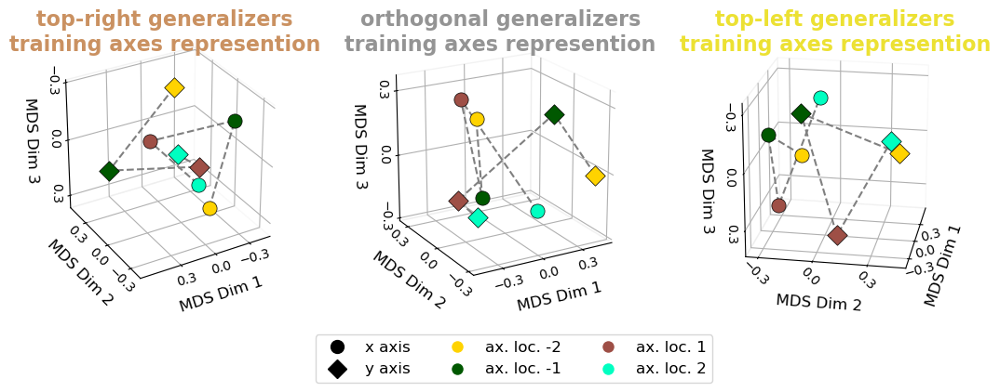

In [720]:
ssname = "training_nocenter"
roi = "HPC_bilateral" #"testgtlocParietalSup_bilateral"

ncompo = 3
fig = plt.figure(figsize=(15,6))
#view_inits = {"top-left":[0,-100,0],"top-right":[20,-100,0],"orthogonal":[0,125,0]}
view_inits = {"top-left":[-20,170,180],"top-right":[-30,-60,180],"orthogonal":[20,-120,0]}
#ax.view_init(elev=-20, azim=170,roll=180)
for jgroup,psgroupname in enumerate(['top-right','orthogonal','top-left']):

    plot_title=f"{psgroupname} generalizers\ntraining axes represention"

    roirdm, roimdsdf = deepcopy(PSAXrdm_mds_results["aveRDM"][ssname][roi][psgroupname]["G"]),deepcopy(PSAXrdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][psgroupname]["G"])
    roimdsdf["stim_name"] = ["%s%d"%(x,y) for x,y in roimdsdf[["training_axsetstr","training_axlocTL"]].to_numpy()]

    roimdsdf# = roimdsdf.iloc[[0,1]].copy()
    ax = fig.add_subplot(1,3,jgroup+1, projection='3d')


    # Plot each group with different color and marker
    for (ta, tl), group in roimdsdf.groupby(['training_axsetstr', 'training_axlocTL']):
        ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
                color=stimycolorhex[tl], marker=axis_group_markers[ta],
                s=120,edgecolor='black',linewidth=0.5,
                label=f'{ta},{tl}')

    for ta,group in roimdsdf.groupby('training_axsetstr'):
        ax.plot(group['MDS1'], group['MDS2'], group['MDS3'],
                color="grey",linestyle="--")    

    # Create custom legends
    color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='ax. loc. %d'%(i))
                    for i in np.sort(roimdsdf["training_axlocTL"].unique())]
    marker_legend = [plt.Line2D([0], [0], marker=axis_group_markers[i], color='k', markerfacecolor='k',linewidth=0, markersize=10, label='%s axis'%(i)) 
                    for i in np.sort(roimdsdf["training_axsetstr"].unique())]

    # Set plot title and labels
    ax.set_title(plot_title,y=0.95,fontdict={"weight":"bold","size":def_font_subplot_titles["fontsize"],"color":psgroup_huedict[psgroupname]}) # - {cname} Generalizers
    ax.set_xlabel('MDS Dim 1',fontdict={"size":def_font_axis_legend_titles["fontsize"]},labelpad=0.05)
    ax.set_ylabel('MDS Dim 2',fontdict={"size":def_font_axis_legend_titles["fontsize"]},labelpad=0.1)
    ax.set_zlabel('MDS Dim 3',fontdict={"size":def_font_axis_legend_titles["fontsize"]},labelpad=0.1)

    ax.view_init(*view_inits[psgroupname])
    ax.set_box_aspect([1, 1, 1]) 

    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False

    def compute_ticks(data,decplace=1):
        min_val,max_val = np.round(np.min(data),decimals=decplace),np.round(np.max(data),decimals=decplace)
        ran = max_val - min_val
        D = np.ceil(ran/10**(-decplace)/2).astype(int)
        ticks = np.linspace(min_val,max_val,D,endpoint=True)
        return ticks
    ticks = [-0.3,0,0.3]
    ax.set_xticks(ticks)
    ax.set_yticks(ticks)
    ax.set_zticks(ticks)
    plt.setp(ax.get_xticklabels(), rotation=15,ha="center",va="center",**def_font_axis_tick_labels)
    plt.setp(ax.get_zticklabels(), rotation=-90,ha="center",va="center",**def_font_axis_tick_labels)
    # Adjust the axis limits to avoid cropping
    
    #if jgroup<2:
    ax.legend().remove()
    plt.setp(ax.get_yticklabels(), rotation=-45,ha="center",va="center")
    if jgroup==0:
        ax.set_box_aspect([1,1,1], zoom=0.9) 
    elif jgroup==1:
        ax.set_box_aspect([1, 1, 1], zoom=0.95) 
    else:
        ax.set_box_aspect([1, 1,1 ], zoom=0.95)
       # ax.set_yticks([])
    ax.tick_params(pad=0)
fig.legend(handles=marker_legend + color_legend, loc='upper center', 
           bbox_to_anchor=(0.35, 0.23),fontsize=def_font_axis_legend_titles["fontsize"],
           ncol=3)
fig.subplots_adjust(hspace=0,left=0,right=0.68,bottom=0.05,top=1)
#fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)
plt.show()

## PTARSA 2v2 AVE

In [115]:
PTAregRSA_CVres = load(os.path.join(ROIRSAdir,'axisPS','RSAleavonerunoutAVE',"ROI_PTARSA_2v2.pkl"))
PTAregRSA_CVres.keys()


dict_keys(['RSA', 'PS'])

In [116]:
PS_classification = pd.read_csv(os.path.join(ROIRSAdir,"axisPS","PS_classification.csv"))
PS_classification.columns

Index(['Unnamed: 0', 'PPC_bilateral', 'HPC_bilateral', 'vmPFC_bilateral',
       'V1_bilateral', 'subid'],
      dtype='object')

In [117]:
np.random.permutation(list(itertools.combinations([-2,-1,1,2],2)))[0]

array([-2,  2])

In [118]:
ROIRSA_PTA_cvres = pd.concat(PTAregRSA_CVres["RSA"],axis=0).reset_index(drop=True)
ROIRSA_PTA_cvres.head(5)

,modelrdm,coefficient,analysis,adjR2,R2,heldoutrun,subid,subgroup,cohort,PSGROUProi,RSAroi
0,PTA_ax,-0.055900,train stim Compete PTAhigh Cartesian,-0.039781,0.037240,0-1,sub001,Generalizer,first cohort,PPC_bilateral,PPC_bilateral
1,PTA_locNomial,0.033843,train stim Compete PTAhigh Cartesian,-0.039781,0.037240,0-1,sub001,Generalizer,first cohort,PPC_bilateral,PPC_bilateral
2,gtlocEuclidean,-0.185293,train stim Compete PTAhigh Cartesian,-0.039781,0.037240,0-1,sub001,Generalizer,first cohort,PPC_bilateral,PPC_bilateral
3,gtlocEuclidean,-0.128330,train stim betweenxy Cartesian,0.016469,0.016469,0-1,sub001,Generalizer,first cohort,PPC_bilateral,PPC_bilateral
4,PTA_locEuc,0.028806,train stim betweenxy PTA low,0.000830,0.000830,0-1,sub001,Generalizer,first cohort,PPC_bilateral,PPC_bilateral


In [119]:
print(ROIRSA_PTA_cvres.analysis.unique())
print(ROIRSA_PTA_cvres.RSAroi.unique())
ROIRSA_PTA_cvres.columns

['train stim Compete PTAhigh Cartesian' 'train stim betweenxy Cartesian'
 'train stim betweenxy PTA low' 'train stim betweenxy PTA high'
 'train stim betweenxy Compete PTAhigh Cartesian'
 'train stim betweenxy Compete PTAlow Cartesian']
['PPC_bilateral' 'HPC_bilateral' 'vmPFC_bilateral' 'V1_bilateral']


Index(['modelrdm', 'coefficient', 'analysis', 'adjR2', 'R2', 'heldoutrun',
       'subid', 'subgroup', 'cohort', 'PSGROUProi', 'RSAroi'],
      dtype='object')

In [120]:
ROIRSA_PTA_cvres_meandf = ROIRSA_PTA_cvres.groupby([ 'PSGROUProi', 'analysis', 'subid', 'modelrdm'])[['adjR2', 'R2', 'coefficient']].mean().reset_index()
ROIRSA_PTA_cvres_meandf["subgroup"] = ["Generalizer" if subid in generalizers else "nonGeneralizer" for subid in ROIRSA_PTA_cvres_meandf["subid"]]
PSHPCcat = PS_classification[["subid","HPC_bilateral","vmPFC_bilateral"]].copy()
PSHPCcat["HPCpscat"] = PSHPCcat["HPC_bilateral"].map({-1:"top-right",0:"orthogonal",1:"top-left"})
PSHPCcat["HPCpscat_bin"] = PSHPCcat["HPC_bilateral"].map({-1:"parallel",0:"orthogonal",1:"parallel"})
PSHPCcat["vmPFCpscat"] = PSHPCcat["vmPFC_bilateral"].map({-1:"top-right",0:"orthogonal",1:"top-left"})
PSHPCcat["vmPFCpscat_bin"] = PSHPCcat["vmPFC_bilateral"].map({-1:"parallel",0:"orthogonal",1:"parallel"})
PSHPCcat["subid"] = PSHPCcat["subid"].astype(str)
ROIRSA_PTA_cvres_meandf["subid"] = ROIRSA_PTA_cvres_meandf["subid"].astype(str)
ROIRSA_PTA_cvres_meandf = ROIRSA_PTA_cvres_meandf.merge(PSHPCcat[["subid","HPCpscat","HPCpscat_bin","vmPFCpscat","vmPFCpscat_bin"]],on="subid",how="left")
ROIRSA_PTA_cvres_meandf

,PSGROUProi,analysis,subid,modelrdm,adjR2,R2,coefficient,subgroup,HPCpscat,HPCpscat_bin,vmPFCpscat,vmPFCpscat_bin
0,HPC_bilateral,train stim Compete PTAhigh Cartesian,sub001,PTA_ax,-0.003591,0.070749,0.159482,Generalizer,top-left,parallel,top-left,parallel
1,HPC_bilateral,train stim Compete PTAhigh Cartesian,sub001,PTA_locNomial,-0.003591,0.070749,0.140161,Generalizer,top-left,parallel,top-left,parallel
2,HPC_bilateral,train stim Compete PTAhigh Cartesian,sub001,gtlocEuclidean,-0.003591,0.070749,0.018732,Generalizer,top-left,parallel,top-left,parallel
3,HPC_bilateral,train stim Compete PTAhigh Cartesian,sub002,PTA_ax,0.018914,0.091587,0.078374,nonGeneralizer,top-right,parallel,top-right,parallel
4,HPC_bilateral,train stim Compete PTAhigh Cartesian,sub002,PTA_locNomial,0.018914,0.091587,-0.119194,nonGeneralizer,top-right,parallel,top-right,parallel
...,...,...,...,...,...,...,...,...,...,...,...,...
2235,vmPFC_bilateral,train stim betweenxy PTA low,sub125,PTA_locEuc,0.031711,0.031711,-0.044424,Generalizer,top-left,parallel,orthogonal,orthogonal
2236,vmPFC_bilateral,train stim betweenxy PTA low,sub127,PTA_locEuc,0.087969,0.087969,0.211093,Generalizer,top-left,parallel,top-right,parallel
2237,vmPFC_bilateral,train stim betweenxy PTA low,sub128,PTA_locEuc,0.068228,0.068228,-0.148863,Generalizer,top-left,parallel,orthogonal,orthogonal
2238,vmPFC_bilateral,train stim betweenxy PTA low,sub129,PTA_locEuc,0.059887,0.059887,-0.033450,Generalizer,orthogonal,orthogonal,top-left,parallel


In [121]:
ROIRSA_PTA_cvres_meandf["PSGROUProi"].unique()

array(['HPC_bilateral', 'PPC_bilateral', 'V1_bilateral',
       'vmPFC_bilateral'], dtype=object)

('axis\nseparation', 'Generalizer') 0.00019998000199980003 0.0
('orthogonal', 'Generalizer') 0.005599440055994401 0.0
('parallel', 'Generalizer') 0.7709229077092291 1.0
('axis\nseparation', 'Generalizer') 0.029597040295970403 0.0
('orthogonal', 'Generalizer') 0.3731626837316268 0.0
('parallel', 'Generalizer') 0.7425257474252575 1.0
('axis\nseparation', 'Generalizer') 0.11558844115588442 0.0
('orthogonal', 'Generalizer') 0.13538646135386462 0.0
('parallel', 'Generalizer') 0.003999600039996 1.0
('axis\nseparation', 'Generalizer') 0.6423357664233577 0.0
('orthogonal', 'Generalizer') 0.0365963403659634 0.0
('parallel', 'Generalizer') 0.5103489651034897 1.0


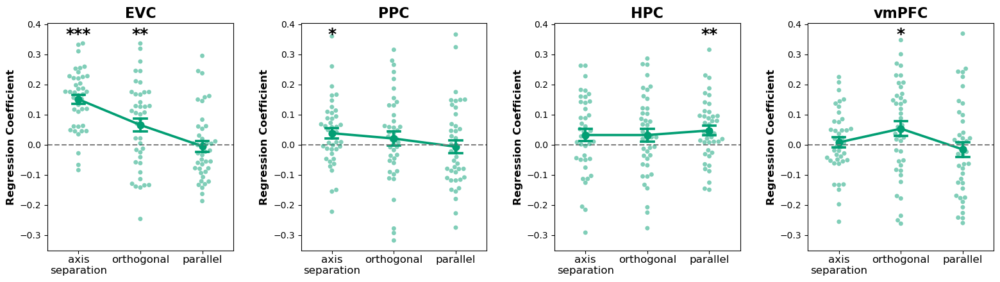

In [623]:
plt_pdf = ROIRSA_PTA_cvres_meandf[(ROIRSA_PTA_cvres_meandf.analysis=='train stim Compete PTAhigh Cartesian')].copy().reset_index(drop=True)
plt_pdf["modelrdm_shortname"] = pd.Categorical(
    plt_pdf["modelrdm"].map({"PTA_ax":"axis\nseparation","PTA_locNomial":"parallel","gtlocEuclidean":"orthogonal"}),
)   
plt_pdf.PSGROUProi = pd.Categorical(
    plt_pdf.PSGROUProi, 
    categories=["V1_bilateral","PPC_bilateral", "HPC_bilateral", "vmPFC_bilateral"],
    ordered=True
)
plt_pdf = plt_pdf[plt_pdf.subgroup=="Generalizer"].copy().reset_index(drop=True)   
gs = sns.catplot(
    plt_pdf,
    x="modelrdm_shortname",y="coefficient",
    col="PSGROUProi",
    hue="subgroup",palette=participantgrouphex,

    #kind="violin",split=True,inner="box",gap=0.1,fill=False,cut=True,
    #inner_kws = dict(box_width = 12, whis_width=3,marker=".",markeredgecolor="black",markerfacecolor="black",alpha=0.9),

    kind = "point", errorbar="se", capsize=.2,#fill=False,

    height=4.5,aspect=0.8
).set_titles("{col_name}").refline(y=0)
gs.map_dataframe(sns.swarmplot,x="modelrdm_shortname",y="coefficient",
                 hue="subgroup",palette=participantgrouphex,dodge=True,
                 linewidth=0,alpha=0.5,size=5)
gs.set_xlabels("Model RDM",fontsize=14,fontweight="bold")
gs.set_ylabels("Regression Coefficient",fontsize=14,fontweight="bold")
#sns.move_legend(gs, "upper right", bbox_to_anchor=(0.72, 0.35), fontsize=13,title="")
gs.legend.remove()

hs,ls = gs.axes.flatten()[0].get_legend_handles_labels()
for ax in gs.axes.flatten():
    axdf = plt_pdf[plt_pdf["PSGROUProi"]==ax.get_title()].copy()
    #axdf_mean = axdf.groupby(["modelrdm_shortname","subgroup"])["coefficient"].mean().reset_index()["coefficient"].values
    #axdf_se = axdf.groupby(["modelrdm_shortname","subgroup"])["coefficient"].aggregate(descriptive_stats_dict["se"]).reset_index()["coefficient"].values
    #ax.errorbar(
    #    x=[0,1,2], y=axdf_mean, yerr=axdf_se,
    #    fmt='none', ecolor='black', capsize=5, capthick=2
    #)
    #axdf.subgroup = pd.Categorical(
    #    axdf.subgroup, 
    #    categories=["Generalizer","nonGeneralizer"],
    #    ordered=True
    #)
    plt.setp(ax.get_xticklabels(), rotation=0,fontsize=def_font_axis_legend_titles["fontsize"],ha="center",va="top")
    ax.tick_params(axis='x',pad=1)
    ax.set_xlabel("")
    ax.set_ylabel("Regression Coefficient",**def_font_axis_legend_titles)
    for j, (gname,gdf) in enumerate(axdf.groupby(["modelrdm_shortname","subgroup"])):
        pval = ttest1samp_equiv_permutation(gdf["coefficient"])
        print(gname,pval,np.floor(j/2))
        #if gname[1] == "Generalizer":
        #    ax.text(np.floor(j/2)-0.25,y=0.42,s=f"{gen_pval_annot(pval,show_pval=False)}",fontsize=18,fontweight="bold",color="black")
        #else:
        #    ax.text(np.floor(j/2)+0.25,y=0.42,s=f"{gen_pval_annot(pval,show_pval=False)}",fontsize=18,fontweight="bold",color="black")
        ax.text(j,y=0.35,s=f"{gen_pval_annot(pval,show_pval=False)}",
                fontsize=18,fontweight="bold",color="black",
                ha="center")
    ax.set_title(roi_shortnames[axdf["PSGROUProi"].unique()[0]],**def_font_subplot_titles)
    ax.tick_params(labelleft=True, labelbottom=True)
    ax.xaxis.label.set_visible(True)
    ax.yaxis.label.set_visible(True)
    ax.spines["top"].set_visible(True)
    ax.spines["right"].set_visible(True)
    ax.legend().remove()

#gs.figure.set_size_inches(18.8,4)
gs.figure.tight_layout(w_pad=3)    
#gs.figure.legend(hs,ls,loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
#        prop = dict(weight="bold"))
#gs.fig.suptitle("ROI Cross-validated RSA",x=0.4,fontsize=14,fontweight="bold")

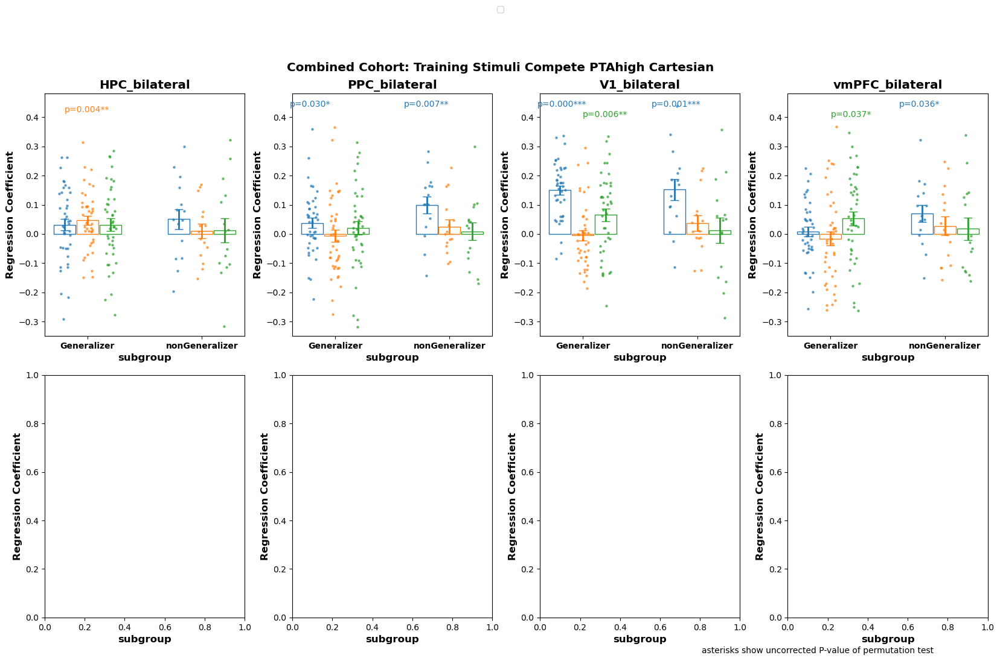

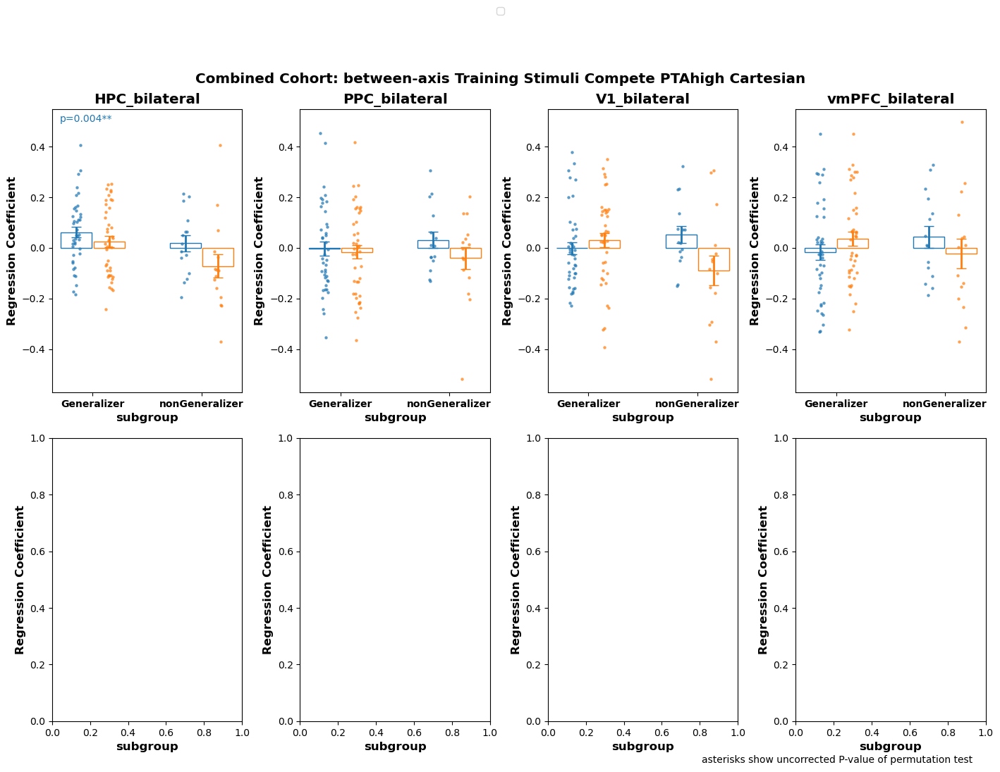

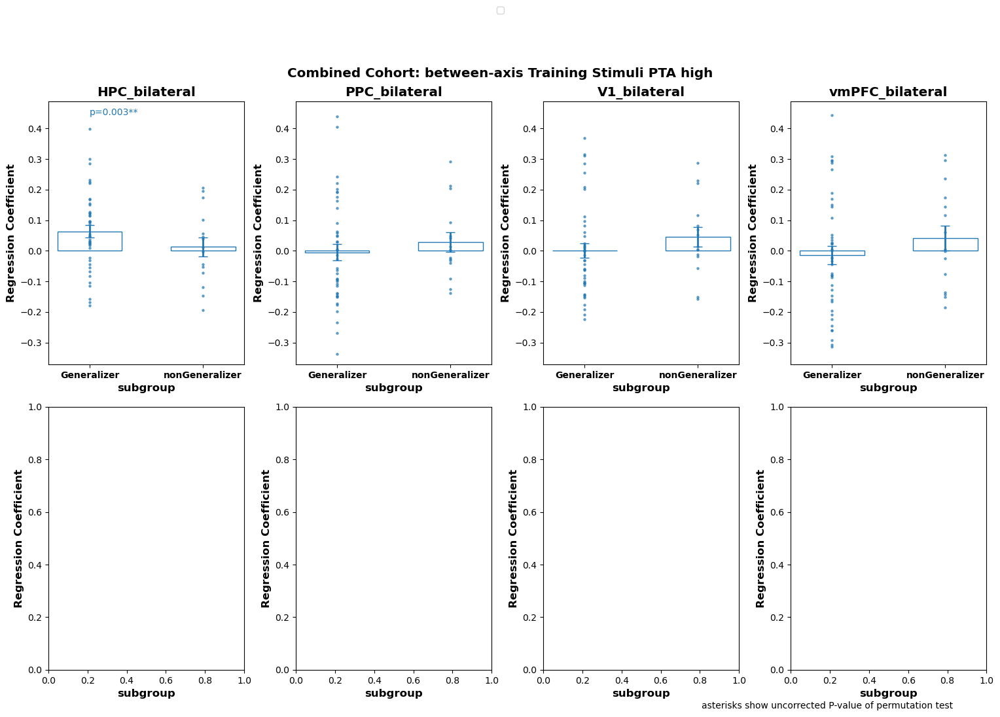

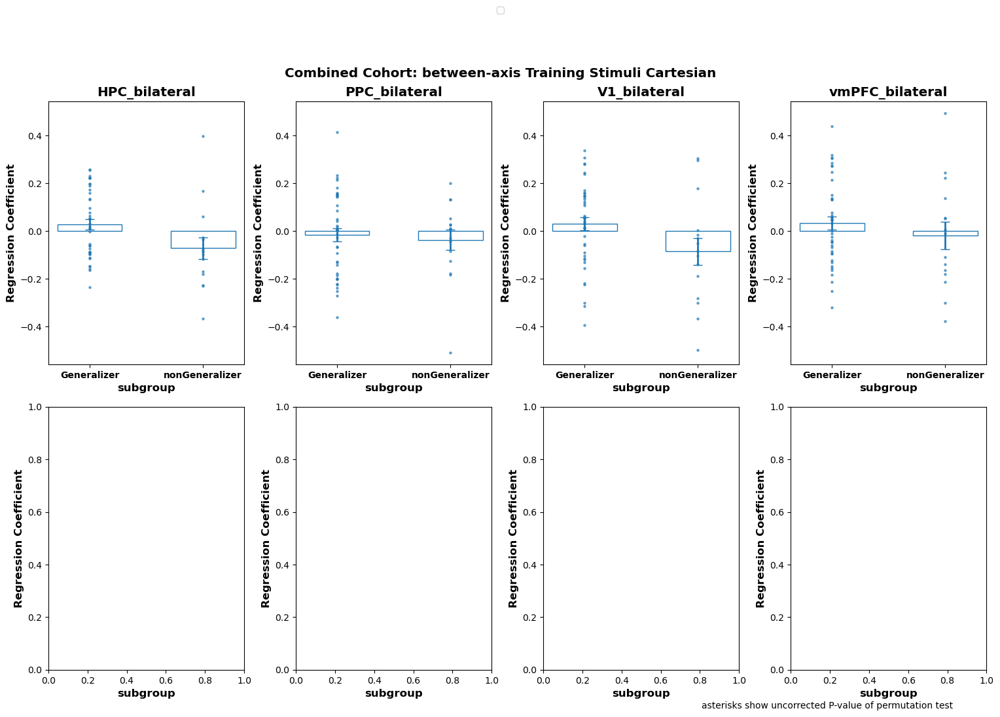

In [955]:
# test if coefficients are significantly above zero subgroup HPCrepcat
xvar, gvar, yvar, yvartest = "subgroup", "modelrdm",   "coefficient", "coefficient"



plt_ana = dict(zip(['train stim Compete PTAhigh Cartesian',
                    'train stim betweenxy Compete PTAhigh Cartesian',
                    'train stim betweenxy PTA high',
                    'train stim betweenxy Cartesian'],
                   
                   ["Training Stimuli Compete PTAhigh Cartesian",
                    'between-axis Training Stimuli Compete PTAhigh Cartesian',
                    "between-axis Training Stimuli PTA high",
                    "between-axis Training Stimuli Cartesian"                       
                   ]))
aprs    = dict(zip(['train stim Compete PTAhigh Cartesian',
                    'train stim betweenxy Compete PTAhigh Cartesian',
                    'train stim betweenxy PTA high',
                    'train stim betweenxy Cartesian'],
                   [1.2,1.4,1.3,1.3]))

plot_subset_df = ROIRSA_PTA_cvres_meandf.copy().reset_index(drop=True)
for cname,clist in zip(["Combined Cohort"],[subid_list]):
    for a, atitle in plt_ana.items():
        curr_pdf = plot_subset_df[(plot_subset_df.analysis==a)].copy().reset_index(drop=True)
        #curr_pdf = curr_pdf[curr_pdf.subid.isin(generalizers)].copy().reset_index(drop=True)
        curr_pdf[xvar] = pd.Categorical(curr_pdf[xvar])
        fig,axes = grouped_barscatter_withstats(curr_pdf,
                                    facet_vars = "PSGROUProi", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                    prows=2,pcols=4,hrow=5,wcol=5/aprs[a],
                                    #prows=1,pcols=2,hrow=5,wcol=5/aprs[a],
                                    statfunc= ttest1samp_equiv_permutation)
        for ifacet, _ in enumerate(axes.flatten()):
            axes.flatten()[ifacet].set_ylabel("Regression Coefficient",fontweight="bold",fontsize="large")
            axes.flatten()[ifacet].set_xlabel(xvar,fontweight="bold",fontsize="large")        
            
        hs,ls = axes.flatten()[ifacet].get_legend_handles_labels()
        fig.legend(hs,ls,loc="upper center",bbox_to_anchor=(0.5,1.08),ncol = 4,
                prop = dict(weight="bold"))
        fig.suptitle(f"{cname}: {atitle}",fontweight="bold",fontsize="x-large")
        fig.text(x=0.7, y=0, s=f'asterisks show uncorrected P-value of permutation test')
        fig.tight_layout()


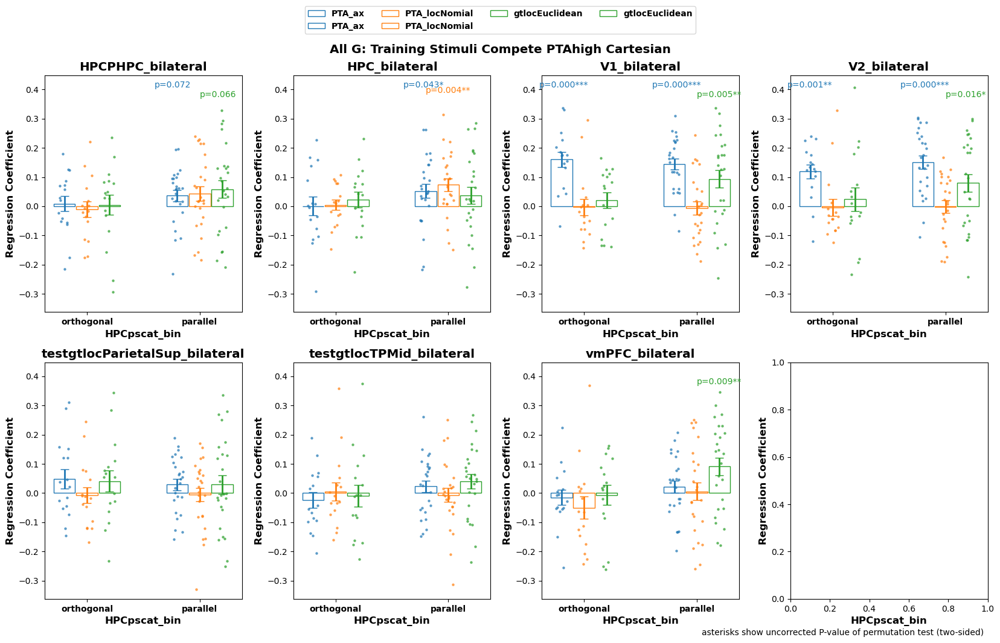

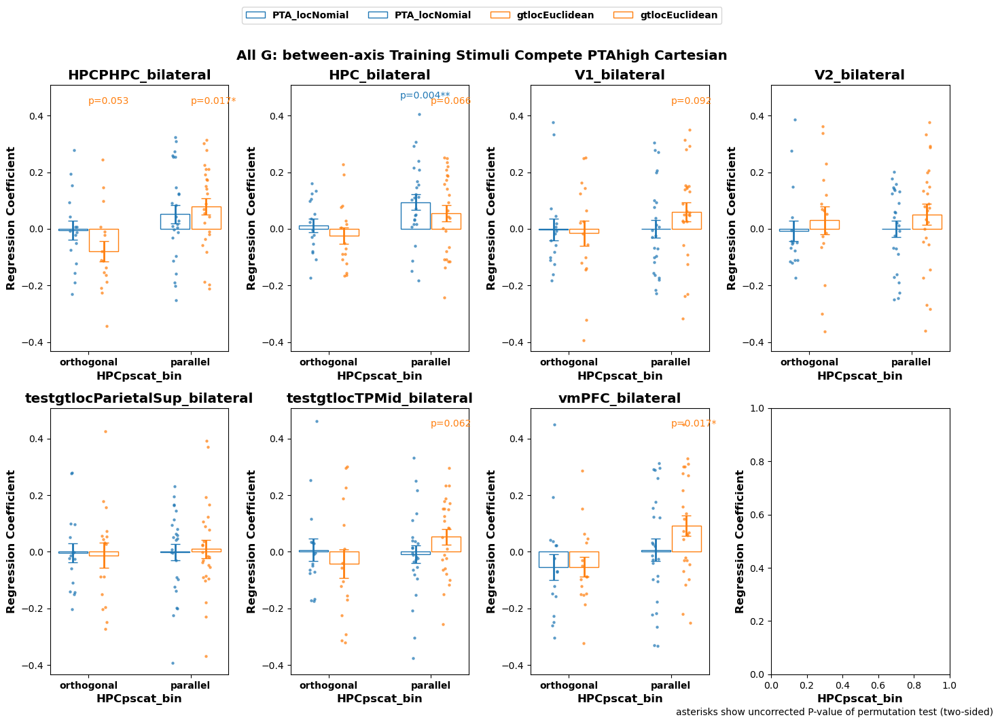

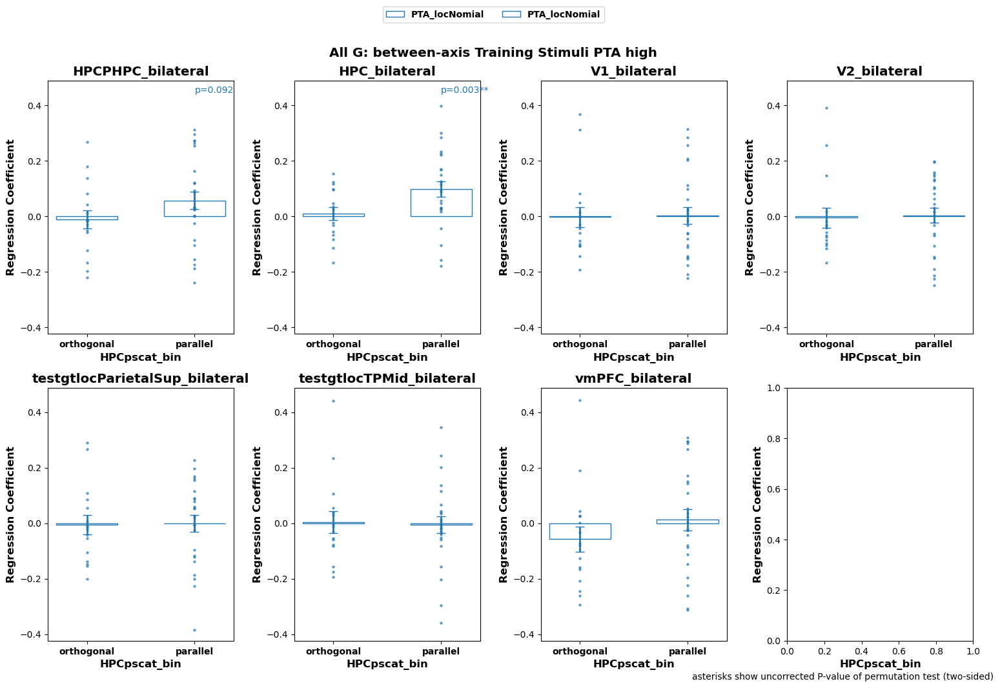

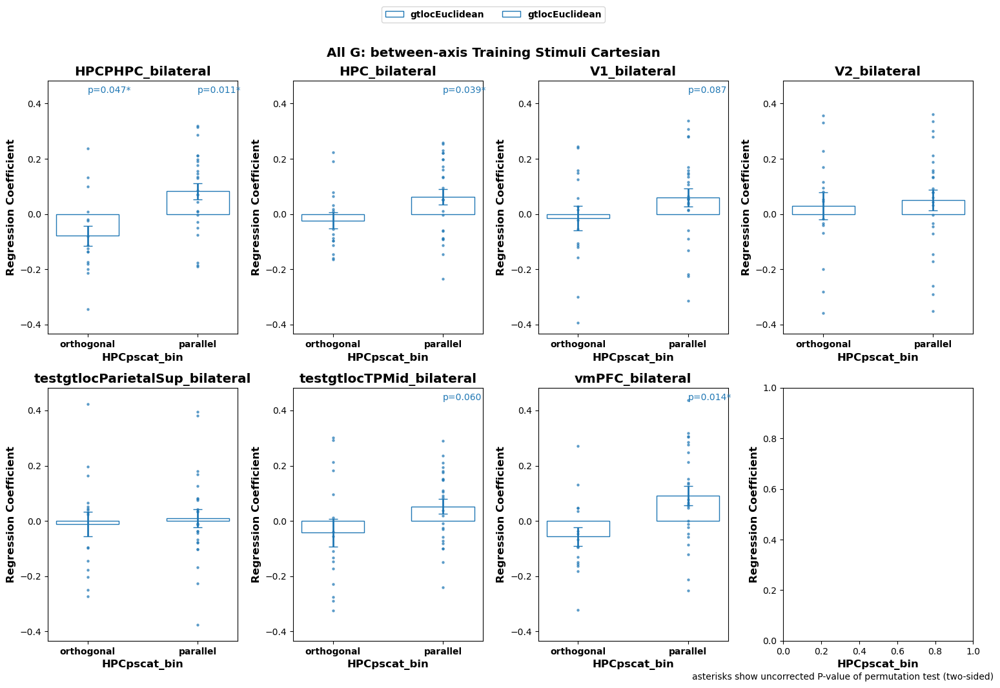

In [115]:
# test if coefficients are significantly above zero subgroup HPCrepcat
xvar, gvar, yvar, yvartest = "HPCpscat_bin", "modelrdm",   "coefficient", "coefficient"



plt_ana = dict(zip(['train stim Compete PTAhigh Cartesian',
                    'train stim betweenxy Compete PTAhigh Cartesian',
                    'train stim betweenxy PTA high',
                    'train stim betweenxy Cartesian'],
                   
                   ["Training Stimuli Compete PTAhigh Cartesian",
                    'between-axis Training Stimuli Compete PTAhigh Cartesian',
                    "between-axis Training Stimuli PTA high",
                    "between-axis Training Stimuli Cartesian"                       
                   ]))
aprs    = dict(zip(['train stim Compete PTAhigh Cartesian',
                    'train stim betweenxy Compete PTAhigh Cartesian',
                    'train stim betweenxy PTA high',
                    'train stim betweenxy Cartesian'],
                   [1.2,1.4,1.3,1.3]))

plot_subset_df = ROIRSA_PTA_cvres_meandf.copy().reset_index(drop=True)
for cname,clist in zip(["All G"],[generalizers]):
    for a, atitle in plt_ana.items():
        curr_pdf = plot_subset_df[(plot_subset_df.analysis==a)].copy().reset_index(drop=True)
        curr_pdf = curr_pdf[curr_pdf.subid.isin(generalizers)].copy().reset_index(drop=True)
        curr_pdf[xvar] = pd.Categorical(curr_pdf[xvar])
        #curr_pdf[gvar] = pd.Categorical(curr_pdf[gvar])
        fig,axes = grouped_barscatter_withstats(curr_pdf,
                                    facet_vars = "PSGROUProi", xvar=xvar, gvar=gvar, yvar=yvar, yvartest=yvartest,#
                                    prows=2,pcols=4,hrow=5,wcol=5/aprs[a],
                                    #prows=1,pcols=2,hrow=5,wcol=5/aprs[a],
                                    statfunc= ttest1samp_equiv_permutation)
        for ifacet, _ in enumerate(axes.flatten()):
            axes.flatten()[ifacet].set_ylabel("Regression Coefficient",fontweight="bold",fontsize="large")
            axes.flatten()[ifacet].set_xlabel(xvar,fontweight="bold",fontsize="large")
        
            
        hs,ls = axes.flatten()[0].get_legend_handles_labels()
        fig.legend(hs,ls,loc="upper center",bbox_to_anchor=(0.5,1.05),ncol = 4,
                prop = dict(weight="bold"))
        fig.suptitle(f"{cname}: {atitle}",fontweight="bold",fontsize="x-large")
        fig.text(x=0.7, y=0, s=f'asterisks show uncorrected P-value of permutation test (two-sided)')
        fig.tight_layout()


## Correlation between PS of lzer and navi

In [ ]:
ssname = "training_nocenter"
roi = "HPC_bilateral" #"testgtlocParietalSup_bilateral"
psgroupname = 'orthogonal'
ncompo = 3

plot_title=f"(noncenter) training stimuli MDS\n in {psgroupname} Generalizers"

roirdm, roimdsdf = deepcopy(PSAXrdm_mds_results["aveRDM"][ssname][roi][psgroupname]["G"]),deepcopy(PSAXrdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][psgroupname]["G"])



roimdsdf["stim_name"] = ["%s%d"%(x,y) for x,y in roimdsdf[["training_axsetstr","training_axlocTL"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (ta, tl), group in roimdsdf.groupby(['training_axsetstr', 'training_axlocTL']):
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[tl], marker=axis_group_markers[ta],
            s=150,edgecolor='black',linewidth=0.5,
            label=f'{ta},{tl}')

for ta,group in roimdsdf.groupby('training_axsetstr'):
    ax.plot(group['MDS1'], group['MDS2'], group['MDS3'],
            color="grey",linestyle="--")    

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='axis location = %d'%(i))
                for i in np.sort(roimdsdf["training_axlocTL"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=axis_group_markers[i], color='k', markerfacecolor='k',linewidth=0, markersize=10, label='%s axis'%(i)) 
                 for i in np.sort(roimdsdf["training_axsetstr"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1,fontdict={"weight":"bold","size":15,"color":psgroup_huedict[psgroupname]}) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

ax.view_init(elev=0, azim=125,roll=0)

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

def compute_ticks(data,decplace=1):
    min_val,max_val = np.round(np.min(data),decimals=decplace),np.round(np.max(data),decimals=decplace)
    ran = max_val - min_val
    D = np.ceil(ran/10**(-decplace)/2).astype(int)
    ticks = np.linspace(min_val,max_val,D,endpoint=True)
    return ticks
ticks = [-0.3,0,0.3]
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_zticks(ticks)
# Adjust the axis limits to avoid cropping
fig.tight_layout()
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.85, 0.5),fontsize=11)
ax.legend().remove()
ax.set_box_aspect([0.8, 0.9, 1]) 

plt.show()
#mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
#checkdir(mds_output_dir)
#fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)
print(f'MDS - PS = {cal_PS(roimdsdf[["MDS1","MDS2","MDS3"]].to_numpy(),roimdsdf[["stim_x","stim_y"]].to_numpy(),[-2,-1,1,2])}')

In [ ]:
taskPSdf = pd.concat(
    [pd.DataFrame(
        {"subid":subid_list,
        "navi_PS": sub_cs_obs[roi],
        "lzer_PS": lzersub_cs_obs[roi],
        "HPC_PScat": PS_classification["HPC_bilateral"]}
    ).assign(roi=roi) for roi in ["HPC_bilateral","V1_bilateral","testgtlocParietalSup_bilateral","vmPFC_bilateral"]
    ]
).reset_index(drop=True)
taskPSdf["subgroup"] = ["Generalizers" if subid in generalizers else "nonGeneralizers" for subid in taskPSdf["subid"]]

In [ ]:
taskPSdf

In [ ]:
list(itertools.combinations([-2,-1,1,2],2))


In [ ]:
gs = sns.relplot(data=taskPSdf,x="navi_PS",y="lzer_PS",hue="HPC_PScat",row="subgroup",col="roi",kind="scatter",facet_kws={"sharex":False,"sharey":False})
gs.map_dataframe(sns.regplot,x="navi_PS",y="lzer_PS",scatter=False)

# MDS plots of all generalizers

In [626]:
rdm_mds_results = load(os.path.join(ROIRSAdir,"mds_results_rescaled.pkl"))

## MODEL RDMs

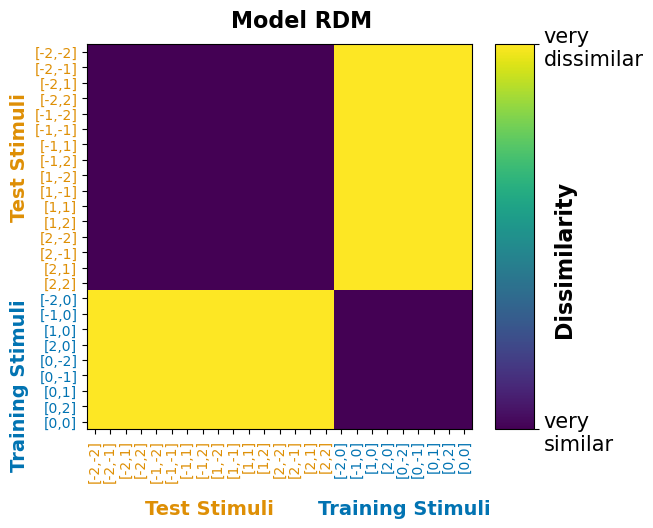

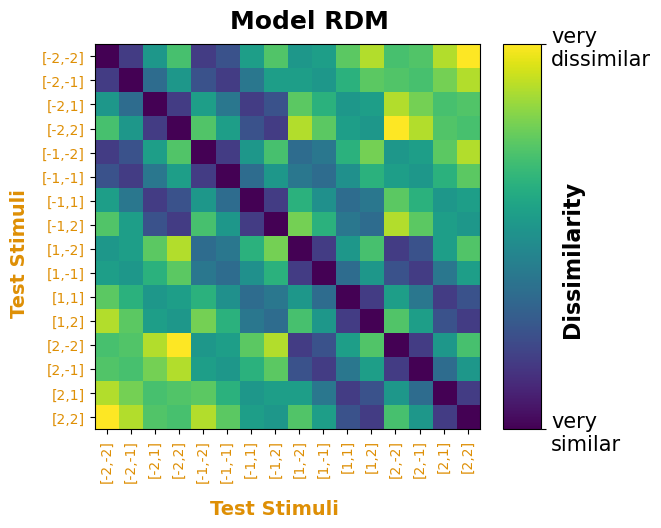

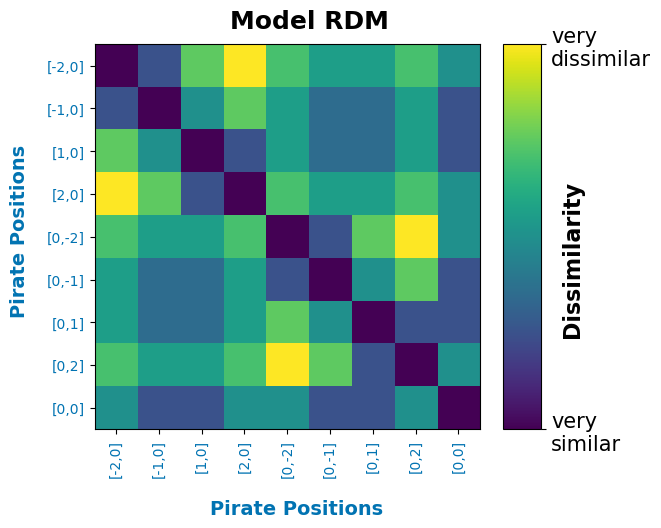

In [627]:
stimdf = roi_data["V1_bilateral"][0]["stimdf"].copy()
stimdf_one_sess = stimdf[stimdf.stim_session==0].copy()
stimdf_one_sess["sg_name"] = stimdf_one_sess.stim_group.map({0:"test",1:"training"})
stimdf_one_sess.sort_values(["sg_name","training_axset","training_axlocTL","stim_x","stim_y"],inplace=True)
stimdf_one_sess["stim_name"] = ["[%d,%d]"%(x*2,y*2) for x,y in stimdf_one_sess[["stim_x","stim_y"]].to_numpy()]

sfilts = generate_filters(stimdf_one_sess)
plot_rdmds = {
    "train-test separation": compute_rdm_identity(stimdf_one_sess[sfilts["allstim"]].copy().stim_group.values),
    "test2d":compute_rdm(stimdf_one_sess[sfilts["test"]].copy()[["stim_x","stim_y"]],"euclidean"),
    "lzer2d":compute_rdm(stimdf_one_sess[sfilts["training_all"]].copy()[["stim_x","stim_y"]],"euclidean")
}
axticks = {
    "train-test separation": stimdf_one_sess[sfilts["allstim"]].copy()["stim_name"].values,
    "test2d":stimdf_one_sess[sfilts["test"]].copy()["stim_name"].values,
    "lzer2d":stimdf_one_sess[sfilts["training_all"]].copy()["stim_name"].values
}
   
for j, (k,v) in enumerate(plot_rdmds.items()):
    fig,ax=plt.subplots(1,1,figsize=(6,5))
    im = ax.imshow(v)
    ax.set_xticks(np.arange(v.shape[0]),axticks[k],rotation=90)
    ax.set_yticks(np.arange(v.shape[1]),axticks[k],rotation=0)
    for txt in ax.get_xticklabels():
        if '0' in txt.get_text():
            txt.set_color(train_test_color_pal["Training Stimuli"])
        else:
            txt.set_color(train_test_color_pal["Test Stimuli"])
    for txt in ax.get_yticklabels():
        if '0' in txt.get_text():
            txt.set_color(train_test_color_pal["Training Stimuli"])
        else:
            txt.set_color(train_test_color_pal["Test Stimuli"])
    if k=="train-test separation":
        ax.annotate(text="Training Stimuli",xy=(-0.2,-0.1),xycoords=ax.transAxes,
                    color=train_test_color_pal["Training Stimuli"],
                    fontweight="bold",fontsize=14,
                    rotation=90)
        ax.annotate(text="Test Stimuli",xy=(-0.2,0.55),xycoords=ax.transAxes,
                    color=train_test_color_pal["Test Stimuli"],
                    fontweight="bold",fontsize=14,
                    rotation=90)
        ax.annotate(text="Training Stimuli",xy=(0.6,-0.22),xycoords=ax.transAxes,
                    color=train_test_color_pal["Training Stimuli"],
                    fontweight="bold",fontsize=14,
                    rotation=0)
        ax.annotate(text="Test Stimuli",xy=(0.15,-0.22),xycoords=ax.transAxes,
                    color=train_test_color_pal["Test Stimuli"],
                    fontweight="bold",fontsize=14,
                    rotation=0)
        fig.suptitle("Model RDM",fontweight="bold",fontsize=16,y=0.95)
    else:
        txt = "Test Stimuli" if k=="test2d" else "Pirate Positions"
        txtcol = "Test Stimuli" if k=="test2d" else "Training Stimuli"
        ax.annotate(text=txt,xy=(-0.22,0.3),xycoords=ax.transAxes,
                    color=train_test_color_pal[txtcol],
                    fontweight="bold",fontsize=14,
                    rotation=90)
        ax.annotate(text=txt,xy=(0.3,-0.22),xycoords=ax.transAxes,
                    color=train_test_color_pal[txtcol],
                    fontweight="bold",fontsize=14,
                    rotation=0)
        fig.suptitle("Model RDM",fontweight="bold",fontsize=18,y=0.95)
    
    cb = plt.colorbar(im,orientation="vertical",cax=None,ax=ax,fraction=0.1,pad=0.05,aspect=10)
    cb.ax.set_title("Dissimilarity",fontweight="bold",fontsize=16,y=0.23,x=1.8,rotation=90)
    cb.ax.set_yticks([v.min(),v.max()],["very\nsimilar","very\ndissimilar"],fontsize=15)


## interactive plots

SignificanceResult(statistic=0.2267126979220982, pvalue=0.24599201298199452)
SignificanceResult(statistic=0.6968731476445666, pvalue=3.788743734007509e-05)


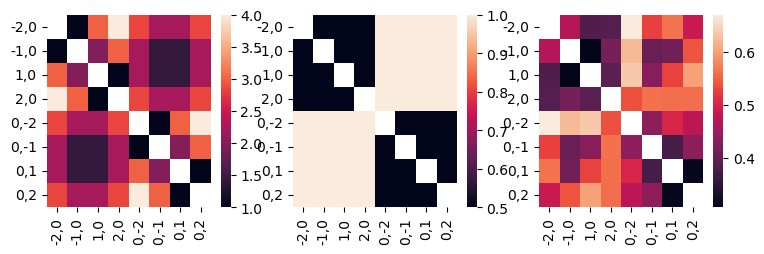

In [1087]:
import sklearn.manifold


ssname = "trainloc_nocenter"
roi = "PPC_bilateral" #"testgtlocParietalSup_bilateral"
cname = "Combined Cohort"
ncompo = 3

roirdm, roimdsdf = deepcopy(rdm_mds_results["aveRDM"][ssname][roi][cname]["G"]),deepcopy(rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"])

eucrdm = compute_rdm(roimdsdf[["stim_x","stim_y"]].to_numpy(),"euclidean")
ftrdm  = compute_rdm_nomial(roimdsdf[["stim_x","stim_y"]].to_numpy())
#roimdsdf[["MDS1","MDS2","MDS3"]] = sklearn.manifold.MDS(n_components=3,dissimilarity="precomputed",eps=1e-10,metric=True
#                                                        ).fit_transform(minmax_scale(roirdm,0,2))
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]
roimdsdf["stim_x_str"] = roimdsdf["stim_x"].astype(str)
roimdsdf["stim_group_str"] = roimdsdf["stim_group"].map({0:"test",1:"training"})

np.fill_diagonal(roirdm,np.nan)
np.fill_diagonal(eucrdm,np.nan)
np.fill_diagonal(ftrdm,np.nan)
print(scipy.stats.spearmanr(lower_tri(roirdm)[0],
                            lower_tri(eucrdm)[0])
                            )
print(scipy.stats.spearmanr(lower_tri(roirdm)[0],
                            lower_tri(ftrdm)[0])
                            )
fig_rdm, axes_rdm = plt.subplots(1,3,figsize=(9,2.5))
plot_rdm_withlabel(eucrdm,
                   lower_tri_only=False,
                   xticks=np.arange(roirdm.shape[0])+0.5,
                   yticks=np.arange(roirdm.shape[0])+0.5,
                   stimlabels_x=roimdsdf.stim_name.values,
                   stimlabels_y=roimdsdf.stim_name.values,
                   ax=axes_rdm[0])
plot_rdm_withlabel(ftrdm,
                   lower_tri_only=False,
                   xticks=np.arange(roirdm.shape[0])+0.5,
                   yticks=np.arange(roirdm.shape[0])+0.5,
                   stimlabels_x=roimdsdf.stim_name.values,
                   stimlabels_y=roimdsdf.stim_name.values,
                   ax=axes_rdm[1])
plot_rdm_withlabel(roirdm,
                   lower_tri_only=False,
                   xticks=np.arange(roirdm.shape[0])+0.5,
                   yticks=np.arange(roirdm.shape[0])+0.5,
                   stimlabels_x=roimdsdf.stim_name.values,
                   stimlabels_y=roimdsdf.stim_name.values,
                   ax=axes_rdm[2])

pxfig = px.scatter_3d(roimdsdf,x="MDS1",y="MDS2",z="MDS3",
                color="stim_x_str",symbol="stim_y",
                color_discrete_map=dict(zip(["-2.0","-1.0","0.0","1.0","2.0"],[stimycolorhex[x] for x in [-2,-1,0,1,2]])),
                symbol_map=dict(zip([-2,-1,0,1,2],["square-open","square","cross","circle","circle-open"]))
                ) # ['circle', 'circle-open', 'cross', 'diamond', 'diamond-open', 'square', 'square-open', 'x']

pxfig.update_layout(#
    title_text=f"{roi} {ssname}",
    title_subtitle_text='%s Generalizers' % (cname),
    title_x=0.3,title_y=0.9,
    title_font_weight="bold",title_font_size=20,
    title_subtitle_font_size=20)


## V1 stimuli map

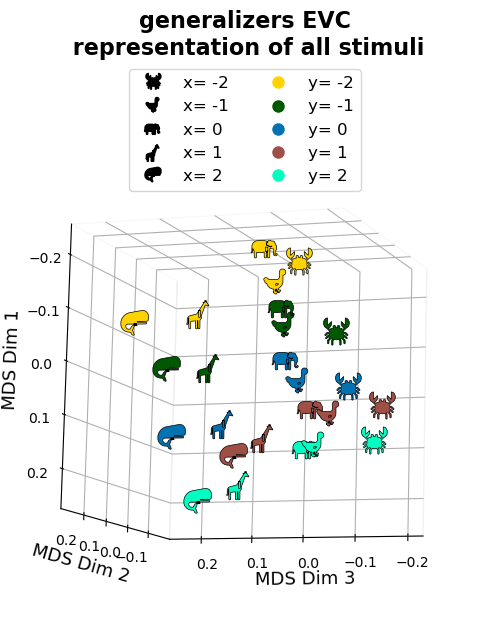

In [825]:
ssname = "allstim"
roi = "V1_bilateral"
cname = "Combined Cohort"
ncompo = 3

plot_title=f"generalizers EVC\n representation of all stimuli"

roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure(figsize=(5,7))
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (stim_x, stim_y), group in roimdsdf.groupby(['stim_x', 'stim_y']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[stim_y], marker=stimxanimalmarkers[stim_x],
            s=500,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y= %d'%(i))
                for i in np.sort(roimdsdf["stim_y"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=1.3,fontdict=def_font_subplot_titles) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

ax.view_init(elev=-20, azim=80,roll=92)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, 
          loc='upper center', 
          bbox_to_anchor=(0.5, 1.2),
          ncol=2,
          fontsize=def_font_axis_legend_titles["fontsize"])

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Adjust the axis limits to avoid cropping
fig.tight_layout()
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

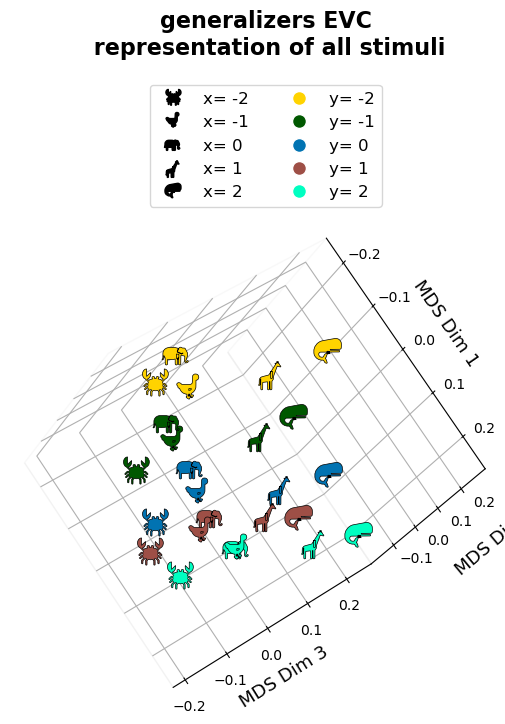

In [924]:
ssname = "allstim"
roi = "V1_bilateral"
cname = "Combined Cohort"
ncompo = 3

plot_title=f"generalizers EVC\n representation of all stimuli"

roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure(figsize=(6,9))
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (stim_x, stim_y), group in roimdsdf.groupby(['stim_x', 'stim_y']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[stim_y], marker=stimxanimalmarkers[stim_x],
            s=500,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y= %d'%(i))
                for i in np.sort(roimdsdf["stim_y"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,x=0.55,y=1.5,fontdict=def_font_subplot_titles) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13},labelpad=1)
ax.set_ylabel('MDS Dim 2',fontdict={"size":13},labelpad=15)
ax.set_zlabel('MDS Dim 3',fontdict={"size":13},labelpad=10)

ax.legend(handles=marker_legend + color_legend, 
          loc='upper center', 
          bbox_to_anchor=(0.55, 1.35),
          ncol=2,
          fontsize=def_font_axis_legend_titles["fontsize"])

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

ax.set_box_aspect([1, 1, 1]) 
ax.view_init(elev=30, azim=82,roll=120)
ax.invert_zaxis()
# Adjust the axis limits to avoid cropping
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
extra_artists = [ax.yaxis.label]
plt.show()

fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight', bbox_extra_artists=extra_artists,dpi=300)

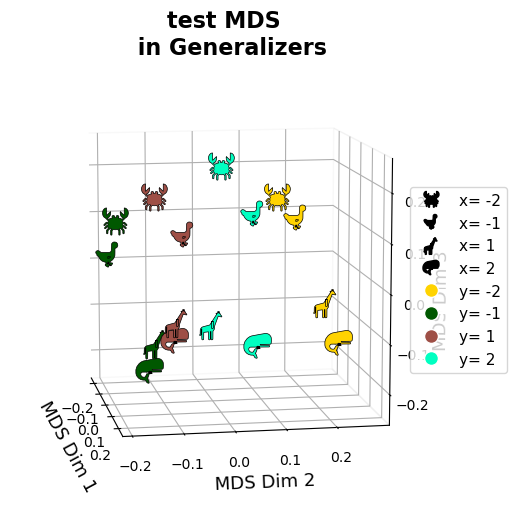

In [ ]:
ssname = "test"
roi = "V1_bilateral"
cname = "Combined Cohort"
ncompo = 3

plot_title=f"test MDS \n in Generalizers"

roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (stim_x, stim_y), group in roimdsdf.groupby(['stim_x', 'stim_y']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[stim_y], marker=stimxanimalmarkers[stim_x],
            s=500,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y= %d'%(i))
                for i in np.sort(roimdsdf["stim_y"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,fontdict=def_font_subplot_titles) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

ax.view_init(elev=10, azim=-10,roll=0)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.9, 0.5),fontsize=11)

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)




# ### plot in 2D
# ncompo = 2
# roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
# roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]

# fig = plt.figure(figsize=(6,6))
# ax = fig.add_subplot(111)

# # Plot each group with different color and marker
# for (stim_x, stim_y), group in roimdsdf.groupby(['stim_x', 'stim_y']):
#     #for p in stimxanimalmarkers[stim_x]:
#     ax.scatter(group['MDS1'], group['MDS2'],
#             color=stimycolorhex[stim_y], marker=stimxanimalmarkers[stim_x],
#             s=500,edgecolor='black',linewidth=0.5,
#             label=f'{stim_x},{stim_y}')

# # Create custom legends
# color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y= %d'%(i))
#                 for i in np.sort(roimdsdf["stim_y"].unique())]
# marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
#                  for i in np.sort(roimdsdf["stim_x"].unique())]

# # Set plot title and labels
# ax.set_title(plot_title,fontdict=def_font_subplot_titles) # - {cname} Generalizers
# ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
# ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
# ax.set_aspect('equal', adjustable='box')
# ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.9, 0.5),fontsize=11)

# # Adjust the axis limits to avoid cropping
# fig.tight_layout(pad=0.4)
# plt.show()
# mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
# checkdir(mds_output_dir)
# fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

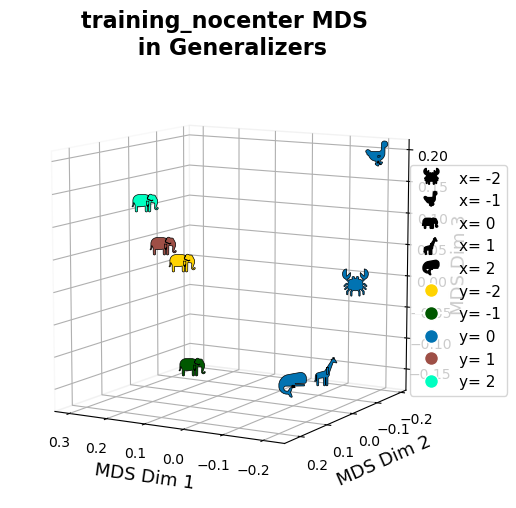

In [1111]:
ssname = "training_nocenter"
roi = "V1_bilateral"
cname = "Combined Cohort"
ncompo = 3

plot_title=f"training_nocenter MDS \n in Generalizers"

roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (stim_x, stim_y), group in roimdsdf.groupby(['stim_x', 'stim_y']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[stim_y], marker=stimxanimalmarkers[stim_x],
            s=500,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y= %d'%(i))
                for i in np.sort(roimdsdf["stim_y"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,fontdict=def_font_subplot_titles) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

ax.view_init(elev=10, azim=120,roll=0)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.9, 0.5),fontsize=11)

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)




In [1114]:
roi_data["V1_bilateral"][0]["stimdf"][["stim_group","stim_x","stim_y","training_axset","training_axlocTL"]]

,stim_group,stim_x,stim_y,training_axset,training_axlocTL
0,0,-1.0,-1.0,NaN,NaN
1,0,-1.0,-0.5,NaN,NaN
2,1,-1.0,0.0,0.0,-1.0
3,0,-1.0,0.5,NaN,NaN
4,0,-1.0,1.0,NaN,NaN
...,...,...,...,...,...
104,1,0.0,0.0,NaN,NaN
105,1,0.0,0.5,1.0,0.5
106,1,0.0,1.0,1.0,1.0
107,1,0.5,0.0,0.0,0.5


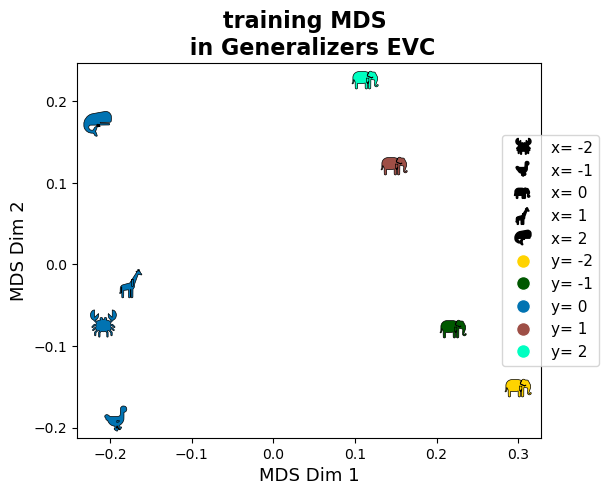

In [1115]:
ssname = "training_nocenter"
roi = "V1_bilateral"
cname = "Combined Cohort"
ncompo = 2

plot_title=f"training MDS \n in Generalizers {roi_shortnames[roi]}"

### plot in 2D
roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111)

# Plot each group with different color and marker
for (stim_x, stim_y), group in roimdsdf.groupby(['stim_x', 'stim_y']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'],
            color=stimycolorhex[stim_y], marker=stimxanimalmarkers[stim_x],
            s=500,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y= %d'%(i))
                for i in np.sort(roimdsdf["stim_y"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,fontdict=def_font_subplot_titles) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_aspect('equal', adjustable='box')
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.9, 0.5),fontsize=11)

# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

## parietal cortex

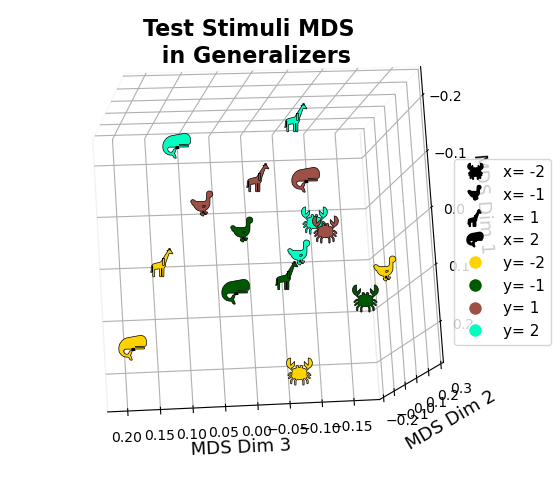

In [669]:
ssname = "test"
roi = "PPC_bilateral"
cname = "Combined Cohort"
ncompo = 3

plot_title=f"Test Stimuli MDS \n in Generalizers"

roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (stim_x, stim_y), group in roimdsdf.groupby(['stim_x', 'stim_y']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[stim_y], marker=stimxanimalmarkers[stim_x],
            s=500,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y= %d'%(i))
                for i in np.sort(roimdsdf["stim_y"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=.95,fontdict=def_font_subplot_titles) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

ax.view_init(elev=10, azim=80,roll=92)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.9, 0.5),fontsize=11)

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

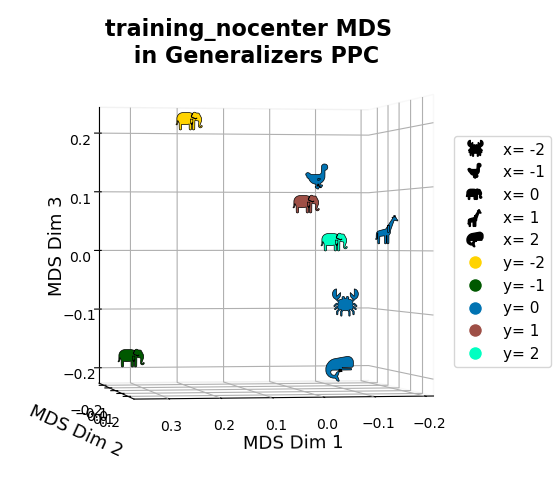

In [1070]:
ssname = "training_nocenter"
roi = "PPC_bilateral"
cname = "Combined Cohort"
ncompo = 3

plot_title=f"training_nocenter MDS \n in Generalizers {roi_shortnames[roi]}"
roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (stim_x, stim_y), group in roimdsdf.groupby(['stim_x', 'stim_y']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[stim_y], marker=stimxanimalmarkers[stim_x],
            s=500,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y= %d'%(i))
                for i in np.sort(roimdsdf["stim_y"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=.95,fontdict=def_font_subplot_titles) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

ax.view_init(elev=0, azim=80,roll=0)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.9, 0.5),fontsize=11)

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

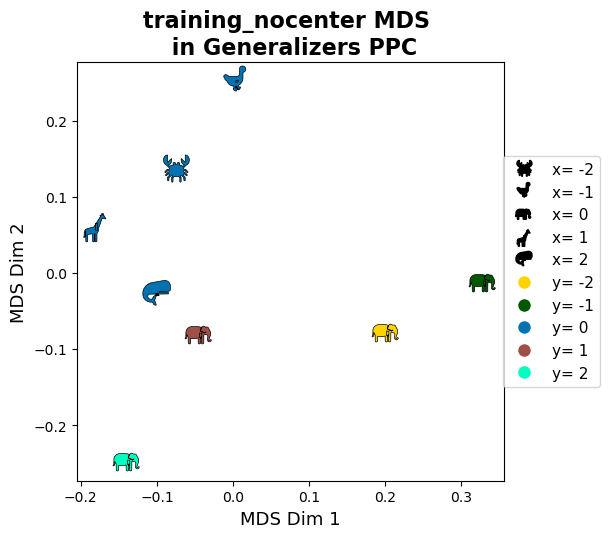

In [1116]:
ssname = "training_nocenter"
roi = "PPC_bilateral"
cname = "Combined Cohort"
ncompo = 2

plot_title=f"training_nocenter MDS \n in Generalizers {roi_shortnames[roi]}"

### plot in 2D
roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111)

# Plot each group with different color and marker
for (stim_x, stim_y), group in roimdsdf.groupby(['stim_x', 'stim_y']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'],
            color=stimycolorhex[stim_y], marker=stimxanimalmarkers[stim_x],
            s=500,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y= %d'%(i))
                for i in np.sort(roimdsdf["stim_y"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,fontdict=def_font_subplot_titles) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_aspect('equal', adjustable='box')
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.98, 0.5),fontsize=11)

# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

## training locations

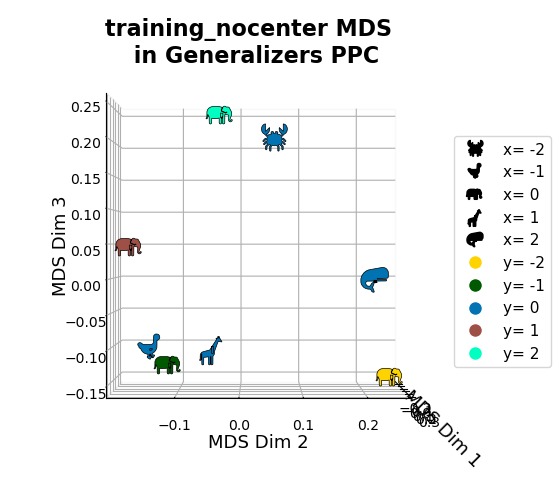

In [1086]:
ssname = "trainloc_nocenter"
roi = "PPC_bilateral"
cname = "Combined Cohort"
ncompo = 3

plot_title=f"training_nocenter MDS \n in Generalizers {roi_shortnames[roi]}"
roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]

roimdsdf# = roimdsdf.iloc[[0,1]].copy()

fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(111, projection='3d')

# Plot each group with different color and marker
for (stim_x, stim_y), group in roimdsdf.groupby(['stim_x', 'stim_y']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'], group['MDS3'],
            color=stimycolorhex[stim_y], marker=stimxanimalmarkers[stim_x],
            s=500,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y= %d'%(i))
                for i in np.sort(roimdsdf["stim_y"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,y=.95,fontdict=def_font_subplot_titles) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_zlabel('MDS Dim 3',fontdict={"size":13})

ax.view_init(elev=0, azim=0,roll=0)
ax.set_box_aspect([1, 1, 1]) 
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.9, 0.5),fontsize=11)

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

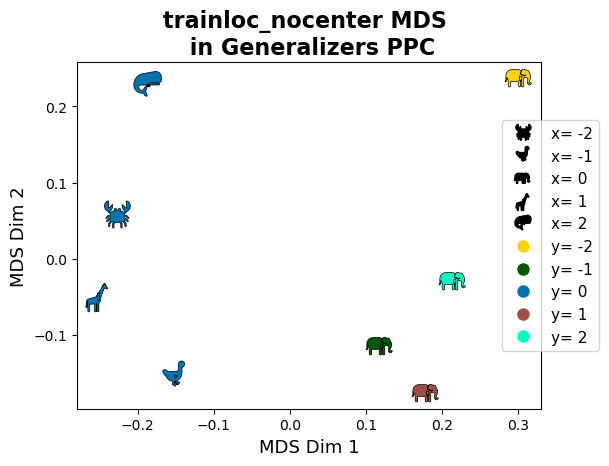

In [1060]:
ssname = "trainloc_nocenter"
roi = "PPC_bilateral"
cname = "Combined Cohort"
ncompo = 2

plot_title=f"trainloc_nocenter MDS \n in Generalizers {roi_shortnames[roi]}"

### plot in 2D
roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111)

# Plot each group with different color and marker
for (stim_x, stim_y), group in roimdsdf.groupby(['stim_x', 'stim_y']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'],
            color=stimycolorhex[stim_y], marker=stimxanimalmarkers[stim_x],
            s=500,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y= %d'%(i))
                for i in np.sort(roimdsdf["stim_y"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,fontdict=def_font_subplot_titles) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_aspect('equal', adjustable='box')
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.9, 0.5),fontsize=11)

# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)

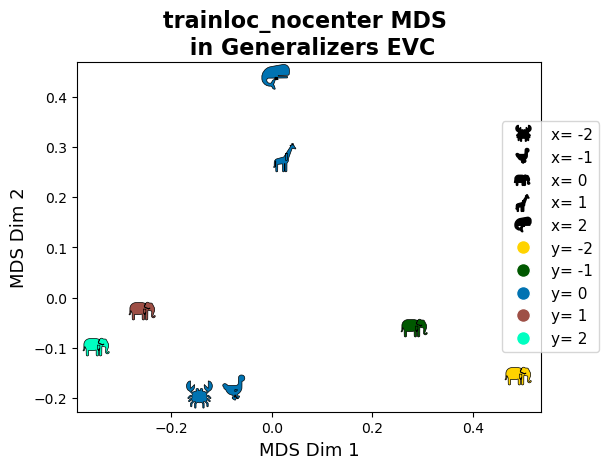

In [1088]:
ssname = "trainloc_nocenter"
roi = "V1_bilateral"
cname = "Combined Cohort"
ncompo = 2

plot_title=f"trainloc_nocenter MDS \n in Generalizers {roi_shortnames[roi]}"

### plot in 2D
roirdm, roimdsdf = rdm_mds_results["aveRDM"][ssname][roi][cname]["G"],rdm_mds_results["MDSres"][f"{ncompo}D"][ssname][roi][cname]["G"]
roimdsdf["stim_name"] = ["%d,%d"%(x,y) for x,y in roimdsdf[["stim_x","stim_y"]].to_numpy()]

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111)

# Plot each group with different color and marker
for (stim_x, stim_y), group in roimdsdf.groupby(['stim_x', 'stim_y']):
    #for p in stimxanimalmarkers[stim_x]:
    ax.scatter(group['MDS1'], group['MDS2'],
            color=stimycolorhex[stim_y], marker=stimxanimalmarkers[stim_x],
            s=500,edgecolor='black',linewidth=0.5,
            label=f'{stim_x},{stim_y}')

# Create custom legends
color_legend = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=stimycolorhex[i], markersize=10, label='y= %d'%(i))
                for i in np.sort(roimdsdf["stim_y"].unique())]
marker_legend = [plt.Line2D([0], [0], marker=stimxanimalmarkers[i], color='k', markerfacecolor='k',linewidth=0, markersize=13, label='x= %d'%(i)) 
                 for i in np.sort(roimdsdf["stim_x"].unique())]

# Set plot title and labels
ax.set_title(plot_title,fontdict=def_font_subplot_titles) # - {cname} Generalizers
ax.set_xlabel('MDS Dim 1',fontdict={"size":13})
ax.set_ylabel('MDS Dim 2',fontdict={"size":13})
ax.set_aspect('equal', adjustable='box')
ax.legend(handles=marker_legend + color_legend, loc='center left', bbox_to_anchor=(0.9, 0.5),fontsize=11)

# Adjust the axis limits to avoid cropping
fig.tight_layout(pad=0.4)
plt.show()
mds_output_dir = os.path.join(ROIRSAdir,"mds_fig")
checkdir(mds_output_dir)
fig.savefig(os.path.join(mds_output_dir,f"{roi}_{ssname}_{cname}_{ncompo}D.png"),bbox_inches='tight',dpi=300)